In [1]:
import os
import nibabel as nib
import numpy as np
import pandas as pd
from tqdm import tqdm
from PIL import Image

# ========= USER CONFIG =========
nifti_root = r"D:\PD_dataset_split"  # Root folder with Train/Test/Val
metadata_csv = r"D:\Merged_PD_Demographics.csv"
output_root = r"D:\PD_coronal_slices"  # Output folder for PNG slices
num_best_slices = 10  # Recommended: 5–10
log_csv_path = os.path.join(output_root, "coronal_slice_log.csv")
# ===============================

# Create output folder
os.makedirs(output_root, exist_ok=True)

# Read metadata and get allowed IDs
metadata_df = pd.read_csv(metadata_csv)
allowed_ids = set(metadata_df["Image Data ID"].astype(str).unique())

def match_file_to_metadata(file_name):
    """
    Match file name to Image Data ID in metadata.
    Returns True if the filename starts with an allowed ID.
    """
    base = os.path.splitext(os.path.splitext(file_name)[0])[0]  # strip .nii/.gz
    return any(base.startswith(id_) for id_ in allowed_ids)

def get_best_coronal_slices(nifti_path, num_slices=7):
    """Load NIfTI, select best coronal slices by variance."""
    img = nib.load(nifti_path)
    data = img.get_fdata()

    # Convert to coronal orientation
    coronal_data = np.transpose(data, (0, 2, 1))

    # Normalize to [0, 255]
    coronal_data = (coronal_data - np.min(coronal_data)) / (np.max(coronal_data) - np.min(coronal_data))
    coronal_data = (coronal_data * 255).astype(np.uint8)

    # Compute variance per slice
    variances = [np.var(coronal_data[:, :, i]) for i in range(coronal_data.shape[2])]
    best_indices = np.argsort(variances)[-num_slices:]

    # Return sorted slices
    return [(i, coronal_data[:, :, i]) for i in sorted(best_indices)]

# List to store log entries
log_entries = []

# Process dataset
for split in ["train", "test", "val"]:
    split_path = os.path.join(nifti_root, split)
    for cls in ["Control", "PD", "Prodromal"]:
        class_path = os.path.join(split_path, cls)
        output_class_path = os.path.join(output_root, split, cls)
        os.makedirs(output_class_path, exist_ok=True)

        nifti_files = [f for f in os.listdir(class_path) if f.endswith((".nii", ".nii.gz"))]

        for nii_file in tqdm(nifti_files, desc=f"Processing {split}/{cls}"):
            if not match_file_to_metadata(nii_file):
                continue  # Skip if not in metadata

            nii_path = os.path.join(class_path, nii_file)
            try:
                best_slices = get_best_coronal_slices(nii_path, num_best_slices)

                base_name = os.path.splitext(os.path.splitext(nii_file)[0])[0]

                for idx, slice_img in best_slices:
                    save_name = f"{base_name}_coronal_{idx}.png"
                    save_path = os.path.join(output_class_path, save_name)

                    # Save PNG
                    Image.fromarray(slice_img).save(save_path)

                    # Log entry
                    log_entries.append({
                        "Image Data ID": base_name,
                        "Class": cls,
                        "Split": split,
                        "Slice Index": idx,
                        "Saved Filename": save_name
                    })

            except Exception as e:
                print(f"Error processing {nii_file}: {e}")

# Save log CSV
log_df = pd.DataFrame(log_entries)
log_df.to_csv(log_csv_path, index=False)

print(f"✅ Coronal slice extraction fr PD Dataset is completed! Log saved to: {log_csv_path}")


Processing val/Prodromal: 100%|██████████| 8/8 [00:01<00:00,  4.41it/s]

✅ Coronal slice extraction fr PD Dataset is completed! Log saved to: D:\PD_coronal_slices\coronal_slice_log.csv


In [2]:
import os

# ======= CHANGE THIS to your slices output folder =======
output_dir = r"D:\PD_coronal_slices"  # where slices were saved
# =========================================================

# Count images and group by class/split
total_slices = 0
slice_files = []

for root, dirs, files in os.walk(output_dir):
    for file in files:
        if file.lower().endswith(('.png', '.jpg')):
            total_slices += 1
            slice_files.append(os.path.join(root, file))

print(f"✅ Total slices extracted: {total_slices}")

# How many unique NIfTI volumes were processed
# (assuming filename format: ImageID_sliceNumber.png)
unique_volumes = set([os.path.basename(f).split('_')[0] for f in slice_files])
print(f"✅ Unique volumes processed: {len(unique_volumes)}")

# Show a few sample slice paths
print("\n📌 Sample extracted slices:")
for f in slice_files[:10]:
    print(f)


✅ Total slices extracted: 4980
✅ Unique volumes processed: 498

📌 Sample extracted slices:
D:\PD_coronal_slices\test\Control\I330119_Control_coronal_113.png
D:\PD_coronal_slices\test\Control\I330119_Control_coronal_114.png
D:\PD_coronal_slices\test\Control\I330119_Control_coronal_115.png
D:\PD_coronal_slices\test\Control\I330119_Control_coronal_116.png
D:\PD_coronal_slices\test\Control\I330119_Control_coronal_117.png
D:\PD_coronal_slices\test\Control\I330119_Control_coronal_118.png
D:\PD_coronal_slices\test\Control\I330119_Control_coronal_119.png
D:\PD_coronal_slices\test\Control\I330119_Control_coronal_120.png
D:\PD_coronal_slices\test\Control\I330119_Control_coronal_140.png
D:\PD_coronal_slices\test\Control\I330119_Control_coronal_141.png


In [3]:
import os
from collections import defaultdict

# ===== Change this to your slices output folder =====
output_dir = r"D:\PD_coronal_slices"
# ====================================================

class_counts = defaultdict(int)

for root, dirs, files in os.walk(output_dir):
    for file in files:
        if file.lower().endswith(('.png', '.jpg')):
            # Class name is the parent folder (AD, CN, MCI)
            class_name = os.path.basename(os.path.dirname(root))
            class_counts[class_name] += 1

print("📊 Slices per class:")
for cls, count in class_counts.items():
    print(f"{cls}: {count}")


📊 Slices per class:
test: 490
train: 3980
val: 510


In [5]:
import os
from collections import defaultdict

# ===== Change this to your slices output folder =====
output_dir = r"D:\PD_coronal_slices"
# ====================================================

# Classes we want to count
valid_classes = {"PD", "Control", "Prodromal"}

# Dictionary: {split: {class: count}}
split_class_counts = defaultdict(lambda: defaultdict(int))

for split in os.listdir(output_dir):  # train, val, test
    split_path = os.path.join(output_dir, split)
    if not os.path.isdir(split_path):
        continue

    for cls in os.listdir(split_path):  # class folders
        if cls not in valid_classes:
            continue
        cls_path = os.path.join(split_path, cls)
        if not os.path.isdir(cls_path):
            continue

        count = sum(1 for f in os.listdir(cls_path) if f.lower().endswith(('.png', '.jpg')))
        split_class_counts[split][cls] = count

# Print results
print("📊 Slices per class per split:\n")
for split in split_class_counts:
    print(f"--- {split.upper()} ---")
    for cls in valid_classes:  # keep consistent order
        print(f"{cls}: {split_class_counts[split].get(cls, 0)}")
    print()


📊 Slices per class per split:

--- TEST ---
PD: 330
Control: 110
Prodromal: 50

--- TRAIN ---
PD: 2580
Control: 940
Prodromal: 460

--- VAL ---
PD: 280
Control: 150
Prodromal: 80



📊 Slices per class per split:

--- TRAIN ---
PD: 2580
Control: 940
Prodromal: 460

--- VAL ---
PD: 280
Control: 150
Prodromal: 80

--- TEST ---
PD: 330
Control: 110
Prodromal: 50

TOTAL PER CLASS:
PD: 3190
Control: 1200
Prodromal: 590


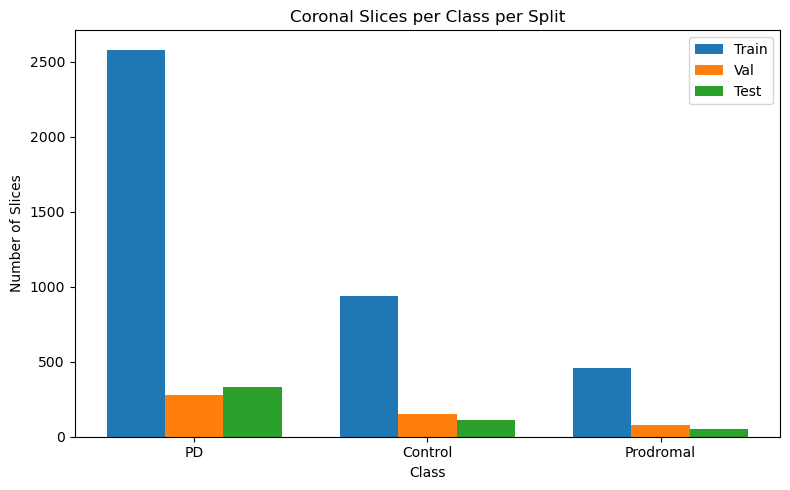


📌 Class Weights for PyTorch:
PD: 0.5204
Control: 1.3833
Prodromal: 2.8136

Class Weights Tensor: tensor([0.5204, 1.3833, 2.8136])


In [6]:
import os
import matplotlib.pyplot as plt
import numpy as np

# ============================
# CONFIGURATION
# ============================
slices_root = r"D:\PD_coronal_slices"  # Path to extracted slices
splits = ["train", "val", "test"]
classes = ["PD", "Control", "Prodromal"]

# ============================
# STEP 1 — Count slices
# ============================
slice_counts = {split: {cls: 0 for cls in classes} for split in splits}

for split in splits:
    for cls in classes:
        folder = os.path.join(slices_root, split, cls)
        count = len([f for f in os.listdir(folder) if f.lower().endswith(".png")])
        slice_counts[split][cls] = count

# ============================
# STEP 2 — Display counts
# ============================
print("📊 Slices per class per split:\n")
total_per_class = {cls: 0 for cls in classes}

for split in splits:
    print(f"--- {split.upper()} ---")
    for cls in classes:
        count = slice_counts[split][cls]
        total_per_class[cls] += count
        print(f"{cls}: {count}")
    print()

print("TOTAL PER CLASS:")
for cls, total in total_per_class.items():
    print(f"{cls}: {total}")

# ============================
# STEP 3 — Plot bar chart
# ============================
x = np.arange(len(classes))
bar_width = 0.25

fig, ax = plt.subplots(figsize=(8, 5))
for i, split in enumerate(splits):
    counts = [slice_counts[split][cls] for cls in classes]
    ax.bar(x + i*bar_width, counts, width=bar_width, label=split.capitalize())

ax.set_xlabel("Class")
ax.set_ylabel("Number of Slices")
ax.set_title("Coronal Slices per Class per Split")
ax.set_xticks(x + bar_width)
ax.set_xticklabels(classes)
ax.legend()
plt.tight_layout()
plt.show()

# ============================
# STEP 4 — Compute class weights (for PyTorch)
# ============================
total_slices = sum(total_per_class.values())
class_weights = {cls: total_slices / (len(classes) * total) for cls, total in total_per_class.items()}

print("\n📌 Class Weights for PyTorch:")
for cls, weight in class_weights.items():
    print(f"{cls}: {weight:.4f}")

# As a tensor for PyTorch:
import torch
class_weights_tensor = torch.tensor([class_weights[cls] for cls in classes], dtype=torch.float)
print("\nClass Weights Tensor:", class_weights_tensor)


In [7]:
import os
import torch

# Path to your coronal slices dataset
dataset_path = r"D:\PD_coronal_slices"

# Classes (ensure they are in the same order you'll use for training)
classes = ['PD', 'Control', 'Prodromal']

slice_counts = {cls: 0 for cls in classes}

# Loop through each split (train, val, test)
for split in ['train', 'val', 'test']:
    for cls in classes:
        cls_dir = os.path.join(dataset_path, split, cls)
        if os.path.exists(cls_dir):
            slice_counts[cls] += len([f for f in os.listdir(cls_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

print("📊 Slice counts per class:", slice_counts)

# Compute class weights
total_slices = sum(slice_counts.values())
num_classes = len(classes)
class_weights = [total_slices / (num_classes * slice_counts[cls]) for cls in classes]

print("\n📌 Class Weights for PyTorch:")
for cls, w in zip(classes, class_weights):
    print(f"{cls}: {w:.4f}")

weights_tensor = torch.tensor(class_weights, dtype=torch.float32)
print("\nClass Weights Tensor:", weights_tensor)


📊 Slice counts per class: {'PD': 3190, 'Control': 1200, 'Prodromal': 590}

📌 Class Weights for PyTorch:
PD: 0.5204
Control: 1.3833
Prodromal: 2.8136

Class Weights Tensor: tensor([0.5204, 1.3833, 2.8136])


In [14]:
import os
from collections import Counter
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# ========= CONFIGURATION =========
data_dir = r"D:\PD_coronal_slices"  # root dataset directory
batch_size = 6
image_size = (224, 224)  # resize target for model
num_workers = 4
# =================================

# Normalization values (ImageNet pretrained models)
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

# ----------- TRANSFORMS -----------
# Train: with augmentation
train_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])

# Val/Test: no augmentation
val_test_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])

# ----------- DATASETS -------------
train_dataset = datasets.ImageFolder(
    os.path.join(data_dir, "train"),
    transform=train_transforms
)
val_dataset = datasets.ImageFolder(
    os.path.join(data_dir, "val"),
    transform=val_test_transforms
)
test_dataset = datasets.ImageFolder(
    os.path.join(data_dir, "test"),
    transform=val_test_transforms
)

# ----------- DATALOADERS ----------
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

# ----------- CLASS NAMES ----------
print("Classes:", train_dataset.classes)
print(f"Train total: {len(train_dataset)}, Val total: {len(val_dataset)}, Test total: {len(test_dataset)}")

# ----------- COUNT PER CLASS -------
def count_per_class(dataset):
    counts = Counter()
    for _, label in dataset:
        counts[dataset.classes[label]] += 1
    return dict(counts)

print("\n📊 Slices per class per split:")
print("--- TRAIN ---", count_per_class(train_dataset))
print("--- VAL ---", count_per_class(val_dataset))
print("--- TEST ---", count_per_class(test_dataset))

# ----------- CLASS WEIGHTS ---------
all_counts = count_per_class(train_dataset)
total_train = sum(all_counts.values())
class_weights = [total_train / all_counts[cls] for cls in train_dataset.classes]
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

print("\n📌 Class Weights for PyTorch:")
for cls, w in zip(train_dataset.classes, class_weights):
    print(f"{cls}: {w:.4f}")
print("Class Weights Tensor:", class_weights_tensor)


Classes: ['Control', 'PD', 'Prodromal']
Train total: 3980, Val total: 510, Test total: 490

📊 Slices per class per split:
--- TRAIN --- {'Control': 940, 'PD': 2580, 'Prodromal': 460}
--- VAL --- {'Control': 150, 'PD': 280, 'Prodromal': 80}
--- TEST --- {'Control': 110, 'PD': 330, 'Prodromal': 50}

📌 Class Weights for PyTorch:
Control: 4.2340
PD: 1.5426
Prodromal: 8.6522
Class Weights Tensor: tensor([4.2340, 1.5426, 8.6522])


In [11]:
import os

data_dir = r"D:\PD_coronal_slices"  # make sure no colon

for split in ["train", "val", "test"]:
    split_path = os.path.join(data_dir, split)
    print(f"\nChecking split: {split}")
    if os.path.exists(split_path):
        print(" Subfolders:", os.listdir(split_path))
    else:
        print(" ❌ Path does not exist:", split_path)



Checking split: train
 Subfolders: ['Control', 'PD', 'Prodromal']

Checking split: val
 Subfolders: ['Control', 'PD', 'Prodromal']

Checking split: test
 Subfolders: ['Control', 'PD', 'Prodromal']


In [15]:
print("Class order in dataset:", train_dataset.classes)


Class order in dataset: ['Control', 'PD', 'Prodromal']


In [ ]:
# now we will keep early convolutional layers frozen (they capture very generic edges/shapes).
# Unfreeze the last ResNet block + the final fc layer for training.
#This gives you the benefit of pretrained knowledge but lets the model specialize
# below is  the complete fine-tuning code for your dataset and class weights:

In [19]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from tqdm import tqdm

# ========= CONFIGURATION =========
data_dir = r"D:\PD_coronal_slices"
batch_size = 6
image_size = (224, 224)
num_workers = 4
num_epochs = 10
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ✅ Correct class weights (matching dataset order: ['Control', 'PD', 'Prodromal'])
class_weights = torch.tensor([4.2340, 1.5426, 8.6522], dtype=torch.float).to(device)
# =================================

# ----------- TRANSFORMS -----------
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

train_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])

val_test_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])

# ----------- DATASETS -------------
train_dataset = datasets.ImageFolder(os.path.join(data_dir, "train"), transform=train_transforms)
val_dataset = datasets.ImageFolder(os.path.join(data_dir, "val"), transform=val_test_transforms)
test_dataset = datasets.ImageFolder(os.path.join(data_dir, "test"), transform=val_test_transforms)

# ----------- DATALOADERS ----------
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

print("Classes:", train_dataset.classes)

# ----------- MODEL (Fine-tuning) ----------
model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)

# Freeze all layers first
for param in model.parameters():
    param.requires_grad = False

# Unfreeze the last ResNet block + fc layer
for param in model.layer4.parameters():
    param.requires_grad = True

num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, len(train_dataset.classes))

# Make fc trainable
for param in model.fc.parameters():
    param.requires_grad = True

model = model.to(device)

# ----------- LOSS & OPTIMIZER ----------
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-4)

# ----------- TRAINING LOOP ----------
def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs}")
        print("-" * 30)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
                loader = train_loader
            else:
                model.eval()
                loader = val_loader

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in tqdm(loader):
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(loader.dataset)
            epoch_acc = running_corrects.double() / len(loader.dataset)

            print(f"{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}")

            # Save best model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), "resnet50_PD_finetuned.pth")
                print("✅ Best model saved.")

    print(f"\nTraining complete. Best val Acc: {best_acc:.4f}")
    return model

# Train the model
model = train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=num_epochs)


Classes: ['Control', 'PD', 'Prodromal']

Epoch 1/10
------------------------------


100%|██████████| 664/664 [00:34<00:00, 18.98it/s]


train Loss: 0.8879 Acc: 0.5106


100%|██████████| 85/85 [00:06<00:00, 13.88it/s]


val Loss: 0.8549 Acc: 0.4922
✅ Best model saved.

Epoch 2/10
------------------------------


100%|██████████| 664/664 [00:37<00:00, 17.91it/s]


train Loss: 0.7457 Acc: 0.5889


100%|██████████| 85/85 [00:06<00:00, 13.58it/s]


val Loss: 0.7508 Acc: 0.6059
✅ Best model saved.

Epoch 3/10
------------------------------


100%|██████████| 664/664 [00:38<00:00, 17.18it/s]


train Loss: 0.6405 Acc: 0.6899


100%|██████████| 85/85 [00:06<00:00, 13.67it/s]


val Loss: 0.8080 Acc: 0.5627

Epoch 4/10
------------------------------


100%|██████████| 664/664 [00:39<00:00, 16.83it/s]


train Loss: 0.5283 Acc: 0.7455


100%|██████████| 85/85 [00:06<00:00, 13.77it/s]


val Loss: 0.7482 Acc: 0.6314
✅ Best model saved.

Epoch 5/10
------------------------------


100%|██████████| 664/664 [00:37<00:00, 17.52it/s]


train Loss: 0.4635 Acc: 0.7950


100%|██████████| 85/85 [00:06<00:00, 13.76it/s]


val Loss: 0.7829 Acc: 0.6843
✅ Best model saved.

Epoch 6/10
------------------------------


100%|██████████| 664/664 [00:37<00:00, 17.77it/s]


train Loss: 0.4106 Acc: 0.8131


100%|██████████| 85/85 [00:05<00:00, 14.31it/s]


val Loss: 0.8876 Acc: 0.6392

Epoch 7/10
------------------------------


100%|██████████| 664/664 [00:34<00:00, 19.33it/s]


train Loss: 0.3402 Acc: 0.8528


100%|██████████| 85/85 [00:05<00:00, 14.69it/s]


val Loss: 0.8082 Acc: 0.6824

Epoch 8/10
------------------------------


100%|██████████| 664/664 [00:34<00:00, 19.36it/s]


train Loss: 0.3078 Acc: 0.8641


100%|██████████| 85/85 [00:05<00:00, 14.23it/s]


val Loss: 1.0593 Acc: 0.5863

Epoch 9/10
------------------------------


100%|██████████| 664/664 [00:34<00:00, 19.39it/s]


train Loss: 0.2654 Acc: 0.8867


100%|██████████| 85/85 [00:05<00:00, 14.42it/s]


val Loss: 1.0131 Acc: 0.6431

Epoch 10/10
------------------------------


100%|██████████| 664/664 [00:33<00:00, 19.87it/s]


train Loss: 0.2502 Acc: 0.8894


100%|██████████| 85/85 [00:05<00:00, 14.44it/s]

val Loss: 0.8808 Acc: 0.6392

Training complete. Best val Acc: 0.6843


In [20]:
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import numpy as np

# ==============================
# 1. Load ResNet50 for feature extraction
# ==============================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

resnet50 = models.resnet50(pretrained=True)
# Remove the classification head (fc layer)
feature_extractor = nn.Sequential(*list(resnet50.children())[:-1])  # outputs 2048-d features
feature_extractor = feature_extractor.to(device)
feature_extractor.eval()

# ==============================
# 2. Transform for ResNet input
# ==============================
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406], 
        std=[0.229, 0.224, 0.225]
    )
])

# ==============================
# 3. Load one test image
# ==============================
#img_path = "D:\dataset4_coronal_slices\test\MCI\I31276_MCI_coronal_62.png"  # change this
img_path = r"D:\PD_coronal_slices\test\Control\I330119_Control_coronal_113.png"

img = Image.open(img_path).convert("RGB")
img_t = transform(img).unsqueeze(0).to(device)  # shape [1, 3, 224, 224]

# ==============================
# 4. Extract features
# ==============================
with torch.no_grad():
    features = feature_extractor(img_t)  # shape [1, 2048, 1, 1]
    features = features.view(features.size(0), -1)  # flatten to [1, 2048]

# ==============================
# 5. Verification prints
# ==============================
print("✅ Feature tensor shape:", features.shape)  # should be [1, 2048]
print("✅ First 10 features:", features[0][:10].cpu().numpy())  # check sample values
print("✅ Min value:", features.min().item())
print("✅ Max value:", features.max().item())
print("✅ Mean value:", features.mean().item())

# ==============================
# 6. Optional: Save to CSV for inspection
# ==============================
import pandas as pd
df = pd.DataFrame(features.cpu().numpy())
df.insert(0, "filename", img_path)
df.to_csv("sample_features.csv", index=False)
print("✅ Saved sample features to sample_features.csv")


d:\Anaconda\envs\torch_gpu\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


✅ Feature tensor shape: torch.Size([1, 2048])
✅ First 10 features: [0.19738574 0.13011992 0.3731901  0.31174666 0.00184949 0.07015819
 0.69300586 0.03516721 0.73314244 0.2348888 ]
✅ Min value: 0.0
✅ Max value: 4.379277229309082
✅ Mean value: 0.3004986643791199
✅ Saved sample features to sample_features.csv


In [ ]:
#Loads a ResNet50 architecture without pretrained ImageNet weights (weights=None).
#Replaces the final classification layer to match 3 classes (AD, CN, MCI).
#Loads your fine-tuned weights from resnet50_finetuned.pth.
#Removes the final classification layer to make a feature extractor. This means the model outputs high-level features (vector representations) instead of class predictions.

In [21]:
import os
import torch
import torch.nn as nn
from torchvision import models, datasets, transforms
import pandas as pd
from tqdm import tqdm

# ==========================
# CONFIG
# ==========================
data_dir = r"D:\PD_coronal_slices"   # Dataset root
output_csv = "resnet50_PD_finetuned_features.csv"
batch_size = 6
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ==========================
# 1. Load Fine-Tuned Model
# ==========================
model = models.resnet50(weights=None)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 3)  # trained with 3 classes

# Load fine-tuned weights (future-safe)
state_dict = torch.load("resnet50_PD_finetuned.pth", map_location=device, weights_only=True)
model.load_state_dict(state_dict)

# Remove classification head to get features
feature_extractor = nn.Sequential(*list(model.children())[:-1])
feature_extractor.to(device)
feature_extractor.eval()

# ==========================
# 2. Define Transforms
# ==========================
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],  # ImageNet normalization
        std=[0.229, 0.224, 0.225]
    )
])

# ==========================
# 3. Load Datasets
# ==========================
datasets_dict = {}
for split in ["train", "val", "test"]:
    datasets_dict[split] = datasets.ImageFolder(os.path.join(data_dir, split), transform=transform)

# ==========================
# 4. Extract Features
# ==========================
all_data = []

with torch.no_grad():
    for split, dataset_split in datasets_dict.items():
        loader = torch.utils.data.DataLoader(dataset_split, batch_size=batch_size, shuffle=False)
        print(f"\nExtracting features for {split} ({len(dataset_split)} images)...")

        for batch_idx, (inputs, labels) in enumerate(tqdm(loader, total=len(loader))):
            inputs = inputs.to(device)
            labels_np = labels.cpu().numpy()

            # Forward pass
            feats = feature_extractor(inputs)
            feats = feats.view(feats.size(0), -1).cpu().numpy()  # flatten

            # Get file paths for current batch
            start_idx = batch_idx * batch_size
            paths = [dataset_split.samples[start_idx + i][0] for i in range(len(labels_np))]
            filenames = [os.path.basename(p) for p in paths]

            # Append to all_data
            for fname, lbl, feat in zip(filenames, labels_np, feats):
                all_data.append([fname, dataset_split.classes[lbl]] + feat.tolist())

# ==========================
# 5. Save to CSV
# ==========================
feature_dim = len(all_data[0]) - 2
columns = ["filename", "class"] + [f"f{i}" for i in range(1, feature_dim + 1)]
df = pd.DataFrame(all_data, columns=columns)
df.to_csv(output_csv, index=False)

print(f"\n✅ Features saved to {output_csv}")



Extracting features for train (3980 images)...


100%|██████████| 664/664 [00:16<00:00, 40.54it/s]



Extracting features for val (510 images)...


100%|██████████| 85/85 [00:02<00:00, 41.09it/s]



Extracting features for test (490 images)...


100%|██████████| 82/82 [00:02<00:00, 37.42it/s]



✅ Features saved to resnet50_PD_finetuned_features.csv


In [ ]:
# explanation of the result above:
#DataLoader splits your dataset into batches of size batch_size (6 in your code).
#Each batch is sent through the model, features are extracted, and stored in all_data.
#The loop continues until all batches have been processed, which means all images in the dataset are included, not just one batch

In [22]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import VarianceThreshold
from sklearn.ensemble import RandomForestClassifier

# ==========================
# CONFIG
# ==========================
input_csv = "resnet50_PD_finetuned_features.csv"
output_csv = "resnet50_PD_selected_features_cumulative.csv"
correlation_threshold = 0.95
cumulative_importance_threshold = 0.95  # keep features covering 95% of total importance

# ==========================
# 1. Load CSV
# ==========================
df = pd.read_csv(input_csv)
filenames = df['filename']
labels = df['class']
features = df.drop(['filename', 'class'], axis=1)

print(f"Original number of features: {features.shape[1]}")

# ==========================
# 2. Remove low-variance features
# ==========================
var_thresh = VarianceThreshold(threshold=1e-5)
features_var = var_thresh.fit_transform(features)
features_var_cols = features.columns[var_thresh.get_support()]
features_var_df = pd.DataFrame(features_var, columns=features_var_cols)
print(f"After variance threshold: {features_var_df.shape[1]} features")

# ==========================
# 3. Remove highly correlated features
# ==========================
corr_matrix = features_var_df.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
to_drop = [col for col in upper.columns if any(upper[col] > correlation_threshold)]
features_uncorr_df = features_var_df.drop(columns=to_drop)
print(f"After correlation pruning: {features_uncorr_df.shape[1]} features")

# ==========================
# 4. Random Forest feature importance
# ==========================
rf = RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1)
rf.fit(features_uncorr_df, labels)
importances = rf.feature_importances_

# Sort features by importance
sorted_indices = np.argsort(importances)[::-1]
sorted_importances = importances[sorted_indices]
sorted_features = features_uncorr_df.columns[sorted_indices]

# Cumulative importance
cumulative_importance = np.cumsum(sorted_importances) / np.sum(sorted_importances)
num_features = np.searchsorted(cumulative_importance, cumulative_importance_threshold) + 1
print(f"Number of features selected to cover {cumulative_importance_threshold*100}% importance: {num_features}")

# Select top features based on cumulative importance
selected_features_df = features_uncorr_df[sorted_features[:num_features]]

# ==========================
# 5. Save selected features
# ==========================
final_df = pd.concat([filenames, labels, selected_features_df], axis=1)
final_df.to_csv(output_csv, index=False)
print(f"✅ Selected features saved to {output_csv}")


Original number of features: 2048
After variance threshold: 2048 features
After correlation pruning: 2040 features
Number of features selected to cover 95.0% importance: 1649
✅ Selected features saved to resnet50_PD_selected_features_cumulative.csv


d:\Anaconda\envs\torch_gpu\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Features shape: (4980, 1649)


d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


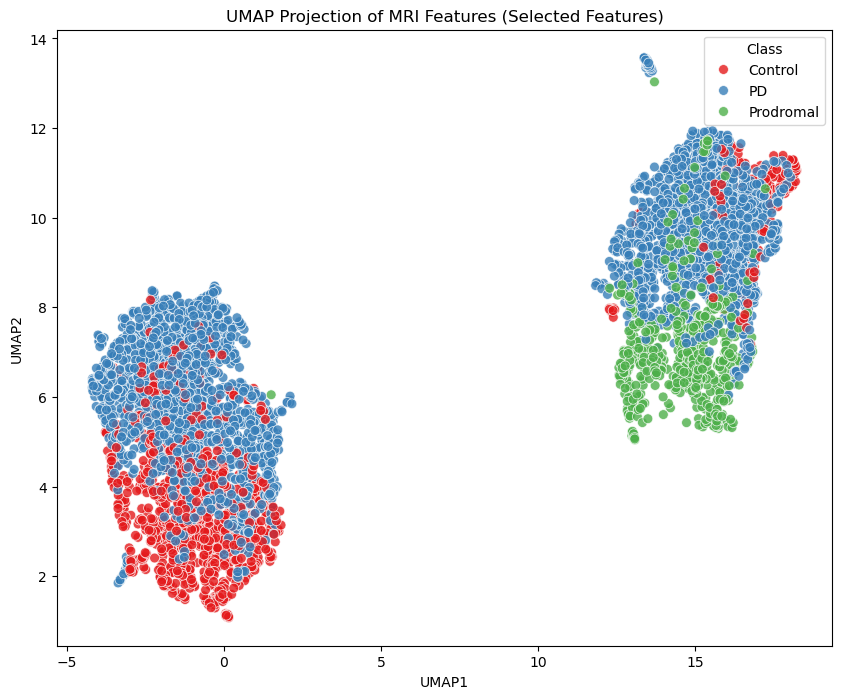

In [23]:
import pandas as pd
import umap.umap_ as umap
import matplotlib.pyplot as plt
import seaborn as sns

# ==========================
# CONFIG
# ==========================
input_csv = "resnet50_PD_selected_features_cumulative.csv"
n_neighbors = 30   # UMAP parameter
min_dist = 0.3     # UMAP parameter
random_state = 42

# ==========================
# 1. Load selected features
# ==========================
df = pd.read_csv(input_csv)
labels = df['class']
features = df.drop(['filename', 'class'], axis=1)

print(f"Features shape: {features.shape}")

# ==========================
# 2. UMAP dimensionality reduction
# ==========================
reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, random_state=random_state)
embedding = reducer.fit_transform(features)

# ==========================
# 3. Visualization
# ==========================
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=embedding[:, 0], y=embedding[:, 1],
    hue=labels,
    palette="Set1",
    s=50,
    alpha=0.8
)
plt.title("UMAP Projection of MRI Features (Selected Features)")
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.legend(title="Class")
plt.show()


Features shape: (4980, 1649), Labels shape: (4980,)


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [19:26:15] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 1 — Train Acc: 1.0000, Test Acc: 0.9237


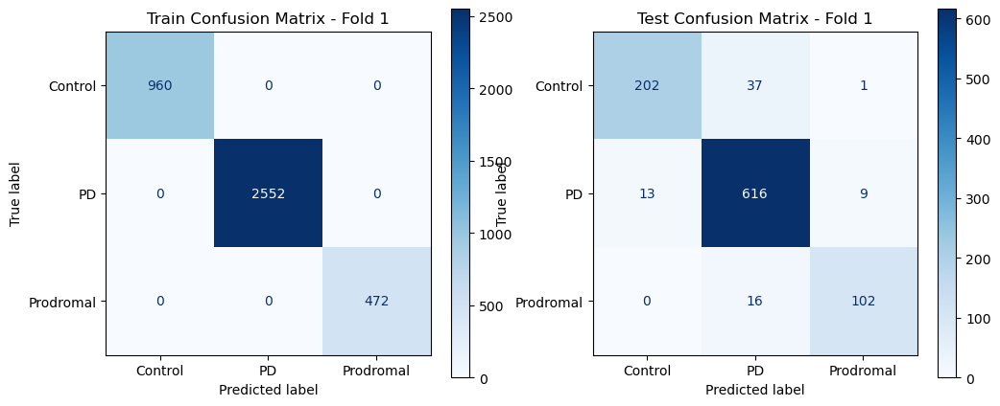

d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [19:27:51] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 2 — Train Acc: 1.0000, Test Acc: 0.9096


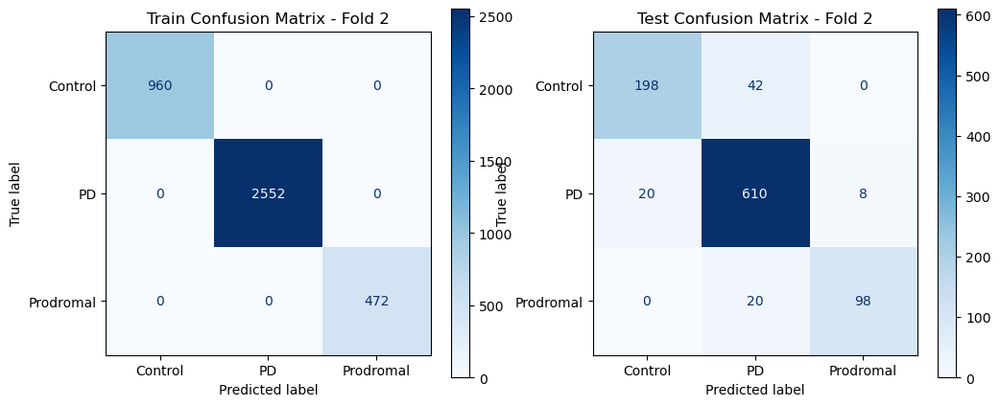

d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [19:29:38] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 3 — Train Acc: 1.0000, Test Acc: 0.9227


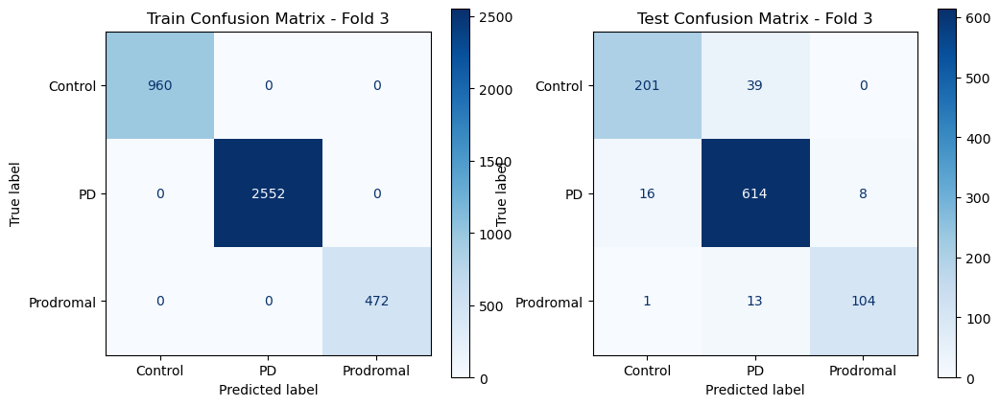

d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [19:31:23] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 4 — Train Acc: 1.0000, Test Acc: 0.9197


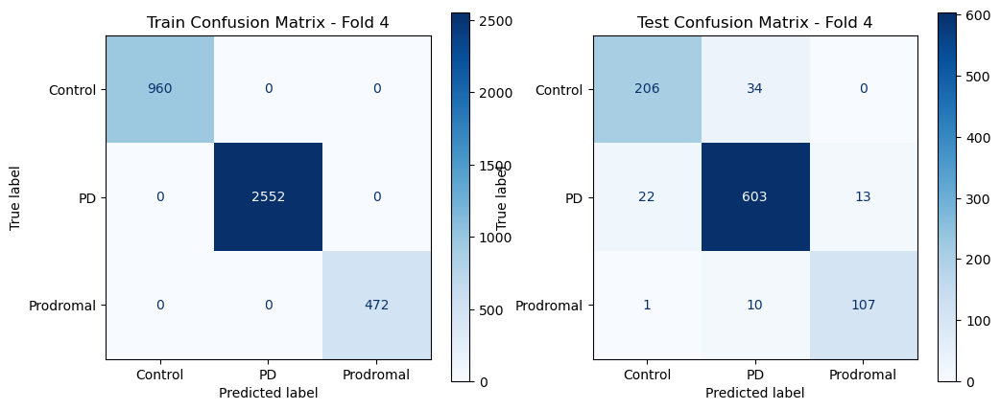

d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [19:32:55] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 5 — Train Acc: 1.0000, Test Acc: 0.9066


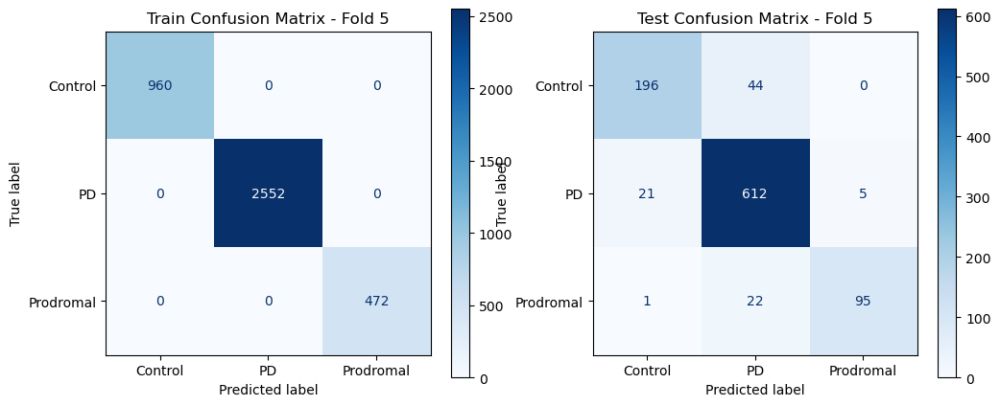

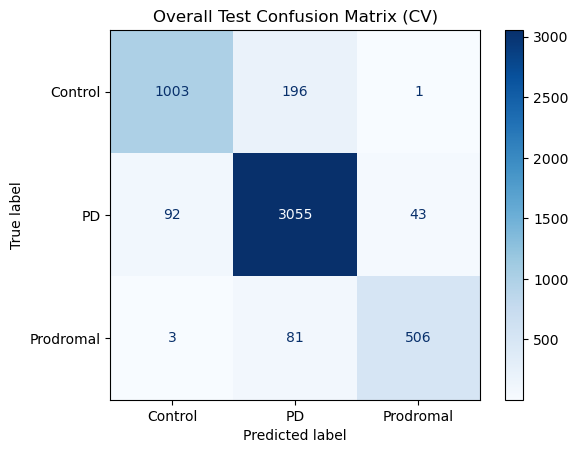

Classification Report (Overall Test):

              precision    recall  f1-score   support

     Control       0.91      0.84      0.87      1200
          PD       0.92      0.96      0.94      3190
   Prodromal       0.92      0.86      0.89       590

    accuracy                           0.92      4980
   macro avg       0.92      0.88      0.90      4980
weighted avg       0.92      0.92      0.92      4980



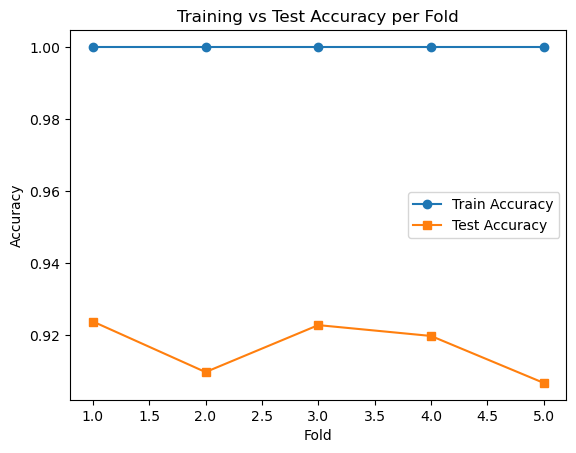


Average Train Accuracy: 1.0
Average Test Accuracy: 0.9164658634538153


In [24]:
import pandas as pd 
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, accuracy_score
import matplotlib.pyplot as plt
from xgboost import XGBClassifier

# ==========================
# CONFIG
# ==========================
input_csv = "resnet50_PD_selected_features_cumulative.csv"
random_state = 42
n_splits = 5           # Cross-validation folds

# ==========================
# 1. Load data
# ==========================
df = pd.read_csv(input_csv)
X = df.drop(['filename', 'class'], axis=1).values
y = df['class'].values

print(f"Features shape: {X.shape}, Labels shape: {y.shape}")

# ==========================
# 2. Encode labels
# ==========================
le = LabelEncoder()
y_encoded = le.fit_transform(y)  # 'AD'->0, 'CN'->1, 'MCI'->2
label_names = le.classes_

# ==========================
# 3. Scale features
# ==========================
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ==========================
# 4. Cross-validation training with XGBoost (tuned)
# ==========================
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
model = XGBClassifier(
    use_label_encoder=False,
    eval_metric='mlogloss',
    random_state=random_state,
    max_depth=4,
    n_estimators=500,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_alpha=0.5,
    reg_lambda=2
)

train_acc_all = []
test_acc_all = []

y_true_all = []
y_pred_all = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X_scaled, y_encoded), 1):
    X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
    y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]
    
    model.fit(X_train, y_train)
    
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Accuracies
    train_acc = accuracy_score(y_train, y_train_pred)
    test_acc = accuracy_score(y_test, y_test_pred)
    train_acc_all.append(train_acc)
    test_acc_all.append(test_acc)
    
    y_true_all.extend(y_test)
    y_pred_all.extend(y_test_pred)
    
    print(f"Fold {fold} — Train Acc: {train_acc:.4f}, Test Acc: {test_acc:.4f}")
    
    # Confusion Matrices per fold
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    ConfusionMatrixDisplay.from_predictions(
        y_train, y_train_pred,
        display_labels=label_names,
        cmap="Blues", ax=axes[0]
    )
    axes[0].set_title(f"Train Confusion Matrix - Fold {fold}")
    
    ConfusionMatrixDisplay.from_predictions(
        y_test, y_test_pred,
        display_labels=label_names,
        cmap="Blues", ax=axes[1]
    )
    axes[1].set_title(f"Test Confusion Matrix - Fold {fold}")
    
    plt.show()

# ==========================
# 5. Final confusion matrix (all test folds combined)
# ==========================
cm = confusion_matrix(y_true_all, y_pred_all)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_names)
disp.plot(cmap=plt.cm.Blues)
plt.title("Overall Test Confusion Matrix (CV)")
plt.show()

# ==========================
# 6. Classification Report
# ==========================
print("Classification Report (Overall Test):\n")
print(classification_report(y_true_all, y_pred_all, target_names=label_names))

# ==========================
# 7. Accuracy per fold
# ==========================
folds = np.arange(1, n_splits+1)
plt.plot(folds, train_acc_all, marker='o', label='Train Accuracy')
plt.plot(folds, test_acc_all, marker='s', label='Test Accuracy')
plt.xlabel("Fold")
plt.ylabel("Accuracy")
plt.title("Training vs Test Accuracy per Fold")
plt.legend()
plt.show()

print("\nAverage Train Accuracy:", np.mean(train_acc_all))
print("Average Test Accuracy:", np.mean(test_acc_all))


d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


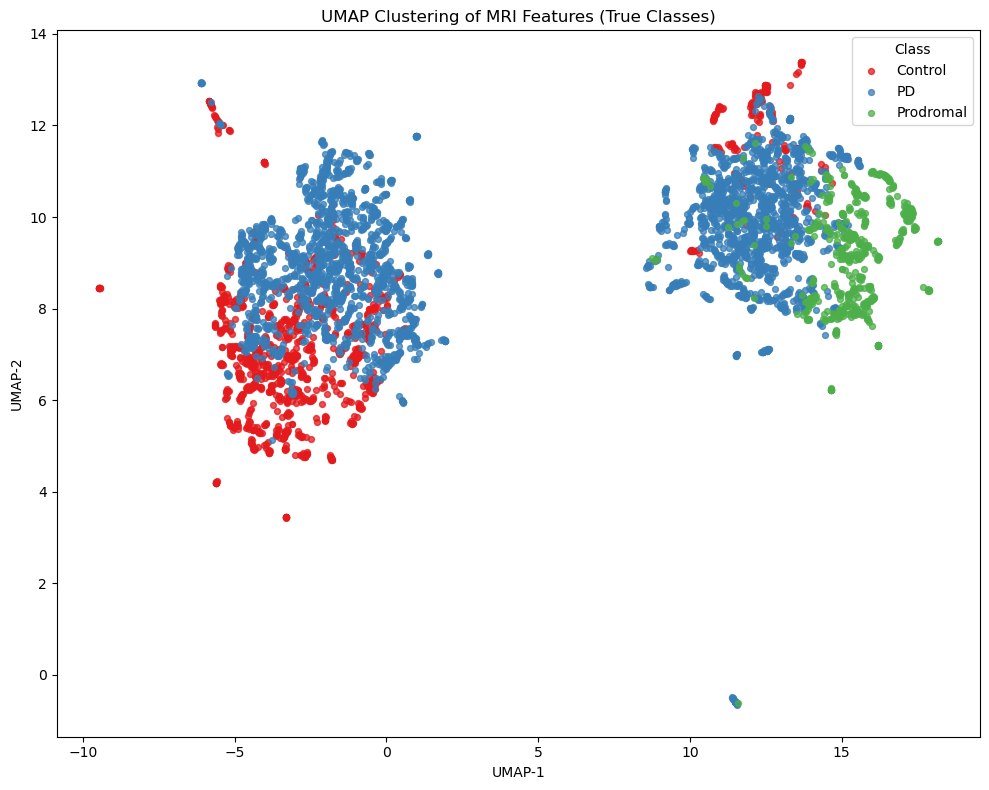

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import umap.umap_ as umap
from sklearn.preprocessing import StandardScaler, LabelEncoder
import seaborn as sns

# ===== Config =====
input_csv = "resnet50_PD_selected_features_cumulative.csv"
n_neighbors = 10
min_dist = 0.1
random_state = 42

# ===== Load =====
df = pd.read_csv(input_csv)
X = df.drop(['filename', 'class'], axis=1).values
y = df['class'].values

# Encode only for coloring/legend control
le = LabelEncoder()
y_enc = le.fit_transform(y)       # maps to 0..K-1 for plotting
classes = le.classes_             # e.g., ['AD','CN','MCI']

# ===== Scale + UMAP =====
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist,
                    n_components=2, random_state=random_state)
X_umap = reducer.fit_transform(X_scaled)

# ===== Plot =====
plt.figure(figsize=(10, 8))
palette = sns.color_palette("Set1", n_colors=len(classes))
for i, cls in enumerate(classes):
    idx = (y_enc == i)
    plt.scatter(X_umap[idx, 0], X_umap[idx, 1], s=18, alpha=0.75,
                label=cls, color=palette[i])

plt.title("UMAP Clustering of MRI Features (True Classes)")
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.legend(title="Class")
plt.tight_layout()
plt.show()


In [1]:
# cleaning the demographic data
# =========================
# Clean Demographics File
# =========================

import pandas as pd

# Step 1: Load the file
file_path = "Merged_PD_Demographics.csv"   # Change if needed
df = pd.read_csv(file_path)

# Step 2: Drop technical scan detail columns
columns_to_drop = ['Visit', 'Modality', 'Description', 'Type', 'Acq Date', 'Format', 'BIRTHDT']
df = df.drop(columns=columns_to_drop)

# Step 3: Encode Sex column (0 = Male, 1 = Female)
df['Sex'] = df['Sex'].map({'M': 0, 'F': 1})

# Step 4: Save cleaned file
output_path = "Cleaned_PD_Demographics.csv"
df.to_csv(output_path, index=False)

# Step 5: Verify result
print("✅ Cleaned file saved as:", output_path)
df.head()


✅ Cleaned file saved as: Cleaned_PD_Demographics.csv


,Image Data ID,Subject,Group,Sex,Age,HANDED,HISPLAT,RAASIAN,RABLACK,RAHAWOPI,RAINDALS,RANOS,RAWHITE,RAUNKNOWN
0,I994202,40533,PD,0,60,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0
1,I370777,4005,PD,0,74,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0
2,I428067,3825,PD,0,59,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0
3,I370993,3814,PD,0,67,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0
4,I428539,4081,PD,0,72,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0


In [2]:
import pandas as pd

# Load both files
features_path = "resnet50_PD_selected_features_cumulative.csv"
demo_path = "Cleaned_PD_Demographics.csv"

features_df = pd.read_csv(features_path)
demo_df = pd.read_csv(demo_path)

# Extract Image Data ID from filename (everything before the first "_")
features_df["Image Data ID"] = features_df["filename"].str.split("_").str[0]

# Merge on Image Data ID
merged_df = features_df.merge(demo_df, on="Image Data ID", how="left")

# Save fused dataset
output_path = "Fused_PD_Features_Demographics.csv"
merged_df.to_csv(output_path, index=False)

print(f"✅ Fused dataset saved as: {output_path}")
print("Final shape:", merged_df.shape)
print("Columns:", merged_df.columns[:15].tolist(), "...")



===== Fold 1 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:09:12] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0
Test Accuracy: 0.9397590361445783

Test Classification Report:
              precision    recall  f1-score   support

     Control       0.92      0.86      0.89       240
          PD       0.94      0.97      0.95       638
   Prodromal       0.96      0.95      0.95       118

    accuracy                           0.94       996
   macro avg       0.94      0.93      0.93       996
weighted avg       0.94      0.94      0.94       996



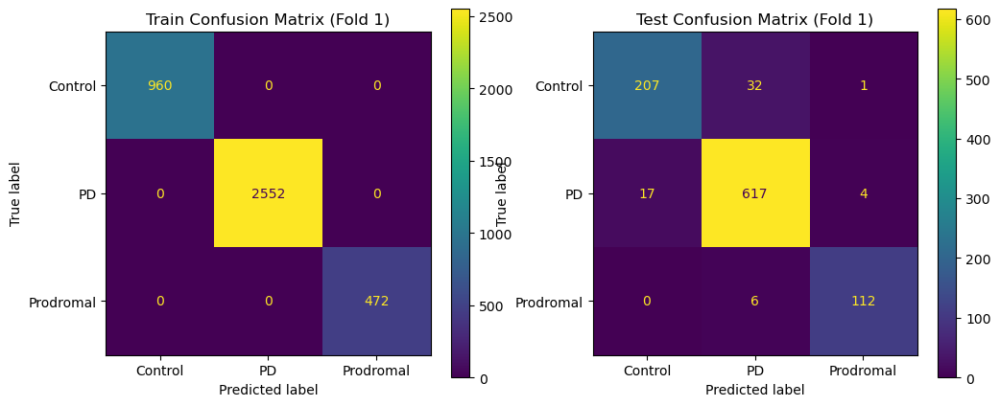


===== Fold 2 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:10:33] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0
Test Accuracy: 0.928714859437751

Test Classification Report:
              precision    recall  f1-score   support

     Control       0.91      0.83      0.87       240
          PD       0.93      0.96      0.95       638
   Prodromal       0.96      0.95      0.95       118

    accuracy                           0.93       996
   macro avg       0.93      0.91      0.92       996
weighted avg       0.93      0.93      0.93       996



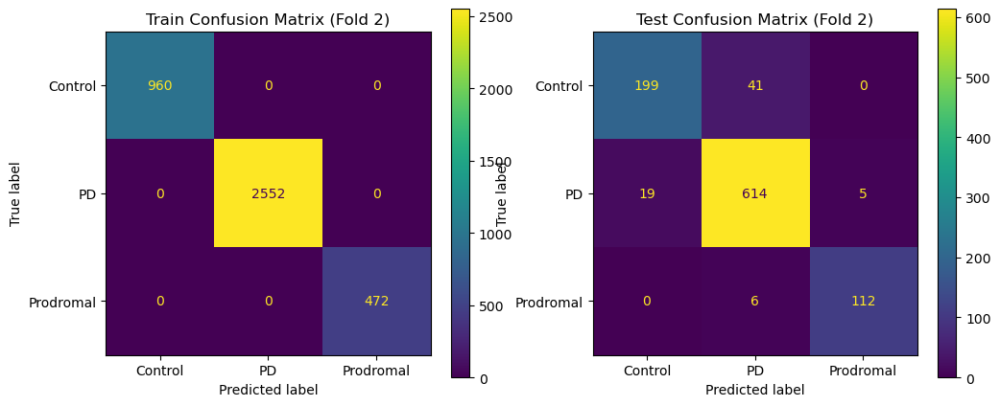


===== Fold 3 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:11:54] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0
Test Accuracy: 0.9397590361445783

Test Classification Report:
              precision    recall  f1-score   support

     Control       0.94      0.82      0.88       240
          PD       0.93      0.98      0.95       638
   Prodromal       0.97      0.98      0.98       118

    accuracy                           0.94       996
   macro avg       0.95      0.93      0.94       996
weighted avg       0.94      0.94      0.94       996



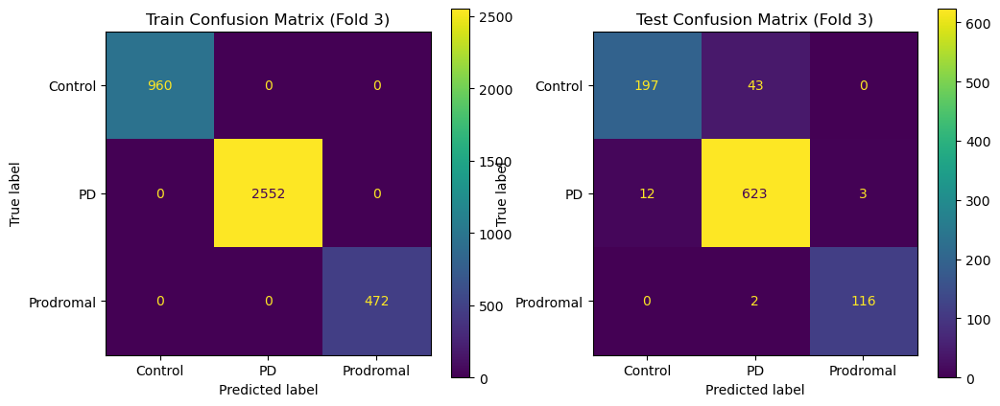


===== Fold 4 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:13:13] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0
Test Accuracy: 0.9377510040160643

Test Classification Report:
              precision    recall  f1-score   support

     Control       0.92      0.85      0.88       240
          PD       0.94      0.97      0.95       638
   Prodromal       0.97      0.97      0.97       118

    accuracy                           0.94       996
   macro avg       0.94      0.93      0.93       996
weighted avg       0.94      0.94      0.94       996



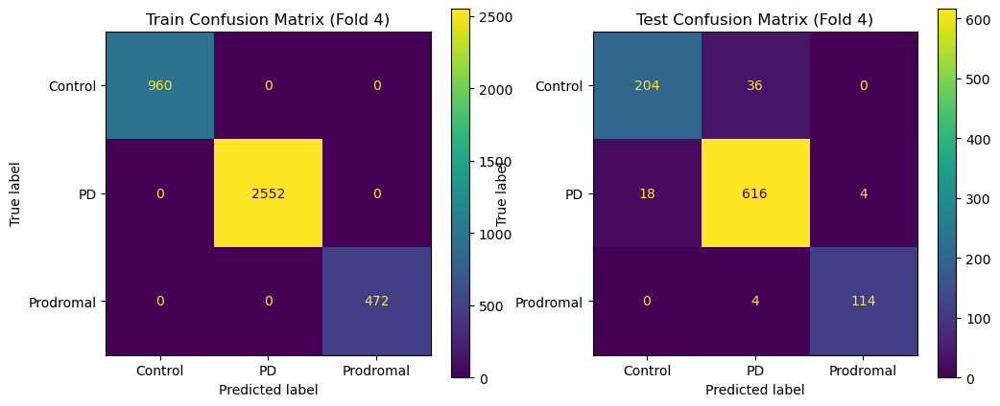


===== Fold 5 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:14:31] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0
Test Accuracy: 0.9327309236947792

Test Classification Report:
              precision    recall  f1-score   support

     Control       0.92      0.82      0.87       240
          PD       0.93      0.97      0.95       638
   Prodromal       0.99      0.94      0.97       118

    accuracy                           0.93       996
   macro avg       0.95      0.91      0.93       996
weighted avg       0.93      0.93      0.93       996



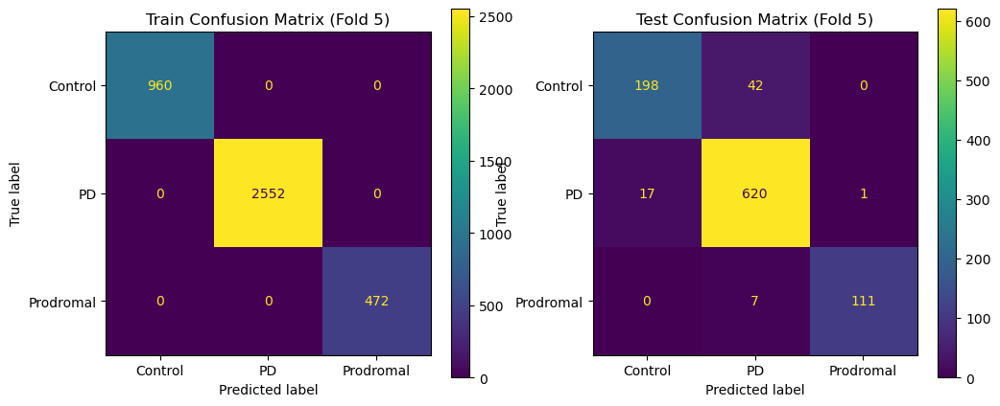


===== Cross-Validation Results =====
Average Train Accuracy: 1.0
Average Test Accuracy: 0.9357429718875503


In [4]:
# for fusion using XGBoost
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import xgboost as xgb

# ========== Step 1: Load Data ==========
csv_path = r"D:\Fused_PD_Features_Demographics.csv"
df = pd.read_csv(csv_path)

# Target label
y = df["Group"]

# Drop unnecessary columns (ID, labels, etc.)
drop_cols = ["filename","Image Data ID", "class", "Group"]
X = df.drop(columns=drop_cols)

# Keep only numeric features
X = X.select_dtypes(include=[np.number])

# Encode labels (PD, Control, Prodromal  → 0,1,2)
le = LabelEncoder()
y = le.fit_transform(y)

# Standardize numeric features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ========== Step 2: Cross Validation Setup ==========
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Store metrics
train_acc, test_acc = [], []
fold = 1

# ========== Step 3: Cross Validation Loop ==========
for train_idx, test_idx in cv.split(X_scaled, y):
    print(f"\n===== Fold {fold} =====")
    
    # Split
    X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    # Tuned XGBoost model
    model = xgb.XGBClassifier(
        n_estimators=300,
        learning_rate=0.05,
        max_depth=6,
        subsample=0.8,
        colsample_bytree=0.8,
        reg_lambda=1,
        random_state=42,
        use_label_encoder=False,
        eval_metric="mlogloss"
    )
    
    # Train
    model.fit(X_train, y_train)
    
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Accuracies
    train_acc.append(np.mean(y_train_pred == y_train))
    test_acc.append(np.mean(y_test_pred == y_test))
    print("Train Accuracy:", train_acc[-1])
    print("Test Accuracy:", test_acc[-1])
    
    # Classification report for test
    print("\nTest Classification Report:")
    print(classification_report(y_test, y_test_pred, target_names=le.classes_))
    
    # Confusion Matrices (Train + Test side by side)
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    ConfusionMatrixDisplay(confusion_matrix(y_train, y_train_pred), display_labels=le.classes_).plot(ax=axes[0], values_format='d')
    axes[0].set_title(f"Train Confusion Matrix (Fold {fold})")
    
    ConfusionMatrixDisplay(confusion_matrix(y_test, y_test_pred), display_labels=le.classes_).plot(ax=axes[1], values_format='d')
    axes[1].set_title(f"Test Confusion Matrix (Fold {fold})")
    
    plt.show()
    
    fold += 1

# ========== Step 4: Overall Performance ==========
print("\n===== Cross-Validation Results =====")
print("Average Train Accuracy:", np.mean(train_acc))
print("Average Test Accuracy:", np.mean(test_acc))


In [10]:
import pandas as pd

# Load your fused CSV
csv_path = r"D:\Fused_PD_Features_Demographics.csv"
df = pd.read_csv(csv_path)

# Columns to drop (adjust if you notice more useless ones)
drop_cols = ["filename",  "class"]

# Remove unwanted columns if they exist
df_cleaned = df.drop(columns=[c for c in drop_cols if c in df.columns])

# Save to new file
output_path = r"D:\Fused_PD_Features_Demographics_CLEANED.csv"
df_cleaned.to_csv(output_path, index=False)

print(f"✅ Cleaned CSV saved at: {output_path}")
print("Shape before cleaning:", df.shape)
print("Shape after cleaning:", df_cleaned.shape)


✅ Cleaned CSV saved at: D:\Fused_PD_Features_Demographics_CLEANED.csv
Shape before cleaning: (4980, 1665)
Shape after cleaning: (4980, 1663)



===== Fold 1 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:45:49] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0
Test Accuracy: 0.9397590361445783

Test Classification Report:
              precision    recall  f1-score   support

     Control       0.92      0.86      0.89       240
          PD       0.94      0.97      0.95       638
   Prodromal       0.96      0.95      0.95       118

    accuracy                           0.94       996
   macro avg       0.94      0.93      0.93       996
weighted avg       0.94      0.94      0.94       996



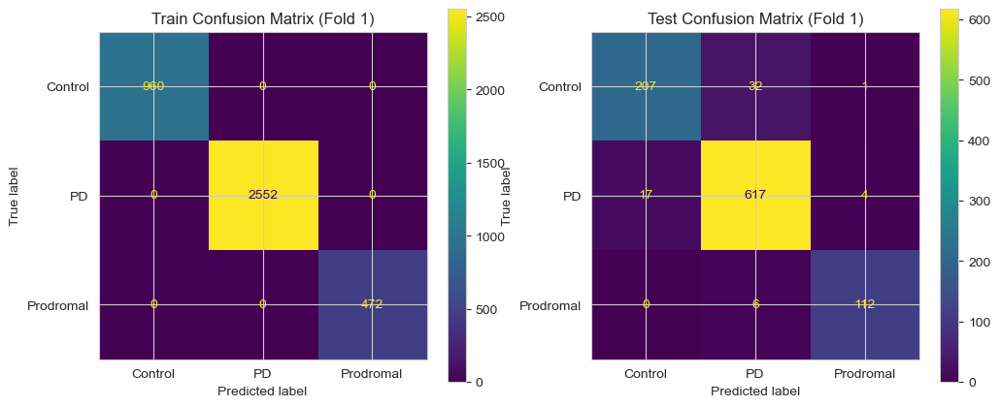


===== Fold 2 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:47:30] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0
Test Accuracy: 0.928714859437751

Test Classification Report:
              precision    recall  f1-score   support

     Control       0.91      0.83      0.87       240
          PD       0.93      0.96      0.95       638
   Prodromal       0.96      0.95      0.95       118

    accuracy                           0.93       996
   macro avg       0.93      0.91      0.92       996
weighted avg       0.93      0.93      0.93       996



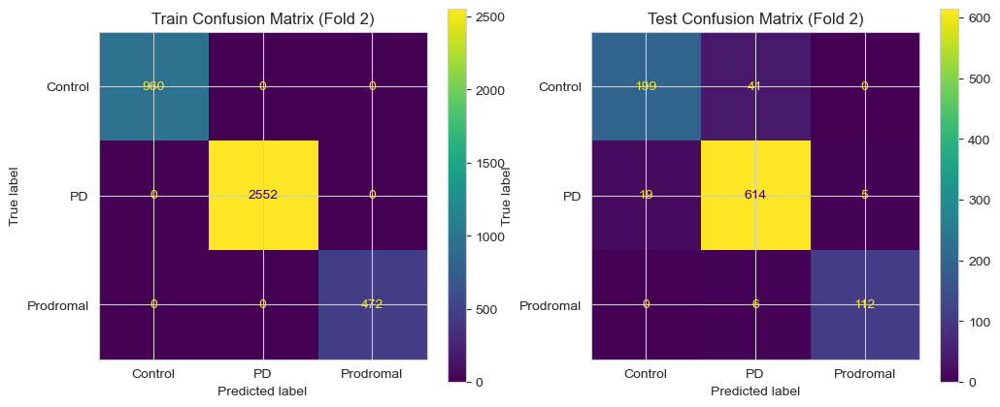


===== Fold 3 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:49:06] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0
Test Accuracy: 0.9397590361445783

Test Classification Report:
              precision    recall  f1-score   support

     Control       0.94      0.82      0.88       240
          PD       0.93      0.98      0.95       638
   Prodromal       0.97      0.98      0.98       118

    accuracy                           0.94       996
   macro avg       0.95      0.93      0.94       996
weighted avg       0.94      0.94      0.94       996



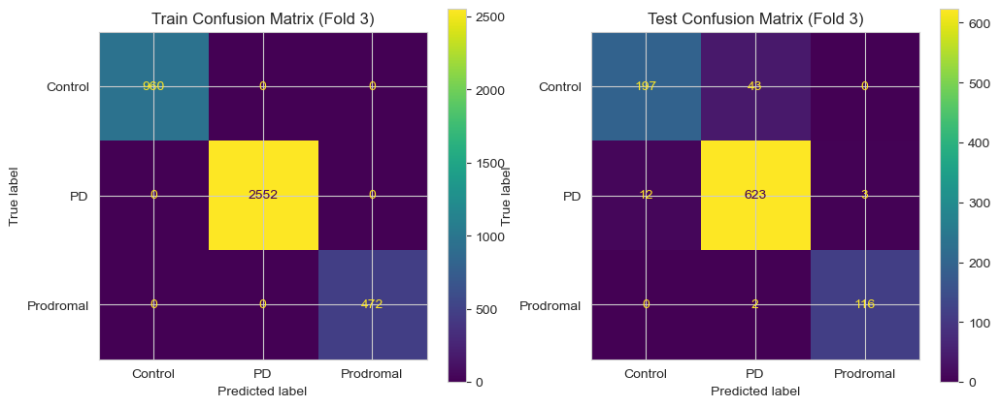


===== Fold 4 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:50:43] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0
Test Accuracy: 0.9377510040160643

Test Classification Report:
              precision    recall  f1-score   support

     Control       0.92      0.85      0.88       240
          PD       0.94      0.97      0.95       638
   Prodromal       0.97      0.97      0.97       118

    accuracy                           0.94       996
   macro avg       0.94      0.93      0.93       996
weighted avg       0.94      0.94      0.94       996



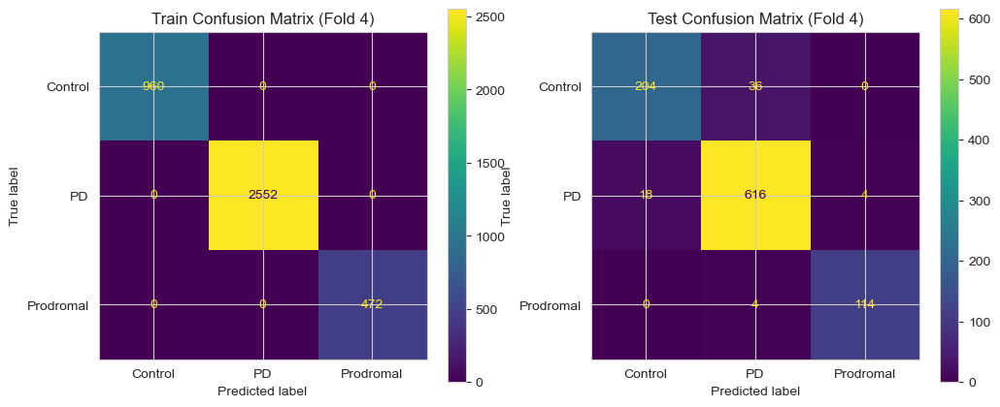


===== Fold 5 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:52:23] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0
Test Accuracy: 0.9327309236947792

Test Classification Report:
              precision    recall  f1-score   support

     Control       0.92      0.82      0.87       240
          PD       0.93      0.97      0.95       638
   Prodromal       0.99      0.94      0.97       118

    accuracy                           0.93       996
   macro avg       0.95      0.91      0.93       996
weighted avg       0.93      0.93      0.93       996



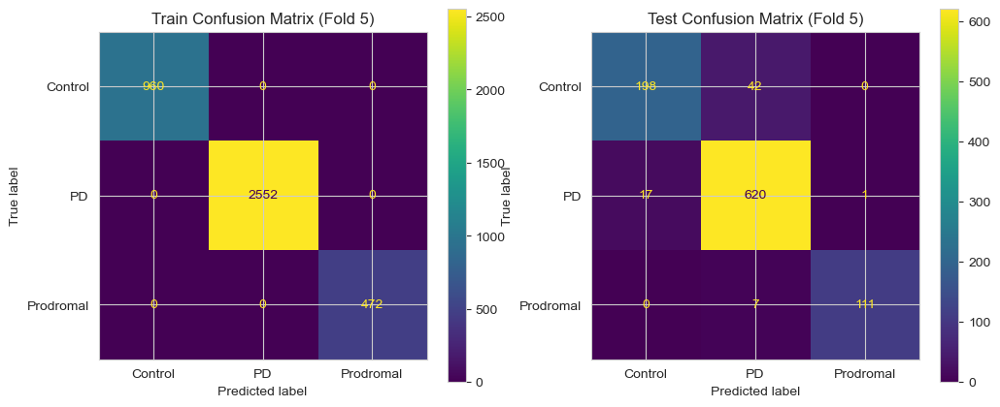


===== Cross-Validation Results =====
Average Train Accuracy: 1.0
Average Test Accuracy: 0.9357429718875503


In [11]:
# for fusion using XGBoost
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import xgboost as xgb

# ========== Step 1: Load Data ==========
csv_path = r"D:\Fused_PD_Features_Demographics_CLEANED.csv"
df = pd.read_csv(csv_path)

# Target label
y = df["Group"]

# Drop unnecessary columns (ID, labels, etc.)
drop_cols = ["Image Data ID",  "Group"]
X = df.drop(columns=drop_cols)

# Keep only numeric features
X = X.select_dtypes(include=[np.number])

# Encode labels (PD, Control, Prodromal  → 0,1,2)
le = LabelEncoder()
y = le.fit_transform(y)

# Standardize numeric features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ========== Step 2: Cross Validation Setup ==========
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Store metrics
train_acc, test_acc = [], []
fold = 1

# ========== Step 3: Cross Validation Loop ==========
for train_idx, test_idx in cv.split(X_scaled, y):
    print(f"\n===== Fold {fold} =====")
    
    # Split
    X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    # Tuned XGBoost model
    model = xgb.XGBClassifier(
        n_estimators=300,
        learning_rate=0.05,
        max_depth=6,
        subsample=0.8,
        colsample_bytree=0.8,
        reg_lambda=1,
        random_state=42,
        use_label_encoder=False,
        eval_metric="mlogloss"
    )
    
    # Train
    model.fit(X_train, y_train)
    
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Accuracies
    train_acc.append(np.mean(y_train_pred == y_train))
    test_acc.append(np.mean(y_test_pred == y_test))
    print("Train Accuracy:", train_acc[-1])
    print("Test Accuracy:", test_acc[-1])
    
    # Classification report for test
    print("\nTest Classification Report:")
    print(classification_report(y_test, y_test_pred, target_names=le.classes_))
    
    # Confusion Matrices (Train + Test side by side)
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    ConfusionMatrixDisplay(confusion_matrix(y_train, y_train_pred), display_labels=le.classes_).plot(ax=axes[0], values_format='d')
    axes[0].set_title(f"Train Confusion Matrix (Fold {fold})")
    
    ConfusionMatrixDisplay(confusion_matrix(y_test, y_test_pred), display_labels=le.classes_).plot(ax=axes[1], values_format='d')
    axes[1].set_title(f"Test Confusion Matrix (Fold {fold})")
    
    plt.show()
    
    fold += 1

# ========== Step 4: Overall Performance ==========
print("\n===== Cross-Validation Results =====")
print("Average Train Accuracy:", np.mean(train_acc))
print("Average Test Accuracy:", np.mean(test_acc))


Explained variance ratio (PC1, PC2): [0.22354277 0.10336976]


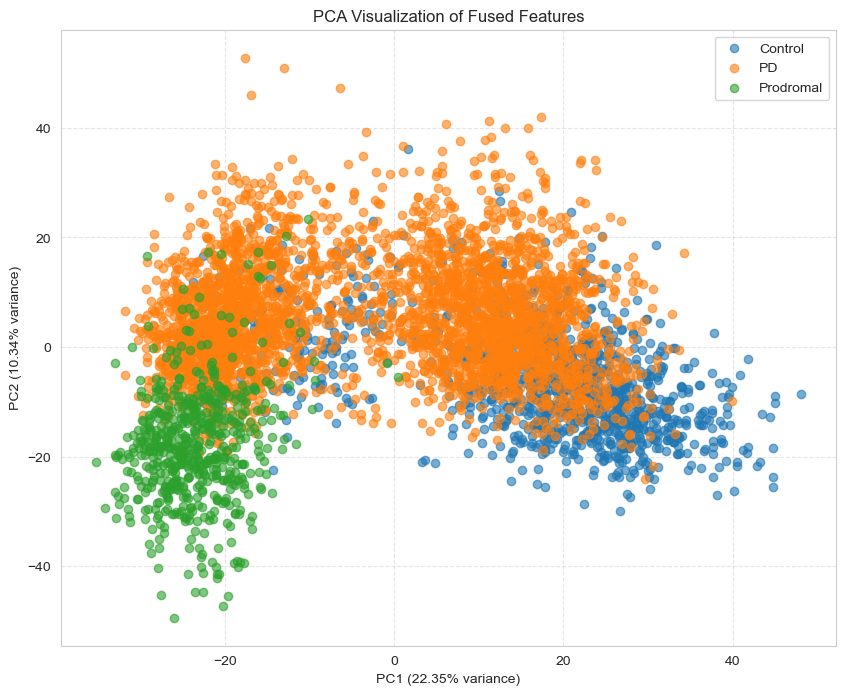

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA

# ========== Step 1: Load Cleaned Data ==========
csv_path = r"D:\Fused_PD_Features_Demographics_CLEANED.csv"
df = pd.read_csv(csv_path)

# Target label
y = df["Group"]

# Drop target + any leftover ID columns
drop_cols = ["Image Data ID", "Group"]
X = df.drop(columns=[c for c in drop_cols if c in df.columns])

# Keep only numeric features
X = X.select_dtypes(include=[np.number])

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# ========== Step 2: Scale Data ==========
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ========== Step 3: PCA ==========
pca = PCA(n_components=2)  # for visualization
X_pca = pca.fit_transform(X_scaled)

print("Explained variance ratio (PC1, PC2):", pca.explained_variance_ratio_)

# ========== Step 4: Visualization ==========
plt.figure(figsize=(10, 8))
for class_idx, class_name in enumerate(le.classes_):
    plt.scatter(
        X_pca[y_encoded == class_idx, 0], 
        X_pca[y_encoded == class_idx, 1], 
        label=class_name, alpha=0.6
    )

plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.2f}% variance)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.2f}% variance)")
plt.title("PCA Visualization of Fused Features")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()


Accuracy: 0.927710843373494

Classification Report:
              precision    recall  f1-score   support

     Control       0.91      0.82      0.86       240
          PD       0.92      0.97      0.94       638
   Prodromal       0.99      0.94      0.97       118

    accuracy                           0.93       996
   macro avg       0.94      0.91      0.92       996
weighted avg       0.93      0.93      0.93       996



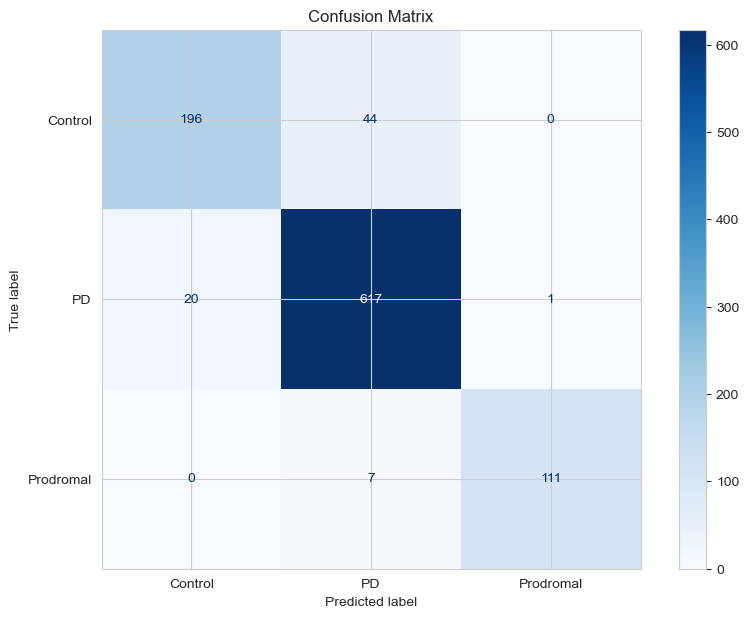


Misclassifications per class pair:
Control → PD: 44
PD → Control: 20
PD → Prodromal: 1
Prodromal → PD: 7

Borderline cases detected: 21 / 996
        True  Predicted  Confidence
0    Control         PD    0.551319
1    Control         PD    0.532088
2         PD         PD    0.552167
3    Control    Control    0.503524
4  Prodromal  Prodromal    0.442717
5         PD    Control    0.548608
6         PD         PD    0.502058
7    Control    Control    0.506255
8    Control         PD    0.499419
9         PD    Control    0.523083


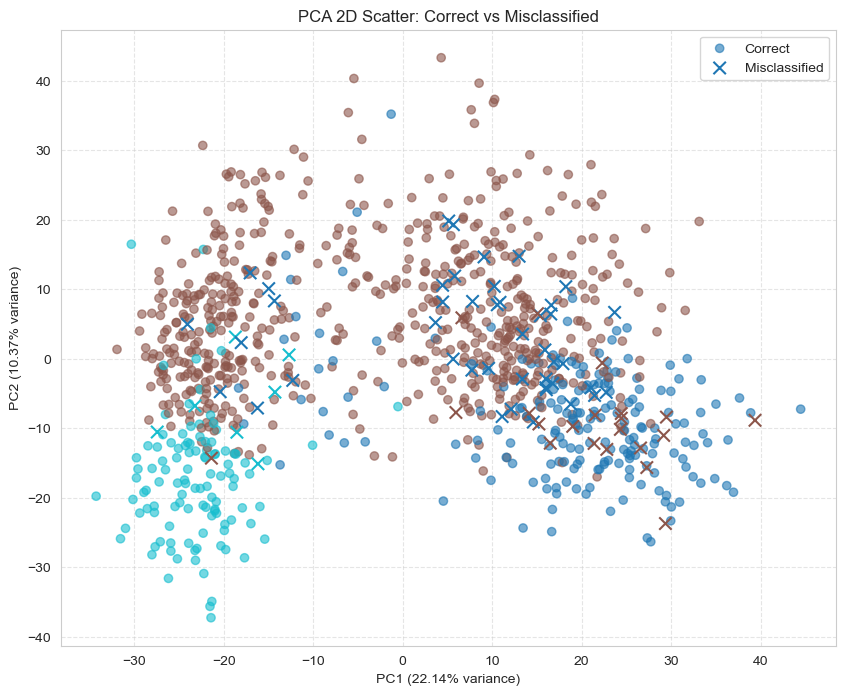

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
import xgboost as xgb

# ========== Step 1: Load Data ==========
csv_path = r"D:\Fused_PD_Features_Demographics_CLEANED.csv"
df = pd.read_csv(csv_path)

# Target label
y = df["Group"]

# Drop target + IDs if any
drop_cols = ["Image Data ID", "Group"]
X = df.drop(columns=[c for c in drop_cols if c in df.columns])

# Keep only numeric features
X = X.select_dtypes(include=[np.number])

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Train/Test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# Standardize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 2: Train XGBoost ==========
model = xgb.XGBClassifier(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_lambda=1,
    random_state=42,
    eval_metric="mlogloss"
)
model.fit(X_train_scaled, y_train)

# Predictions
y_pred = model.predict(X_test_scaled)
y_proba = model.predict_proba(X_test_scaled)

# ========== Step 3: Metrics ==========
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=le.classes_))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(cm, display_labels=le.classes_)
disp.plot(cmap="Blues", values_format="d")
plt.title("Confusion Matrix")
plt.show()

# ========== Step 4: Misclassification Analysis ==========
print("\nMisclassifications per class pair:")
for i, true_class in enumerate(le.classes_):
    for j, pred_class in enumerate(le.classes_):
        if i != j:
            count = np.sum((y_test == i) & (y_pred == j))
            if count > 0:
                print(f"{true_class} → {pred_class}: {count}")

# ========== Step 5: Borderline Cases ==========
# Define borderline as: highest prob < 0.6 (very uncertain)
borderline_idx = np.where(np.max(y_proba, axis=1) < 0.6)[0]
print(f"\nBorderline cases detected: {len(borderline_idx)} / {len(y_test)}")

# Show a few examples
borderline_samples = pd.DataFrame({
    "True": le.inverse_transform(y_test[borderline_idx]),
    "Predicted": le.inverse_transform(y_pred[borderline_idx]),
    "Confidence": np.max(y_proba[borderline_idx], axis=1)
})
print(borderline_samples.head(10))

# ========== Step 6: PCA Visualization ==========
pca = PCA(n_components=2)
X_test_pca = pca.fit_transform(X_test_scaled)

correct_mask = (y_test == y_pred)
misclassified_mask = ~correct_mask

plt.figure(figsize=(10, 8))
plt.scatter(
    X_test_pca[correct_mask, 0],
    X_test_pca[correct_mask, 1],
    c=y_test[correct_mask],
    cmap="tab10",
    marker="o",
    alpha=0.6,
    label="Correct"
)
plt.scatter(
    X_test_pca[misclassified_mask, 0],
    X_test_pca[misclassified_mask, 1],
    c=y_test[misclassified_mask],
    cmap="tab10",
    marker="x",
    s=80,
    label="Misclassified"
)

plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.2f}% variance)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.2f}% variance)")
plt.title("PCA 2D Scatter: Correct vs Misclassified")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()


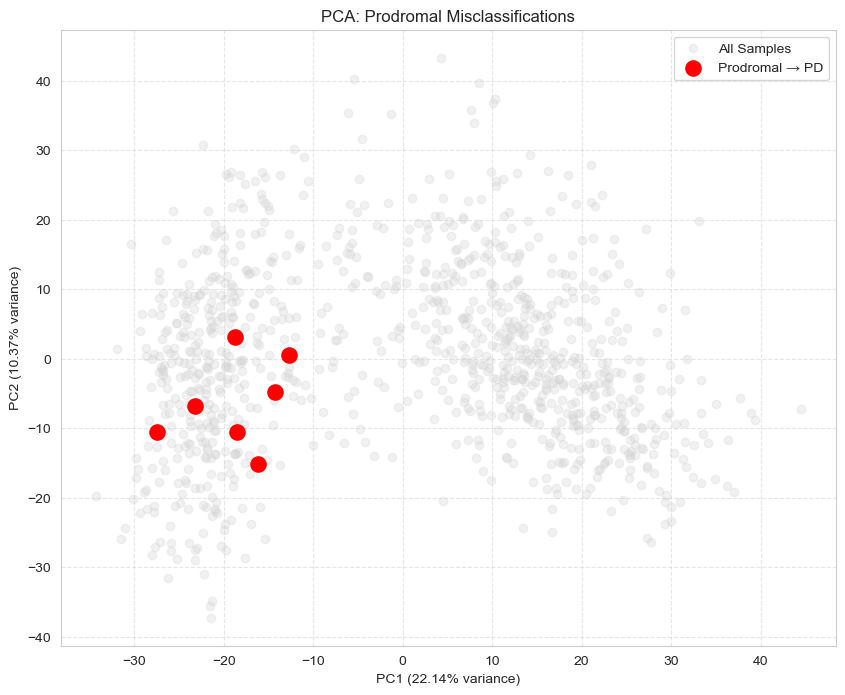

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
import xgboost as xgb

# ========== Step 1: Load Data ==========
csv_path = r"D:\Fused_PD_Features_Demographics_CLEANED.csv"
df = pd.read_csv(csv_path)

# Target label
y = df["Group"]

# Drop target + IDs if any
drop_cols = ["Image Data ID", "Group"]
X = df.drop(columns=[c for c in drop_cols if c in df.columns])

# Keep only numeric features
X = X.select_dtypes(include=[np.number])

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Train/Test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# Standardize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 2: Train XGBoost ==========
model = xgb.XGBClassifier(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_lambda=1,
    random_state=42,
    eval_metric="mlogloss"
)
model.fit(X_train_scaled, y_train)

# Predictions
y_pred = model.predict(X_test_scaled)

# Decode class names
y_true_labels = le.inverse_transform(y_test)
y_pred_labels = le.inverse_transform(y_pred)

# ========== Step 3: PCA ==========
pca = PCA(n_components=2)
X_test_pca = pca.fit_transform(X_test_scaled)

# ========== Step 4: Find Misclassified Prodromal Cases ==========
# Prodromal → PD
prod_to_pd_idx = np.where((y_true_labels == "Prodromal") & (y_pred_labels == "PD"))[0]

# Prodromal → Control
prod_to_control_idx = np.where((y_true_labels == "Prodromal") & (y_pred_labels == "Control"))[0]

# ========== Step 5: Visualization ==========
plt.figure(figsize=(10, 8))

# Background: all test samples (light gray)
plt.scatter(
    X_test_pca[:, 0], X_test_pca[:, 1],
    c="lightgray", alpha=0.3, label="All Samples"
)

# Highlight Prodromal → PD (bright red)
if len(prod_to_pd_idx) > 0:
    plt.scatter(
        X_test_pca[prod_to_pd_idx, 0],
        X_test_pca[prod_to_pd_idx, 1],
        marker="o", s=120, c="red", label="Prodromal → PD"
    )

# Highlight Prodromal → Control (bright blue)
if len(prod_to_control_idx) > 0:
    plt.scatter(
        X_test_pca[prod_to_control_idx, 0],
        X_test_pca[prod_to_control_idx, 1],
        marker="s", s=120, c="blue", label="Prodromal → Control"
    )

plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.2f}% variance)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.2f}% variance)")
plt.title("PCA: Prodromal Misclassifications")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()



===== Fold 1 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [17:54:43] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0
Test Accuracy: 0.9397590361445783

Test Classification Report:
              precision    recall  f1-score   support

     Control       0.92      0.86      0.89       240
          PD       0.94      0.97      0.95       638
   Prodromal       0.96      0.95      0.95       118

    accuracy                           0.94       996
   macro avg       0.94      0.93      0.93       996
weighted avg       0.94      0.94      0.94       996



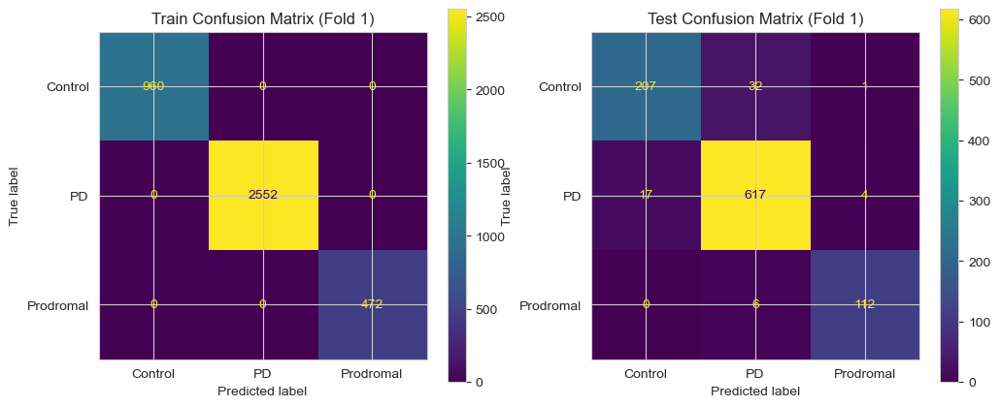

Prodromal → PD misclassified: 6
Prodromal → Control misclassified: 0


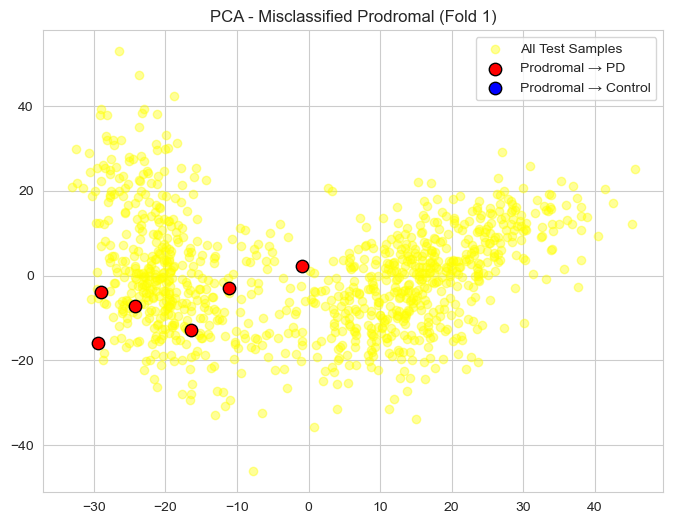

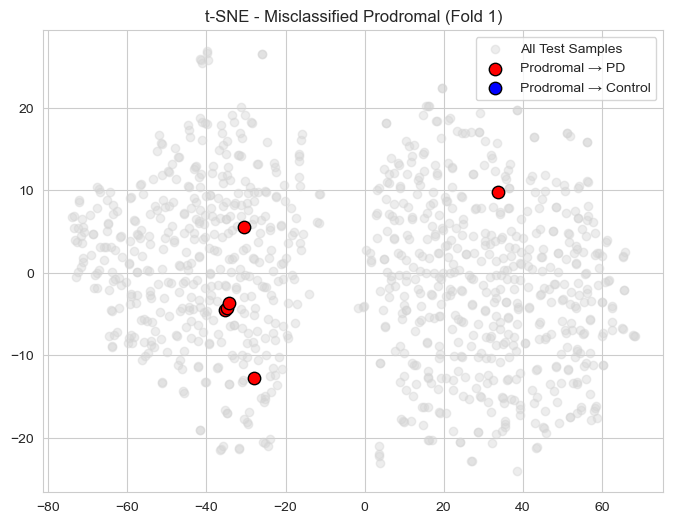


===== Fold 2 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [17:56:23] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0
Test Accuracy: 0.928714859437751

Test Classification Report:
              precision    recall  f1-score   support

     Control       0.91      0.83      0.87       240
          PD       0.93      0.96      0.95       638
   Prodromal       0.96      0.95      0.95       118

    accuracy                           0.93       996
   macro avg       0.93      0.91      0.92       996
weighted avg       0.93      0.93      0.93       996



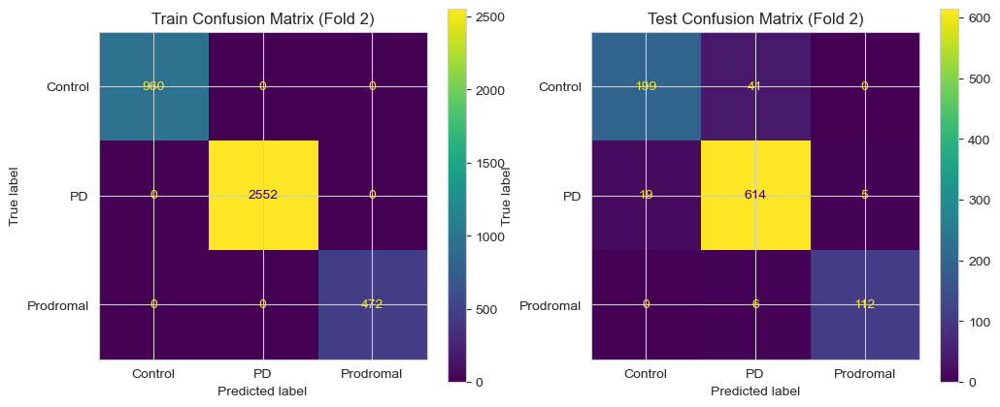

Prodromal → PD misclassified: 6
Prodromal → Control misclassified: 0


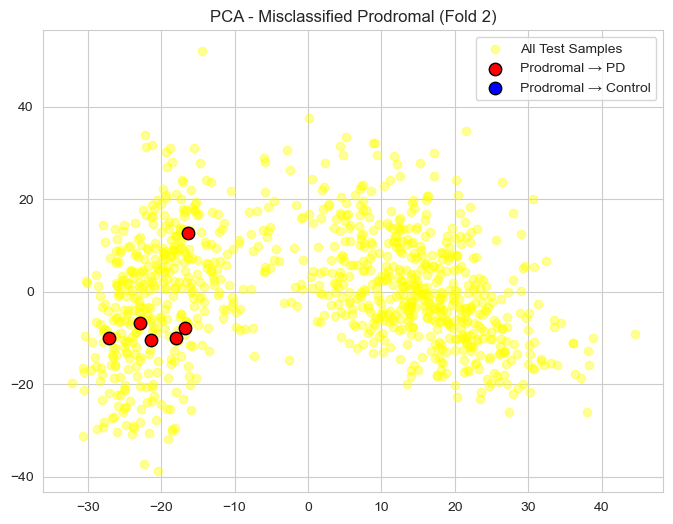

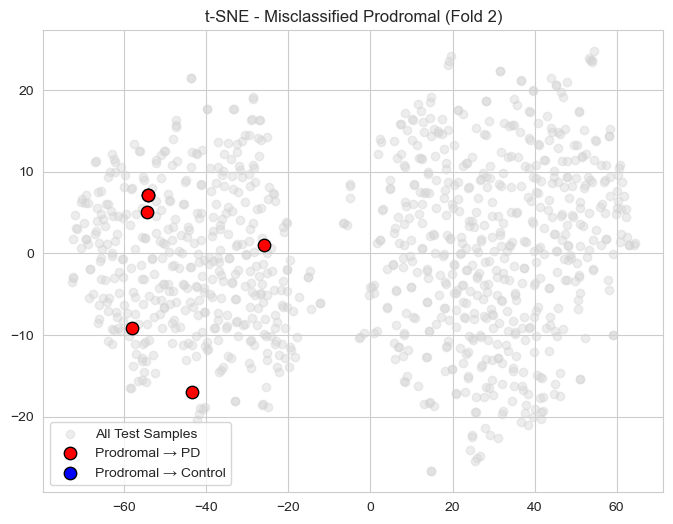


===== Fold 3 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [17:57:51] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0
Test Accuracy: 0.9397590361445783

Test Classification Report:
              precision    recall  f1-score   support

     Control       0.94      0.82      0.88       240
          PD       0.93      0.98      0.95       638
   Prodromal       0.97      0.98      0.98       118

    accuracy                           0.94       996
   macro avg       0.95      0.93      0.94       996
weighted avg       0.94      0.94      0.94       996



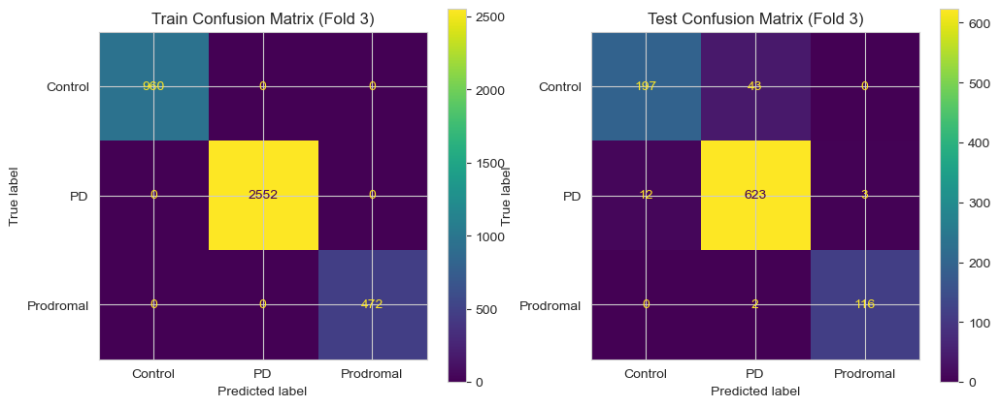

Prodromal → PD misclassified: 2
Prodromal → Control misclassified: 0


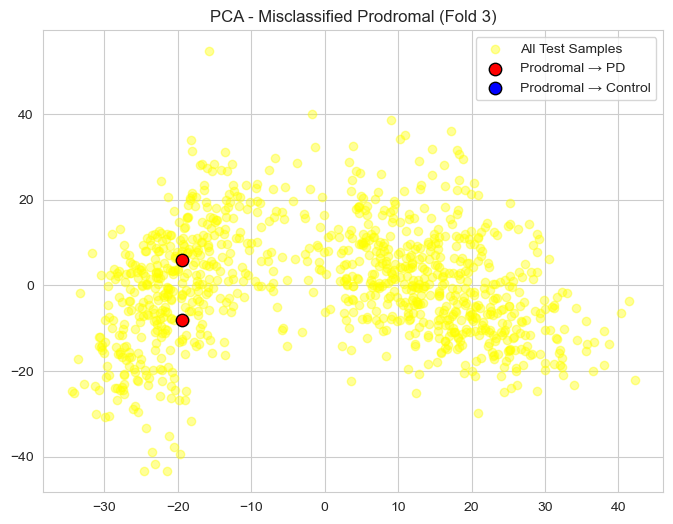

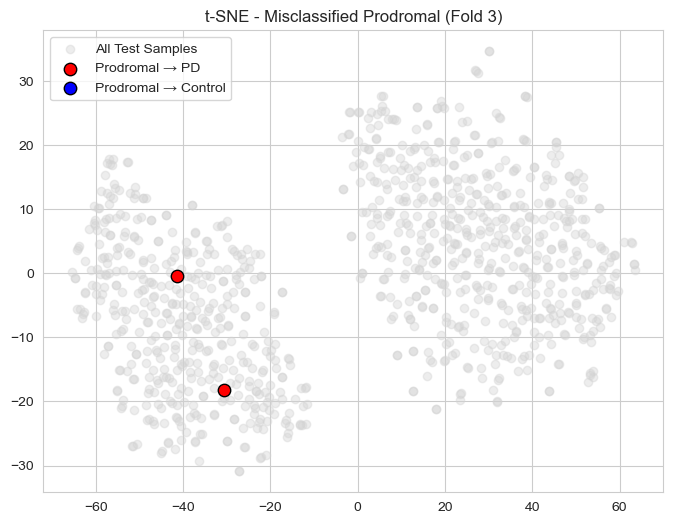


===== Fold 4 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [17:59:07] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0
Test Accuracy: 0.9377510040160643

Test Classification Report:
              precision    recall  f1-score   support

     Control       0.92      0.85      0.88       240
          PD       0.94      0.97      0.95       638
   Prodromal       0.97      0.97      0.97       118

    accuracy                           0.94       996
   macro avg       0.94      0.93      0.93       996
weighted avg       0.94      0.94      0.94       996



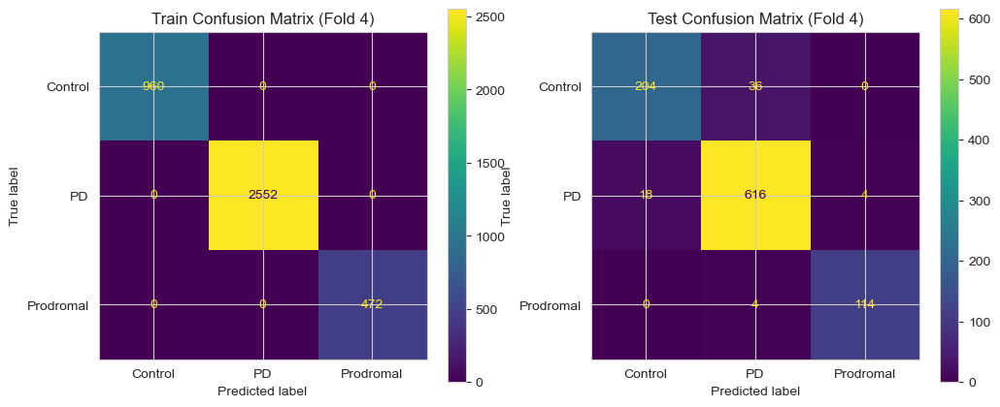

Prodromal → PD misclassified: 4
Prodromal → Control misclassified: 0


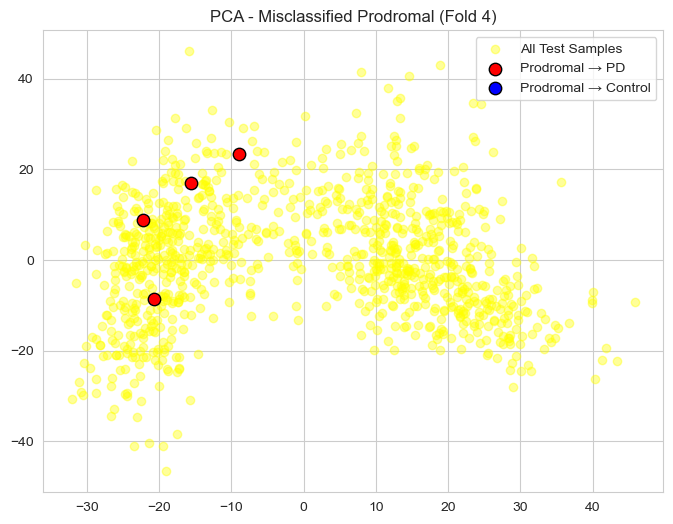

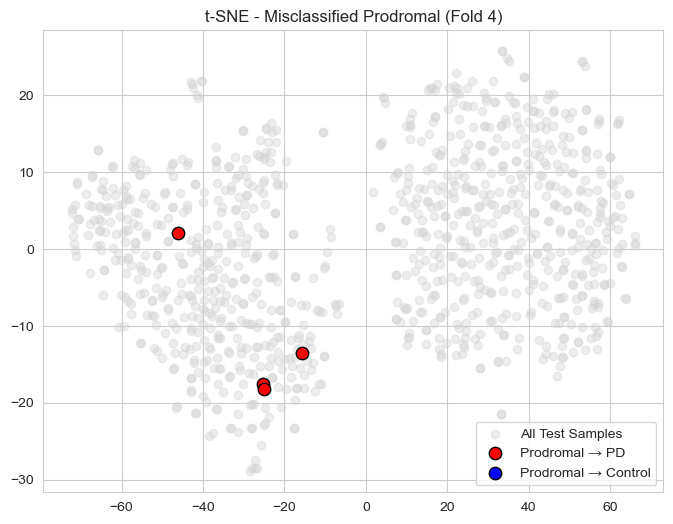


===== Fold 5 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [18:00:22] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0
Test Accuracy: 0.9327309236947792

Test Classification Report:
              precision    recall  f1-score   support

     Control       0.92      0.82      0.87       240
          PD       0.93      0.97      0.95       638
   Prodromal       0.99      0.94      0.97       118

    accuracy                           0.93       996
   macro avg       0.95      0.91      0.93       996
weighted avg       0.93      0.93      0.93       996



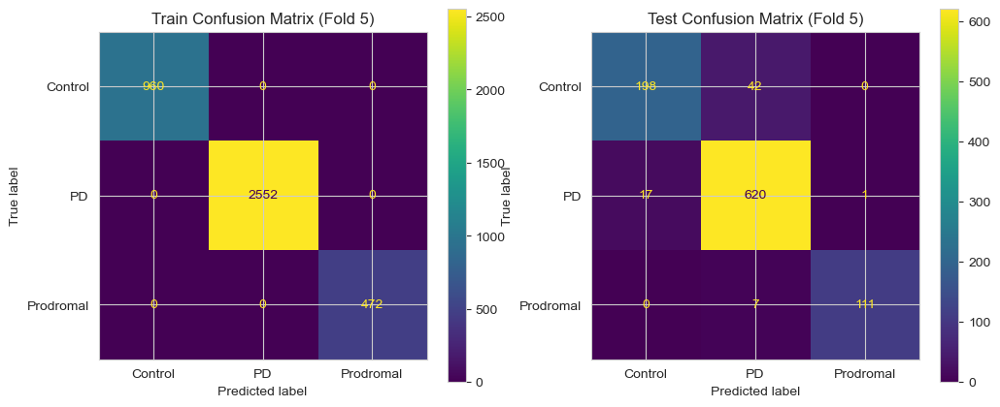

Prodromal → PD misclassified: 7
Prodromal → Control misclassified: 0


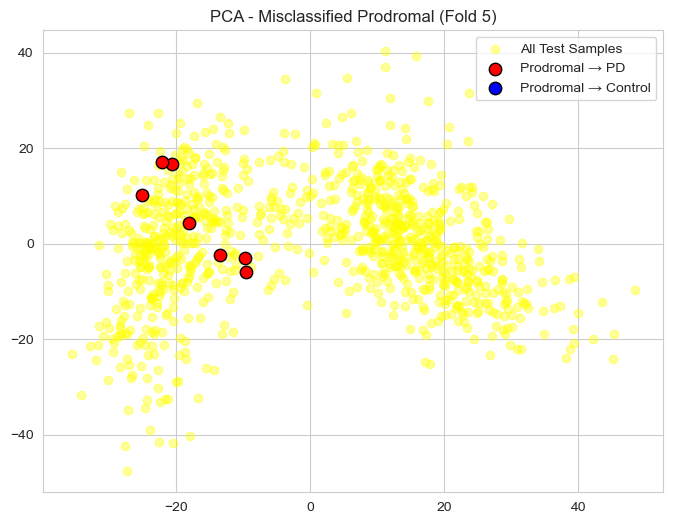

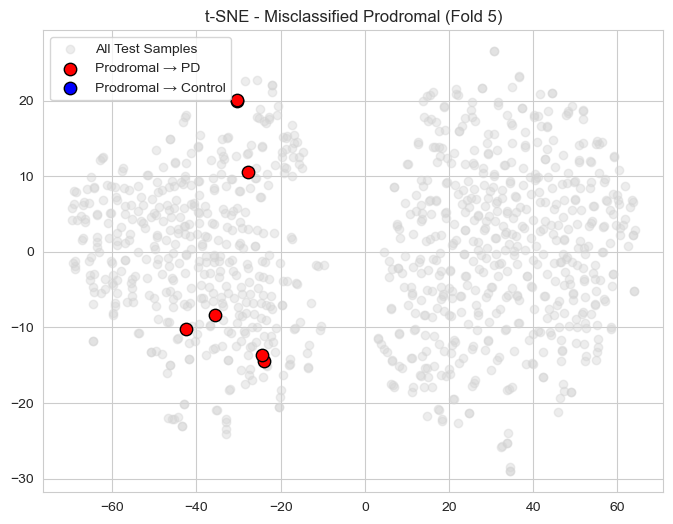


===== Cross-Validation Results =====
Average Train Accuracy: 1.0
Average Test Accuracy: 0.9357429718875503


In [20]:
# for fusion using XGBoost
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import xgboost as xgb

# ========== Step 1: Load Data ==========
csv_path = r"D:\Fused_PD_Features_Demographics_CLEANED.csv"
df = pd.read_csv(csv_path)

# Target label
y = df["Group"]

# Drop unnecessary columns (ID, labels, etc.)
drop_cols = ["Image Data ID", "Group"]
X = df.drop(columns=drop_cols)

# Keep only numeric features
X = X.select_dtypes(include=[np.number])

# Encode labels (PD, Control, Prodromal → 0,1,2)
le = LabelEncoder()
y = le.fit_transform(y)

# Standardize numeric features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ========== Step 2: Cross Validation Setup ==========
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Store metrics
train_acc, test_acc = [], []
fold = 1

# ========== Step 3: Cross Validation Loop ==========
for train_idx, test_idx in cv.split(X_scaled, y):
    print(f"\n===== Fold {fold} =====")
    
    # Split
    X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    # Tuned XGBoost model
    model = xgb.XGBClassifier(
        n_estimators=300,
        learning_rate=0.05,
        max_depth=6,
        subsample=0.8,
        colsample_bytree=0.8,
        reg_lambda=1,
        random_state=42,
        use_label_encoder=False,
        eval_metric="mlogloss"
    )
    
    # Train
    model.fit(X_train, y_train)
    
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Accuracies
    train_acc.append(np.mean(y_train_pred == y_train))
    test_acc.append(np.mean(y_test_pred == y_test))
    print("Train Accuracy:", train_acc[-1])
    print("Test Accuracy:", test_acc[-1])
    
    # Classification report for test
    print("\nTest Classification Report:")
    print(classification_report(y_test, y_test_pred, target_names=le.classes_))
    
    # Confusion Matrices (Train + Test side by side)
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    ConfusionMatrixDisplay(confusion_matrix(y_train, y_train_pred), display_labels=le.classes_).plot(ax=axes[0], values_format='d')
    axes[0].set_title(f"Train Confusion Matrix (Fold {fold})")
    
    ConfusionMatrixDisplay(confusion_matrix(y_test, y_test_pred), display_labels=le.classes_).plot(ax=axes[1], values_format='d')
    axes[1].set_title(f"Test Confusion Matrix (Fold {fold})")
    
    plt.show()

    # ========== Step 3a: Misclassification Analysis ==========
    prod_idx = np.where(y_test == le.transform(["Prodromal"])[0])[0]
    prod_misclassified_as_PD = prod_idx[y_test_pred[prod_idx] == le.transform(["PD"])[0]]
    prod_misclassified_as_Control = prod_idx[y_test_pred[prod_idx] == le.transform(["Control"])[0]]

    print(f"Prodromal → PD misclassified: {len(prod_misclassified_as_PD)}")
    print(f"Prodromal → Control misclassified: {len(prod_misclassified_as_Control)}")

    # ========== Step 3b: PCA Visualization ==========
    pca = PCA(n_components=2, random_state=42)
    X_test_pca = pca.fit_transform(X_test)

    plt.figure(figsize=(8,6))
    plt.scatter(X_test_pca[:,0], X_test_pca[:,1], c="yellow", alpha=0.4, label="All Test Samples")

    plt.scatter(X_test_pca[prod_misclassified_as_PD,0], X_test_pca[prod_misclassified_as_PD,1], 
                c="red", label="Prodromal → PD", edgecolor="k", s=80)
    plt.scatter(X_test_pca[prod_misclassified_as_Control,0], X_test_pca[prod_misclassified_as_Control,1], 
                c="blue", label="Prodromal → Control", edgecolor="k", s=80)

    plt.title(f"PCA - Misclassified Prodromal (Fold {fold})")
    plt.legend()
    plt.show()

    # ========== Step 3c: t-SNE Visualization ==========
    tsne = TSNE(n_components=2, perplexity=30, random_state=42)
    X_test_tsne = tsne.fit_transform(X_test)

    plt.figure(figsize=(8,6))
    plt.scatter(X_test_tsne[:,0], X_test_tsne[:,1], c="lightgray", alpha=0.4, label="All Test Samples")

    plt.scatter(X_test_tsne[prod_misclassified_as_PD,0], X_test_tsne[prod_misclassified_as_PD,1], 
                c="red", label="Prodromal → PD", edgecolor="k", s=80)
    plt.scatter(X_test_tsne[prod_misclassified_as_Control,0], X_test_tsne[prod_misclassified_as_Control,1], 
                c="blue", label="Prodromal → Control", edgecolor="k", s=80)

    plt.title(f"t-SNE - Misclassified Prodromal (Fold {fold})")
    plt.legend()
    plt.show()

    fold += 1

# ========== Step 4: Overall Performance ==========
print("\n===== Cross-Validation Results =====")
print("Average Train Accuracy:", np.mean(train_acc))
print("Average Test Accuracy:", np.mean(test_acc))


In [ ]:
################## below is fusion using random forest code

Features dataset: (4980, 1651)
Metadata dataset: (498, 14)
Merged dataset shape: (4980, 1665)
Feature matrix shape: (4980, 1660)
Labels distribution:
 Group
PD           3190
Control      1200
Prodromal     590
Name: count, dtype: int64

=== Classification Report ===
              precision    recall  f1-score   support

     Control       0.89      0.75      0.81       240
          PD       0.87      0.96      0.92       638
   Prodromal       0.98      0.76      0.86       118

    accuracy                           0.89       996
   macro avg       0.91      0.82      0.86       996
weighted avg       0.89      0.89      0.88       996



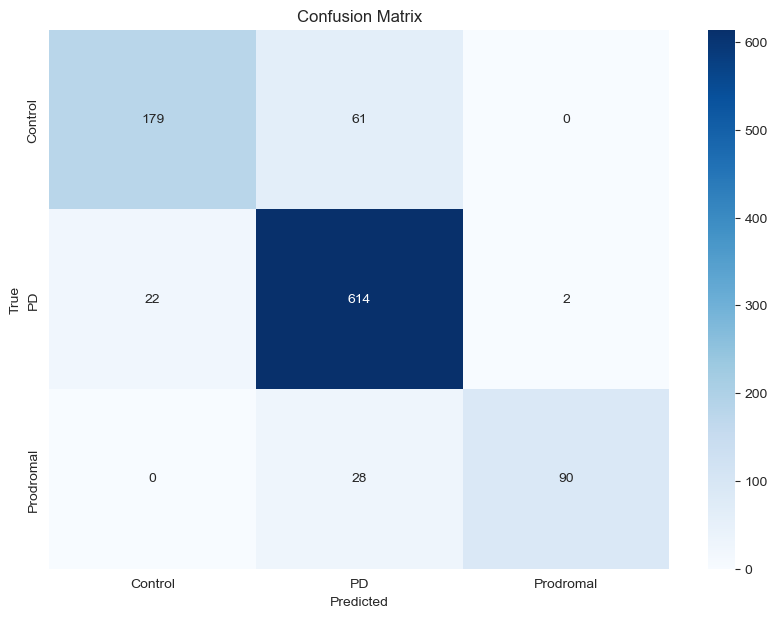

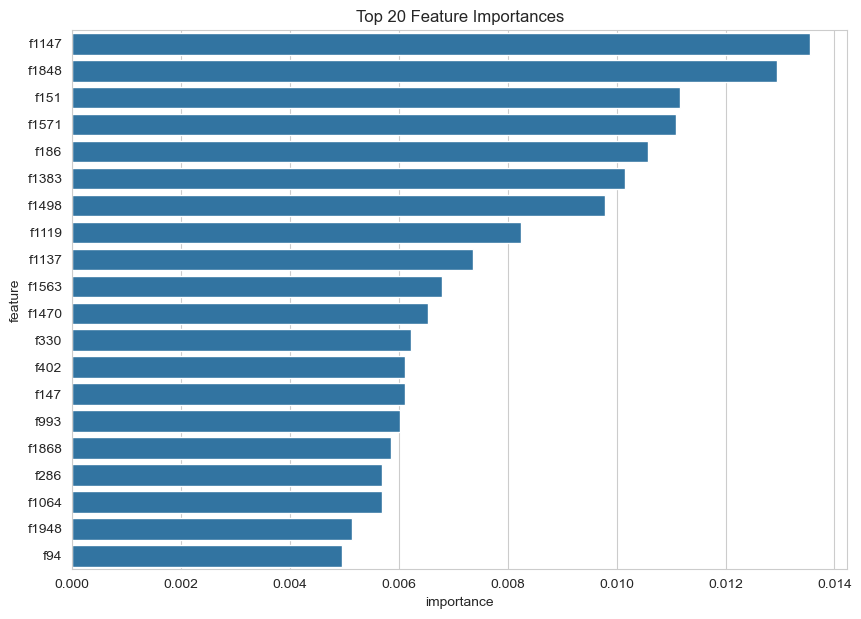

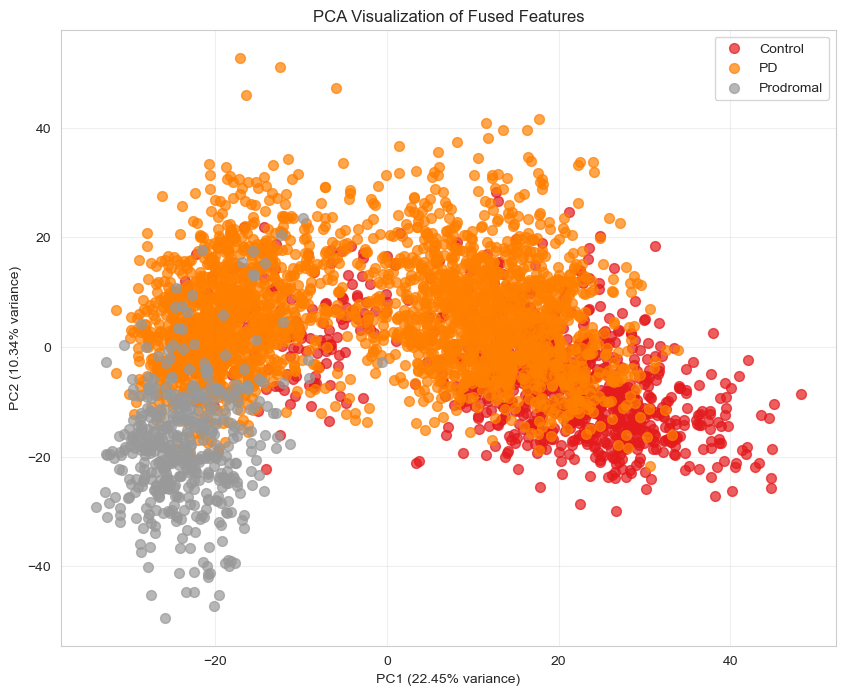

In [2]:
# =========================
# PD Image Classification and Analysis
# Features + Metadata Fusion
# =========================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.decomposition import PCA

# Set seaborn style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (10, 7)

# =========================
# Step 1: Load Datasets
# =========================
features_path = "resnet50_PD_selected_features_cumulative.csv"
metadata_path = "Cleaned_PD_Demographics.csv"   # cleaned version

features_df = pd.read_csv(features_path)
metadata_df = pd.read_csv(metadata_path)

print("Features dataset:", features_df.shape)
print("Metadata dataset:", metadata_df.shape)

# =========================
# Step 2: Extract Image ID & Merge
# =========================
# Extract Image Data ID from filename (before first "_")
features_df["Image Data ID"] = features_df["filename"].str.split("_").str[0]

# Merge with demographics
merged_df = pd.merge(features_df, metadata_df, on="Image Data ID", how="inner")
print("Merged dataset shape:", merged_df.shape)

# =========================
# Step 3: Prepare Features
# =========================
# Drop identifier columns
drop_cols = ["filename", "Image Data ID", "Subject"]
for col in drop_cols:
    if col in merged_df.columns:
        merged_df = merged_df.drop(columns=col)

# Define target label (use Group for PD vs Control classification)
y = merged_df["Group"]
# Drop target columns from features
X = merged_df.drop(columns=[y.name, "class"]) if "class" in merged_df.columns else merged_df.drop(columns=[y.name])

print("Feature matrix shape:", X.shape)
print("Labels distribution:\n", y.value_counts())

# Encode categorical columns if any
for col in X.select_dtypes(include=["object"]).columns:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col].astype(str))

# =========================
# Step 4: Train/Test Split
# =========================
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# =========================
# Step 5: Impute Missing Values
# =========================
imputer = SimpleImputer(strategy="mean")
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# =========================
# Step 6: Scale Features
# =========================
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_imputed)
X_test_scaled = scaler.transform(X_test_imputed)

# =========================
# Step 7: Train Random Forest
# =========================
clf = RandomForestClassifier(
    n_estimators=200, random_state=42, class_weight="balanced"
)
clf.fit(X_train_scaled, y_train)

# =========================
# Step 8: Evaluate
# =========================
y_pred = clf.predict(X_test_scaled)

print("\n=== Classification Report ===")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=clf.classes_, yticklabels=clf.classes_)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# =========================
# Step 9: Feature Importance
# =========================
feature_importances = pd.DataFrame({
    "feature": X.columns,
    "importance": clf.feature_importances_
}).sort_values("importance", ascending=False)

sns.barplot(x="importance", y="feature", data=feature_importances.head(20))
plt.title("Top 20 Feature Importances")
plt.show()

# =========================
# Step 10: PCA Visualization
# =========================
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train_scaled)

unique_classes = np.unique(y_train)
colors = plt.cm.Set1(np.linspace(0, 1, len(unique_classes)))

plt.figure(figsize=(10, 8))
for i, class_label in enumerate(unique_classes):
    mask = y_train == class_label
    plt.scatter(X_pca[mask, 0], X_pca[mask, 1], c=[colors[i]], 
                label=class_label, alpha=0.7, s=50)

plt.title("PCA Visualization of Fused Features")
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()



===== Fold 1 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [23:35:11] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold Accuracy: 0.9372647427854455
              precision    recall  f1-score   support

     Control       0.95      0.82      0.88       192
          PD       0.93      0.98      0.95       511
   Prodromal       0.97      0.97      0.97        94

    accuracy                           0.94       797
   macro avg       0.95      0.92      0.93       797
weighted avg       0.94      0.94      0.94       797


===== Fold 2 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [23:37:34] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold Accuracy: 0.9372647427854455
              precision    recall  f1-score   support

     Control       0.90      0.85      0.88       192
          PD       0.94      0.96      0.95       511
   Prodromal       0.99      0.97      0.98        94

    accuracy                           0.94       797
   macro avg       0.94      0.93      0.94       797
weighted avg       0.94      0.94      0.94       797


===== Fold 3 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [23:39:54] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold Accuracy: 0.9422835633626098
              precision    recall  f1-score   support

     Control       0.93      0.86      0.89       192
          PD       0.94      0.97      0.96       510
   Prodromal       0.97      0.96      0.96        95

    accuracy                           0.94       797
   macro avg       0.95      0.93      0.94       797
weighted avg       0.94      0.94      0.94       797


===== Fold 4 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [23:42:15] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold Accuracy: 0.9196988707653702
              precision    recall  f1-score   support

     Control       0.88      0.80      0.84       192
          PD       0.93      0.95      0.94       510
   Prodromal       0.97      0.98      0.97        95

    accuracy                           0.92       797
   macro avg       0.92      0.91      0.92       797
weighted avg       0.92      0.92      0.92       797


===== Fold 5 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [23:44:34] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold Accuracy: 0.9296482412060302
              precision    recall  f1-score   support

     Control       0.94      0.83      0.88       192
          PD       0.92      0.97      0.95       510
   Prodromal       0.96      0.90      0.93        94

    accuracy                           0.93       796
   macro avg       0.94      0.90      0.92       796
weighted avg       0.93      0.93      0.93       796


===== Cross-Validation Results =====
Average Accuracy across folds: 0.9332320321809803


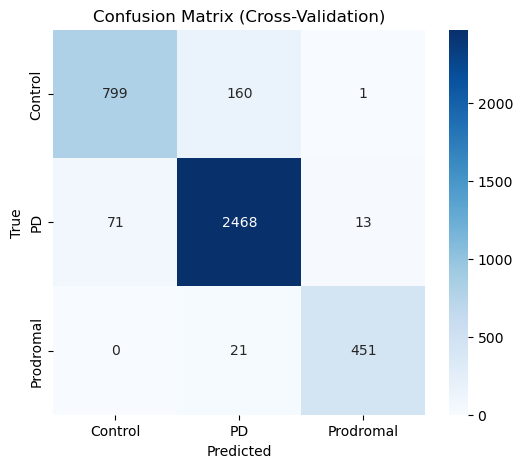

d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [23:46:53] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



===== Final Hold-Out Test Set Results =====
Test Accuracy: 0.9327309236947792
              precision    recall  f1-score   support

     Control       0.91      0.84      0.87       240
          PD       0.93      0.97      0.95       638
   Prodromal       0.99      0.94      0.97       118

    accuracy                           0.93       996
   macro avg       0.94      0.92      0.93       996
weighted avg       0.93      0.93      0.93       996



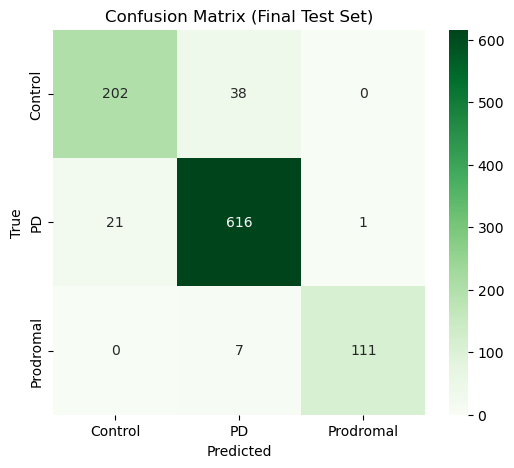

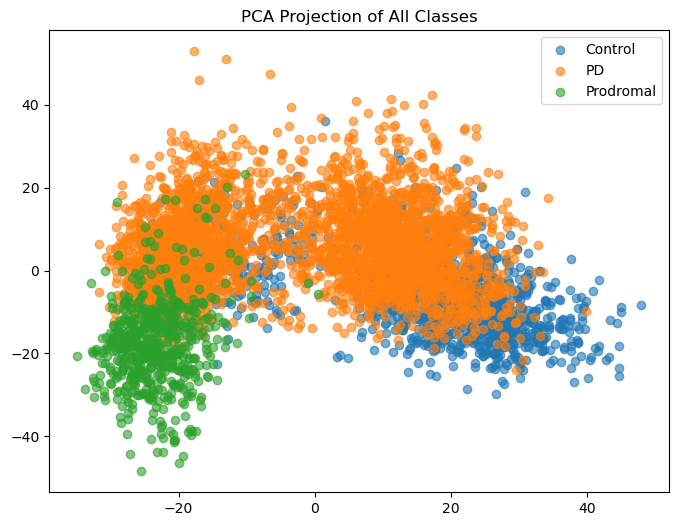

IndexError: boolean index did not match indexed array along dimension 0; dimension is 4980 but corresponding boolean dimension is 3984

<Figure size 800x600 with 0 Axes>

In [2]:
# =========================
# XGBoost Classification with PCA + Borderline Case Visualization
# =========================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.decomposition import PCA

from xgboost import XGBClassifier

# =========================
# Load Data
# =========================
# Replace with your dataset path
data = pd.read_csv("D:\Fused_PD_Features_Demographics_CLEANED.csv")

X = data.drop(columns=["Group","Image Data ID"])   # features
y = data["Group"]                  # labels

# Encode labels
le = LabelEncoder()
y = le.fit_transform(y)

# Train/Test split (final hold-out test set)
X_train_full, X_test_final, y_train_full, y_test_final = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# Standardize
scaler = StandardScaler()
X_train_full = scaler.fit_transform(X_train_full)
X_test_final = scaler.transform(X_test_final)

# =========================
# Cross-validation
# =========================
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

all_y_true, all_y_pred = [], []
accuracies = []

fold = 1
for train_idx, val_idx in skf.split(X_train_full, y_train_full):
    print(f"\n===== Fold {fold} =====")
    X_train, X_val = X_train_full[train_idx], X_train_full[val_idx]
    y_train, y_val = y_train_full[train_idx], y_train_full[val_idx]

    # XGBoost with tuned hyperparameters
    xgb_clf = XGBClassifier(
        n_estimators=1000,
        learning_rate=0.05,
        max_depth=5,
        subsample=0.8,
        colsample_bytree=0.8,
        min_child_weight=5,
        reg_lambda=2,
        reg_alpha=1,
        objective="multi:softprob",
        eval_metric="mlogloss",
        random_state=42,
        use_label_encoder=False
    )

    xgb_clf.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=False
    )

    y_pred = xgb_clf.predict(X_val)

    acc = accuracy_score(y_val, y_pred)
    accuracies.append(acc)

    print("Fold Accuracy:", acc)
    print(classification_report(y_val, y_pred, target_names=le.classes_))

    all_y_true.extend(y_val)
    all_y_pred.extend(y_pred)

    fold += 1

# =========================
# Average Accuracy
# =========================
print("\n===== Cross-Validation Results =====")
print("Average Accuracy across folds:", np.mean(accuracies))

# =========================
# Confusion Matrix (CV)
# =========================
cm = confusion_matrix(all_y_true, all_y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix (Cross-Validation)")
plt.show()

# =========================
# Retrain on Full Training Set + Evaluate on Hold-Out Test
# =========================
final_model = XGBClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    max_depth=5,
    subsample=0.8,
    colsample_bytree=0.8,
    min_child_weight=5,
    reg_lambda=2,
    reg_alpha=1,
    objective="multi:softprob",
    eval_metric="mlogloss",
    random_state=42,
    use_label_encoder=False
)
final_model.fit(X_train_full, y_train_full)

y_test_pred = final_model.predict(X_test_final)

print("\n===== Final Hold-Out Test Set Results =====")
print("Test Accuracy:", accuracy_score(y_test_final, y_test_pred))
print(classification_report(y_test_final, y_test_pred, target_names=le.classes_))

cm_test = confusion_matrix(y_test_final, y_test_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm_test, annot=True, fmt="d", cmap="Greens",
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix (Final Test Set)")
plt.show()

# =========================
# PCA Visualization (All Classes)
# =========================
pca = PCA(n_components=2)
X_pca = pca.fit_transform(np.vstack([X_train_full, X_test_final]))
y_all = np.concatenate([y_train_full, y_test_final])

plt.figure(figsize=(8,6))
for i, label in enumerate(le.classes_):
    plt.scatter(X_pca[y_all==i, 0], X_pca[y_all==i, 1], label=label, alpha=0.6)
plt.legend()
plt.title("PCA Projection of All Classes")
plt.show()

# =========================
# Borderline Case Visualization
# =========================
all_y_true = np.array(all_y_true)
all_y_pred = np.array(all_y_pred)

mask_prod_to_pd = (all_y_true == le.transform(["Prodromal"])[0]) & (all_y_pred == le.transform(["PD"])[0])
mask_prod_to_ctrl = (all_y_true == le.transform(["Prodromal"])[0]) & (all_y_pred == le.transform(["Control"])[0])

plt.figure(figsize=(8,6))
plt.scatter(X_pca[mask_prod_to_pd, 0], X_pca[mask_prod_to_pd, 1],
            color="red", label="Prodromal → PD", s=80, edgecolor="k")
plt.scatter(X_pca[mask_prod_to_ctrl, 0], X_pca[mask_prod_to_ctrl, 1],
            color="orange", label="Prodromal → Control", s=80, edgecolor="k")
plt.legend()
plt.title("Borderline Cases (Prodromal Misclassifications)")
plt.show()


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:17:19] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:18:57] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:20:32] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:22:16] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\

Average Accuracy across folds: 0.9303212851405623

Classification Report:
               precision    recall  f1-score   support

     Control       0.88      0.87      0.87      1200
          PD       0.95      0.94      0.95      3190
   Prodromal       0.95      0.98      0.96       590

    accuracy                           0.93      4980
   macro avg       0.92      0.93      0.93      4980
weighted avg       0.93      0.93      0.93      4980



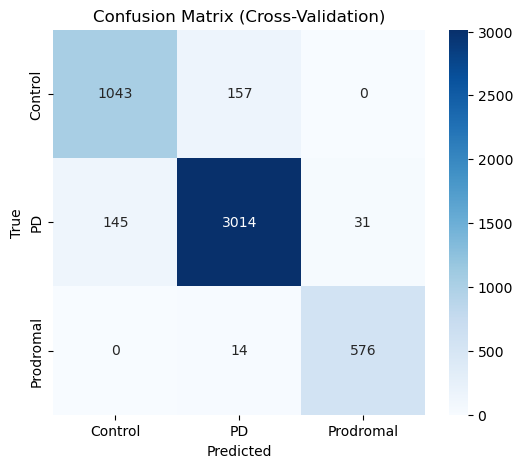

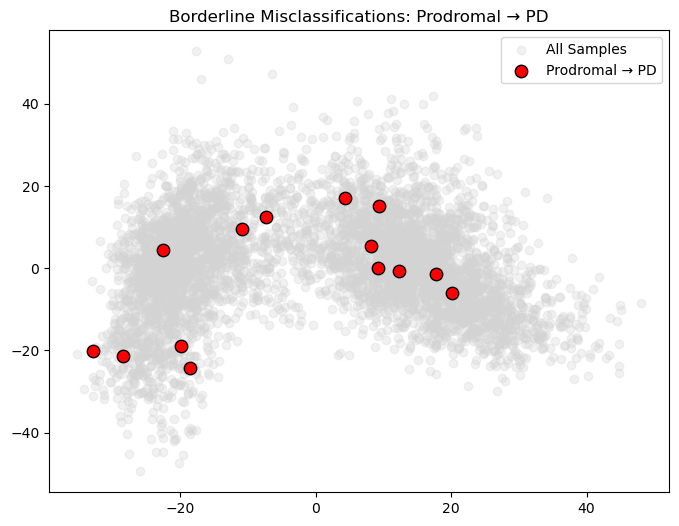

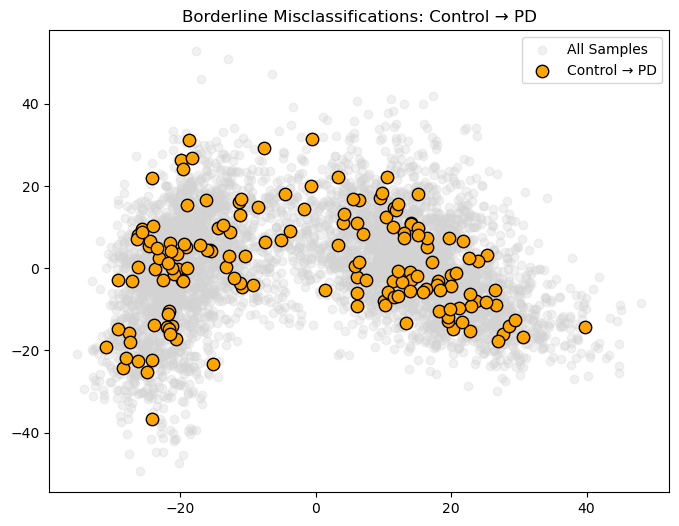

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.decomposition import PCA
from xgboost import XGBClassifier

# =========================
# Load Fused Data
# =========================
data = pd.read_csv(r"D:\Fused_PD_Features_Demographics_CLEANED.csv")

# Features and Labels
X = data.drop(columns=["Group", "Image Data ID"])   # features
y = data["Group"]                                   # labels

# Encode labels
le = LabelEncoder()
y = le.fit_transform(y)

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# PCA for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# =========================
# Stratified K-Fold CV
# =========================
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

all_y_true, all_y_pred = [], []
accuracies = []

for fold, (train_idx, val_idx) in enumerate(skf.split(X_scaled, y), 1):
    X_train, X_val = X_scaled[train_idx], X_scaled[val_idx]
    y_train, y_val = y[train_idx], y[val_idx]

    # Class weights for imbalance
    class_counts = np.bincount(y_train)
    class_weights = {i: max(class_counts) / c for i, c in enumerate(class_counts)}

    # Train XGBoost
    model = XGBClassifier(
        n_estimators=1000,
        learning_rate=0.05,
        max_depth=6,
        subsample=0.8,
        colsample_bytree=0.8,
        gamma=1,
        min_child_weight=3,
        objective="multi:softmax",
        num_class=len(le.classes_),
        eval_metric="mlogloss",
        use_label_encoder=False,
        random_state=42
    )

    # Fit with sample weights
    sample_weights = np.array([class_weights[label] for label in y_train])
    model.fit(X_train, y_train, sample_weight=sample_weights, verbose=False)

    # Predict
    y_pred = model.predict(X_val)
    acc = accuracy_score(y_val, y_pred)

    all_y_true.extend(y_val)
    all_y_pred.extend(y_pred)
    accuracies.append(acc)

# =========================
# Results
# =========================
print("Average Accuracy across folds:", np.mean(accuracies))
print("\nClassification Report:\n", classification_report(all_y_true, all_y_pred, target_names=le.classes_))

# Confusion Matrix
cm = confusion_matrix(all_y_true, all_y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Confusion Matrix (Cross-Validation)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# =========================
# Borderline Case Visualization
# =========================
all_y_true = np.array(all_y_true)
all_y_pred = np.array(all_y_pred)

# --- Prodromal → PD ---
mask_prod_to_pd = (all_y_true == le.transform(["Prodromal"])[0]) & (all_y_pred == le.transform(["PD"])[0])

plt.figure(figsize=(8,6))
plt.scatter(X_pca[:,0], X_pca[:,1], c="lightgray", alpha=0.3, label="All Samples")
plt.scatter(X_pca[mask_prod_to_pd,0], X_pca[mask_prod_to_pd,1],
            color="red", label="Prodromal → PD", s=80, edgecolor="k")
plt.legend()
plt.title("Borderline Misclassifications: Prodromal → PD")
plt.show()

# --- Control → PD ---
mask_ctrl_to_pd = (all_y_true == le.transform(["Control"])[0]) & (all_y_pred == le.transform(["PD"])[0])

plt.figure(figsize=(8,6))
plt.scatter(X_pca[:,0], X_pca[:,1], c="lightgray", alpha=0.3, label="All Samples")
plt.scatter(X_pca[mask_ctrl_to_pd,0], X_pca[mask_ctrl_to_pd,1],
            color="orange", label="Control → PD", s=80, edgecolor="k")
plt.legend()
plt.title("Borderline Misclassifications: Control → PD")
plt.show()



========== Fold 1 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [17:53:55] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0000
Test Accuracy:  0.9327


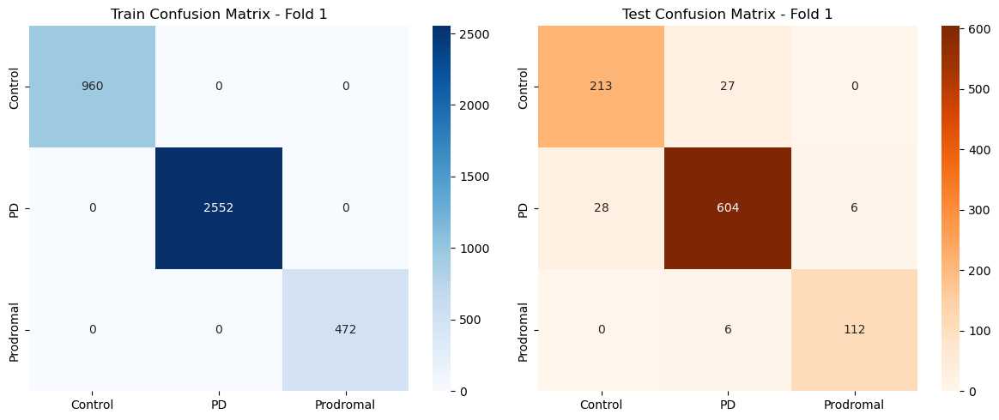


========== Fold 2 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [17:55:01] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0000
Test Accuracy:  0.9317


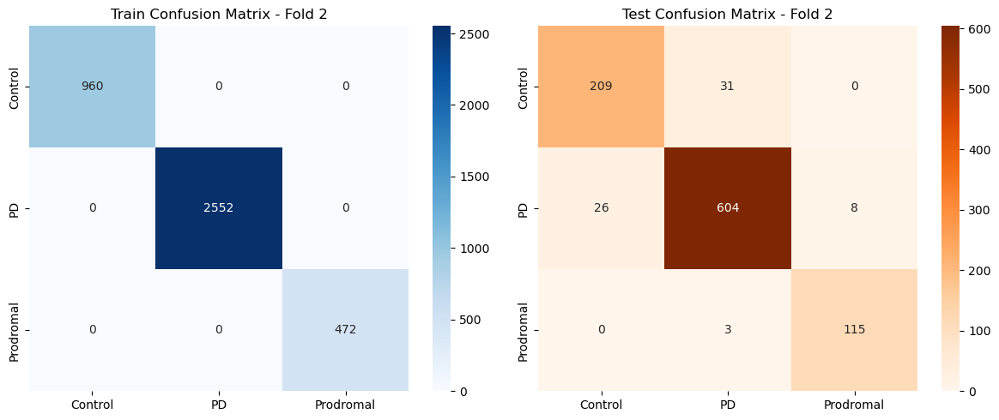


========== Fold 3 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [17:56:09] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0000
Test Accuracy:  0.9428


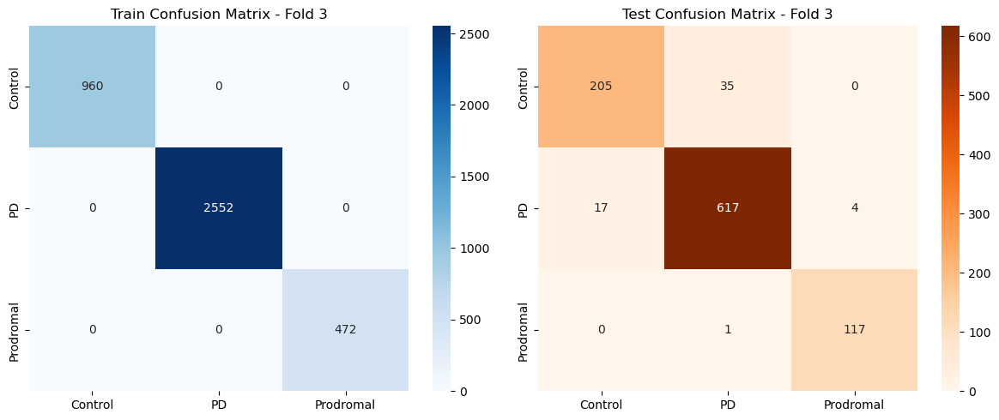


========== Fold 4 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [17:57:17] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0000
Test Accuracy:  0.9367


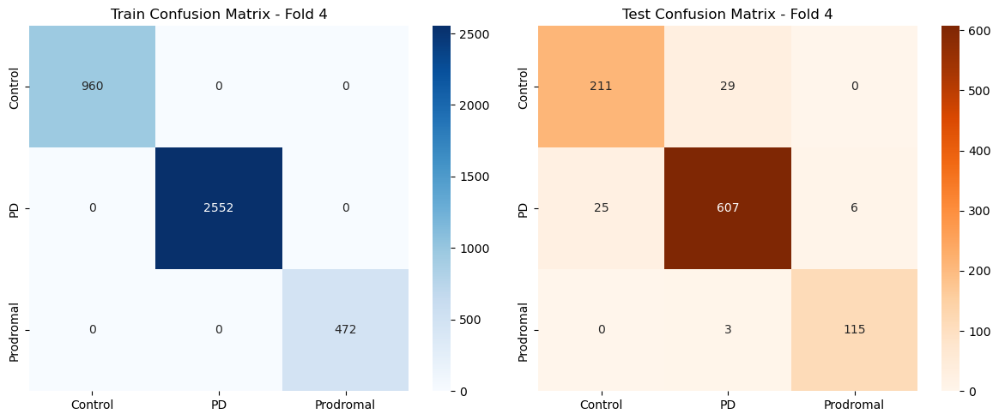


========== Fold 5 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [17:58:25] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 1.0000
Test Accuracy:  0.9237


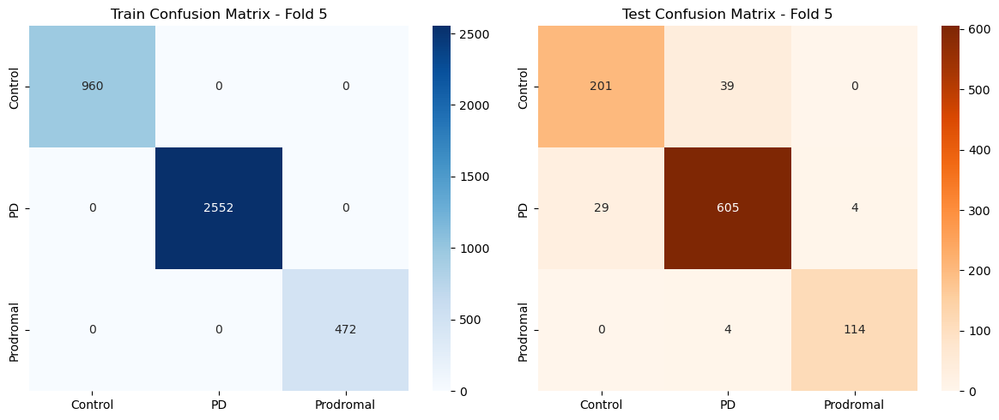


========== Final Test Set Results ==========
Overall Test Accuracy: 0.9335

              precision    recall  f1-score   support

     Control       0.89      0.87      0.88      1200
          PD       0.94      0.95      0.95      3190
   Prodromal       0.95      0.97      0.96       590

    accuracy                           0.93      4980
   macro avg       0.93      0.93      0.93      4980
weighted avg       0.93      0.93      0.93      4980



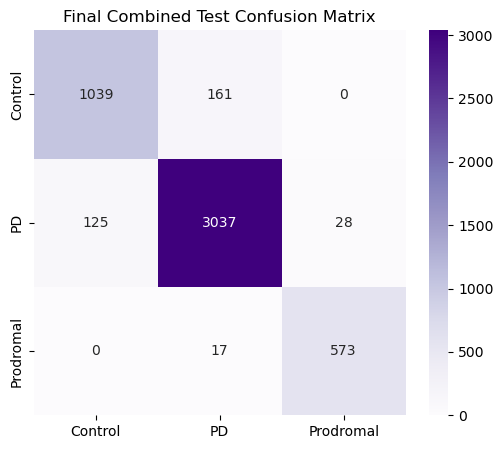

In [4]:
# ==============================
# Cross-Validation with Class Weights 
# ==============================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.utils.class_weight import compute_sample_weight

from xgboost import XGBClassifier

# ==============================
# Step 1: Load your fused dataset
# ==============================
data = pd.read_csv(r"D:\Fused_PD_Features_Demographics_CLEANED.csv")

# Features & labels
X = data.drop(columns=["Group", "Image Data ID"])
y = data["Group"]

# Encode labels (text -> integers)
le = LabelEncoder()
y = le.fit_transform(y)

# ==============================
# Step 2: Cross-validation setup
# ==============================
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

all_y_true = []
all_y_pred = []

fold = 1
for train_idx, test_idx in kf.split(X, y):
    print(f"\n========== Fold {fold} ==========")

    # Split train/test sets
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    # Standardize features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # ==============================
    # Step 3: Handle class imbalance with class weights
    # ==============================
    # Compute balanced sample weights for training set
    sample_weights = compute_sample_weight("balanced", y_train)

    # ==============================
    # Step 4: Define & train model
    # ==============================
    model = XGBClassifier(
        n_estimators=200,
        max_depth=6,
        learning_rate=0.05,
        subsample=0.8,
        colsample_bytree=0.8,
        eval_metric="mlogloss",
        random_state=42,
        use_label_encoder=False
    )

    model.fit(X_train_scaled, y_train, sample_weight=sample_weights)

    # ==============================
    # Step 5: Evaluate on train/test sets
    # ==============================
    y_train_pred = model.predict(X_train_scaled)
    y_test_pred = model.predict(X_test_scaled)

    # Accuracies
    train_acc = accuracy_score(y_train, y_train_pred)
    test_acc = accuracy_score(y_test, y_test_pred)

    print(f"Train Accuracy: {train_acc:.4f}")
    print(f"Test Accuracy:  {test_acc:.4f}")

    # Save results for final confusion matrix
    all_y_true.extend(y_test)
    all_y_pred.extend(y_test_pred)

    # ==============================
    # Step 6: Confusion matrices
    # ==============================
    plt.figure(figsize=(12, 5))

    # Train confusion matrix
    plt.subplot(1, 2, 1)
    sns.heatmap(confusion_matrix(y_train, y_train_pred),
                annot=True, fmt="d", cmap="Blues",
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f"Train Confusion Matrix - Fold {fold}")

    # Test confusion matrix
    plt.subplot(1, 2, 2)
    sns.heatmap(confusion_matrix(y_test, y_test_pred),
                annot=True, fmt="d", cmap="Oranges",
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f"Test Confusion Matrix - Fold {fold}")

    plt.tight_layout()
    plt.show()

    fold += 1

# ==============================
# Step 7: Final evaluation (all test folds combined)
# ==============================
print("\n========== Final Test Set Results ==========")
final_acc = accuracy_score(all_y_true, all_y_pred)
print(f"Overall Test Accuracy: {final_acc:.4f}\n")
print(classification_report(all_y_true, all_y_pred, target_names=le.classes_))

plt.figure(figsize=(6, 5))
sns.heatmap(confusion_matrix(all_y_true, all_y_pred),
            annot=True, fmt="d", cmap="Purples",
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Final Combined Test Confusion Matrix")
plt.show()


Class encoding: {'Control': 0, 'PD': 1, 'Prodromal': 2}

========== Fold 1 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [18:13:55] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 1 Test Accuracy: 0.9327

========== Fold 2 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [18:15:05] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 2 Test Accuracy: 0.9317

========== Fold 3 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [18:16:23] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 3 Test Accuracy: 0.9428

========== Fold 4 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [18:17:36] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 4 Test Accuracy: 0.9367

========== Fold 5 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [18:18:34] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 5 Test Accuracy: 0.9237

========== Specific Borderline Cases ==========
Prodromal misclassified as PD: 17 samples
['I785258' 'I452173' 'I476124' 'I476124' 'I476124' 'I526449' 'I476237'
 'I696907' 'I785258' 'I526449' 'I848771' 'I526449' 'I526449' 'I696019'
 'I785258' 'I526314' 'I526449']

PD misclassified as Control: 125 samples
['I330681' 'I331017' 'I331297' 'I331479' 'I331479' 'I331509' 'I331538'
 'I331631' 'I331846' 'I332225' 'I370259' 'I370741' 'I371063' 'I406631'
 'I407863' 'I331047' 'I331047' 'I331047' 'I370685' 'I410673' 'I410673'
 'I330627' 'I330637' 'I330937' 'I330937' 'I331307' 'I371053' 'I405885'
 'I330617' 'I330681' 'I330947' 'I331007' 'I331017' 'I331297' 'I331459'
 'I333373' 'I370741' 'I370762' 'I370777' 'I370875' 'I370875' 'I370955'
 'I371083' 'I405826' 'I407685' 'I408189' 'I409648' 'I410737' 'I428510'
 'I428904' 'I410673' 'I410673' 'I330637' 'I331307' 'I330504' 'I330647'
 'I370473' 'I370762' 'I371033' 'I407655' 'I410737' 'I331047' 'I331047'
 'I408788' 'I408788' 'I41

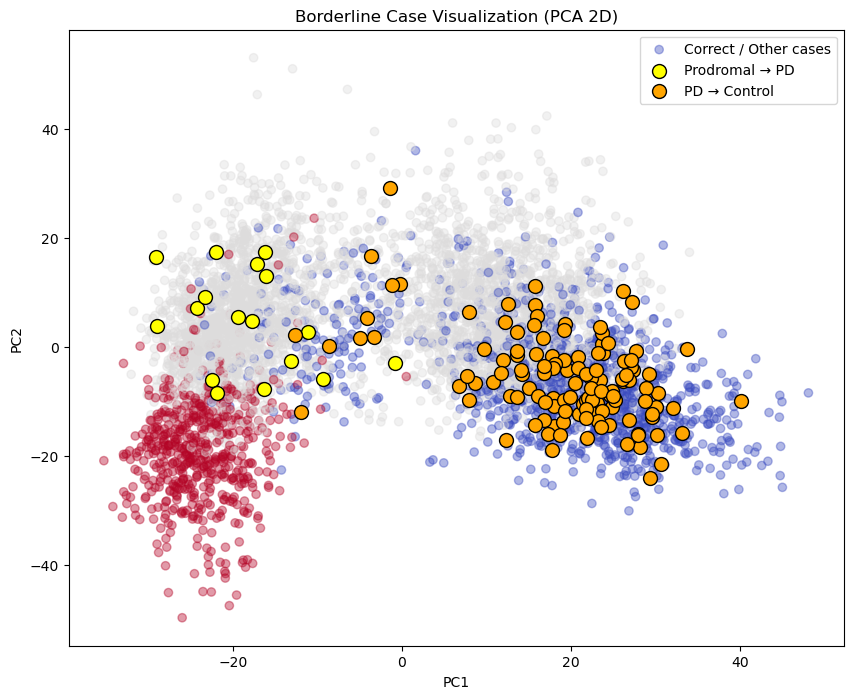

In [5]:
# ==============================
# Cross-Validation with Specific Borderline Case Visualization
# ==============================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.decomposition import PCA

from xgboost import XGBClassifier

# ==============================
# Step 1: Load dataset
# ==============================
data = pd.read_csv(r"D:\Fused_PD_Features_Demographics_CLEANED.csv")

# Features & labels
X = data.drop(columns=["Group", "Image Data ID"])
y = data["Group"]

# Keep IDs for later
ids = data["Image Data ID"]

# Encode labels
le = LabelEncoder()
y = le.fit_transform(y)

# Dictionary for label decoding
label_dict = dict(zip(le.classes_, le.transform(le.classes_)))
print("Class encoding:", label_dict)

# ==============================
# Step 2: Cross-validation setup
# ==============================
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

all_y_true = []
all_y_pred = []
all_ids = []
all_features = []

fold = 1
for train_idx, test_idx in kf.split(X, y):
    print(f"\n========== Fold {fold} ==========")

    # Split sets
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    ids_test = ids.iloc[test_idx]

    # Standardize
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Class weights
    sample_weights = compute_sample_weight("balanced", y_train)

    # Model
    model = XGBClassifier(
        n_estimators=200,
        max_depth=6,
        learning_rate=0.05,
        subsample=0.8,
        colsample_bytree=0.8,
        eval_metric="mlogloss",
        random_state=42,
        use_label_encoder=False
    )

    model.fit(X_train_scaled, y_train, sample_weight=sample_weights)

    # Predictions
    y_test_pred = model.predict(X_test_scaled)

    # Save results
    all_y_true.extend(y_test)
    all_y_pred.extend(y_test_pred)
    all_ids.extend(ids_test)
    all_features.extend(X_test_scaled)

    # Fold accuracy
    acc = accuracy_score(y_test, y_test_pred)
    print(f"Fold {fold} Test Accuracy: {acc:.4f}")

    fold += 1

# Convert collected results
all_y_true = np.array(all_y_true)
all_y_pred = np.array(all_y_pred)
all_ids = np.array(all_ids)
all_features = np.array(all_features)

# ==============================
# Step 3: Identify specific borderline cases
# ==============================

# Map names back
inv_label_dict = {v: k for k, v in label_dict.items()}

# Prodromal → PD
mask_prod_to_pd = (all_y_true == label_dict["Prodromal"]) & (all_y_pred == label_dict["PD"])
prod_to_pd_ids = all_ids[mask_prod_to_pd]

# PD → Control
mask_pd_to_ctrl = (all_y_true == label_dict["PD"]) & (all_y_pred == label_dict["Control"])
pd_to_ctrl_ids = all_ids[mask_pd_to_ctrl]

print("\n========== Specific Borderline Cases ==========")
print(f"Prodromal misclassified as PD: {len(prod_to_pd_ids)} samples")
print(prod_to_pd_ids)

print(f"\nPD misclassified as Control: {len(pd_to_ctrl_ids)} samples")
print(pd_to_ctrl_ids)

# ==============================
# Step 4: PCA Visualization
# ==============================
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(all_features)

plt.figure(figsize=(10, 8))

# Plot all correct cases in soft colors
plt.scatter(
    X_pca[:, 0], X_pca[:, 1],
    c=all_y_true, cmap="coolwarm", alpha=0.4,
    label="Correct / Other cases"
)

# Highlight Prodromal→PD
plt.scatter(
    X_pca[mask_prod_to_pd, 0],
    X_pca[mask_prod_to_pd, 1],
    c="yellow", edgecolor="black", s=100,
    label="Prodromal → PD"
)

# Highlight PD→Control
plt.scatter(
    X_pca[mask_pd_to_ctrl, 0],
    X_pca[mask_pd_to_ctrl, 1],
    c="orange", edgecolor="black", s=100,
    label="PD → Control"
)

plt.title("Borderline Case Visualization (PCA 2D)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()
plt.show()



===== Fold 1 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [18:45:01] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



Train Accuracy: 0.998995983935743
Test Accuracy: 0.9307228915662651

Train Confusion Matrix:
[[ 960    0    0]
 [   4 2548    0]
 [   0    0  472]]

Test Confusion Matrix:
[[210  30   0]
 [ 28 603   7]
 [  0   4 114]]

===== Fold 2 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [18:46:16] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



Train Accuracy: 0.9984939759036144
Test Accuracy: 0.9166666666666666

Train Confusion Matrix:
[[ 960    0    0]
 [   6 2546    0]
 [   0    0  472]]

Test Confusion Matrix:
[[209  31   0]
 [ 38 590  10]
 [  0   4 114]]

===== Fold 3 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [18:47:32] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



Train Accuracy: 0.9984939759036144
Test Accuracy: 0.9357429718875502

Train Confusion Matrix:
[[ 960    0    0]
 [   5 2546    1]
 [   0    0  472]]

Test Confusion Matrix:
[[207  33   0]
 [ 23 609   6]
 [  0   2 116]]

===== Fold 4 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [18:48:48] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



Train Accuracy: 0.9984939759036144
Test Accuracy: 0.927710843373494

Train Confusion Matrix:
[[ 960    0    0]
 [   5 2546    1]
 [   0    0  472]]

Test Confusion Matrix:
[[210  30   0]
 [ 33 598   7]
 [  0   2 116]]

===== Fold 5 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [18:50:03] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



Train Accuracy: 0.9982429718875502
Test Accuracy: 0.9196787148594378

Train Confusion Matrix:
[[ 960    0    0]
 [   6 2545    1]
 [   0    0  472]]

Test Confusion Matrix:
[[204  36   0]
 [ 37 597   4]
 [  0   3 115]]


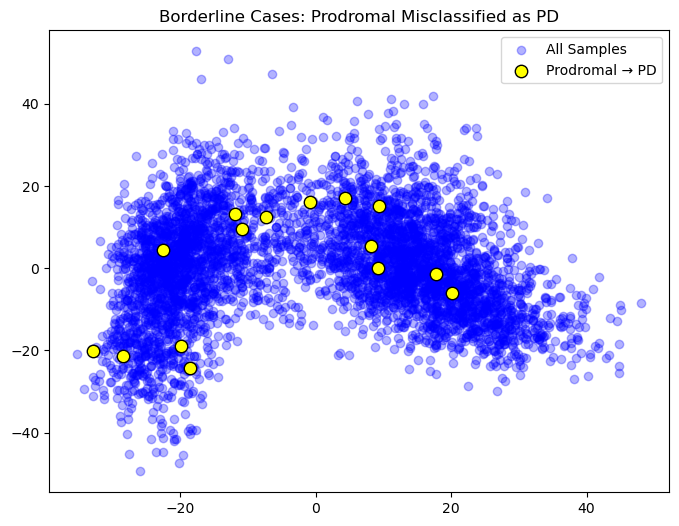

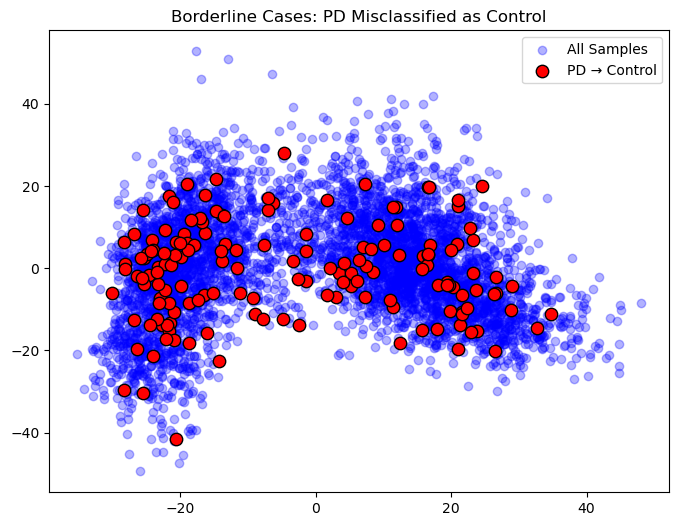


=== Overall Classification Report on All Folds ===
              precision    recall  f1-score   support

     Control       0.87      0.87      0.87      1200
          PD       0.94      0.94      0.94      3190
   Prodromal       0.94      0.97      0.96       590

    accuracy                           0.93      4980
   macro avg       0.92      0.93      0.92      4980
weighted avg       0.93      0.93      0.93      4980

Final Test Set Accuracy (avg across folds): 0.9261044176706827


In [7]:
# =======================================
# XGBoost with Class-Balanced Weights
# Borderline Case Visualization (PCA)
# =======================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.utils.class_weight import compute_sample_weight
from xgboost import XGBClassifier

# ===============================
# Step 1: Load fused dataset
# ===============================
data = pd.read_csv(r"D:\Fused_PD_Features_Demographics_CLEANED.csv")

X = data.drop(columns=["Group", "Image Data ID"])  # Features
y = data["Group"]                                  # Labels

# Encode labels into numeric form
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Standardize features for PCA visualization
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# PCA for visualization (2D projection of feature space)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# ===================================
# Step 2: Stratified K-Fold CV setup
# ===================================
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

fold = 1
all_y_true, all_y_pred = [], []

# ==============================
# Step 3: Cross-validation loop
# ==============================
for train_idx, test_idx in skf.split(X, y_encoded):
    print(f"\n===== Fold {fold} =====")

    # Split data
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]

    # Compute class-balanced sample weights
    sample_weights = compute_sample_weight(class_weight="balanced", y=y_train)

    # Initialize XGBoost with tuned hyperparameters
    xgb_clf = XGBClassifier(
        n_estimators=500,
        learning_rate=0.05,
        max_depth=6,
        subsample=0.8,
        colsample_bytree=0.8,
        gamma=1,
        reg_lambda=1,
        objective="multi:softmax",
        num_class=len(le.classes_),
        random_state=42,
        use_label_encoder=False,
        eval_metric="mlogloss"
    )

    # Train with class-balanced weights
    xgb_clf.fit(X_train, y_train, sample_weight=sample_weights)

    # Predictions
    y_train_pred = xgb_clf.predict(X_train)
    y_test_pred = xgb_clf.predict(X_test)

    # Store for overall results
    all_y_true.extend(y_test)
    all_y_pred.extend(y_test_pred)

    # ======================
    # Step 4: Metrics
    # ======================
    print("\nTrain Accuracy:", accuracy_score(y_train, y_train_pred))
    print("Test Accuracy:", accuracy_score(y_test, y_test_pred))

    print("\nTrain Confusion Matrix:")
    print(confusion_matrix(y_train, y_train_pred))

    print("\nTest Confusion Matrix:")
    print(confusion_matrix(y_test, y_test_pred))

    fold += 1

# ===================================
# Step 5: Borderline case visualization
# ===================================
all_y_true = np.array(all_y_true)
all_y_pred = np.array(all_y_pred)

# Masks for borderline cases
mask_prod_to_pd = (all_y_true == le.transform(["Prodromal"])[0]) & (all_y_pred == le.transform(["PD"])[0])
mask_pd_to_ctrl = (all_y_true == le.transform(["PD"])[0]) & (all_y_pred == le.transform(["Control"])[0])

# Plot 1: Prodromal misclassified as PD
plt.figure(figsize=(8,6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], color="blue", alpha=0.3, label="All Samples")
plt.scatter(X_pca[mask_prod_to_pd, 0], X_pca[mask_prod_to_pd, 1],
            color="yellow", s=80, edgecolor="k", label="Prodromal → PD")
plt.title("Borderline Cases: Prodromal Misclassified as PD")
plt.legend()
plt.show()

# Plot 2: PD misclassified as Control
plt.figure(figsize=(8,6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], color="blue", alpha=0.3, label="All Samples")
plt.scatter(X_pca[mask_pd_to_ctrl, 0], X_pca[mask_pd_to_ctrl, 1],
            color="red", s=80, edgecolor="k", label="PD → Control")
plt.title("Borderline Cases: PD Misclassified as Control")
plt.legend()
plt.show()

# ===============================
# Step 6: Final overall report
# ===============================
print("\n=== Overall Classification Report on All Folds ===")
print(classification_report(all_y_true, all_y_pred, target_names=le.classes_))

print("Final Test Set Accuracy (avg across folds):", accuracy_score(all_y_true, all_y_pred))


Class counts: {'Control': 1200, 'PD': 3190, 'Prodromal': 590}
Manual class weights: {0: 1.3833333333333333, 1: 0.5203761755485894, 2: 2.8135593220338984}

========== Fold 1 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [19:40:52] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold Accuracy: 0.9487951807228916
              precision    recall  f1-score   support

     Control       0.92      0.90      0.91       240
          PD       0.96      0.96      0.96       638
   Prodromal       0.96      0.97      0.97       118

    accuracy                           0.95       996
   macro avg       0.95      0.94      0.95       996
weighted avg       0.95      0.95      0.95       996

Confusion Matrix:
 [[215  25   0]
 [ 18 615   5]
 [  0   3 115]]

========== Fold 2 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [19:44:49] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold Accuracy: 0.9347389558232931
              precision    recall  f1-score   support

     Control       0.91      0.88      0.89       240
          PD       0.94      0.95      0.95       638
   Prodromal       0.94      0.95      0.95       118

    accuracy                           0.93       996
   macro avg       0.93      0.93      0.93       996
weighted avg       0.93      0.93      0.93       996

Confusion Matrix:
 [[210  30   0]
 [ 22 609   7]
 [  0   6 112]]

========== Fold 3 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [19:46:54] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold Accuracy: 0.9477911646586346
              precision    recall  f1-score   support

     Control       0.94      0.86      0.90       240
          PD       0.95      0.97      0.96       638
   Prodromal       0.97      0.98      0.98       118

    accuracy                           0.95       996
   macro avg       0.95      0.94      0.95       996
weighted avg       0.95      0.95      0.95       996

Confusion Matrix:
 [[207  33   0]
 [ 14 621   3]
 [  0   2 116]]

========== Fold 4 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [19:48:56] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold Accuracy: 0.9377510040160643
              precision    recall  f1-score   support

     Control       0.90      0.88      0.89       240
          PD       0.95      0.95      0.95       638
   Prodromal       0.95      0.97      0.96       118

    accuracy                           0.94       996
   macro avg       0.93      0.94      0.93       996
weighted avg       0.94      0.94      0.94       996

Confusion Matrix:
 [[211  29   0]
 [ 24 608   6]
 [  0   3 115]]

========== Fold 5 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [19:52:04] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold Accuracy: 0.9317269076305221
              precision    recall  f1-score   support

     Control       0.90      0.85      0.87       240
          PD       0.94      0.96      0.95       638
   Prodromal       0.97      0.96      0.96       118

    accuracy                           0.93       996
   macro avg       0.93      0.92      0.93       996
weighted avg       0.93      0.93      0.93       996

Confusion Matrix:
 [[203  37   0]
 [ 22 612   4]
 [  0   5 113]]

========== Overall Test Results ==========
              precision    recall  f1-score   support

     Control       0.91      0.87      0.89      1200
          PD       0.95      0.96      0.95      3190
   Prodromal       0.96      0.97      0.96       590

    accuracy                           0.94      4980
   macro avg       0.94      0.93      0.94      4980
weighted avg       0.94      0.94      0.94      4980

Overall Accuracy: 0.9401606425702811
Global Confusion Matrix:
 [[1046  154    0]
 [ 100 3065   

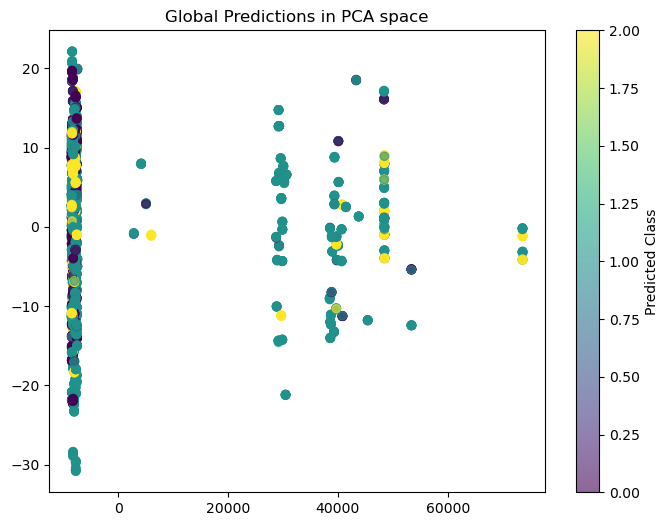

In [ ]:
#using manual class weights in xgboost
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from xgboost import XGBClassifier
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder

# ===============================
# Step 1: Load Data
# ===============================
data = pd.read_csv(r"D:\Fused_PD_Features_Demographics_CLEANED.csv")

X = data.drop(columns=["Group", "Image Data ID"])  # Features
y = data["Group"]                                  # Labels
le = LabelEncoder()
y = le.fit_transform(y)

# ===============================
# Step 2: Class Weight Options
# ===============================
# Option 1: Auto-balanced
#balanced_weights = "balanced"

# Option 2: Manual weights
unique, counts = np.unique(y, return_counts=True)
total = len(y)
manual_weights = {cls: total / (len(unique) * cnt) for cls, cnt in zip(unique, counts)}

print("Class counts:", dict(zip(le.classes_, counts)))
print("Manual class weights:", manual_weights)

# ===============================
# Step 3: Cross-validation setup
# ===============================
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
all_y_true, all_y_pred = [], []

fold = 1
for train_idx, test_idx in skf.split(X, y):
    print(f"\n========== Fold {fold} ==========")
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    # Choose class weight strategy
    class_weight = manual_weights  # or use balanced_weights

    # ===============================
    # Step 4: Train XGBoost
    # ===============================
    xgb_clf = XGBClassifier(
        n_estimators=500,
        learning_rate=0.05,
        max_depth=6,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42,
        use_label_encoder=False,
        eval_metric="mlogloss",
        scale_pos_weight=None  # XGBoost handles imbalance differently
    )

    # NOTE: XGBClassifier doesn’t accept class_weight directly,
    # so we apply sample_weight instead
    sample_weights = np.array([class_weight[cls] for cls in y_train])
    xgb_clf.fit(X_train, y_train, sample_weight=sample_weights)

    # ===============================
    # Step 5: Evaluation
    # ===============================
    y_pred = xgb_clf.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    print("Fold Accuracy:", acc)
    print(classification_report(y_test, y_pred, target_names=le.classes_))

    cm = confusion_matrix(y_test, y_pred)
    print("Confusion Matrix:\n", cm)

    # Collect predictions for global analysis
    all_y_true.extend(y_test)
    all_y_pred.extend(y_pred)

    fold += 1

# ===============================
# Step 6: Global Results
# ===============================
print("\n========== Overall Test Results ==========")
print(classification_report(all_y_true, all_y_pred, target_names=le.classes_))
print("Overall Accuracy:", accuracy_score(all_y_true, all_y_pred))

cm = confusion_matrix(all_y_true, all_y_pred)
print("Global Confusion Matrix:\n", cm)

# ===============================
# Step 7: PCA for visualization
# ===============================
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

plt.figure(figsize=(8,6))
plt.scatter(X_pca[:,0], X_pca[:,1], c=all_y_pred, cmap="viridis", alpha=0.6)
plt.title("Global Predictions in PCA space")
plt.colorbar(label="Predicted Class")
plt.show()


Class counts: {'Control': 1200, 'PD': 3190, 'Prodromal': 590}
Manual class weights: {0: 1.3833333333333333, 1: 0.5203761755485894, 2: 2.8135593220338984}

========== Fold 1 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:07] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


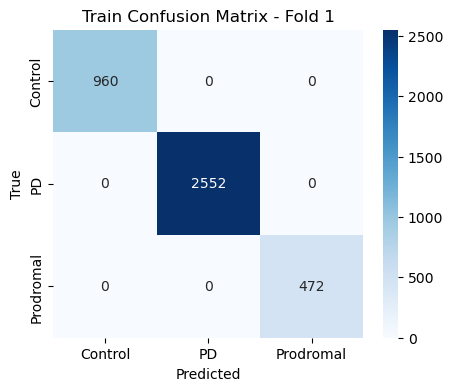

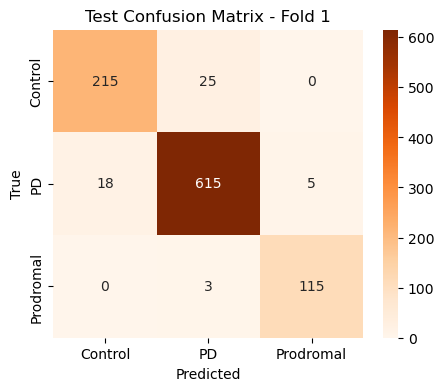

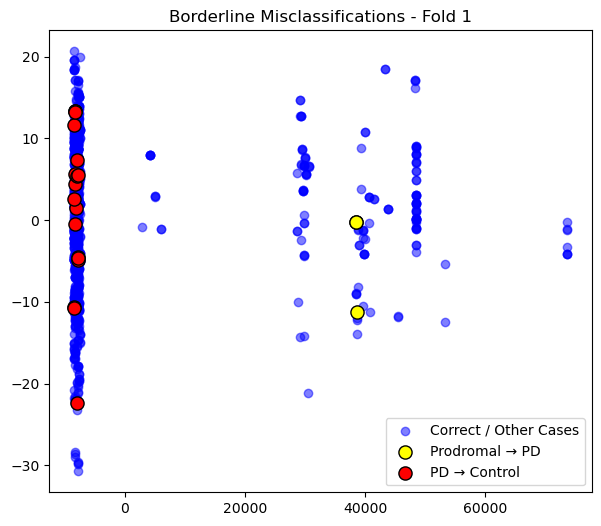


========== Fold 2 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:27] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


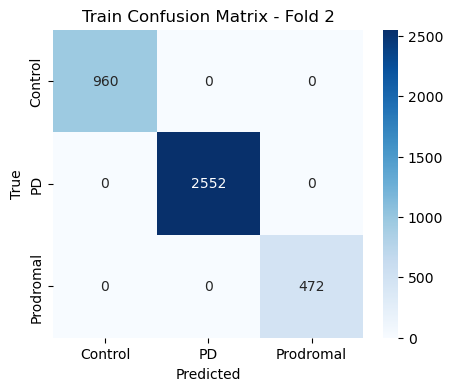

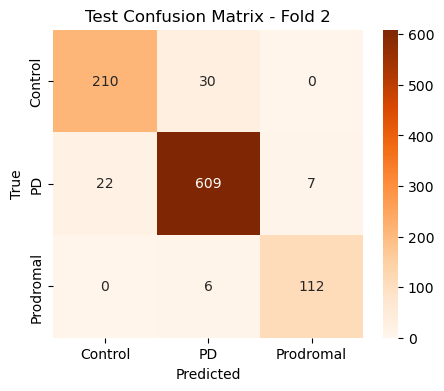

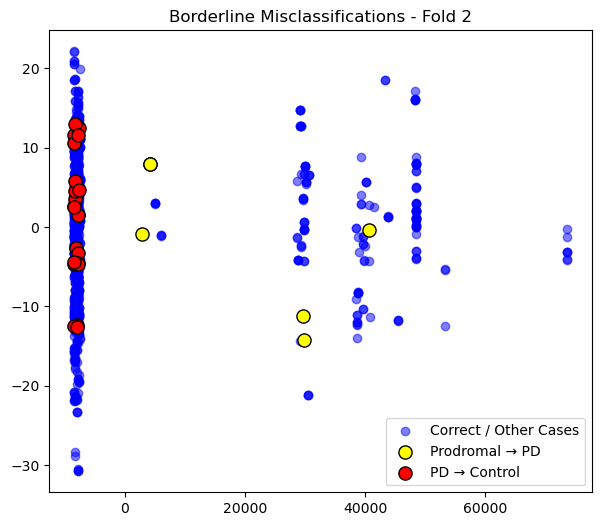


========== Fold 3 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:06] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


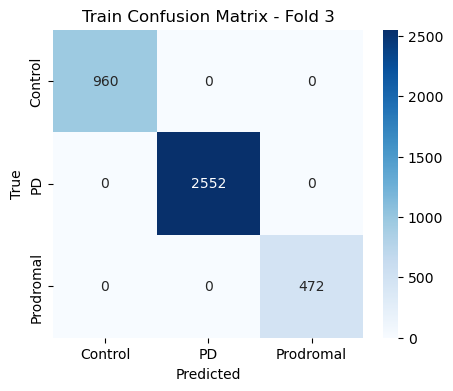

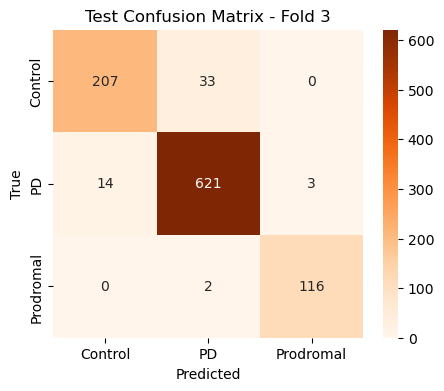

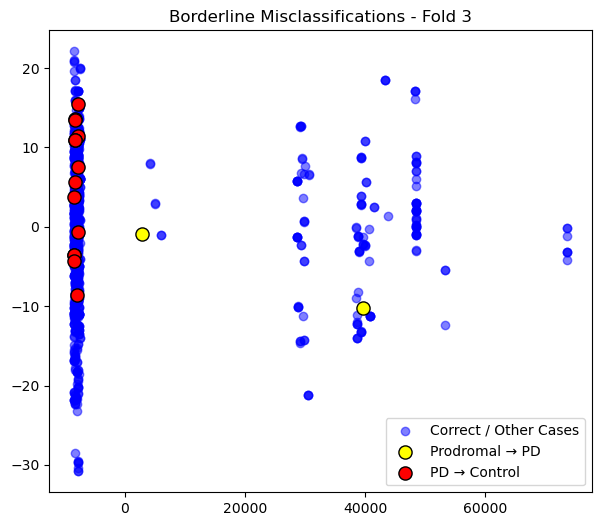


========== Fold 4 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:55] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


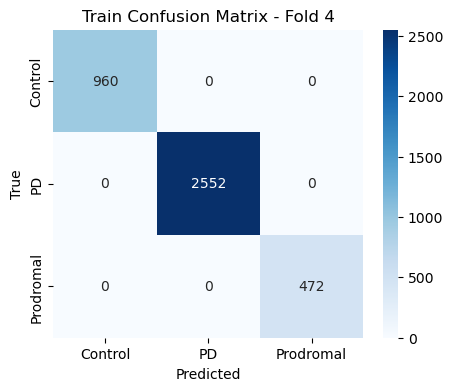

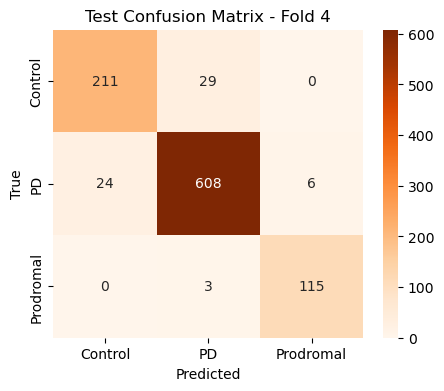

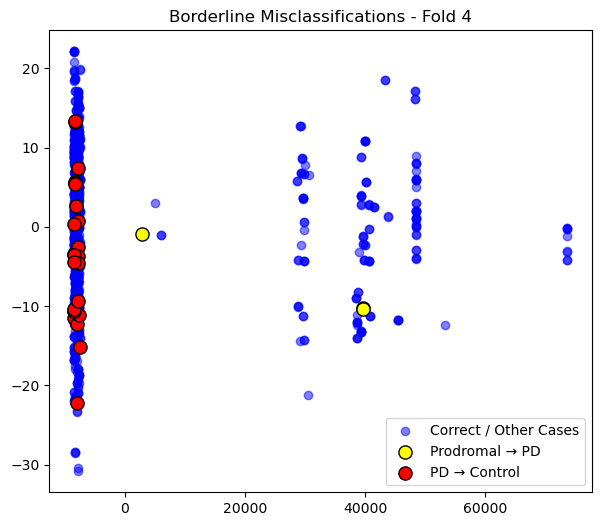


========== Fold 5 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:17] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


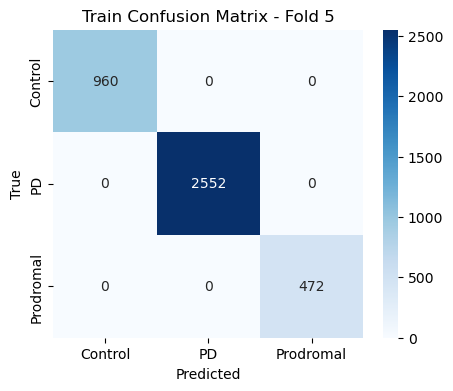

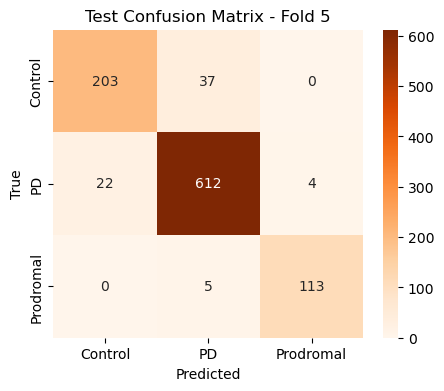

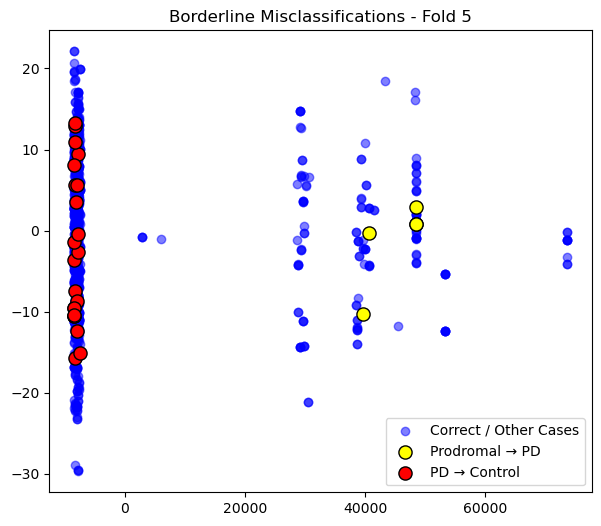


========== Overall Test Results ==========
              precision    recall  f1-score   support

     Control       0.91      0.87      0.89      1200
          PD       0.95      0.96      0.95      3190
   Prodromal       0.96      0.97      0.96       590

    accuracy                           0.94      4980
   macro avg       0.94      0.93      0.94      4980
weighted avg       0.94      0.94      0.94      4980

Overall Accuracy: 0.9401606425702811


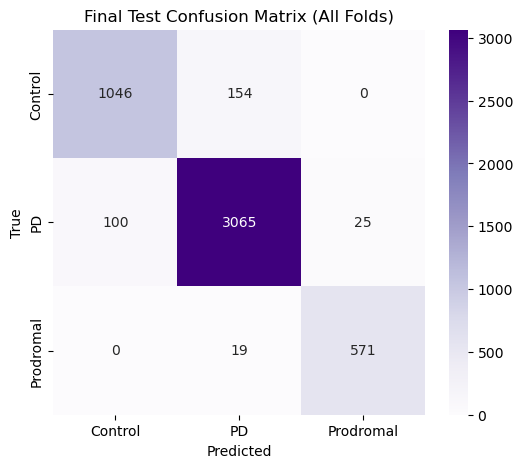

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier

# ===============================
# Step 1: Load Data
# ===============================
data = pd.read_csv(r"D:\Fused_PD_Features_Demographics_CLEANED.csv")

X = data.drop(columns=["Group", "Image Data ID"])  # Features
y = data["Group"]                                  # Labels
le = LabelEncoder()
y = le.fit_transform(y)

# ===============================
# Step 2: Compute Manual Class Weights
# ===============================
unique, counts = np.unique(y, return_counts=True)
total = len(y)
manual_weights = {cls: total / (len(unique) * cnt) for cls, cnt in zip(unique, counts)}

print("Class counts:", dict(zip(le.classes_, counts)))
print("Manual class weights:", manual_weights)

# ===============================
# Step 3: Setup Cross-validation
# ===============================
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
all_y_true, all_y_pred = [], []
fold = 1

# PCA for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

for train_idx, test_idx in skf.split(X, y):
    print(f"\n========== Fold {fold} ==========")
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    # Train with manual weights (sample_weight)
    sample_weights = np.array([manual_weights[cls] for cls in y_train])
    model = XGBClassifier(
        n_estimators=500,
        learning_rate=0.05,
        max_depth=6,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42,
        use_label_encoder=False,
        eval_metric="mlogloss"
    )
    model.fit(X_train, y_train, sample_weight=sample_weights)

    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Collect for global results
    all_y_true.extend(y_test)
    all_y_pred.extend(y_test_pred)

    # -------------------------------
    # Confusion Matrix (Train)
    # -------------------------------
    cm_train = confusion_matrix(y_train, y_train_pred)
    plt.figure(figsize=(5,4))
    sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues",
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f"Train Confusion Matrix - Fold {fold}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

    # -------------------------------
    # Confusion Matrix (Test)
    # -------------------------------
    cm_test = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(5,4))
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Oranges",
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f"Test Confusion Matrix - Fold {fold}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

    # -------------------------------
    # Borderline Cases Visualization
    # -------------------------------
    plt.figure(figsize=(7,6))
    plt.scatter(X_pca[test_idx,0], X_pca[test_idx,1],
                c="blue", alpha=0.5, label="Correct / Other Cases")

    # Prodromal → PD
    mask_prodromal_pd = (y_test == le.transform(["Prodromal"])[0]) & \
                        (y_test_pred == le.transform(["PD"])[0])
    plt.scatter(X_pca[test_idx][mask_prodromal_pd,0],
                X_pca[test_idx][mask_prodromal_pd,1],
                c="yellow", edgecolor="black", s=90,
                label="Prodromal → PD")

    # PD → Control
    mask_pd_control = (y_test == le.transform(["PD"])[0]) & \
                      (y_test_pred == le.transform(["Control"])[0])
    plt.scatter(X_pca[test_idx][mask_pd_control,0],
                X_pca[test_idx][mask_pd_control,1],
                c="red", edgecolor="black", s=90,
                label="PD → Control")

    plt.title(f"Borderline Misclassifications - Fold {fold}")
    plt.legend()
    plt.show()

    fold += 1

# ===============================
# Step 4: Final Global Results
# ===============================
print("\n========== Overall Test Results ==========")
print(classification_report(all_y_true, all_y_pred, target_names=le.classes_))
print("Overall Accuracy:", accuracy_score(all_y_true, all_y_pred))

cm_final = confusion_matrix(all_y_true, all_y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm_final, annot=True, fmt="d", cmap="Purples",
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Final Test Confusion Matrix (All Folds)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()


d:\Anaconda\envs\torch_gpu\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Class Weights: {0: 1.3833333333333333, 1: 0.5203761755485894, 2: 2.8135593220338984}

========== Fold 1 ==========


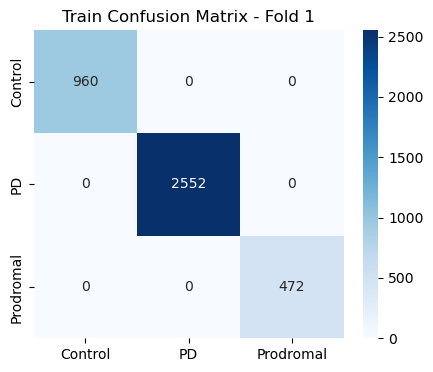

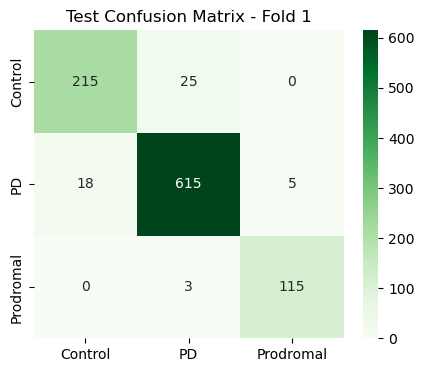


========== Fold 2 ==========


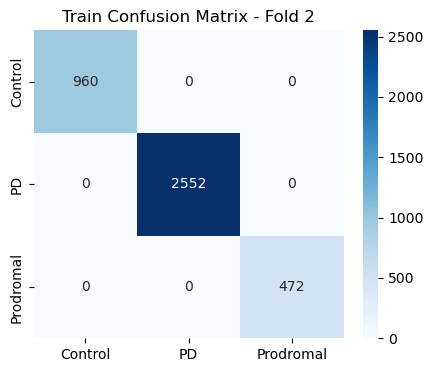

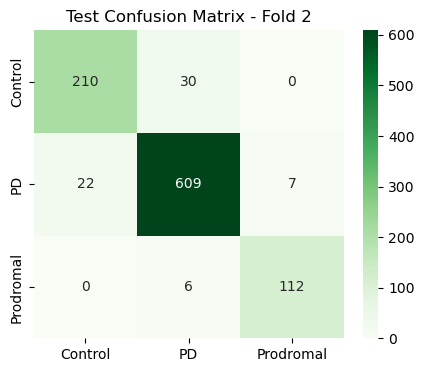


========== Fold 3 ==========


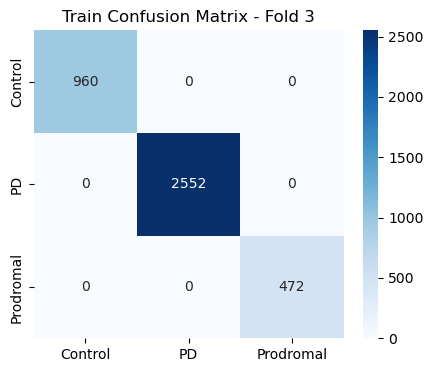

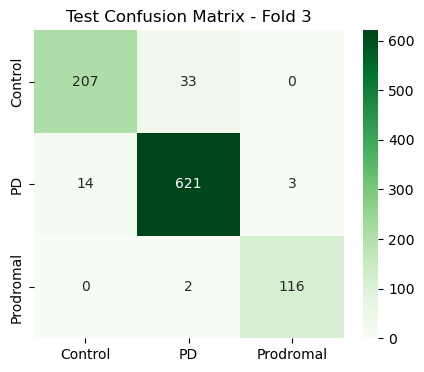


========== Fold 4 ==========


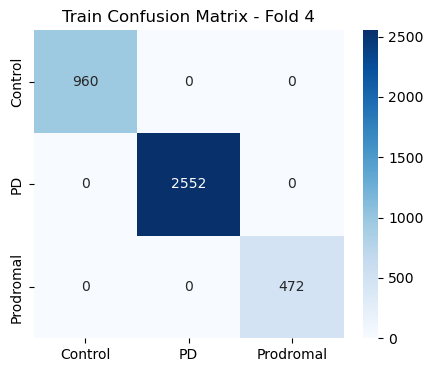

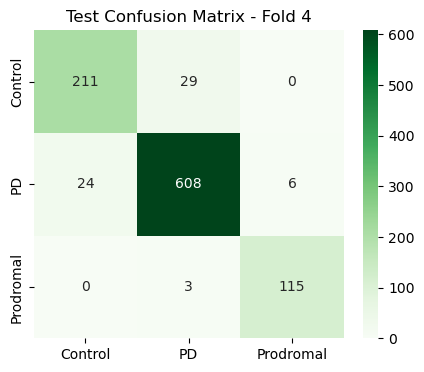


========== Fold 5 ==========


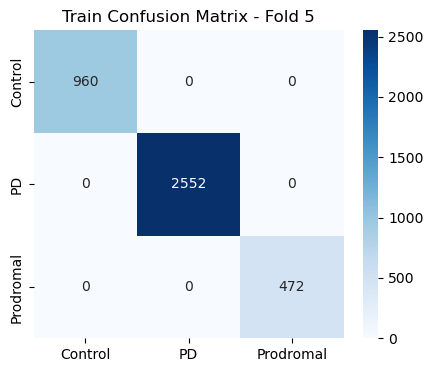

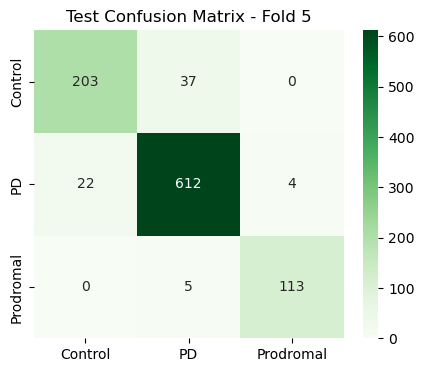

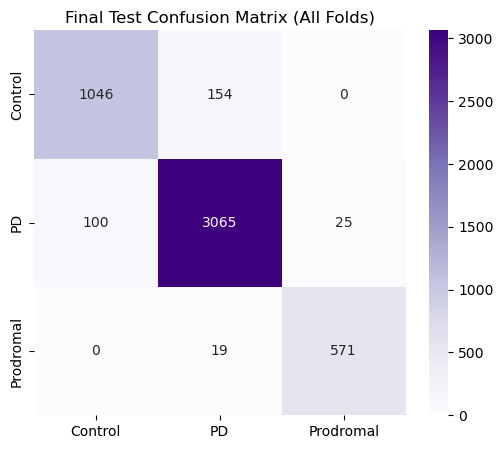


=== Global SHAP Summary (All Classes) ===


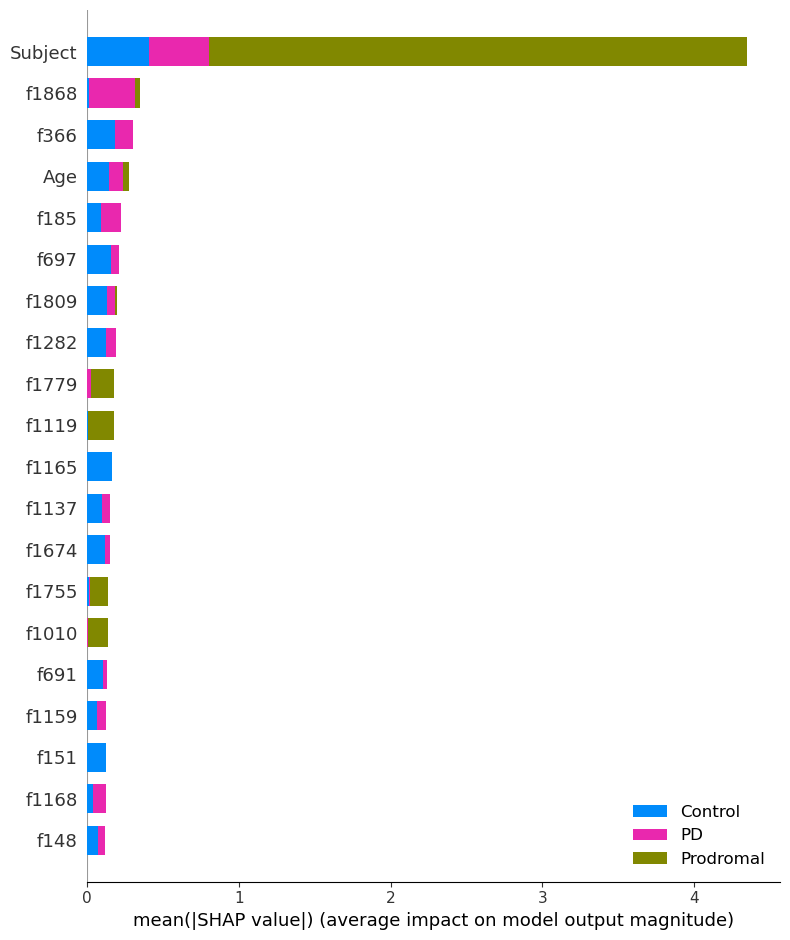


=== SHAP Summary for Control ===


AssertionError: The shape of the shap_values matrix does not match the shape of the provided data matrix.

<Figure size 640x480 with 0 Axes>

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
import shap

# ===============================
# Step 1: Load your fused dataset
# ===============================
data = pd.read_csv("D:/Fused_PD_Features_Demographics_CLEANED.csv")

X = data.drop(columns=["Group", "Image Data ID"])
y = data["Group"]

# Encode labels (Control, Prodromal, PD)
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# ===============================
# Step 2: Class weights (balanced)
# ===============================
class_counts = np.bincount(y_encoded)
total = len(y_encoded)
class_weights = {i: total / (len(class_counts) * c) for i, c in enumerate(class_counts)}

print("Class Weights:", class_weights)

# ===============================
# Step 3: Stratified 5-Fold CV
# ===============================
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

all_test_true, all_test_pred = [], []
borderline_cases = []  # store misclassified borderline cases

for fold, (train_idx, test_idx) in enumerate(kf.split(X, y_encoded)):
    print(f"\n========== Fold {fold+1} ==========")
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]

    # Assign sample weights for training
    train_weights = np.array([class_weights[label] for label in y_train])

    # Train XGBoost
    model = XGBClassifier(
        n_estimators=500,
        learning_rate=0.05,
        max_depth=6,
        subsample=0.8,
        colsample_bytree=0.8,
        objective="multi:softprob",
        num_class=len(le.classes_),
        eval_metric="mlogloss",
        random_state=42
    )
    model.fit(X_train, y_train, sample_weight=train_weights)

    # Predictions
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    # Collect results
    all_test_true.extend(y_test)
    all_test_pred.extend(y_pred_test)

    # Train Confusion Matrix
    cm_train = confusion_matrix(y_train, y_pred_train)
    plt.figure(figsize=(5,4))
    sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues",
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f"Train Confusion Matrix - Fold {fold+1}")
    plt.show()

    # Test Confusion Matrix
    cm_test = confusion_matrix(y_test, y_pred_test)
    plt.figure(figsize=(5,4))
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Greens",
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f"Test Confusion Matrix - Fold {fold+1}")
    plt.show()

    # Store borderline misclassifications
    for i, (true, pred) in enumerate(zip(y_test, y_pred_test)):
        if (true == le.transform(["Prodromal"])[0] and pred == le.transform(["PD"])[0]) \
        or (true == le.transform(["PD"])[0] and pred == le.transform(["Control"])[0]):
            borderline_cases.append((X_test.iloc[i], true, pred))

# ===============================
# Step 4: Final Test Confusion Matrix
# ===============================
cm_final = confusion_matrix(all_test_true, all_test_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm_final, annot=True, fmt="d", cmap="Purples",
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Final Test Confusion Matrix (All Folds)")
plt.show()

# ===============================
# Step 5: SHAP Explainability
# ===============================
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

# ---- Global importance
print("\n=== Global SHAP Summary (All Classes) ===")
shap.summary_plot(shap_values, X, plot_type="bar", class_names=le.classes_)

# ---- Per-class importance
for i, class_name in enumerate(le.classes_):
    print(f"\n=== SHAP Summary for {class_name} ===")
    shap.summary_plot(shap_values[i], X, plot_type="dot", feature_names=X.columns)

# ===============================
# Step 6: Explain Borderline Cases
# ===============================
print(f"\nFound {len(borderline_cases)} borderline misclassifications")

for idx, (x_sample, true, pred) in enumerate(borderline_cases[:5]):  # show first 5
    true_label = le.inverse_transform([true])[0]
    pred_label = le.inverse_transform([pred])[0]
    print(f"\nBorderline Case {idx+1}: True={true_label}, Pred={pred_label}")
    
    shap_values_sample = explainer.shap_values(x_sample)

    # Use force plot to show per-feature contribution
    shap.force_plot(
        explainer.expected_value[pred],
        shap_values_sample[pred],
        x_sample,
        matplotlib=True,
        show=True
    )


Class weights: {0: 1.3833333333333333, 1: 0.5203761755485894, 2: 2.8135593220338984}

========== Fold 1 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:08:32] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


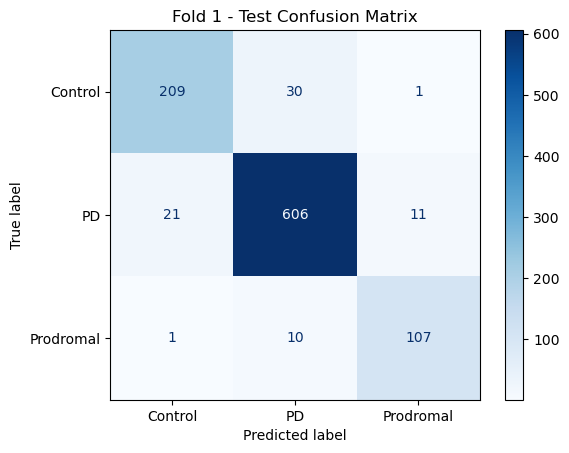


========== Fold 2 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:08:58] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


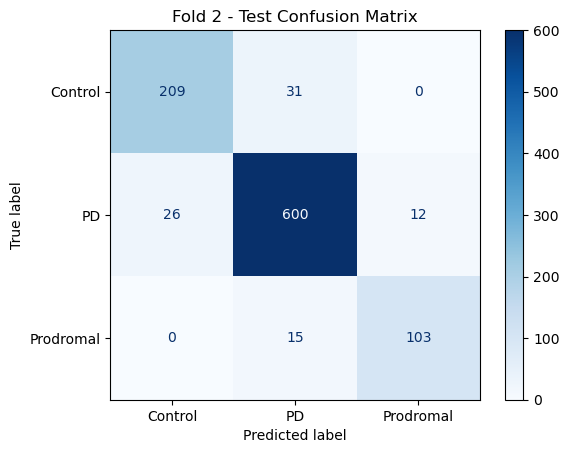


========== Fold 3 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:09:22] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


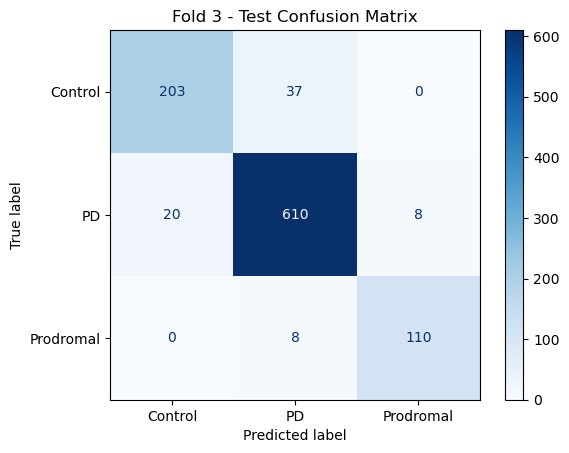


========== Fold 4 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:09:47] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


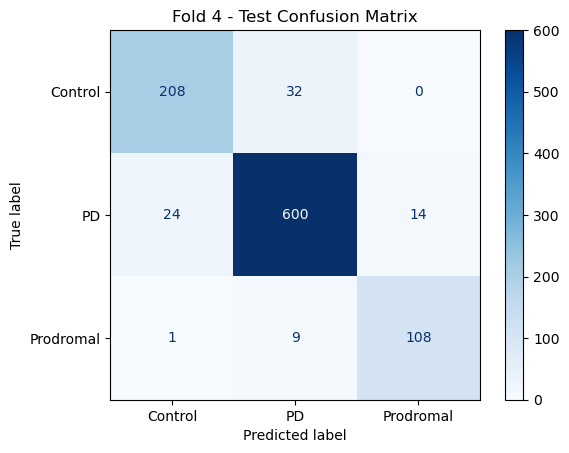


========== Fold 5 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:10:12] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


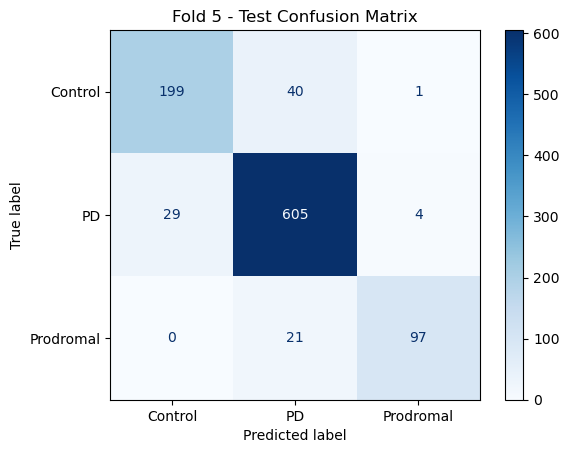

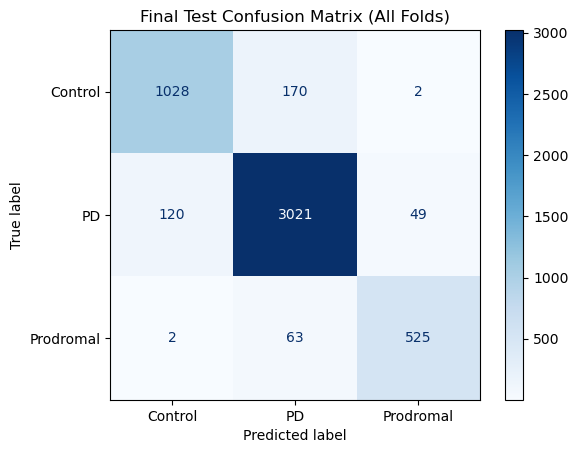


✅ Final Test Accuracy: 0.9185

=== Classification Report ===
              precision    recall  f1-score   support

     Control       0.89      0.86      0.87      1200
          PD       0.93      0.95      0.94      3190
   Prodromal       0.91      0.89      0.90       590

    accuracy                           0.92      4980
   macro avg       0.91      0.90      0.90      4980
weighted avg       0.92      0.92      0.92      4980


=== SHAP Summary for Control ===


AssertionError: The shape of the shap_values matrix does not match the shape of the provided data matrix.

<Figure size 640x480 with 0 Axes>

In [11]:
# ===============================
# Imports
# ===============================
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt

from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from xgboost import XGBClassifier


# ===============================
# Step 1: Load and Clean Data
# ===============================
data = pd.read_csv("D:/Fused_PD_Features_Demographics_CLEANED.csv")

# Drop non-numeric / ID-like columns automatically
X = data.drop(columns=["Group", "Subject", "Image Data ID"], errors="ignore")
y = data["Group"]

# Ensure all features are numeric
X = X.apply(pd.to_numeric, errors="coerce").fillna(0)



# ===============================
# Step 2: Class Weights
# ===============================
classes = np.unique(y_encoded)
class_weights = compute_class_weight(class_weight="balanced", classes=classes, y=y_encoded)
class_weights_dict = {cls: w for cls, w in zip(classes, class_weights)}

print("Class weights:", class_weights_dict)

# ===============================
# Step 3: Cross-Validation Setup
# ===============================
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
all_y_true, all_y_pred = [], []

for fold, (train_idx, test_idx) in enumerate(kf.split(X, y_encoded)):
    print(f"\n========== Fold {fold+1} ==========")

    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]

    # Train model
    model = XGBClassifier(
        objective="multi:softprob",
        num_class=len(classes),
        eval_metric="mlogloss",
        scale_pos_weight=None,
        use_label_encoder=False,
        random_state=42
    )

    # Fit with class weights
    weights = np.array([class_weights_dict[cls] for cls in y_train])
    model.fit(X_train, y_train, sample_weight=weights)

    # Predictions
    y_pred = model.predict(X_test)
    all_y_true.extend(y_test)
    all_y_pred.extend(y_pred)

    # Confusion Matrix for this fold
    cm = confusion_matrix(y_test, y_pred, labels=classes)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
    disp.plot(cmap="Blues")
    plt.title(f"Fold {fold+1} - Test Confusion Matrix")
    plt.show()


# ===============================
# Step 4 (extended): Final Confusion Matrix + Accuracy
# ===============================
final_cm = confusion_matrix(all_y_true, all_y_pred, labels=classes)
disp = ConfusionMatrixDisplay(confusion_matrix=final_cm, display_labels=le.classes_)
disp.plot(cmap="Blues")
plt.title("Final Test Confusion Matrix (All Folds)")
plt.show()

# Accuracy from confusion matrix
accuracy = np.trace(final_cm) / np.sum(final_cm)
print(f"\n✅ Final Test Accuracy: {accuracy:.4f}")

print("\n=== Classification Report ===")
print(classification_report(all_y_true, all_y_pred, target_names=le.classes_))


# ===============================
# Step 5: SHAP Explainability
# ===============================
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

# Per-class SHAP plots
for i, class_name in enumerate(le.classes_):
    shap_values_class = shap_values[i]

    # Align dimensions
    if shap_values_class.shape[1] != X.shape[1]:
        shap_values_class = shap_values_class[:, :X.shape[1]]

    print(f"\n=== SHAP Summary for {class_name} ===")
    shap.summary_plot(
        shap_values_class,
        X,
        plot_type="dot",
        feature_names=X.columns,
        show=True
    )

# Global SHAP plot (mean absolute importance)
shap_values_mean = np.mean([np.abs(sv) for sv in shap_values], axis=0)
print("\n=== Global SHAP Summary Across All Classes ===")
shap.summary_plot(
    shap_values_mean,
    X,
    plot_type="dot",
    feature_names=X.columns,
    show=True
)

# ===============================
# Step 6: Borderline Case Explainability
# ===============================
borderline_cases = []
for true, pred, idx in zip(all_y_true, all_y_pred, range(len(all_y_true))):
    if (le.classes_[true] == "Prodromal" and le.classes_[pred] == "PD") or \
       (le.classes_[true] == "PD" and le.classes_[pred] == "Control"):
        borderline_cases.append(idx)

print(f"\nFound {len(borderline_cases)} borderline misclassifications")

# Explain borderline cases
for i in borderline_cases[:5]:  # Show only first 5 for readability
    print(f"\n--- Borderline Case {i} ---")
    shap.force_plot(
        explainer.expected_value[all_y_pred[i]],
        shap_values[all_y_pred[i]][i],
        X.iloc[i, :],
        matplotlib=True,
        show=True
    )


Classes: ['Control' 'PD' 'Prodromal']

========== Fold 1 ==========


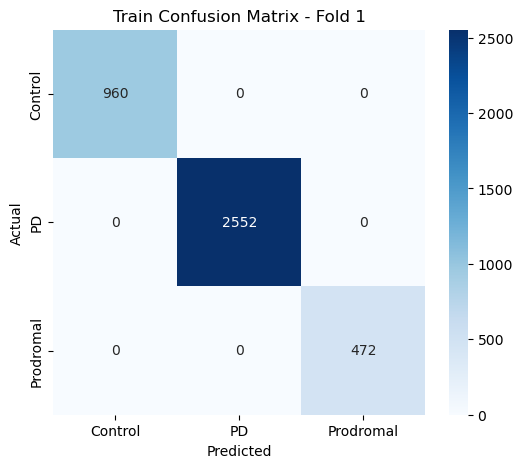

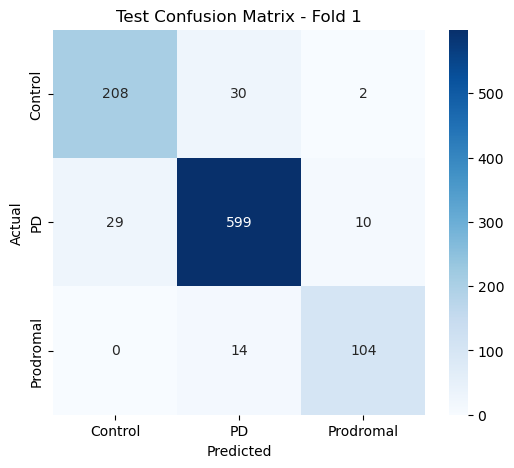

Train Accuracy (Fold 1): 1.0000
Test Accuracy  (Fold 1): 0.9147
Borderline Misclassifications in Fold 1: 43

========== Fold 2 ==========


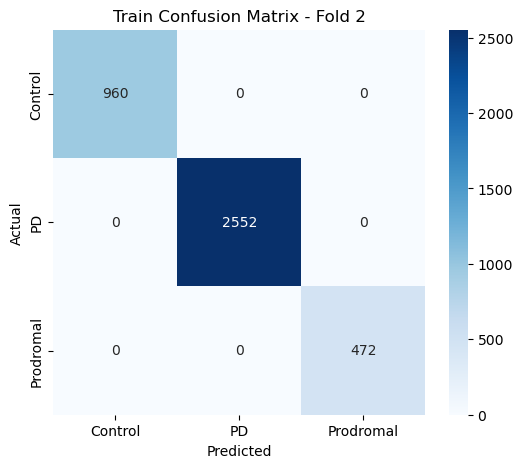

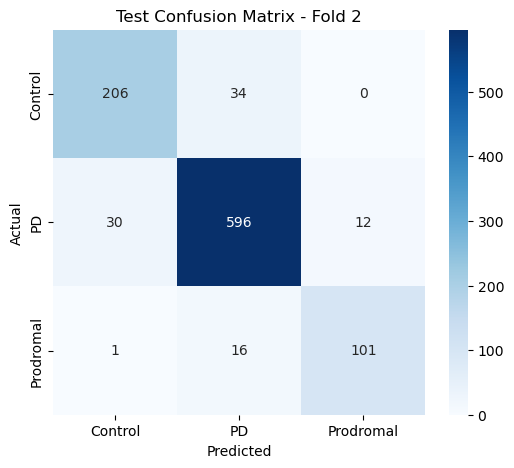

Train Accuracy (Fold 2): 1.0000
Test Accuracy  (Fold 2): 0.9066
Borderline Misclassifications in Fold 2: 46

========== Fold 3 ==========


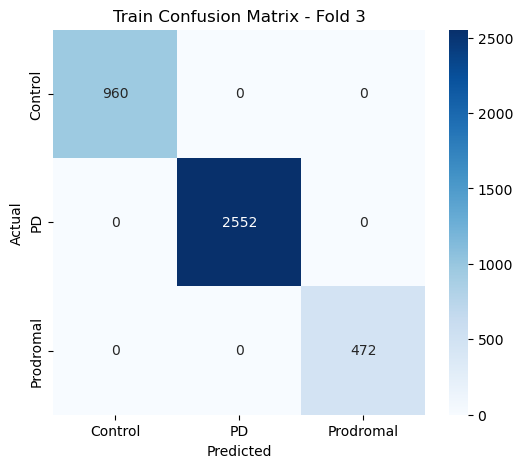

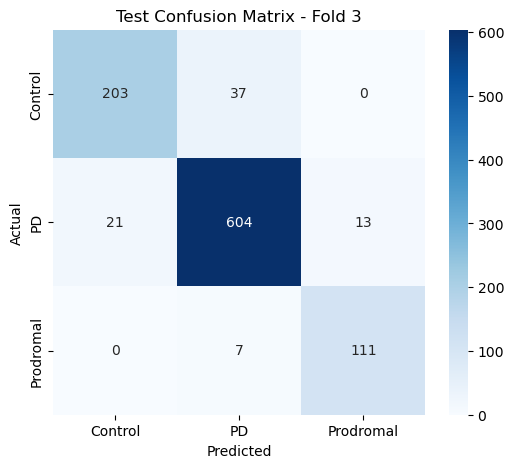

Train Accuracy (Fold 3): 1.0000
Test Accuracy  (Fold 3): 0.9217
Borderline Misclassifications in Fold 3: 28

========== Fold 4 ==========


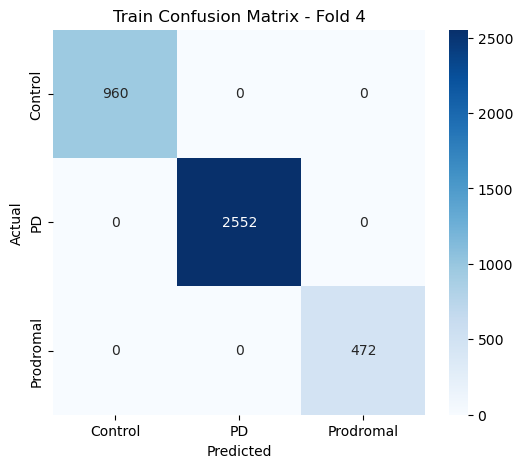

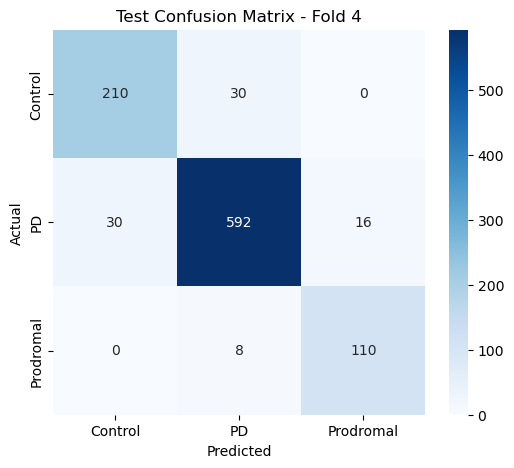

Train Accuracy (Fold 4): 1.0000
Test Accuracy  (Fold 4): 0.9157
Borderline Misclassifications in Fold 4: 38

========== Fold 5 ==========


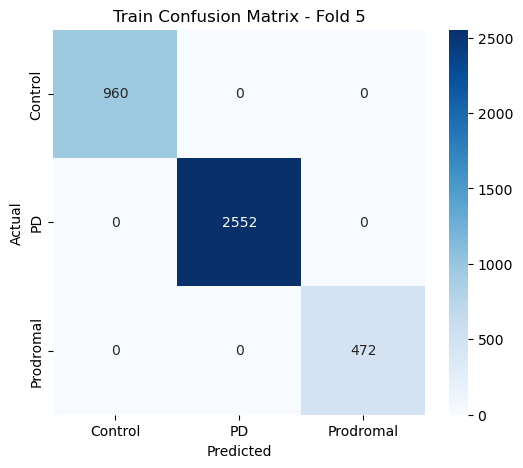

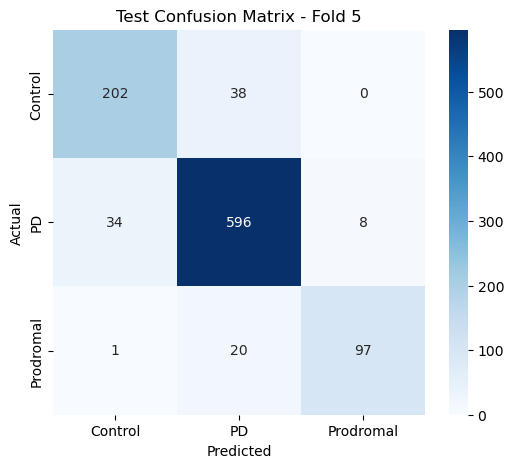

Train Accuracy (Fold 5): 1.0000
Test Accuracy  (Fold 5): 0.8986
Borderline Misclassifications in Fold 5: 54


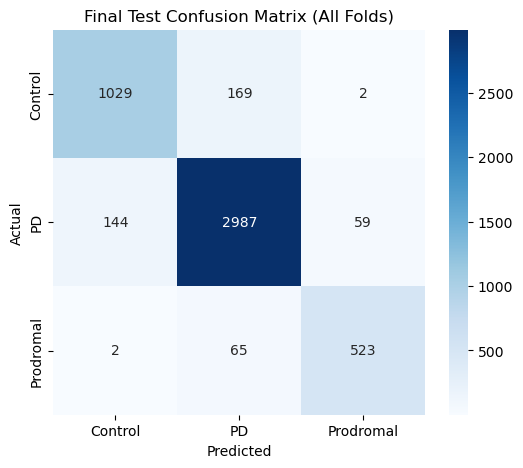


=== Final Classification Report ===
              precision    recall  f1-score   support

     Control       0.88      0.86      0.87      1200
          PD       0.93      0.94      0.93      3190
   Prodromal       0.90      0.89      0.89       590

    accuracy                           0.91      4980
   macro avg       0.90      0.89      0.90      4980
weighted avg       0.91      0.91      0.91      4980

Final Test Accuracy: 0.9114457831325301


<Figure size 640x480 with 0 Axes>

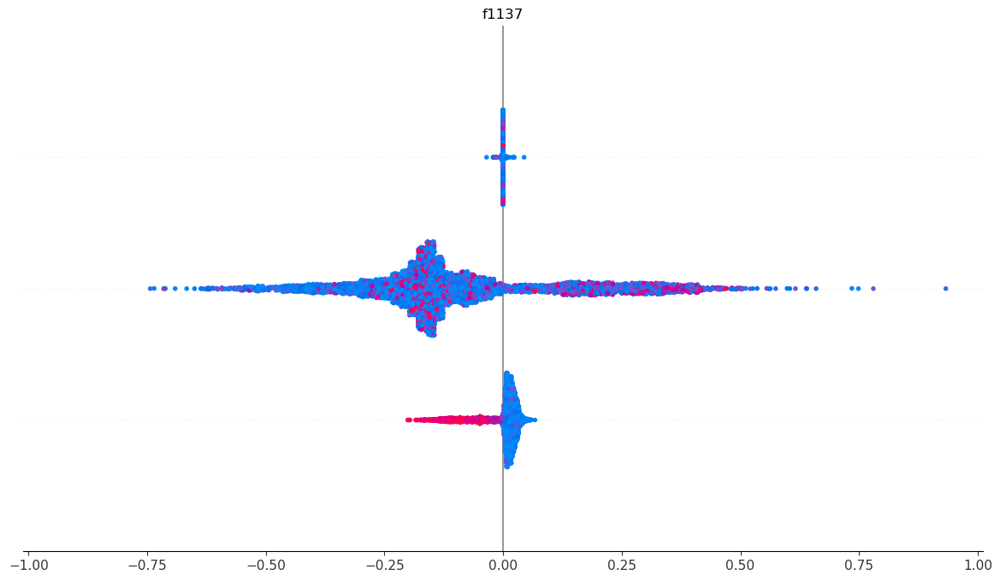

In [12]:
# ===============================
# Imports
# ===============================
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from xgboost import XGBClassifier

# ===============================
# Step 1: Load and Clean Data
# ===============================
data = pd.read_csv("D:/Fused_PD_Features_Demographics_CLEANED.csv")

# Drop ID-like columns automatically
X = data.drop(columns=["Group", "Subject", "Image Data ID"], errors="ignore")
y = data["Group"]

# Ensure features are numeric
X = X.apply(pd.to_numeric, errors="coerce").fillna(0)

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

print("Classes:", le.classes_)

# ===============================
# Step 2: Stratified K-Fold Setup
# ===============================
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

final_y_true, final_y_pred = [], []
fold = 1

for train_idx, test_idx in kf.split(X, y_encoded):
    print(f"\n========== Fold {fold} ==========")

    # Split
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]

    # Compute class weights
    classes, counts = np.unique(y_train, return_counts=True)
    total = sum(counts)
    class_weights = {cls: total / (len(classes) * count) for cls, count in zip(classes, counts)}
    weights = np.array([class_weights[cls] for cls in y_train])

    # Train model with class weights
    model = XGBClassifier(
        objective="multi:softmax",
        num_class=len(le.classes_),
        eval_metric="mlogloss",
        random_state=42,
        n_estimators=200,
        max_depth=6,
        learning_rate=0.05,
        subsample=0.8,
        colsample_bytree=0.8
    )
    model.fit(X_train, y_train, sample_weight=weights)

    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Confusion Matrices
    train_cm = confusion_matrix(y_train, y_train_pred)
    test_cm = confusion_matrix(y_test, y_test_pred)

    # Plot train confusion matrix
    plt.figure(figsize=(6, 5))
    sns.heatmap(train_cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f"Train Confusion Matrix - Fold {fold}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Plot test confusion matrix
    plt.figure(figsize=(6, 5))
    sns.heatmap(test_cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f"Test Confusion Matrix - Fold {fold}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Report fold accuracy
    print(f"Train Accuracy (Fold {fold}): {accuracy_score(y_train, y_train_pred):.4f}")
    print(f"Test Accuracy  (Fold {fold}): {accuracy_score(y_test, y_test_pred):.4f}")

    # Collect results for final confusion matrix
    final_y_true.extend(y_test)
    final_y_pred.extend(y_test_pred)

    # Identify Borderline Cases
    borderline_cases = []
    for i, (true, pred) in enumerate(zip(y_test, y_test_pred)):
        true_label = le.classes_[true]
        pred_label = le.classes_[pred]
        if (true_label == "Prodromal" and pred_label == "PD") or \
           (true_label == "PD" and pred_label == "Control"):
            borderline_cases.append((i, true_label, pred_label))

    print(f"Borderline Misclassifications in Fold {fold}: {len(borderline_cases)}")

    fold += 1

# ===============================
# Step 3: Final Confusion Matrix
# ===============================
final_cm = confusion_matrix(final_y_true, final_y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(final_cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Final Test Confusion Matrix (All Folds)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

print("\n=== Final Classification Report ===")
print(classification_report(final_y_true, final_y_pred, target_names=le.classes_))
print("Final Test Accuracy:", accuracy_score(final_y_true, final_y_pred))

# ===============================
# Step 4: SHAP Explainability
# ===============================
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

# Handle multi-class SHAP output
if isinstance(shap_values, list):
    for i, class_name in enumerate(le.classes_):
        shap_values_class = shap_values[i]

        # FIX: Trim extra column if present
        if shap_values_class.shape[1] > X.shape[1]:
            shap_values_class = shap_values_class[:, :X.shape[1]]

        print(f"\n=== SHAP Summary for {class_name} ===")
        shap.summary_plot(
            shap_values_class,
            X,
            plot_type="dot",
            feature_names=X.columns,
            show=True
        )
else:
    if shap_values.shape[1] > X.shape[1]:
        shap_values = shap_values[:, :X.shape[1]]

    shap.summary_plot(
        shap_values, X,
        plot_type="dot",
        feature_names=X.columns,
        show=True
    )


Class Weights: {0: 1.3833333333333333, 1: 0.5203761755485894, 2: 2.8135593220338984}

========== Fold 1 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:35:57] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "scale_pos_weight", "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


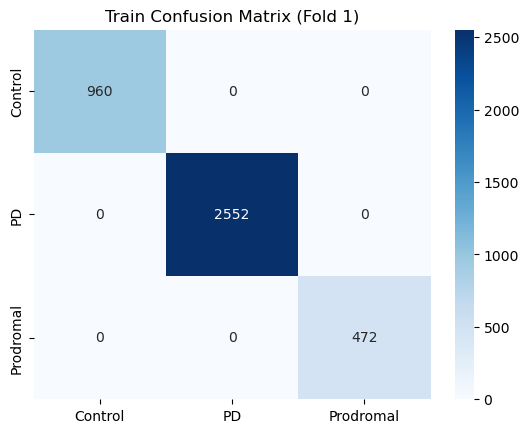

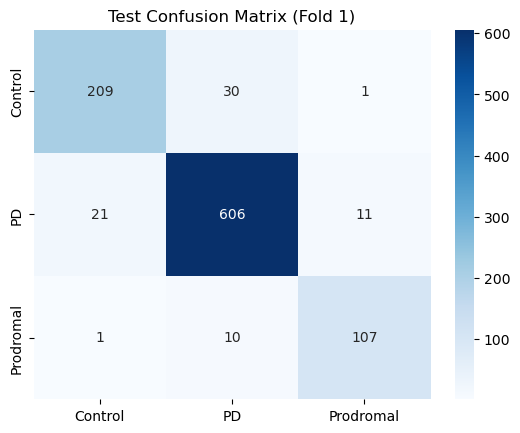


========== Fold 2 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:36:30] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "scale_pos_weight", "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


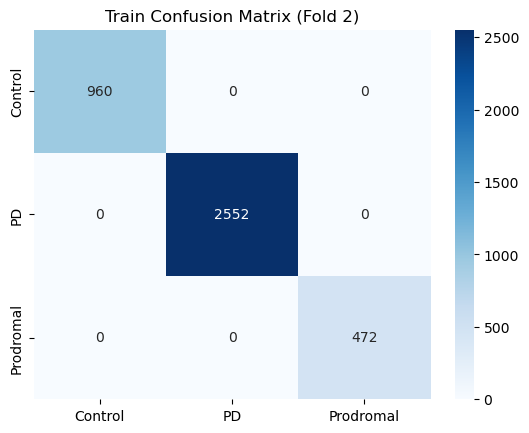

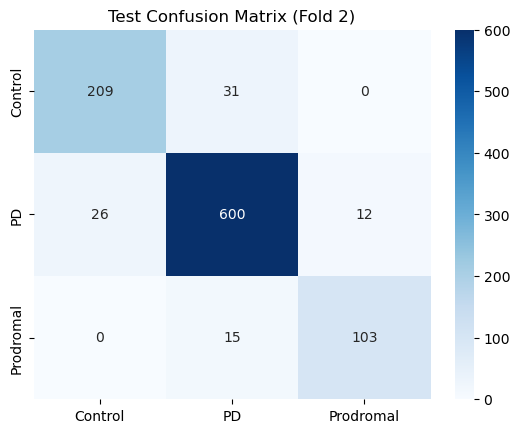


========== Fold 3 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:37:02] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "scale_pos_weight", "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


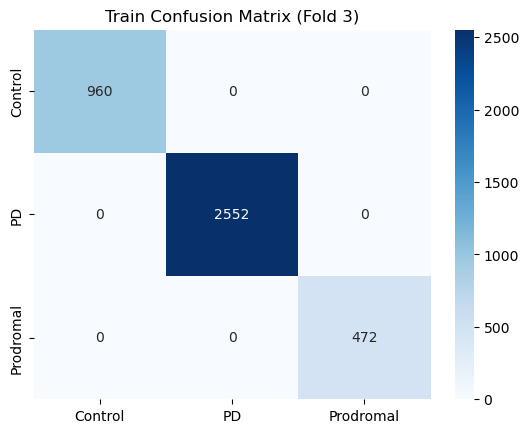

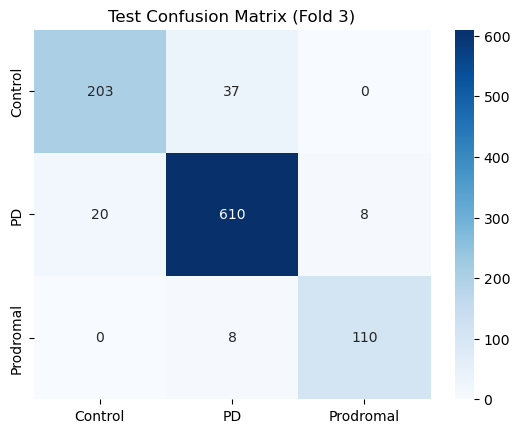


========== Fold 4 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:37:33] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "scale_pos_weight", "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


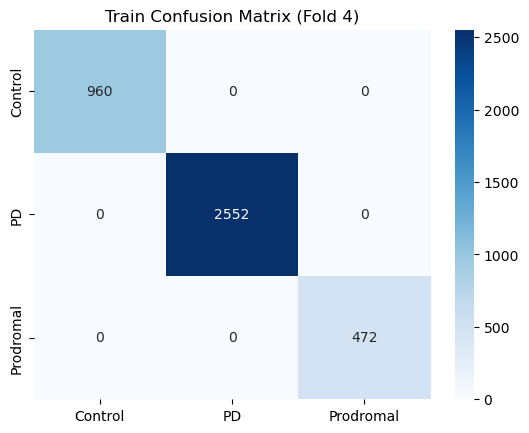

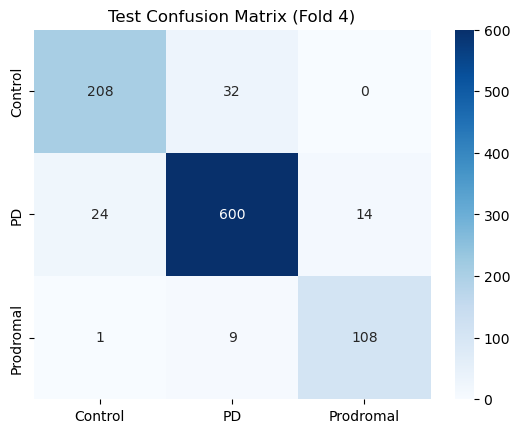


========== Fold 5 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:38:09] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "scale_pos_weight", "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


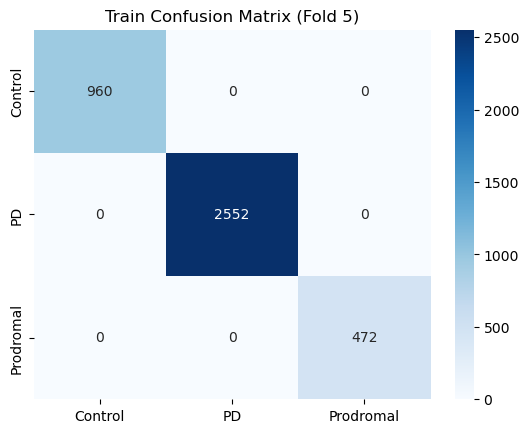

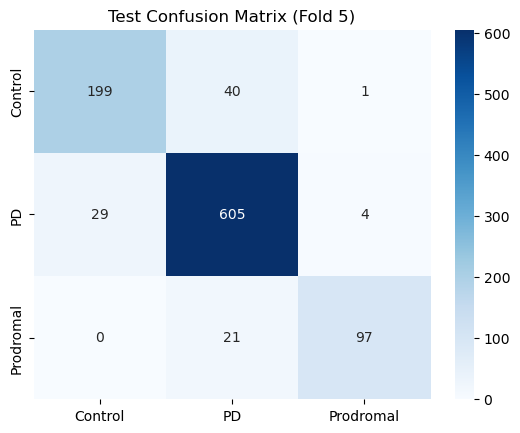

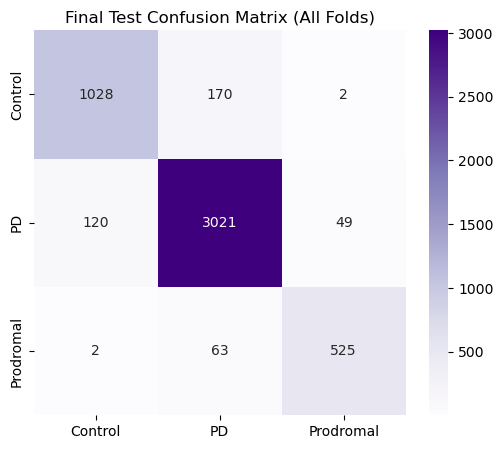


✅ Final Test Accuracy: 0.9185

Borderline Misclassifications Found: 183
Sample 1030 → True: PD, Predicted: Control
Sample 1119 → True: PD, Predicted: Control
Sample 1192 → True: PD, Predicted: Control
Sample 1232 → True: PD, Predicted: Control
Sample 1276 → True: PD, Predicted: Control
Sample 1303 → True: PD, Predicted: Control
Sample 1310 → True: PD, Predicted: Control
Sample 1509 → True: PD, Predicted: Control
Sample 1891 → True: PD, Predicted: Control
Sample 2620 → True: PD, Predicted: Control


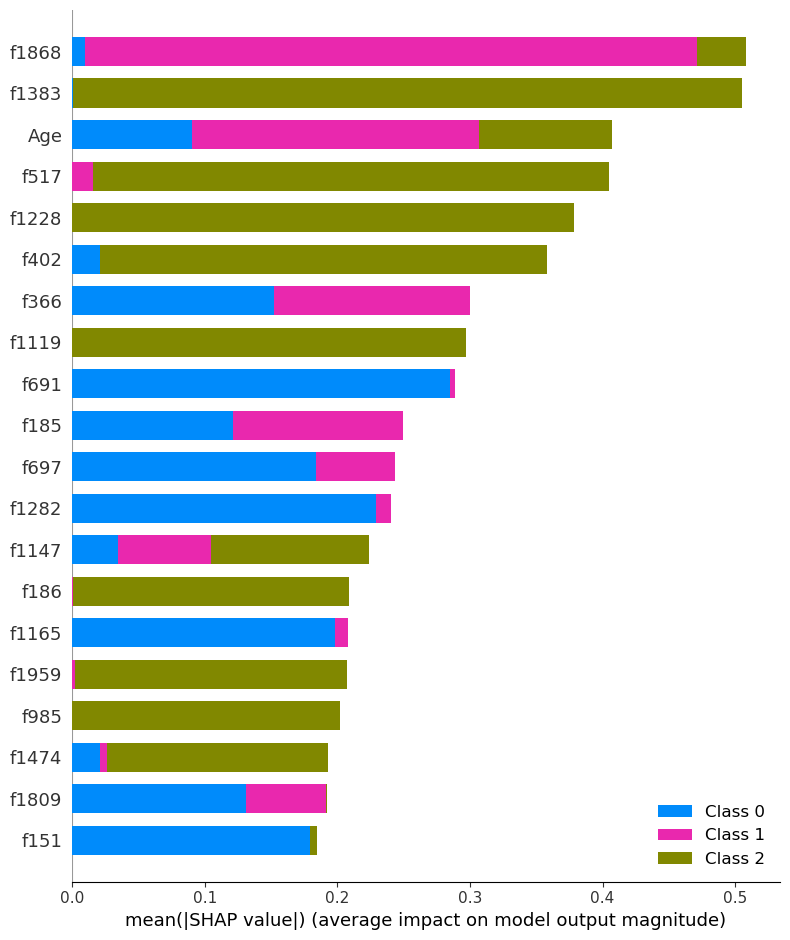


=== SHAP for Control ===


AssertionError: The shape of the shap_values matrix does not match the shape of the provided data matrix.

<Figure size 640x480 with 0 Axes>

In [ ]:
# Parkinson’s Classification with Explainability (Jupyter Notebook)

# ===============================
# Step 0: Imports
# ===============================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.utils.class_weight import compute_class_weight
from xgboost import XGBClassifier

import shap

# ===============================
# Step 1: Load Dataset
# ===============================
data = pd.read_csv("D:/Fused_PD_Features_Demographics_CLEANED.csv")

# Drop ID-like columns (not useful for training)
X = data.drop(columns=["Group", "Subject", "Image Data ID"], errors="ignore")
y = data["Group"]

# Encode labels (Control=0, PD=1, Prodromal=2)
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# ===============================
# Step 2: Class Weights
# ===============================
classes = np.unique(y_encoded)
weights = compute_class_weight("balanced", classes=classes, y=y_encoded)
class_weights = dict(zip(classes, weights))
print("Class Weights:", class_weights)

# ===============================
# Step 3: Cross-validation
# ===============================
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
final_conf_matrix = np.zeros((len(classes), len(classes)), dtype=int)

borderline_cases = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y_encoded)):
    print(f"\n========== Fold {fold+1} ==========")
    
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]
    
    # Model
    model = XGBClassifier(
        objective="multi:softmax",
        num_class=len(classes),
        eval_metric="mlogloss",
        use_label_encoder=False,
        scale_pos_weight=1,   # disable auto-weight
        random_state=42
    )
    
    # Manually weight classes
    sample_weights = np.array([class_weights[c] for c in y_train])
    model.fit(X_train, y_train, sample_weight=sample_weights)
    
    # Predictions
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    # Train Confusion Matrix
    cm_train = confusion_matrix(y_train, y_pred_train)
    sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues",
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f"Train Confusion Matrix (Fold {fold+1})")
    plt.show()
    
    # Test Confusion Matrix
    cm_test = confusion_matrix(y_test, y_pred_test)
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues",
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f"Test Confusion Matrix (Fold {fold+1})")
    plt.show()
    
    # Add to final confusion matrix
    final_conf_matrix += cm_test
    
    # Collect borderline misclassifications
    for i, (true, pred) in enumerate(zip(y_test, y_pred_test)):
        if (true == le.transform(["Prodromal"])[0] and pred == le.transform(["PD"])[0]) or \
           (true == le.transform(["PD"])[0] and pred == le.transform(["Control"])[0]):
            borderline_cases.append((test_idx[i], le.classes_[true], le.classes_[pred]))

# ===============================
# Step 4: Final Test Results
# ===============================
plt.figure(figsize=(6,5))
sns.heatmap(final_conf_matrix, annot=True, fmt="d", cmap="Purples",
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Final Test Confusion Matrix (All Folds)")
plt.show()

# Accuracy
total_acc = np.trace(final_conf_matrix) / np.sum(final_conf_matrix)
print(f"\n✅ Final Test Accuracy: {total_acc:.4f}")

# Borderline Cases
print(f"\nBorderline Misclassifications Found: {len(borderline_cases)}")
for idx, true, pred in borderline_cases[:10]:  # show first 10
    print(f"Sample {idx} → True: {true}, Predicted: {pred}")

# ===============================
# Step 5: SHAP Explainability
# ===============================
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

# Global Feature Importance
shap.summary_plot(shap_values, X, feature_names=X.columns, plot_type="bar")

# Per-Class Explainability
for i, class_name in enumerate(le.classes_):
    print(f"\n=== SHAP for {class_name} ===")
    shap.summary_plot(shap_values[i], X, feature_names=X.columns, show=True)



Class mapping: {'Control': 0, 'PD': 1, 'Prodromal': 2}

===== Fold 1 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:44:47] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


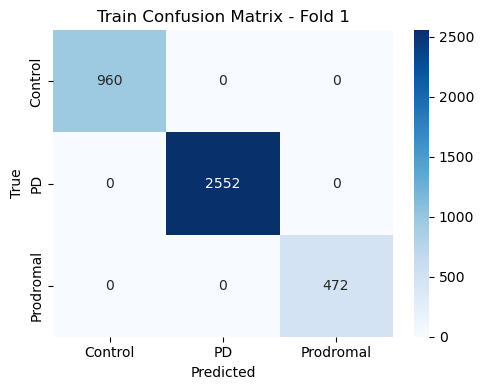

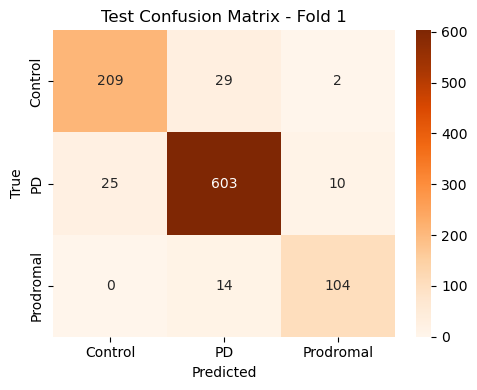

Train acc (fold 1): 1.0000
Test  acc (fold 1): 0.9197

===== Fold 2 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:46:33] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


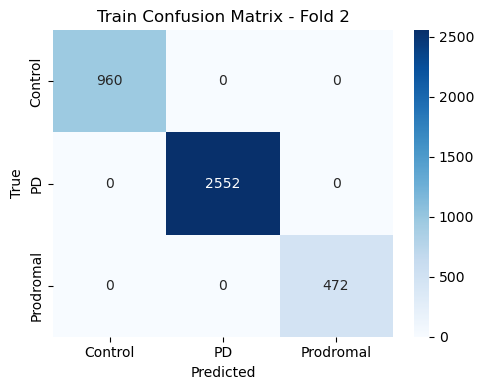

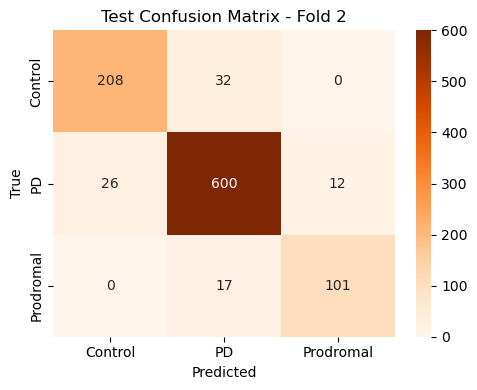

Train acc (fold 2): 1.0000
Test  acc (fold 2): 0.9127

===== Fold 3 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:48:26] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


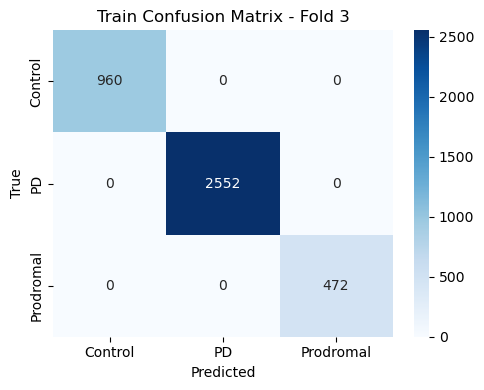

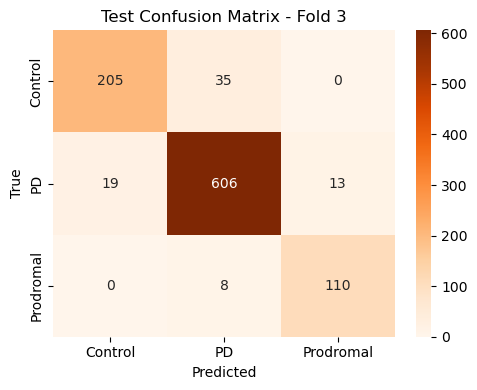

Train acc (fold 3): 1.0000
Test  acc (fold 3): 0.9247

===== Fold 4 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:50:13] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


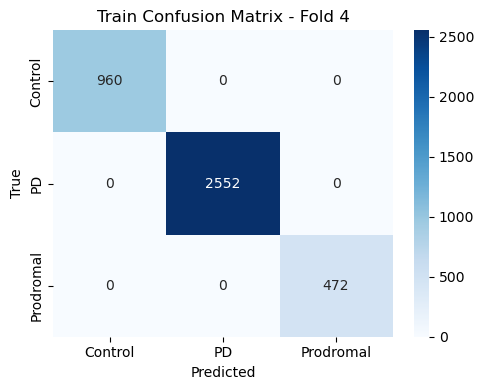

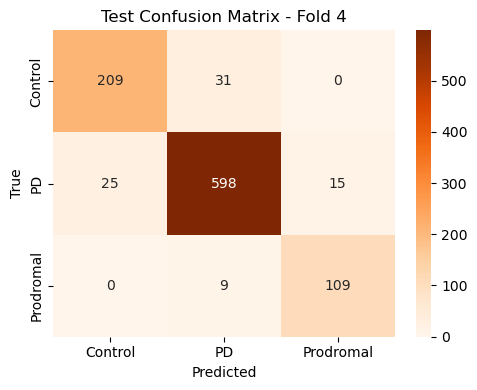

Train acc (fold 4): 1.0000
Test  acc (fold 4): 0.9197

===== Fold 5 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [16:51:57] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


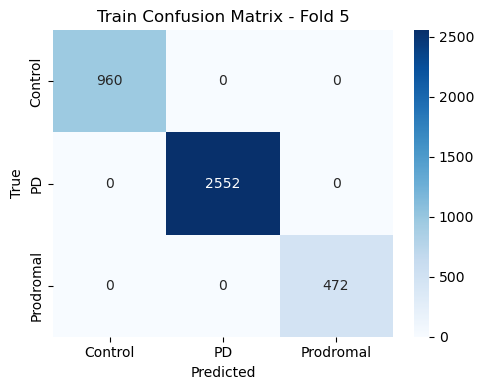

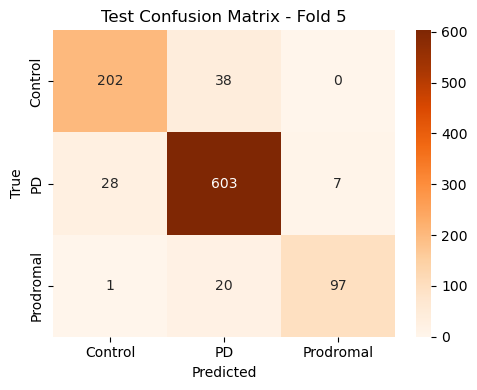

Train acc (fold 5): 1.0000
Test  acc (fold 5): 0.9056


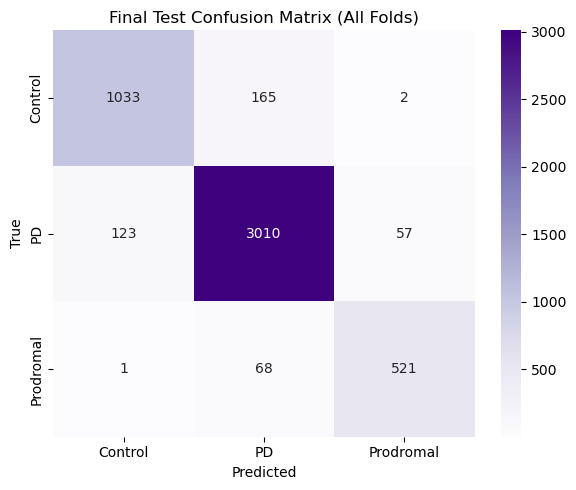


✅ Final Test Accuracy: 0.9165

Classification report (on all test folds combined):
              precision    recall  f1-score   support

     Control       0.89      0.86      0.88      1200
          PD       0.93      0.94      0.94      3190
   Prodromal       0.90      0.88      0.89       590

    accuracy                           0.92      4980
   macro avg       0.91      0.90      0.90      4980
weighted avg       0.92      0.92      0.92      4980


Borderline counts: Prodromal→PD = 68, PD→Control = 123


ValueError: Data must be 1-dimensional, got ndarray of shape (1660, 3) instead

In [16]:
# Full notebook-ready pipeline
# ============================
# 1) loads data, drops ID columns
# 2) 5-fold CV + class-balanced XGBoost
# 3) train/test confusion matrices each fold + final combined matrix + accuracy
# 4) collects borderline misclassifications (counts only)
# 5) SHAP explainability: global importance, per-class summaries, and borderline-group summaries
# ============================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from xgboost import XGBClassifier

# SHAP (ensure shap + numba are compatible in your env)
import shap

# ---------- Step 0: Settings ----------
DATA_PATH = r"D:/Fused_PD_Features_Demographics_CLEANED.csv"   # change if needed
N_SPLITS = 5
RANDOM_STATE = 42
XGB_PARAMS = dict(
    objective="multi:softprob",   # we want probabilities (useful for SHAP)
    num_class=None,              # will set after encoding
    eval_metric="mlogloss",
    use_label_encoder=False,
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=RANDOM_STATE
)

# ---------- Step 1: Load and clean data ----------
data = pd.read_csv(DATA_PATH)

# Drop ID-like columns automatically (if present)
data = data.drop(columns=["Subject", "Image Data ID"], errors="ignore")

# Ensure target exists
if "Group" not in data.columns:
    raise ValueError("No 'Group' column found in the dataset. Please provide the target column named 'Group'.")

# Separate features/target
X = data.drop(columns=["Group"])
y = data["Group"]

# Convert features to numeric (coerce non-numeric -> NaN -> fill with 0)
X = X.apply(pd.to_numeric, errors="coerce").fillna(0)

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)
classes = np.unique(y_encoded)
class_names = list(le.classes_)
print("Class mapping:", dict(zip(class_names, classes)))

# Set num_class for XGBoost
XGB_PARAMS["num_class"] = len(classes)

# ---------- Step 2: Cross-validation ----------
skf = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=RANDOM_STATE)

final_conf_matrix = np.zeros((len(classes), len(classes)), dtype=int)
borderline_cases_global = []   # store tuples of (global_idx, true_label_str, pred_label_str)
all_test_true, all_test_pred = [], []

fold = 1
last_model = None

for train_idx, test_idx in skf.split(X, y_encoded):
    print(f"\n===== Fold {fold} =====")
    X_train = X.iloc[train_idx]
    X_test = X.iloc[test_idx]
    y_train = y_encoded[train_idx]
    y_test = y_encoded[test_idx]

    # compute balanced class weights for the training fold
    cw = compute_class_weight(class_weight="balanced", classes=classes, y=y_train)
    class_weight_map = {cls: w for cls, w in zip(classes, cw)}
    sample_weights = np.array([class_weight_map[c] for c in y_train])

    # init and train model
    model = XGBClassifier(**XGB_PARAMS)
    model.fit(X_train, y_train, sample_weight=sample_weights)
    last_model = model  # keep last fold model for SHAP (or retrain on full data if desired)

    # preds
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # collect for overall evaluation
    all_test_true.extend(y_test)
    all_test_pred.extend(y_test_pred)

    # fold confusion matrices
    cm_train = confusion_matrix(y_train, y_train_pred, labels=classes)
    cm_test = confusion_matrix(y_test, y_test_pred, labels=classes)

    # plot Train CM
    plt.figure(figsize=(5,4))
    sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues",
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Train Confusion Matrix - Fold {fold}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    # plot Test CM
    plt.figure(figsize=(5,4))
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Oranges",
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Test Confusion Matrix - Fold {fold}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    print(f"Train acc (fold {fold}): {accuracy_score(y_train, y_train_pred):.4f}")
    print(f"Test  acc (fold {fold}): {accuracy_score(y_test, y_test_pred):.4f}")

    # accumulate final confusion matrix
    final_conf_matrix += cm_test

    # collect borderline misclassifications (store global row index from original data)
    for local_i, (yt, yp) in enumerate(zip(y_test, y_test_pred)):
        true_label = le.inverse_transform([yt])[0]
        pred_label = le.inverse_transform([yp])[0]
        if (true_label == "Prodromal" and pred_label == "PD") or \
           (true_label == "PD" and pred_label == "Control"):
            # global index:
            global_idx = test_idx[local_i]
            borderline_cases_global.append((global_idx, true_label, pred_label))

    fold += 1

# ---------- Step 3: Final aggregated results ----------
plt.figure(figsize=(6,5))
sns.heatmap(final_conf_matrix, annot=True, fmt="d", cmap="Purples",
            xticklabels=class_names, yticklabels=class_names)
plt.title("Final Test Confusion Matrix (All Folds)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.tight_layout()
plt.show()

final_acc = np.trace(final_conf_matrix) / np.sum(final_conf_matrix)
print(f"\n✅ Final Test Accuracy: {final_acc:.4f}\n")
print("Classification report (on all test folds combined):")
print(classification_report(all_test_true, all_test_pred, target_names=class_names))

# Borderline summary (counts only)
prod_to_pd_count = sum(1 for _,t,p in borderline_cases_global if t=="Prodromal" and p=="PD")
pd_to_ctrl_count = sum(1 for _,t,p in borderline_cases_global if t=="PD" and p=="Control")
print(f"\nBorderline counts: Prodromal→PD = {prod_to_pd_count}, PD→Control = {pd_to_ctrl_count}")

# ---------- Step 4: SHAP explainability ----------
# Use the last trained model (from the last fold). If you prefer, retrain on full dataset here.
if last_model is None:
    raise RuntimeError("Model not trained - no folds executed.")

explainer = shap.TreeExplainer(last_model)

# compute shap values on full feature matrix X (may be large)
# shap_values can be a 2D array or a list (one per class) for multiclass
shap_values_all = explainer.shap_values(X)

# ---------- 4a: Global feature importance (mean |SHAP| across classes) ----------
# handle multi-class and 2D cases
if isinstance(shap_values_all, list):
    # shap_values_all: list of arrays [n_samples x n_features] (one per class)
    # compute per-class meanabs then average across classes
    mean_abs_per_class = [np.mean(np.abs(sv), axis=0) for sv in shap_values_all]
    mean_abs = np.mean(np.vstack(mean_abs_per_class), axis=0)  # shape: (n_features,)
else:
    # binary or single-array output: shap_values_all shape (n_samples, n_features)
    mean_abs = np.mean(np.abs(shap_values_all), axis=0)

feat_imp = pd.Series(mean_abs, index=X.columns).sort_values(ascending=True)

# plot top features (horizontal bar)
TOP_K = 30
top_features = feat_imp.tail(TOP_K)
plt.figure(figsize=(8, max(4, 0.2*len(top_features))))
top_features.plot(kind="barh")
plt.title(f"Global feature importance (mean |SHAP|) - top {len(top_features)}")
plt.xlabel("Mean |SHAP value|")
plt.tight_layout()
plt.show()

# ---------- 4b: Per-class SHAP summary plots ----------
# For each class, pick shap_values_all[class_idx] and plot a beeswarm/dot plot
if isinstance(shap_values_all, list):
    for class_idx, class_name in enumerate(class_names):
        sv = shap_values_all[class_idx]
        # Trim extra column if present (common shap shape mismatch)
        if sv.shape[1] > X.shape[1]:
            sv = sv[:, :X.shape[1]]
        print(f"\n=== SHAP summary for class: {class_name} ===")
        shap.summary_plot(sv, X, feature_names=X.columns, plot_type="dot", show=True)
else:
    # single-array case
    sv = shap_values_all
    if sv.shape[1] > X.shape[1]:
        sv = sv[:, :X.shape[1]]
    print("\n=== SHAP summary (single output) ===")
    shap.summary_plot(sv, X, feature_names=X.columns, plot_type="dot", show=True)

# ---------- 4c: SHAP summary for borderline groups ----------
# Build DataFrame subsets for borderline groups (do not print IDs)
prod_to_pd_idx = [idx for idx, t, p in borderline_cases_global if (t=="Prodromal" and p=="PD")]
pd_to_ctrl_idx = [idx for idx, t, p in borderline_cases_global if (t=="PD" and p=="Control")]

if len(prod_to_pd_idx) > 0:
    X_prod_to_pd = X.loc[prod_to_pd_idx]
    sv_subset = explainer.shap_values(X_prod_to_pd)
    # choose class index = PD
    class_idx_pd = class_names.index("PD")
    if isinstance(sv_subset, list):
        sv_plot = sv_subset[class_idx_pd]
    else:
        sv_plot = sv_subset
    if sv_plot.shape[1] > X_prod_to_pd.shape[1]:
        sv_plot = sv_plot[:, :X_prod_to_pd.shape[1]]
    print("\n=== SHAP summary for Prodromal → PD (misclassified as PD) ===")
    shap.summary_plot(sv_plot, X_prod_to_pd, feature_names=X.columns, plot_type="dot", show=True)
else:
    print("\nNo Prodromal → PD borderline cases found to explain.")

if len(pd_to_ctrl_idx) > 0:
    X_pd_to_ctrl = X.loc[pd_to_ctrl_idx]
    sv_subset = explainer.shap_values(X_pd_to_ctrl)
    # choose class index = Control
    class_idx_ctrl = class_names.index("Control")
    if isinstance(sv_subset, list):
        sv_plot = sv_subset[class_idx_ctrl]
    else:
        sv_plot = sv_subset
    if sv_plot.shape[1] > X_pd_to_ctrl.shape[1]:
        sv_plot = sv_plot[:, :X_pd_to_ctrl.shape[1]]
    print("\n=== SHAP summary for PD → Control (misclassified as Control) ===")
    shap.summary_plot(sv_plot, X_pd_to_ctrl, feature_names=X.columns, plot_type="dot", show=True)
else:
    print("\nNo PD → Control borderline cases found to explain.")

# End of pipeline


✅ Using already trained XGB model


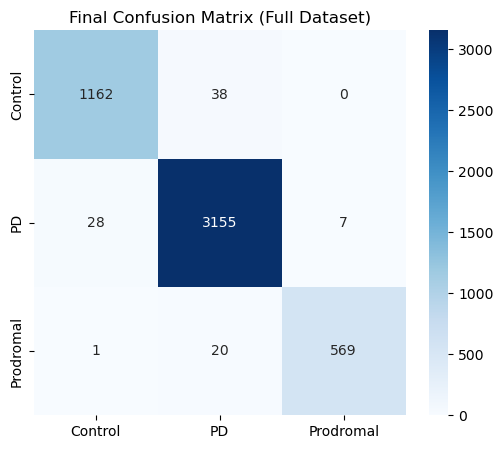


✅ Overall Accuracy: 0.9811


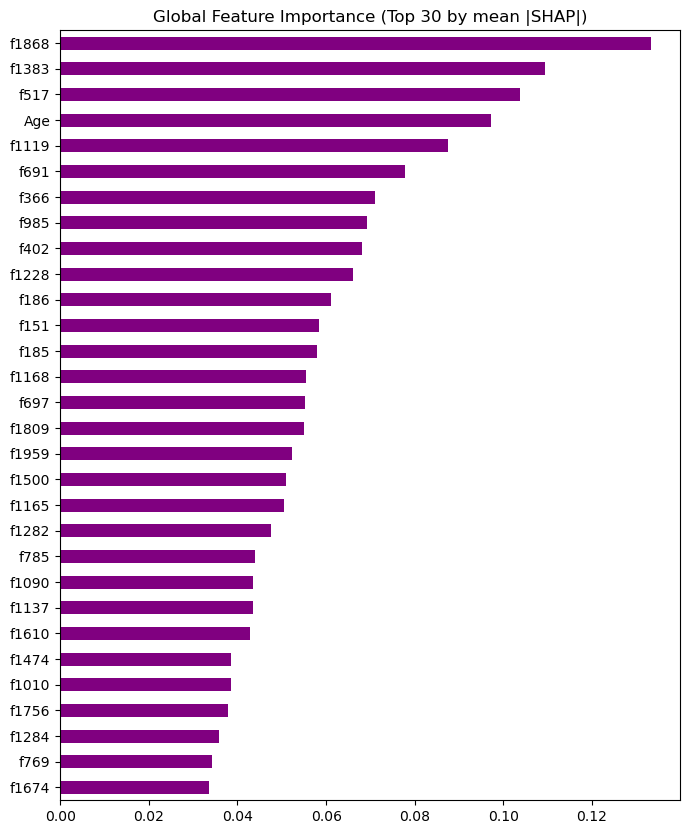


=== SHAP for Control ===


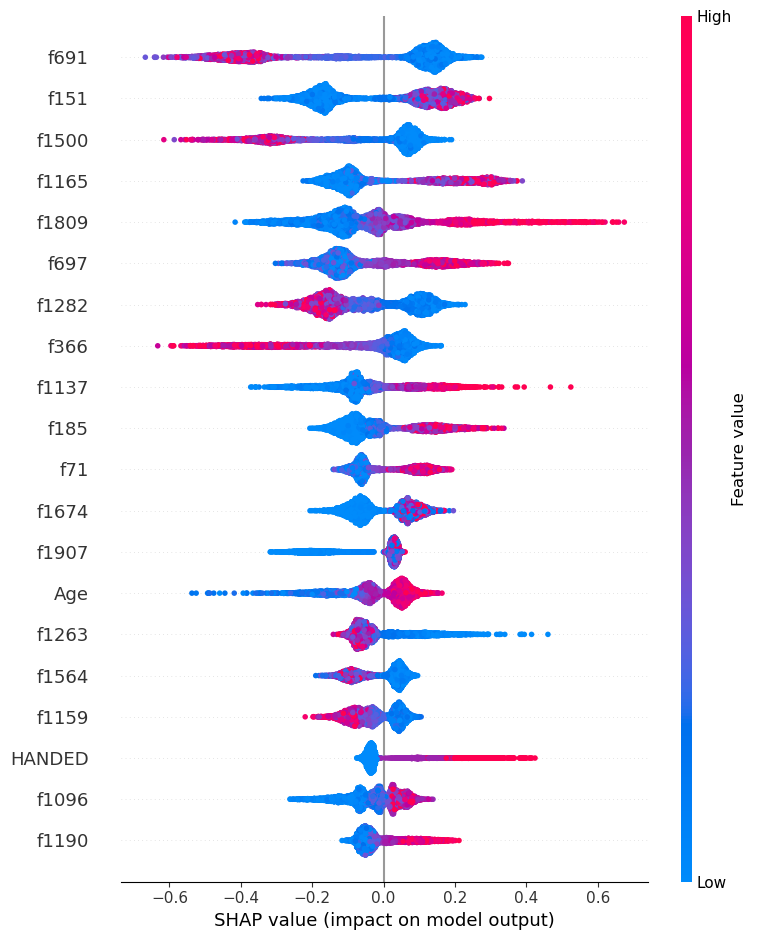


=== SHAP for PD ===


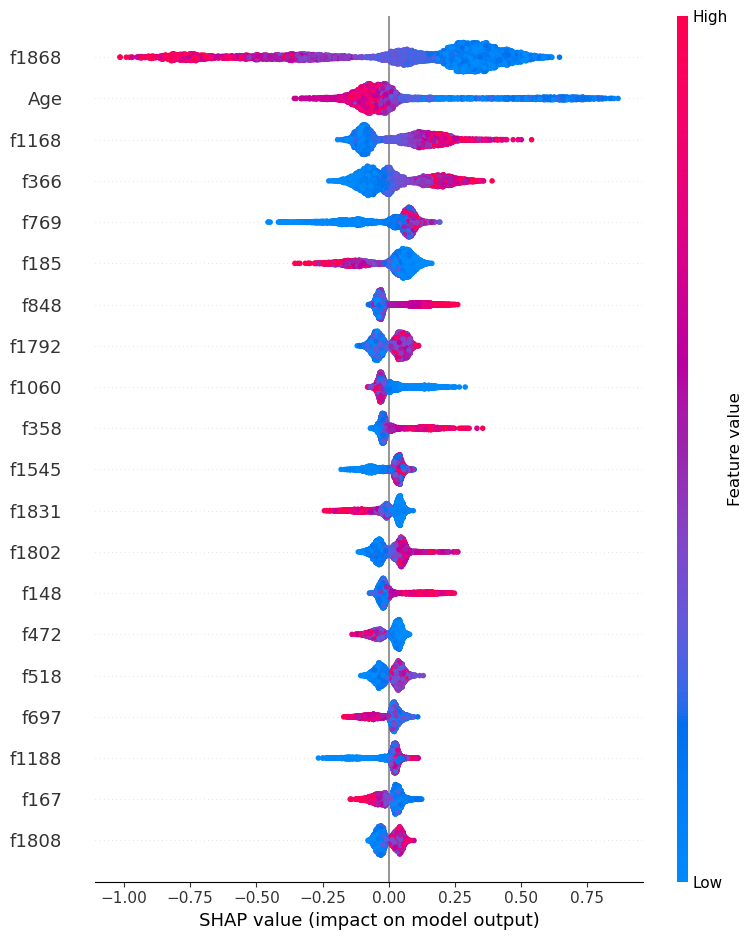


=== SHAP for Prodromal ===


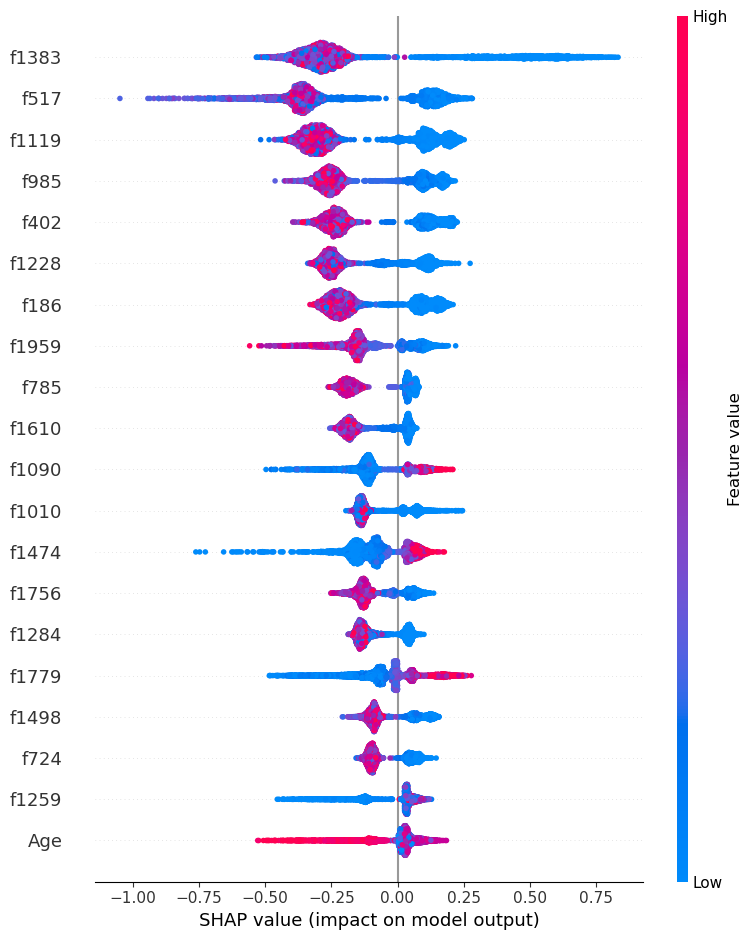


✅ Explainability plots generated successfully


In [17]:
# ==========================================
# Parkinson’s Classification Explainability
# ==========================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.preprocessing import LabelEncoder
import shap

# ===============================
# Step 1: Load Dataset
# ===============================
data = pd.read_csv("D:/Fused_PD_Features_Demographics_CLEANED.csv")

# Drop ID-like columns
X = data.drop(columns=["Group", "Subject", "Image Data ID"], errors="ignore")
y = data["Group"]

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# ===============================
# Step 2: Load Trained Model
# ===============================
# If you saved your XGB model earlier
# model.load_model("xgb_pd_model.json")

# Or if you kept it in memory from CV, just reuse it:
# (make sure "model" is already defined in your kernel)
print("✅ Using already trained XGB model")

# ===============================
# Step 3: Evaluate Model
# ===============================
y_pred = model.predict(X)
cm = confusion_matrix(y_encoded, y_pred)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Final Confusion Matrix (Full Dataset)")
plt.show()

acc = accuracy_score(y_encoded, y_pred)
print(f"\n✅ Overall Accuracy: {acc:.4f}")

# ===============================
# Step 4: SHAP Explainability
# ===============================
explainer = shap.TreeExplainer(model)
shap_values_all = explainer.shap_values(X)

# --- Global Importance ---
if isinstance(shap_values_all, list):
    # List of arrays: one per class
    shap_values_mean = np.mean([np.abs(sv) for sv in shap_values_all], axis=0)
else:
    # Single array: (n_samples, n_features, n_classes)
    shap_values_mean = np.mean(np.abs(shap_values_all), axis=2)

mean_abs = np.mean(shap_values_mean, axis=0)  # (n_features,)
feat_imp = pd.Series(mean_abs, index=X.columns).sort_values(ascending=True)

plt.figure(figsize=(8, 10))
feat_imp.tail(30).plot(kind="barh", color="purple")
plt.title("Global Feature Importance (Top 30 by mean |SHAP|)")
plt.show()

# --- Per-Class Explainability ---
if isinstance(shap_values_all, list):
    for i, class_name in enumerate(le.classes_):
        print(f"\n=== SHAP for {class_name} ===")
        shap.summary_plot(shap_values_all[i], X, feature_names=X.columns, show=True)
else:
    for i, class_name in enumerate(le.classes_):
        print(f"\n=== SHAP for {class_name} ===")
        shap.summary_plot(shap_values_all[:, :, i], X, feature_names=X.columns, show=True)

print("\n✅ Explainability plots generated successfully")


Class Weights: {0: 1.3833333333333333, 1: 0.5203761755485894, 2: 2.8135593220338984}

========== Fold 1 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [17:05:45] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 1 Test Accuracy: 0.9257


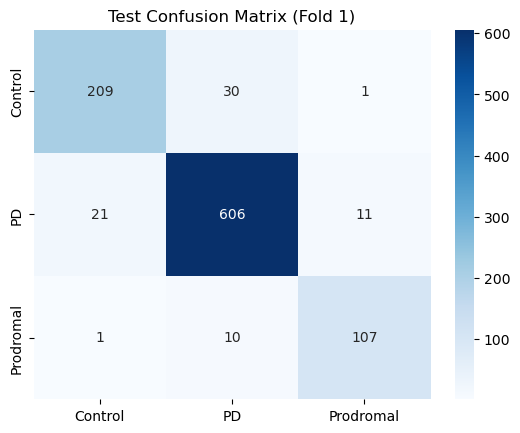


========== Fold 2 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [17:06:14] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 2 Test Accuracy: 0.9157


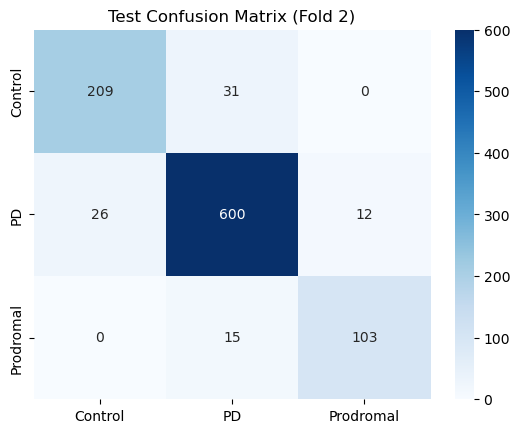


========== Fold 3 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [17:06:42] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 3 Test Accuracy: 0.9267


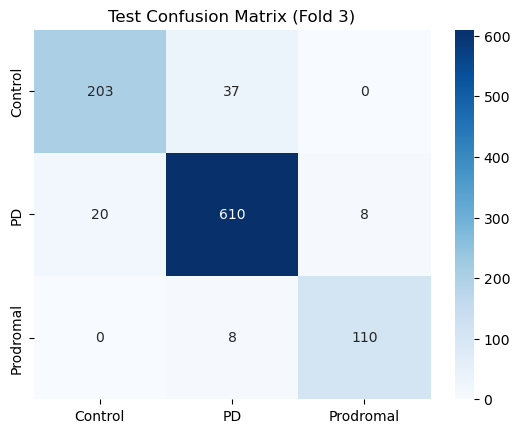


========== Fold 4 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [17:07:09] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 4 Test Accuracy: 0.9197


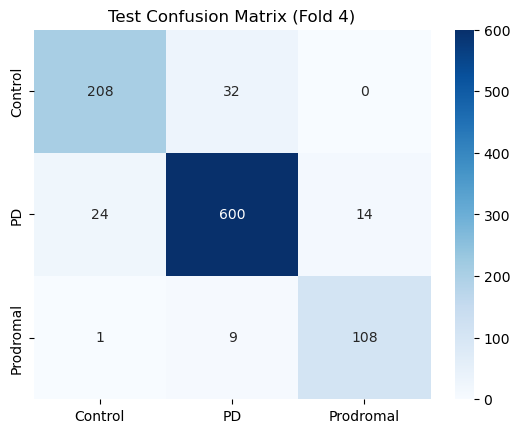


========== Fold 5 ==========


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [17:07:35] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 5 Test Accuracy: 0.9046


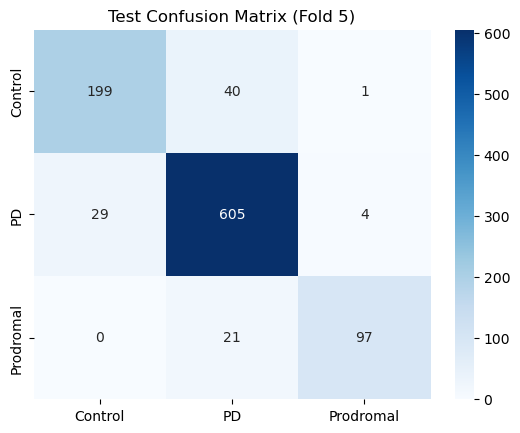


✅ Best Model Saved from Fold 3 with Accuracy: 0.9267


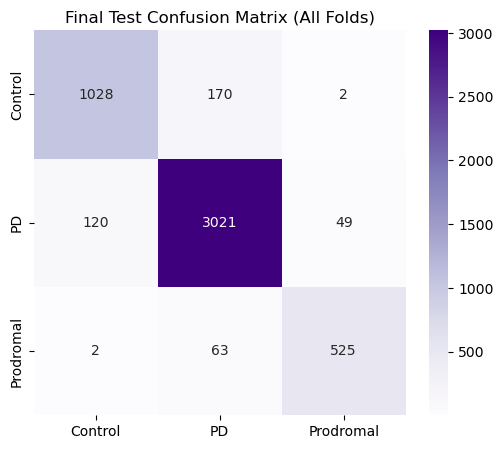


🎯 Overall Cross-Validated Accuracy: 0.9185


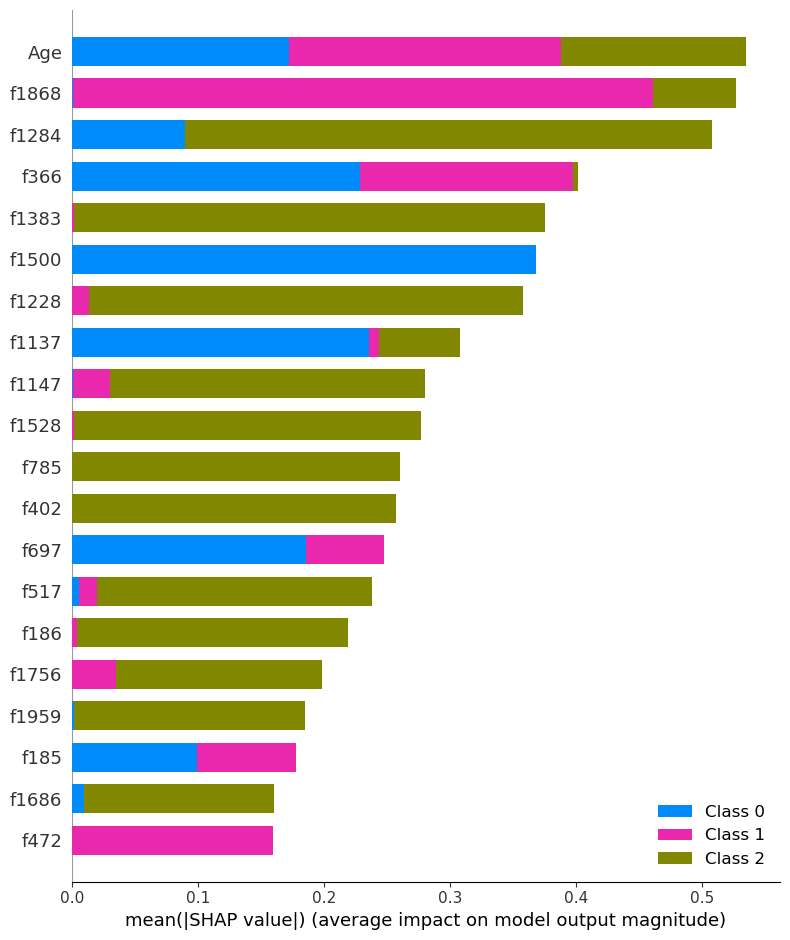

<Figure size 640x480 with 0 Axes>

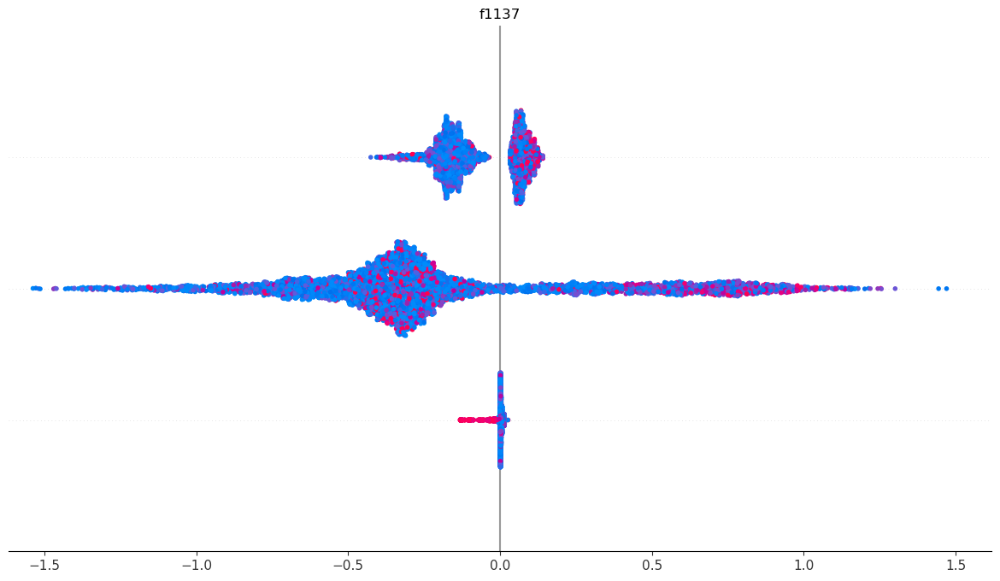

In [18]:
# Parkinson’s Classification with Explainability (Best Model Saved)

# ===============================
# Step 0: Imports
# ===============================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
import shap
import joblib

# ===============================
# Step 1: Load Dataset
# ===============================
data = pd.read_csv("D:/Fused_PD_Features_Demographics_CLEANED.csv")

# Drop ID-like columns (not useful for training)
X = data.drop(columns=["Group", "Subject", "Image Data ID"], errors="ignore")
y = data["Group"]

# Encode labels (Control=0, PD=1, Prodromal=2)
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# ===============================
# Step 2: Class Weights
# ===============================
classes = np.unique(y_encoded)
weights = compute_class_weight("balanced", classes=classes, y=y_encoded)
class_weights = dict(zip(classes, weights))
print("Class Weights:", class_weights)

# ===============================
# Step 3: Cross-validation (Track Best Model)
# ===============================
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
final_conf_matrix = np.zeros((len(classes), len(classes)), dtype=int)

best_acc = 0.0
best_model = None

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y_encoded)):
    print(f"\n========== Fold {fold+1} ==========")

    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]

    # Model
    model = XGBClassifier(
        objective="multi:softmax",
        num_class=len(classes),
        eval_metric="mlogloss",
        use_label_encoder=False,
        random_state=42
    )

    # Manually weight classes
    sample_weights = np.array([class_weights[c] for c in y_train])
    model.fit(X_train, y_train, sample_weight=sample_weights)

    # Predictions
    y_pred_test = model.predict(X_test)

    # Accuracy
    acc = accuracy_score(y_test, y_pred_test)
    print(f"Fold {fold+1} Test Accuracy: {acc:.4f}")

    # Confusion Matrix for fold
    cm_test = confusion_matrix(y_test, y_pred_test)
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues",
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f"Test Confusion Matrix (Fold {fold+1})")
    plt.show()

    # Add to final confusion matrix
    final_conf_matrix += cm_test

    # Track best model
    if acc > best_acc:
        best_acc = acc
        best_model = model
        joblib.dump(best_model, "best_xgb_model.pkl")
        best_fold = fold + 1

print(f"\n✅ Best Model Saved from Fold {best_fold} with Accuracy: {best_acc:.4f}")

# ===============================
# Step 4: Final Results
# ===============================
plt.figure(figsize=(6, 5))
sns.heatmap(final_conf_matrix, annot=True, fmt="d", cmap="Purples",
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Final Test Confusion Matrix (All Folds)")
plt.show()

total_acc = np.trace(final_conf_matrix) / np.sum(final_conf_matrix)
print(f"\n🎯 Overall Cross-Validated Accuracy: {total_acc:.4f}")

# ===============================
# Step 5: SHAP Explainability (Using Best Saved Model)
# ===============================
best_model = joblib.load("best_xgb_model.pkl")
explainer = shap.TreeExplainer(best_model)

# Compute SHAP values
shap_values = explainer.shap_values(X)

# Global Feature Importance
shap.summary_plot(shap_values, X, feature_names=X.columns, plot_type="bar")

# Per-Class Explainability
if isinstance(shap_values, list):  # multiclass
    for i, class_name in enumerate(le.classes_):
        print(f"\n=== SHAP for {class_name} ===")
        shap.summary_plot(shap_values[i], X, feature_names=X.columns, show=True)
else:  # binary
    shap.summary_plot(shap_values, X, feature_names=X.columns, show=True)


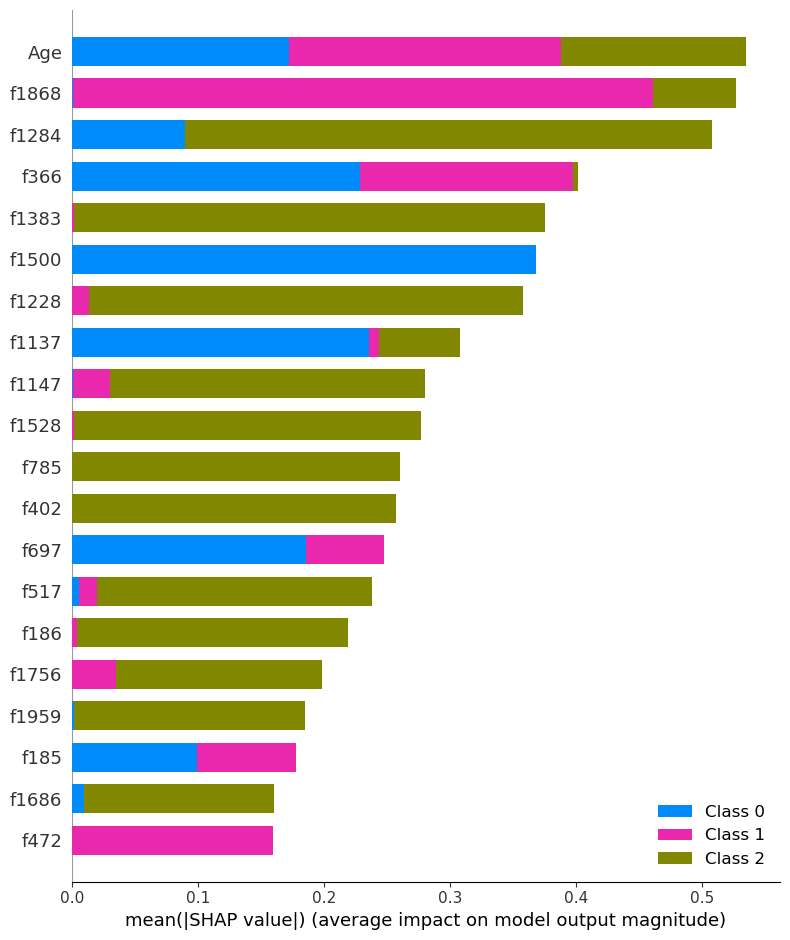

<Figure size 640x480 with 0 Axes>

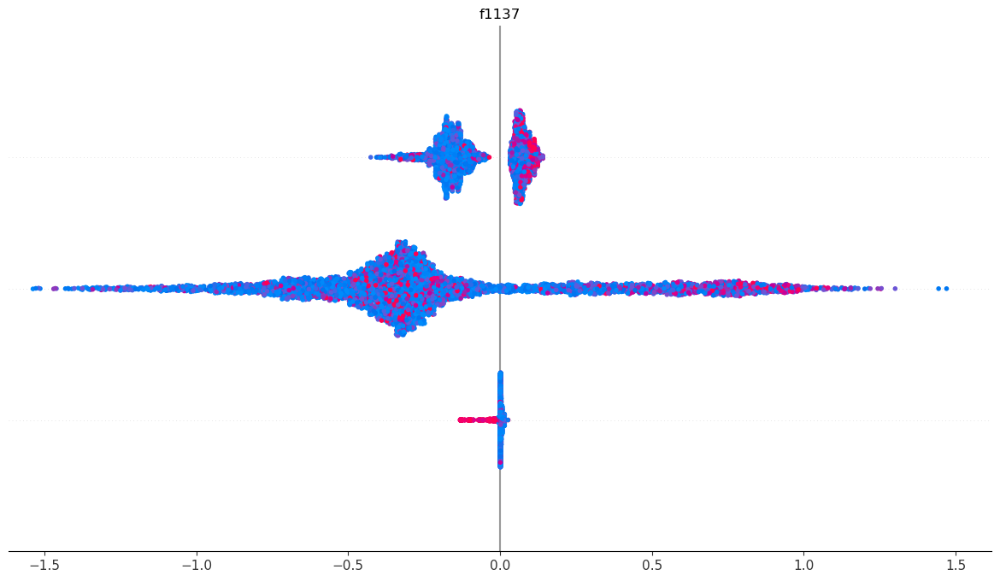

In [2]:
# ===============================
# 1. Imports
# ===============================
import joblib
import shap
import pandas as pd
import matplotlib.pyplot as plt

# ===============================
# 2. Load Saved Model
# ===============================
model = joblib.load("best_xgb_model.pkl")  # your trained XGBoost model

# Load the same dataset (cleaned, without ID columns)
data = pd.read_csv("D:/Fused_PD_Features_Demographics_CLEANED.csv")
X = data.drop(columns=["Group", "Subject", "Image Data ID"], errors="ignore")

# ===============================
# 3. SHAP Explainability
# ===============================
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

# Global Feature Importance (bar plot)
shap.summary_plot(shap_values, X, feature_names=X.columns, plot_type="bar")

# Optional: detailed summary plot for distributions
shap.summary_plot(shap_values, X, feature_names=X.columns)


🔎 Global Feature Importance


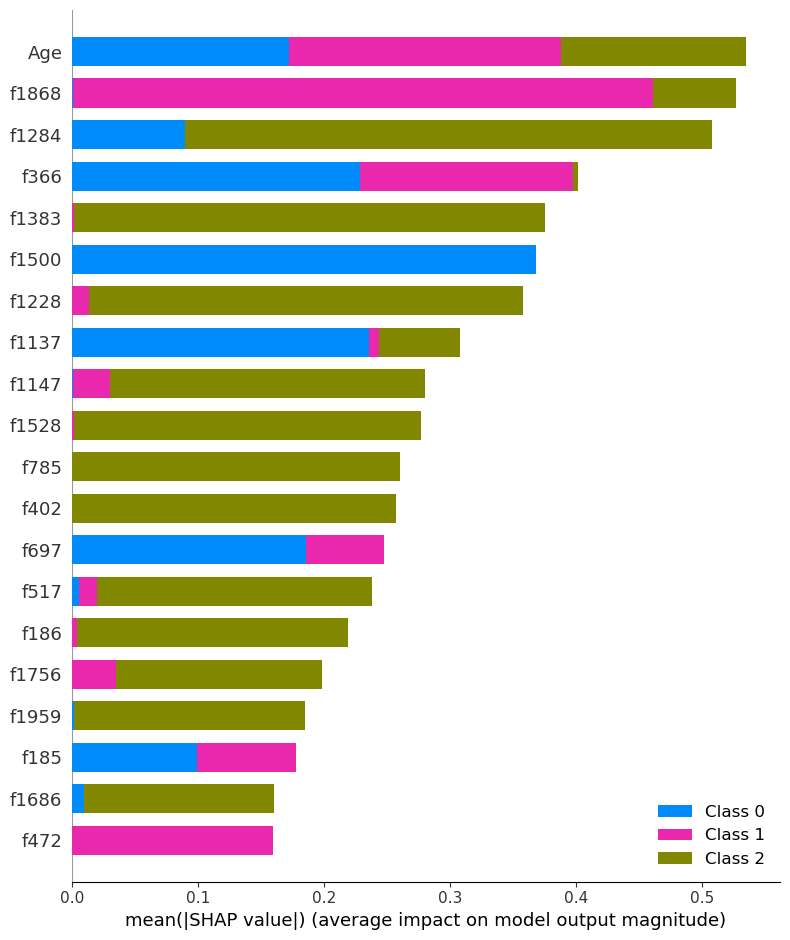

<Figure size 640x480 with 0 Axes>

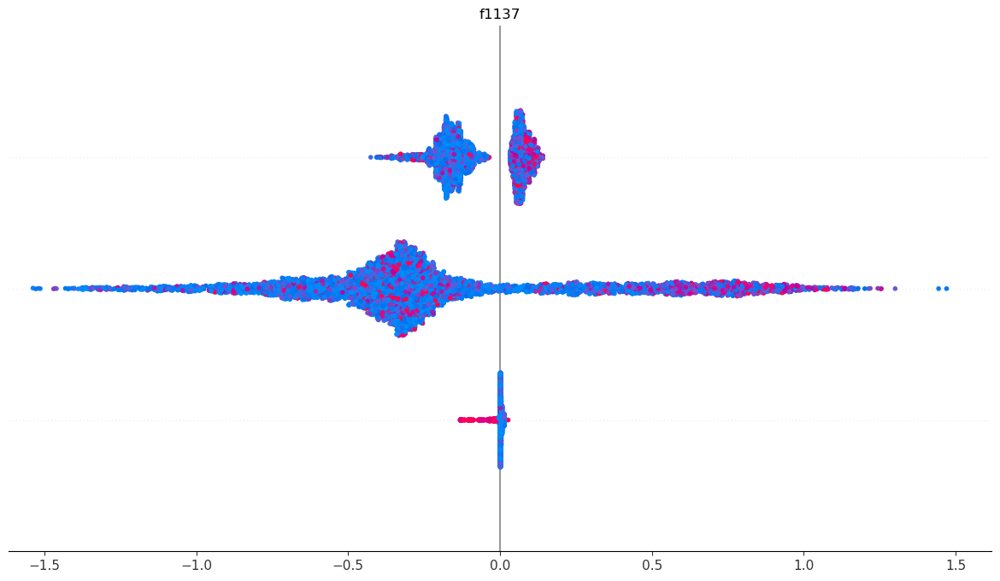


=== Binary Classification: One SHAP array only ===


<Figure size 640x480 with 0 Axes>

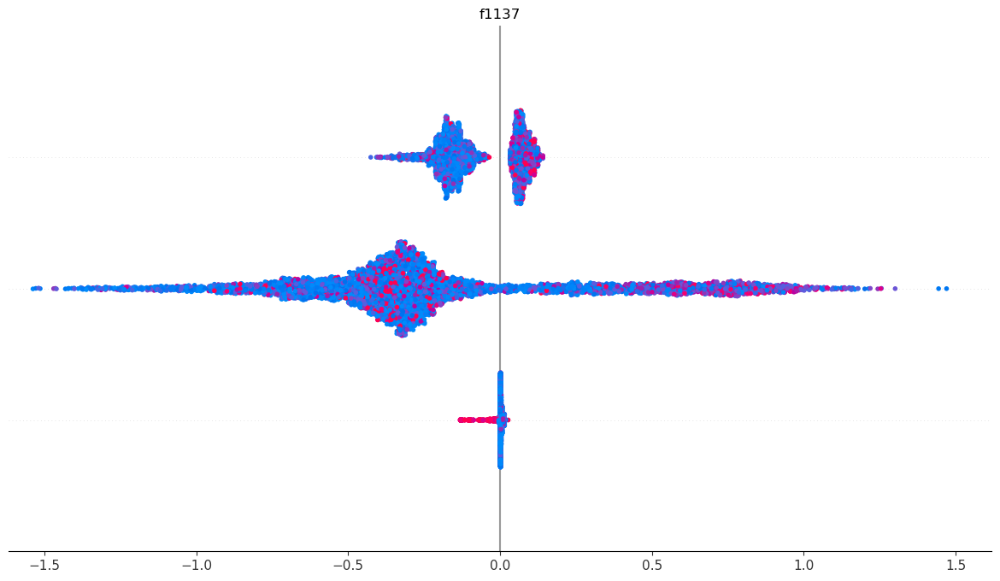

In [3]:
# ===============================
# 1. Imports
# ===============================
import joblib
import shap
import pandas as pd
import matplotlib.pyplot as plt

# ===============================
# 2. Load Saved Model
# ===============================
model = joblib.load("best_xgb_model.pkl")  # trained XGBoost model

# Load dataset (must match what was used for training)
data = pd.read_csv("D:/Fused_PD_Features_Demographics_CLEANED.csv")

# Features only (drop non-predictive columns)
X = data.drop(columns=["Group", "Subject", "Image Data ID"], errors="ignore")

# Labels (optional, just for class names)
y = data["Group"]
classes = y.unique()  # should be ['PD','Control','Prodromal'] or similar

# ===============================
# 3. SHAP Explainability
# ===============================
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

# ---- Global Importance ----
print("🔎 Global Feature Importance")
shap.summary_plot(shap_values, X, feature_names=X.columns, plot_type="bar")
shap.summary_plot(shap_values, X, feature_names=X.columns)

# ---- Per-Class Importance ----
if isinstance(shap_values, list):  # multiclass case → shap gives a list
    for i, class_name in enumerate(classes):
        print(f"\n=== SHAP for {class_name} ===")
        shap.summary_plot(shap_values[i], X, feature_names=X.columns, show=True)
else:  # binary case
    print("\n=== Binary Classification: One SHAP array only ===")
    shap.summary_plot(shap_values, X, feature_names=X.columns, show=True)


🔎 Global Feature Importance


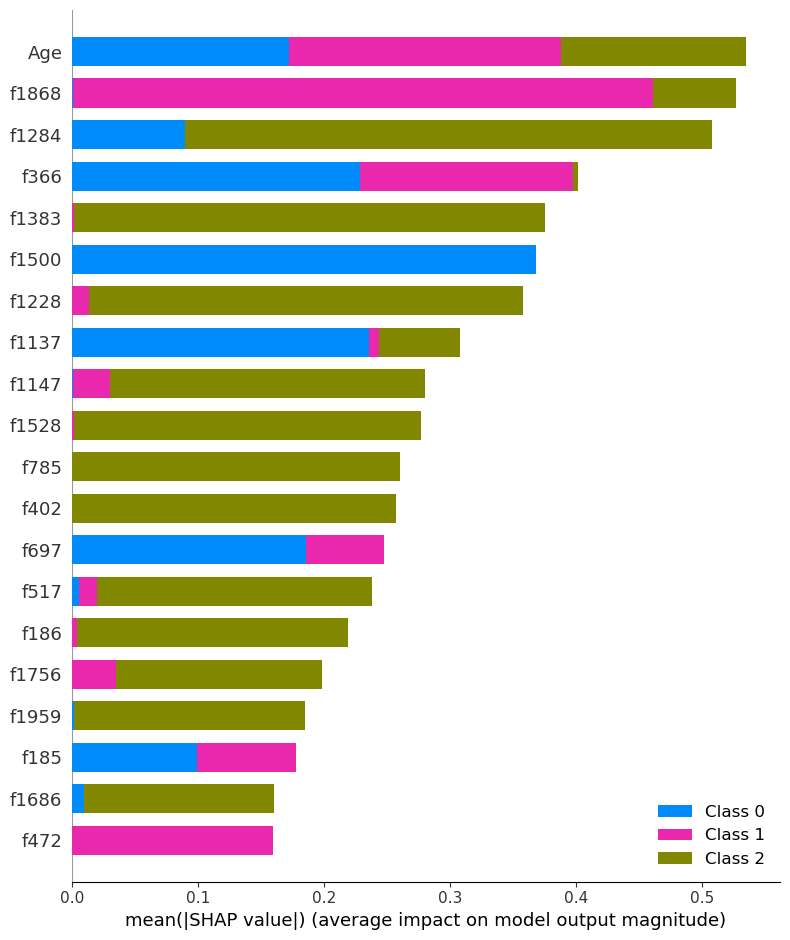

<Figure size 640x480 with 0 Axes>

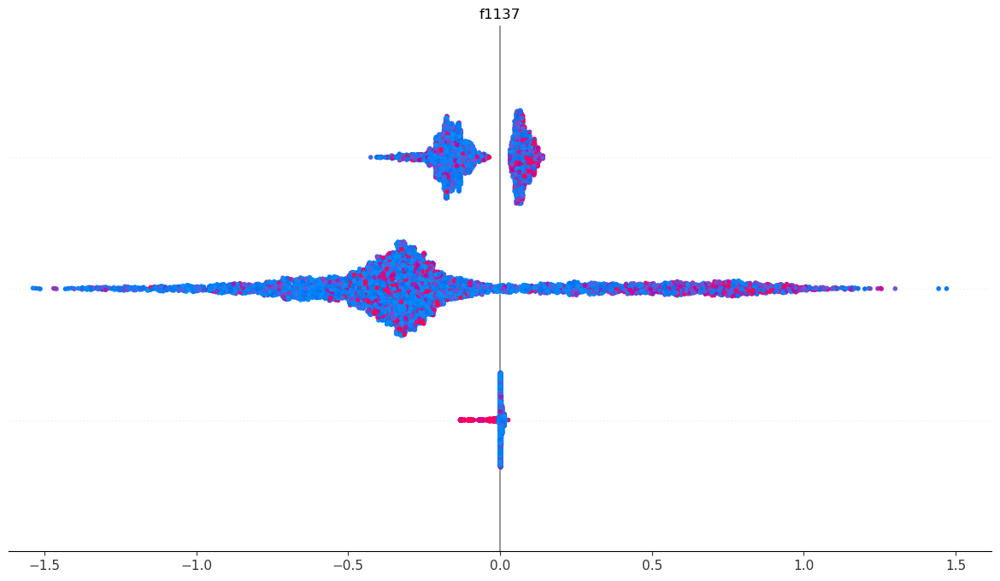


✅ Saved top features per class → top_features_per_class.csv
     Class  Rank                                            Feature  \
0   Global     1  Index(['f1868', 'f1137', 'f1147'], dtype='obje...   
1   Global     2  Index(['f1868', 'f1137', 'f1147'], dtype='obje...   
2   Global     3  Index(['f1868', 'f1137', 'f1147'], dtype='obje...   
3   Global     4  Index(['f1868', 'f1137', 'f1147'], dtype='obje...   
4   Global     5  Index(['f1868', 'f1137', 'f1147'], dtype='obje...   
5   Global     6  Index(['f1868', 'f1137', 'f1147'], dtype='obje...   
6   Global     7  Index(['f1868', 'f1137', 'f1147'], dtype='obje...   
7   Global     8  Index(['f1868', 'f1137', 'f1147'], dtype='obje...   
8   Global     9  Index(['f1147', 'f1137', 'f1868'], dtype='obje...   
9   Global    10  Index(['f1147', 'f1868', 'f1137'], dtype='obje...   
10  Global    11  Index(['f1147', 'f1868', 'f1137'], dtype='obje...   
11  Global    12  Index(['f1137', 'f1147', 'f1868'], dtype='obje...   
12  Global    13

In [4]:
# ===============================
# 1. Imports
# ===============================
import joblib
import shap
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# ===============================
# 2. Load Saved Model
# ===============================
model = joblib.load("best_xgb_model.pkl")  # trained XGBoost model

# Load dataset (must match what was used for training)
data = pd.read_csv("D:/Fused_PD_Features_Demographics_CLEANED.csv")

# Features only (drop non-predictive columns)
X = data.drop(columns=["Group", "Subject", "Image Data ID"], errors="ignore")

# Labels (optional, just for class names)
y = data["Group"]
classes = y.unique()  # should be ['PD','Control','Prodromal'] or similar

# ===============================
# 3. SHAP Explainability
# ===============================
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

# ---- Global Importance ----
print("🔎 Global Feature Importance")
shap.summary_plot(shap_values, X, feature_names=X.columns, plot_type="bar")
shap.summary_plot(shap_values, X, feature_names=X.columns)

# ===============================
# 4. Save Top-N Features per Class
# ===============================
TOP_N = 20  # adjust number of features you want

results = []

if isinstance(shap_values, list):  # multiclass → list of arrays
    for i, class_name in enumerate(classes):
        shap_class = shap_values[i]
        mean_abs = np.mean(np.abs(shap_class), axis=0)  # mean |SHAP| per feature
        top_idx = np.argsort(mean_abs)[-TOP_N:][::-1]   # top N indices
        
        for rank, idx in enumerate(top_idx, 1):
            results.append({
                "Class": class_name,
                "Rank": rank,
                "Feature": X.columns[idx],
                "Mean |SHAP|": mean_abs[idx]
            })
else:  # binary classification
    mean_abs = np.mean(np.abs(shap_values), axis=0)
    top_idx = np.argsort(mean_abs)[-TOP_N:][::-1]
    
    for rank, idx in enumerate(top_idx, 1):
        results.append({
            "Class": "Global",
            "Rank": rank,
            "Feature": X.columns[idx],
            "Mean |SHAP|": mean_abs[idx]
        })

# Save results
df_top_features = pd.DataFrame(results)
df_top_features.to_csv("top_features_per_class.csv", index=False)
print("\n✅ Saved top features per class → top_features_per_class.csv")

# Show preview
print(df_top_features.head(15))


C:\Users\Nimra Nadeem\AppData\Local\Temp\ipykernel_22308\2193355030.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load("resnet50_PD_finetuned.pth",

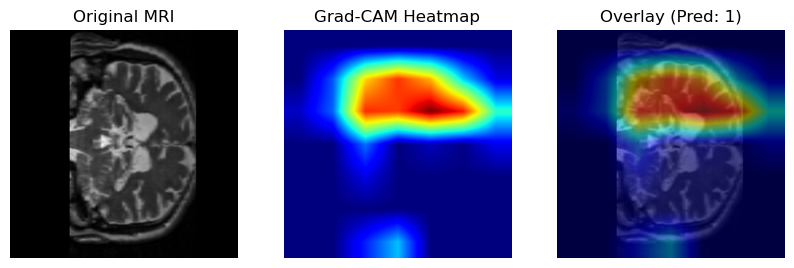

In [5]:
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2

# ==============================
# 1. Load Fine-Tuned ResNet50
# ==============================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet50(weights=None)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 3)  # your 3 classes
state_dict = torch.load("resnet50_PD_finetuned.pth", map_location=device)
model.load_state_dict(state_dict)
model.to(device)
model.eval()

# ==============================
# 2. Define Grad-CAM Helper
# ==============================
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.gradients = None
        self.activations = None
        self.hook_layers(target_layer)

    def hook_layers(self, target_layer):
        def forward_hook(module, input, output):
            self.activations = output.detach()
        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()
        target_layer.register_forward_hook(forward_hook)
        target_layer.register_backward_hook(backward_hook)

    def generate_cam(self, input_tensor, target_class=None):
        output = self.model(input_tensor)

        if target_class is None:
            target_class = output.argmax(dim=1).item()

        loss = output[0, target_class]
        self.model.zero_grad()
        loss.backward(retain_graph=True)

        grads = self.gradients.mean(dim=(2, 3), keepdim=True)
        cam = torch.sum(grads * self.activations, dim=1).squeeze()

        cam = torch.relu(cam)
        cam -= cam.min()
        cam /= cam.max()
        return cam.cpu().numpy(), target_class

# ==============================
# 3. Preprocess MRI Slice
# ==============================
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

img_path = r"D:\PD_coronal_slices\test\PD\I330585_PD_coronal_138.png"  # change to your file
img = Image.open(img_path).convert("RGB")
input_tensor = transform(img).unsqueeze(0).to(device)

# ==============================
# 4. Run Grad-CAM on last conv layer
# ==============================
target_layer = model.layer4[-1].conv3  # last conv layer in ResNet50
gradcam = GradCAM(model, target_layer)

cam, predicted_class = gradcam.generate_cam(input_tensor)

# ==============================
# 5. Overlay on Original Image
# ==============================
# ==============================
# 5. Overlay on Original Image
# ==============================
img_resized = img.resize((224,224))
img_cv = cv2.cvtColor(np.array(img_resized), cv2.COLOR_RGB2BGR)

# Resize CAM to match image
cam_resized = cv2.resize(cam, (img_cv.shape[1], img_cv.shape[0]))
heatmap = cv2.applyColorMap(np.uint8(255*cam_resized), cv2.COLORMAP_JET)

# Blend
overlay = cv2.addWeighted(img_cv, 0.5, heatmap, 0.5, 0)

plt.figure(figsize=(10,4))
plt.subplot(1,3,1); plt.imshow(img_resized); plt.title("Original MRI"); plt.axis("off")
plt.subplot(1,3,2); plt.imshow(cam_resized, cmap="jet"); plt.title("Grad-CAM Heatmap"); plt.axis("off")
plt.subplot(1,3,3); plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.title(f"Overlay (Pred: {predicted_class})"); plt.axis("off")
plt.show()


In [ ]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import cv2
from torchvision import models, transforms, datasets
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm

# ==========================
# CONFIG
# ==========================
data_dir = r"D:\PD_coronal_slices\test"   # path to test dataset
output_dir = "PD_gradcam_outputs"
os.makedirs(output_dir, exist_ok=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ==========================
# Load Fine-Tuned ResNet50
# ==========================
model = models.resnet50(weights=None)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 3)  # 3 classes (Control, PD, Prodromal)

# Load fine-tuned weights
state_dict = torch.load("resnet50_PD_finetuned.pth", map_location=device, weights_only=True)
model.load_state_dict(state_dict)
model.to(device)
model.eval()

# ==========================
# Grad-CAM Hook Functions
# ==========================
gradients = None
activations = None

def save_gradient(module, grad_input, grad_output):
    global gradients
    gradients = grad_output[0]

def save_activation(module, input, output):
    global activations
    activations = output

# Register hooks on last conv layer (layer4[-1].conv3 in ResNet50)
target_layer = model.layer4[-1].conv3
target_layer.register_forward_hook(save_activation)
target_layer.register_backward_hook(save_gradient)

# ==========================
# Image Transform
# ==========================
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406], 
        std=[0.229, 0.224, 0.225]
    )
])

# ==========================
# Dataset
# ==========================
dataset = datasets.ImageFolder(data_dir, transform=transform)

# Mapping from class index → name
idx_to_class = {v: k for k, v in dataset.class_to_idx.items()}

# ==========================
# Grad-CAM Function
# ==========================
def generate_gradcam(img_tensor, class_idx=None):
    global gradients, activations

    img_tensor = img_tensor.unsqueeze(0).to(device)
    output = model(img_tensor)
    if class_idx is None:
        class_idx = output.argmax(dim=1).item()

    # Backprop to chosen class
    model.zero_grad()
    target = output[0, class_idx]
    target.backward()

    # Compute CAM
    weights = gradients.mean(dim=(2, 3), keepdim=True)
    cam = (weights * activations).sum(dim=1).squeeze().cpu().detach().numpy()
    cam = np.maximum(cam, 0)
    cam = cam / cam.max() if cam.max() != 0 else cam
    return cam, class_idx

# ==========================
# Loop through Dataset
# ==========================
for i, (img_tensor, label) in enumerate(tqdm(dataset, desc="Generating Grad-CAM")):
    # Get original image
    img_path, _ = dataset.samples[i]
    img = Image.open(img_path).convert("RGB")

    # Grad-CAM
    cam, pred_class = generate_gradcam(img_tensor, None)

    # Resize CAM to image size
    img_resized = img.resize((224, 224))
    img_cv = cv2.cvtColor(np.array(img_resized), cv2.COLOR_RGB2BGR)
    cam_resized = cv2.resize(cam, (img_cv.shape[1], img_cv.shape[0]))
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)

    # Overlay
    overlay = cv2.addWeighted(img_cv, 0.5, heatmap, 0.5, 0)

    # Save
    save_path = os.path.join(output_dir, f"{os.path.basename(img_path)}_GradCAM.png")
    cv2.imwrite(save_path, overlay)

    # (Optional) print predictions
    true_class = idx_to_class[label]
    pred_class_name = idx_to_class[pred_class]
    print(f"[{i+1}/{len(dataset)}] {os.path.basename(img_path)} | True: {true_class}, Pred: {pred_class_name} | Saved to {save_path}")

print(f"\n✅ Grad-CAM overlays saved in: {output_dir}")


Generating Grad-CAM:   1%|          | 3/490 [00:00<00:50,  9.67it/s]

[1/490] I330119_Control_coronal_113.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330119_Control_coronal_113.png_GradCAM.png
[2/490] I330119_Control_coronal_114.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I330119_Control_coronal_114.png_GradCAM.png
[3/490] I330119_Control_coronal_115.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330119_Control_coronal_115.png_GradCAM.png


Generating Grad-CAM:   1%|          | 5/490 [00:00<00:37, 13.00it/s]

[4/490] I330119_Control_coronal_116.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330119_Control_coronal_116.png_GradCAM.png
[5/490] I330119_Control_coronal_117.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330119_Control_coronal_117.png_GradCAM.png
[6/490] I330119_Control_coronal_118.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330119_Control_coronal_118.png_GradCAM.png
[7/490] I330119_Control_coronal_119.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330119_Control_coronal_119.png_GradCAM.png


Generating Grad-CAM:   2%|▏         | 9/490 [00:00<00:35, 13.65it/s]

[8/490] I330119_Control_coronal_120.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330119_Control_coronal_120.png_GradCAM.png
[9/490] I330119_Control_coronal_140.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330119_Control_coronal_140.png_GradCAM.png
[10/490] I330119_Control_coronal_141.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330119_Control_coronal_141.png_GradCAM.png


Generating Grad-CAM:   3%|▎         | 13/490 [00:00<00:33, 14.19it/s]

[11/490] I330553_Control_coronal_109.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330553_Control_coronal_109.png_GradCAM.png
[12/490] I330553_Control_coronal_110.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330553_Control_coronal_110.png_GradCAM.png
[13/490] I330553_Control_coronal_111.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330553_Control_coronal_111.png_GradCAM.png
[14/490] I330553_Control_coronal_133.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330553_Control_coronal_133.png_GradCAM.png


Generating Grad-CAM:   3%|▎         | 17/490 [00:01<00:29, 15.97it/s]

[15/490] I330553_Control_coronal_134.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330553_Control_coronal_134.png_GradCAM.png
[16/490] I330553_Control_coronal_135.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330553_Control_coronal_135.png_GradCAM.png
[17/490] I330553_Control_coronal_136.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330553_Control_coronal_136.png_GradCAM.png
[18/490] I330553_Control_coronal_137.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330553_Control_coronal_137.png_GradCAM.png


Generating Grad-CAM:   4%|▍         | 22/490 [00:01<00:24, 19.03it/s]

[19/490] I330553_Control_coronal_138.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330553_Control_coronal_138.png_GradCAM.png
[20/490] I330553_Control_coronal_96.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330553_Control_coronal_96.png_GradCAM.png
[21/490] I330705_Control_coronal_135.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330705_Control_coronal_135.png_GradCAM.png
[22/490] I330705_Control_coronal_136.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330705_Control_coronal_136.png_GradCAM.png
[23/490] I330705_Control_coronal_151.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I330705_Control_coronal_151.png_GradCAM.png


Generating Grad-CAM:   5%|▌         | 26/490 [00:01<00:24, 19.05it/s]

[24/490] I330705_Control_coronal_152.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330705_Control_coronal_152.png_GradCAM.png
[25/490] I330705_Control_coronal_153.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330705_Control_coronal_153.png_GradCAM.png
[26/490] I330705_Control_coronal_154.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330705_Control_coronal_154.png_GradCAM.png
[27/490] I330705_Control_coronal_155.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330705_Control_coronal_155.png_GradCAM.png
[28/490] I330705_Control_coronal_161.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330705_Control_coronal_161.png_GradCAM.png


Generating Grad-CAM:   7%|▋         | 32/490 [00:01<00:21, 21.51it/s]

[29/490] I330705_Control_coronal_162.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330705_Control_coronal_162.png_GradCAM.png
[30/490] I330705_Control_coronal_163.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I330705_Control_coronal_163.png_GradCAM.png
[31/490] I331403_Control_coronal_128.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I331403_Control_coronal_128.png_GradCAM.png
[32/490] I331403_Control_coronal_129.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I331403_Control_coronal_129.png_GradCAM.png
[33/490] I331403_Control_coronal_130.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I331403_Control_coronal_130.png_GradCAM.png
[34/490] I331403_Control_coronal_140.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I331403_Control_coronal_140.png_GradCAM.png


Generating Grad-CAM:   8%|▊         | 38/490 [00:02<00:20, 21.97it/s]

[35/490] I331403_Control_coronal_141.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I331403_Control_coronal_141.png_GradCAM.png
[36/490] I331403_Control_coronal_147.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I331403_Control_coronal_147.png_GradCAM.png
[37/490] I331403_Control_coronal_148.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I331403_Control_coronal_148.png_GradCAM.png
[38/490] I331403_Control_coronal_156.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I331403_Control_coronal_156.png_GradCAM.png
[39/490] I331403_Control_coronal_157.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I331403_Control_coronal_157.png_GradCAM.png


Generating Grad-CAM:   9%|▉         | 44/490 [00:02<00:18, 24.05it/s]

[40/490] I331403_Control_coronal_158.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I331403_Control_coronal_158.png_GradCAM.png
[41/490] I333425_Control_coronal_143.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I333425_Control_coronal_143.png_GradCAM.png
[42/490] I333425_Control_coronal_144.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I333425_Control_coronal_144.png_GradCAM.png
[43/490] I333425_Control_coronal_145.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I333425_Control_coronal_145.png_GradCAM.png
[44/490] I333425_Control_coronal_146.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I333425_Control_coronal_146.png_GradCAM.png
[45/490] I333425_Control_coronal_147.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I333425_Control_coronal_147.png_GradCAM.png


Generating Grad-CAM:  10%|█         | 50/490 [00:02<00:18, 24.40it/s]

[46/490] I333425_Control_coronal_148.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I333425_Control_coronal_148.png_GradCAM.png
[47/490] I333425_Control_coronal_149.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I333425_Control_coronal_149.png_GradCAM.png
[48/490] I333425_Control_coronal_150.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I333425_Control_coronal_150.png_GradCAM.png
[49/490] I333425_Control_coronal_151.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I333425_Control_coronal_151.png_GradCAM.png
[50/490] I333425_Control_coronal_152.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I333425_Control_coronal_152.png_GradCAM.png
[51/490] I371013_Control_coronal_144.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I371013_Control_coronal_144.png_GradCAM.png


Generating Grad-CAM:  11%|█▏        | 56/490 [00:02<00:17, 24.26it/s]

[52/490] I371013_Control_coronal_145.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I371013_Control_coronal_145.png_GradCAM.png
[53/490] I371013_Control_coronal_155.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I371013_Control_coronal_155.png_GradCAM.png
[54/490] I371013_Control_coronal_156.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I371013_Control_coronal_156.png_GradCAM.png
[55/490] I371013_Control_coronal_157.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I371013_Control_coronal_157.png_GradCAM.png
[56/490] I371013_Control_coronal_158.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I371013_Control_coronal_158.png_GradCAM.png
[57/490] I371013_Control_coronal_159.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I371013_Control_coronal_159.png_GradCAM.png


Generating Grad-CAM:  13%|█▎        | 62/490 [00:03<00:18, 23.60it/s]

[58/490] I371013_Control_coronal_160.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I371013_Control_coronal_160.png_GradCAM.png
[59/490] I371013_Control_coronal_161.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I371013_Control_coronal_161.png_GradCAM.png
[60/490] I371013_Control_coronal_163.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I371013_Control_coronal_163.png_GradCAM.png
[61/490] I409434_Control_coronal_130.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I409434_Control_coronal_130.png_GradCAM.png
[62/490] I409434_Control_coronal_138.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I409434_Control_coronal_138.png_GradCAM.png


Generating Grad-CAM:  14%|█▍        | 68/490 [00:03<00:17, 24.26it/s]

[63/490] I409434_Control_coronal_139.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I409434_Control_coronal_139.png_GradCAM.png
[64/490] I409434_Control_coronal_140.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I409434_Control_coronal_140.png_GradCAM.png
[65/490] I409434_Control_coronal_141.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I409434_Control_coronal_141.png_GradCAM.png
[66/490] I409434_Control_coronal_142.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I409434_Control_coronal_142.png_GradCAM.png
[67/490] I409434_Control_coronal_143.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I409434_Control_coronal_143.png_GradCAM.png
[68/490] I409434_Control_coronal_144.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I409434_Control_coronal_144.png_GradCAM.png


Generating Grad-CAM:  15%|█▌        | 74/490 [00:03<00:16, 24.85it/s]

[69/490] I409434_Control_coronal_145.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I409434_Control_coronal_145.png_GradCAM.png
[70/490] I409434_Control_coronal_146.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I409434_Control_coronal_146.png_GradCAM.png
[71/490] I409983_Control_coronal_130.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I409983_Control_coronal_130.png_GradCAM.png
[72/490] I409983_Control_coronal_140.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I409983_Control_coronal_140.png_GradCAM.png
[73/490] I409983_Control_coronal_141.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I409983_Control_coronal_141.png_GradCAM.png
[74/490] I409983_Control_coronal_142.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I409983_Control_coronal_142.png_GradCAM.png


Generating Grad-CAM:  16%|█▌        | 77/490 [00:03<00:17, 23.42it/s]

[75/490] I409983_Control_coronal_143.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I409983_Control_coronal_143.png_GradCAM.png
[76/490] I409983_Control_coronal_144.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I409983_Control_coronal_144.png_GradCAM.png
[77/490] I409983_Control_coronal_145.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I409983_Control_coronal_145.png_GradCAM.png
[78/490] I409983_Control_coronal_146.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I409983_Control_coronal_146.png_GradCAM.png
[79/490] I409983_Control_coronal_147.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I409983_Control_coronal_147.png_GradCAM.png


Generating Grad-CAM:  17%|█▋        | 83/490 [00:04<00:16, 24.25it/s]

[80/490] I409983_Control_coronal_148.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I409983_Control_coronal_148.png_GradCAM.png
[81/490] I410334_Control_coronal_147.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410334_Control_coronal_147.png_GradCAM.png
[82/490] I410334_Control_coronal_148.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410334_Control_coronal_148.png_GradCAM.png
[83/490] I410334_Control_coronal_149.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410334_Control_coronal_149.png_GradCAM.png
[84/490] I410334_Control_coronal_150.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410334_Control_coronal_150.png_GradCAM.png
[85/490] I410334_Control_coronal_151.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410334_Control_coronal_151.png_GradCAM.png


Generating Grad-CAM:  18%|█▊        | 89/490 [00:04<00:16, 24.56it/s]

[86/490] I410334_Control_coronal_152.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410334_Control_coronal_152.png_GradCAM.png
[87/490] I410334_Control_coronal_153.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410334_Control_coronal_153.png_GradCAM.png
[88/490] I410334_Control_coronal_154.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410334_Control_coronal_154.png_GradCAM.png
[89/490] I410334_Control_coronal_155.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410334_Control_coronal_155.png_GradCAM.png
[90/490] I410334_Control_coronal_156.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410334_Control_coronal_156.png_GradCAM.png
[91/490] I410351_Control_coronal_107.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410351_Control_coronal_107.png_GradCAM.png


Generating Grad-CAM:  19%|█▉        | 95/490 [00:04<00:15, 25.07it/s]

[92/490] I410351_Control_coronal_108.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410351_Control_coronal_108.png_GradCAM.png
[93/490] I410351_Control_coronal_109.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410351_Control_coronal_109.png_GradCAM.png
[94/490] I410351_Control_coronal_114.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I410351_Control_coronal_114.png_GradCAM.png
[95/490] I410351_Control_coronal_115.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I410351_Control_coronal_115.png_GradCAM.png
[96/490] I410351_Control_coronal_143.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410351_Control_coronal_143.png_GradCAM.png
[97/490] I410351_Control_coronal_144.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410351_Control_coronal_144.png_GradCAM.png


Generating Grad-CAM:  21%|██        | 101/490 [00:04<00:15, 24.90it/s]

[98/490] I410351_Control_coronal_145.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410351_Control_coronal_145.png_GradCAM.png
[99/490] I410351_Control_coronal_146.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410351_Control_coronal_146.png_GradCAM.png
[100/490] I410351_Control_coronal_147.png | True: Control, Pred: Control | Saved to PD_gradcam_outputs\I410351_Control_coronal_147.png_GradCAM.png
[101/490] I428907_Control_coronal_117.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I428907_Control_coronal_117.png_GradCAM.png
[102/490] I428907_Control_coronal_118.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I428907_Control_coronal_118.png_GradCAM.png


Generating Grad-CAM:  22%|██▏       | 107/490 [00:05<00:17, 22.39it/s]

[103/490] I428907_Control_coronal_119.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I428907_Control_coronal_119.png_GradCAM.png
[104/490] I428907_Control_coronal_120.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I428907_Control_coronal_120.png_GradCAM.png
[105/490] I428907_Control_coronal_121.png | True: Control, Pred: Prodromal | Saved to PD_gradcam_outputs\I428907_Control_coronal_121.png_GradCAM.png
[106/490] I428907_Control_coronal_122.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I428907_Control_coronal_122.png_GradCAM.png
[107/490] I428907_Control_coronal_125.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I428907_Control_coronal_125.png_GradCAM.png


Generating Grad-CAM:  22%|██▏       | 110/490 [00:05<00:16, 23.38it/s]

[108/490] I428907_Control_coronal_126.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I428907_Control_coronal_126.png_GradCAM.png
[109/490] I428907_Control_coronal_142.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I428907_Control_coronal_142.png_GradCAM.png
[110/490] I428907_Control_coronal_143.png | True: Control, Pred: PD | Saved to PD_gradcam_outputs\I428907_Control_coronal_143.png_GradCAM.png
[111/490] I330585_PD_coronal_137.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330585_PD_coronal_137.png_GradCAM.png
[112/490] I330585_PD_coronal_138.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I330585_PD_coronal_138.png_GradCAM.png


Generating Grad-CAM:  24%|██▎       | 116/490 [00:05<00:15, 23.46it/s]

[113/490] I330585_PD_coronal_139.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I330585_PD_coronal_139.png_GradCAM.png
[114/490] I330585_PD_coronal_140.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I330585_PD_coronal_140.png_GradCAM.png
[115/490] I330585_PD_coronal_141.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I330585_PD_coronal_141.png_GradCAM.png
[116/490] I330585_PD_coronal_142.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I330585_PD_coronal_142.png_GradCAM.png
[117/490] I330585_PD_coronal_143.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330585_PD_coronal_143.png_GradCAM.png


Generating Grad-CAM:  25%|██▍       | 122/490 [00:05<00:15, 23.49it/s]

[118/490] I330585_PD_coronal_144.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330585_PD_coronal_144.png_GradCAM.png
[119/490] I330585_PD_coronal_145.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I330585_PD_coronal_145.png_GradCAM.png
[120/490] I330585_PD_coronal_146.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I330585_PD_coronal_146.png_GradCAM.png
[121/490] I330627_PD_coronal_100.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330627_PD_coronal_100.png_GradCAM.png
[122/490] I330627_PD_coronal_134.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330627_PD_coronal_134.png_GradCAM.png
[123/490] I330627_PD_coronal_135.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330627_PD_coronal_135.png_GradCAM.png


Generating Grad-CAM:  26%|██▌       | 128/490 [00:05<00:14, 24.32it/s]

[124/490] I330627_PD_coronal_142.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330627_PD_coronal_142.png_GradCAM.png
[125/490] I330627_PD_coronal_143.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330627_PD_coronal_143.png_GradCAM.png
[126/490] I330627_PD_coronal_144.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330627_PD_coronal_144.png_GradCAM.png
[127/490] I330627_PD_coronal_145.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330627_PD_coronal_145.png_GradCAM.png
[128/490] I330627_PD_coronal_146.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330627_PD_coronal_146.png_GradCAM.png


Generating Grad-CAM:  27%|██▋       | 131/490 [00:06<00:15, 23.41it/s]

[129/490] I330627_PD_coronal_147.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330627_PD_coronal_147.png_GradCAM.png
[130/490] I330627_PD_coronal_148.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330627_PD_coronal_148.png_GradCAM.png
[131/490] I330637_PD_coronal_140.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330637_PD_coronal_140.png_GradCAM.png
[132/490] I330637_PD_coronal_141.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330637_PD_coronal_141.png_GradCAM.png
[133/490] I330637_PD_coronal_145.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330637_PD_coronal_145.png_GradCAM.png


Generating Grad-CAM:  28%|██▊       | 137/490 [00:06<00:14, 24.27it/s]

[134/490] I330637_PD_coronal_146.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330637_PD_coronal_146.png_GradCAM.png
[135/490] I330637_PD_coronal_147.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330637_PD_coronal_147.png_GradCAM.png
[136/490] I330637_PD_coronal_148.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330637_PD_coronal_148.png_GradCAM.png
[137/490] I330637_PD_coronal_149.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330637_PD_coronal_149.png_GradCAM.png
[138/490] I330637_PD_coronal_150.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330637_PD_coronal_150.png_GradCAM.png


Generating Grad-CAM:  29%|██▉       | 143/490 [00:06<00:16, 21.61it/s]

[139/490] I330637_PD_coronal_151.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330637_PD_coronal_151.png_GradCAM.png
[140/490] I330637_PD_coronal_152.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330637_PD_coronal_152.png_GradCAM.png
[141/490] I330927_PD_coronal_141.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330927_PD_coronal_141.png_GradCAM.png
[142/490] I330927_PD_coronal_142.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330927_PD_coronal_142.png_GradCAM.png
[143/490] I330927_PD_coronal_143.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330927_PD_coronal_143.png_GradCAM.png


Generating Grad-CAM:  30%|██▉       | 146/490 [00:06<00:15, 22.36it/s]

[144/490] I330927_PD_coronal_144.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330927_PD_coronal_144.png_GradCAM.png
[145/490] I330927_PD_coronal_145.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330927_PD_coronal_145.png_GradCAM.png
[146/490] I330927_PD_coronal_146.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330927_PD_coronal_146.png_GradCAM.png
[147/490] I330927_PD_coronal_147.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330927_PD_coronal_147.png_GradCAM.png
[148/490] I330927_PD_coronal_148.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330927_PD_coronal_148.png_GradCAM.png


Generating Grad-CAM:  31%|███       | 152/490 [00:06<00:14, 24.08it/s]

[149/490] I330927_PD_coronal_149.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330927_PD_coronal_149.png_GradCAM.png
[150/490] I330927_PD_coronal_154.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330927_PD_coronal_154.png_GradCAM.png
[151/490] I330937_PD_coronal_139.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I330937_PD_coronal_139.png_GradCAM.png
[152/490] I330937_PD_coronal_140.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330937_PD_coronal_140.png_GradCAM.png
[153/490] I330937_PD_coronal_141.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330937_PD_coronal_141.png_GradCAM.png
[154/490] I330937_PD_coronal_142.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330937_PD_coronal_142.png_GradCAM.png


Generating Grad-CAM:  32%|███▏      | 158/490 [00:07<00:13, 25.06it/s]

[155/490] I330937_PD_coronal_143.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330937_PD_coronal_143.png_GradCAM.png
[156/490] I330937_PD_coronal_144.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330937_PD_coronal_144.png_GradCAM.png
[157/490] I330937_PD_coronal_145.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330937_PD_coronal_145.png_GradCAM.png
[158/490] I330937_PD_coronal_94.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330937_PD_coronal_94.png_GradCAM.png
[159/490] I330937_PD_coronal_95.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330937_PD_coronal_95.png_GradCAM.png
[160/490] I330937_PD_coronal_96.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I330937_PD_coronal_96.png_GradCAM.png


Generating Grad-CAM:  33%|███▎      | 164/490 [00:07<00:13, 24.26it/s]

[161/490] I331177_PD_coronal_100.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I331177_PD_coronal_100.png_GradCAM.png
[162/490] I331177_PD_coronal_101.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I331177_PD_coronal_101.png_GradCAM.png
[163/490] I331177_PD_coronal_102.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I331177_PD_coronal_102.png_GradCAM.png
[164/490] I331177_PD_coronal_103.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I331177_PD_coronal_103.png_GradCAM.png
[165/490] I331177_PD_coronal_104.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I331177_PD_coronal_104.png_GradCAM.png


Generating Grad-CAM:  35%|███▍      | 170/490 [00:07<00:13, 24.44it/s]

[166/490] I331177_PD_coronal_105.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I331177_PD_coronal_105.png_GradCAM.png
[167/490] I331177_PD_coronal_115.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331177_PD_coronal_115.png_GradCAM.png
[168/490] I331177_PD_coronal_143.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331177_PD_coronal_143.png_GradCAM.png
[169/490] I331177_PD_coronal_144.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331177_PD_coronal_144.png_GradCAM.png
[170/490] I331177_PD_coronal_99.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I331177_PD_coronal_99.png_GradCAM.png


Generating Grad-CAM:  36%|███▌      | 176/490 [00:07<00:13, 23.51it/s]

[171/490] I331307_PD_coronal_133.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I331307_PD_coronal_133.png_GradCAM.png
[172/490] I331307_PD_coronal_134.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I331307_PD_coronal_134.png_GradCAM.png
[173/490] I331307_PD_coronal_135.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I331307_PD_coronal_135.png_GradCAM.png
[174/490] I331307_PD_coronal_136.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I331307_PD_coronal_136.png_GradCAM.png
[175/490] I331307_PD_coronal_140.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331307_PD_coronal_140.png_GradCAM.png
[176/490] I331307_PD_coronal_141.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331307_PD_coronal_141.png_GradCAM.png


Generating Grad-CAM:  37%|███▋      | 182/490 [00:08<00:12, 24.35it/s]

[177/490] I331307_PD_coronal_166.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331307_PD_coronal_166.png_GradCAM.png
[178/490] I331307_PD_coronal_167.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331307_PD_coronal_167.png_GradCAM.png
[179/490] I331307_PD_coronal_168.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331307_PD_coronal_168.png_GradCAM.png
[180/490] I331307_PD_coronal_169.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331307_PD_coronal_169.png_GradCAM.png
[181/490] I331834_PD_coronal_135.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331834_PD_coronal_135.png_GradCAM.png
[182/490] I331834_PD_coronal_136.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331834_PD_coronal_136.png_GradCAM.png


Generating Grad-CAM:  38%|███▊      | 188/490 [00:08<00:12, 24.49it/s]

[183/490] I331834_PD_coronal_137.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331834_PD_coronal_137.png_GradCAM.png
[184/490] I331834_PD_coronal_138.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331834_PD_coronal_138.png_GradCAM.png
[185/490] I331834_PD_coronal_139.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I331834_PD_coronal_139.png_GradCAM.png
[186/490] I331834_PD_coronal_140.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331834_PD_coronal_140.png_GradCAM.png
[187/490] I331834_PD_coronal_141.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331834_PD_coronal_141.png_GradCAM.png
[188/490] I331834_PD_coronal_142.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331834_PD_coronal_142.png_GradCAM.png


Generating Grad-CAM:  39%|███▉      | 191/490 [00:08<00:12, 24.83it/s]

[189/490] I331834_PD_coronal_143.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331834_PD_coronal_143.png_GradCAM.png
[190/490] I331834_PD_coronal_144.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I331834_PD_coronal_144.png_GradCAM.png
[191/490] I333383_PD_coronal_116.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I333383_PD_coronal_116.png_GradCAM.png
[192/490] I333383_PD_coronal_117.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I333383_PD_coronal_117.png_GradCAM.png
[193/490] I333383_PD_coronal_118.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I333383_PD_coronal_118.png_GradCAM.png


Generating Grad-CAM:  40%|████      | 197/490 [00:08<00:12, 24.00it/s]

[194/490] I333383_PD_coronal_125.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I333383_PD_coronal_125.png_GradCAM.png
[195/490] I333383_PD_coronal_126.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I333383_PD_coronal_126.png_GradCAM.png
[196/490] I333383_PD_coronal_127.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I333383_PD_coronal_127.png_GradCAM.png
[197/490] I333383_PD_coronal_128.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I333383_PD_coronal_128.png_GradCAM.png
[198/490] I333383_PD_coronal_129.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I333383_PD_coronal_129.png_GradCAM.png


Generating Grad-CAM:  41%|████▏     | 203/490 [00:09<00:11, 24.76it/s]

[199/490] I333383_PD_coronal_137.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I333383_PD_coronal_137.png_GradCAM.png
[200/490] I333383_PD_coronal_138.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I333383_PD_coronal_138.png_GradCAM.png
[201/490] I371053_PD_coronal_140.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I371053_PD_coronal_140.png_GradCAM.png
[202/490] I371053_PD_coronal_141.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I371053_PD_coronal_141.png_GradCAM.png
[203/490] I371053_PD_coronal_142.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I371053_PD_coronal_142.png_GradCAM.png
[204/490] I371053_PD_coronal_143.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I371053_PD_coronal_143.png_GradCAM.png


Generating Grad-CAM:  43%|████▎     | 209/490 [00:09<00:11, 25.51it/s]

[205/490] I371053_PD_coronal_150.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I371053_PD_coronal_150.png_GradCAM.png
[206/490] I371053_PD_coronal_151.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I371053_PD_coronal_151.png_GradCAM.png
[207/490] I371053_PD_coronal_152.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I371053_PD_coronal_152.png_GradCAM.png
[208/490] I371053_PD_coronal_153.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I371053_PD_coronal_153.png_GradCAM.png
[209/490] I371053_PD_coronal_154.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I371053_PD_coronal_154.png_GradCAM.png
[210/490] I371053_PD_coronal_155.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I371053_PD_coronal_155.png_GradCAM.png


Generating Grad-CAM:  44%|████▍     | 215/490 [00:09<00:11, 24.46it/s]

[211/490] I371093_PD_coronal_152.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I371093_PD_coronal_152.png_GradCAM.png
[212/490] I371093_PD_coronal_153.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I371093_PD_coronal_153.png_GradCAM.png
[213/490] I371093_PD_coronal_154.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I371093_PD_coronal_154.png_GradCAM.png
[214/490] I371093_PD_coronal_155.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I371093_PD_coronal_155.png_GradCAM.png
[215/490] I371093_PD_coronal_156.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I371093_PD_coronal_156.png_GradCAM.png


Generating Grad-CAM:  45%|████▌     | 221/490 [00:09<00:10, 24.92it/s]

[216/490] I371093_PD_coronal_157.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I371093_PD_coronal_157.png_GradCAM.png
[217/490] I371093_PD_coronal_158.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I371093_PD_coronal_158.png_GradCAM.png
[218/490] I371093_PD_coronal_159.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I371093_PD_coronal_159.png_GradCAM.png
[219/490] I371093_PD_coronal_166.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I371093_PD_coronal_166.png_GradCAM.png
[220/490] I371093_PD_coronal_167.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I371093_PD_coronal_167.png_GradCAM.png
[221/490] I405816_PD_coronal_140.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405816_PD_coronal_140.png_GradCAM.png


Generating Grad-CAM:  46%|████▋     | 227/490 [00:10<00:11, 23.83it/s]

[222/490] I405816_PD_coronal_141.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405816_PD_coronal_141.png_GradCAM.png
[223/490] I405816_PD_coronal_142.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405816_PD_coronal_142.png_GradCAM.png
[224/490] I405816_PD_coronal_143.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405816_PD_coronal_143.png_GradCAM.png
[225/490] I405816_PD_coronal_144.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405816_PD_coronal_144.png_GradCAM.png
[226/490] I405816_PD_coronal_148.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405816_PD_coronal_148.png_GradCAM.png
[227/490] I405816_PD_coronal_149.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405816_PD_coronal_149.png_GradCAM.png


Generating Grad-CAM:  47%|████▋     | 230/490 [00:10<00:10, 23.73it/s]

[228/490] I405816_PD_coronal_151.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I405816_PD_coronal_151.png_GradCAM.png
[229/490] I405816_PD_coronal_152.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I405816_PD_coronal_152.png_GradCAM.png
[230/490] I405816_PD_coronal_153.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405816_PD_coronal_153.png_GradCAM.png
[231/490] I405885_PD_coronal_110.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405885_PD_coronal_110.png_GradCAM.png
[232/490] I405885_PD_coronal_111.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405885_PD_coronal_111.png_GradCAM.png


Generating Grad-CAM:  48%|████▊     | 236/490 [00:10<00:10, 24.48it/s]

[233/490] I405885_PD_coronal_112.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405885_PD_coronal_112.png_GradCAM.png
[234/490] I405885_PD_coronal_113.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405885_PD_coronal_113.png_GradCAM.png
[235/490] I405885_PD_coronal_114.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405885_PD_coronal_114.png_GradCAM.png
[236/490] I405885_PD_coronal_136.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405885_PD_coronal_136.png_GradCAM.png
[237/490] I405885_PD_coronal_137.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405885_PD_coronal_137.png_GradCAM.png


Generating Grad-CAM:  49%|████▉     | 242/490 [00:10<00:10, 24.55it/s]

[238/490] I405885_PD_coronal_138.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405885_PD_coronal_138.png_GradCAM.png
[239/490] I405885_PD_coronal_139.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405885_PD_coronal_139.png_GradCAM.png
[240/490] I405885_PD_coronal_143.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I405885_PD_coronal_143.png_GradCAM.png
[241/490] I406458_PD_coronal_133.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I406458_PD_coronal_133.png_GradCAM.png
[242/490] I406458_PD_coronal_141.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I406458_PD_coronal_141.png_GradCAM.png


Generating Grad-CAM:  50%|█████     | 245/490 [00:10<00:09, 24.71it/s]

[243/490] I406458_PD_coronal_142.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I406458_PD_coronal_142.png_GradCAM.png
[244/490] I406458_PD_coronal_143.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I406458_PD_coronal_143.png_GradCAM.png
[245/490] I406458_PD_coronal_144.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I406458_PD_coronal_144.png_GradCAM.png
[246/490] I406458_PD_coronal_145.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I406458_PD_coronal_145.png_GradCAM.png
[247/490] I406458_PD_coronal_146.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I406458_PD_coronal_146.png_GradCAM.png


Generating Grad-CAM:  51%|█████     | 251/490 [00:11<00:10, 23.32it/s]

[248/490] I406458_PD_coronal_147.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I406458_PD_coronal_147.png_GradCAM.png
[249/490] I406458_PD_coronal_148.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I406458_PD_coronal_148.png_GradCAM.png
[250/490] I406458_PD_coronal_149.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I406458_PD_coronal_149.png_GradCAM.png
[251/490] I407201_PD_coronal_143.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407201_PD_coronal_143.png_GradCAM.png
[252/490] I407201_PD_coronal_144.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407201_PD_coronal_144.png_GradCAM.png


Generating Grad-CAM:  52%|█████▏    | 257/490 [00:11<00:09, 23.93it/s]

[253/490] I407201_PD_coronal_145.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407201_PD_coronal_145.png_GradCAM.png
[254/490] I407201_PD_coronal_146.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407201_PD_coronal_146.png_GradCAM.png
[255/490] I407201_PD_coronal_147.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407201_PD_coronal_147.png_GradCAM.png
[256/490] I407201_PD_coronal_148.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407201_PD_coronal_148.png_GradCAM.png
[257/490] I407201_PD_coronal_149.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407201_PD_coronal_149.png_GradCAM.png
[258/490] I407201_PD_coronal_150.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407201_PD_coronal_150.png_GradCAM.png


Generating Grad-CAM:  54%|█████▎    | 263/490 [00:11<00:09, 24.86it/s]

[259/490] I407201_PD_coronal_151.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I407201_PD_coronal_151.png_GradCAM.png
[260/490] I407201_PD_coronal_152.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407201_PD_coronal_152.png_GradCAM.png
[261/490] I407258_PD_coronal_120.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407258_PD_coronal_120.png_GradCAM.png
[262/490] I407258_PD_coronal_121.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407258_PD_coronal_121.png_GradCAM.png
[263/490] I407258_PD_coronal_125.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407258_PD_coronal_125.png_GradCAM.png
[264/490] I407258_PD_coronal_126.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407258_PD_coronal_126.png_GradCAM.png


Generating Grad-CAM:  55%|█████▍    | 269/490 [00:11<00:08, 25.57it/s]

[265/490] I407258_PD_coronal_127.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407258_PD_coronal_127.png_GradCAM.png
[266/490] I407258_PD_coronal_128.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407258_PD_coronal_128.png_GradCAM.png
[267/490] I407258_PD_coronal_129.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407258_PD_coronal_129.png_GradCAM.png
[268/490] I407258_PD_coronal_154.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407258_PD_coronal_154.png_GradCAM.png
[269/490] I407258_PD_coronal_155.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407258_PD_coronal_155.png_GradCAM.png
[270/490] I407258_PD_coronal_156.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407258_PD_coronal_156.png_GradCAM.png


Generating Grad-CAM:  56%|█████▌    | 275/490 [00:11<00:08, 25.43it/s]

[271/490] I407941_PD_coronal_151.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I407941_PD_coronal_151.png_GradCAM.png
[272/490] I407941_PD_coronal_152.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I407941_PD_coronal_152.png_GradCAM.png
[273/490] I407941_PD_coronal_153.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407941_PD_coronal_153.png_GradCAM.png
[274/490] I407941_PD_coronal_154.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407941_PD_coronal_154.png_GradCAM.png
[275/490] I407941_PD_coronal_155.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407941_PD_coronal_155.png_GradCAM.png
[276/490] I407941_PD_coronal_156.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407941_PD_coronal_156.png_GradCAM.png


Generating Grad-CAM:  57%|█████▋    | 281/490 [00:12<00:08, 23.37it/s]

[277/490] I407941_PD_coronal_157.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407941_PD_coronal_157.png_GradCAM.png
[278/490] I407941_PD_coronal_158.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407941_PD_coronal_158.png_GradCAM.png
[279/490] I407941_PD_coronal_159.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I407941_PD_coronal_159.png_GradCAM.png
[280/490] I407941_PD_coronal_160.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I407941_PD_coronal_160.png_GradCAM.png
[281/490] I408249_PD_coronal_114.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I408249_PD_coronal_114.png_GradCAM.png


Generating Grad-CAM:  58%|█████▊    | 284/490 [00:12<00:08, 23.85it/s]

[282/490] I408249_PD_coronal_115.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I408249_PD_coronal_115.png_GradCAM.png
[283/490] I408249_PD_coronal_126.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I408249_PD_coronal_126.png_GradCAM.png
[284/490] I408249_PD_coronal_129.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I408249_PD_coronal_129.png_GradCAM.png
[285/490] I408249_PD_coronal_130.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I408249_PD_coronal_130.png_GradCAM.png
[286/490] I408249_PD_coronal_131.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I408249_PD_coronal_131.png_GradCAM.png


Generating Grad-CAM:  59%|█████▉    | 290/490 [00:12<00:08, 24.43it/s]

[287/490] I408249_PD_coronal_132.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I408249_PD_coronal_132.png_GradCAM.png
[288/490] I408249_PD_coronal_133.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I408249_PD_coronal_133.png_GradCAM.png
[289/490] I408249_PD_coronal_134.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I408249_PD_coronal_134.png_GradCAM.png
[290/490] I408249_PD_coronal_135.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I408249_PD_coronal_135.png_GradCAM.png
[291/490] I408811_PD_coronal_138.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I408811_PD_coronal_138.png_GradCAM.png


Generating Grad-CAM:  60%|█████▉    | 293/490 [00:12<00:08, 23.09it/s]

[292/490] I408811_PD_coronal_139.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I408811_PD_coronal_139.png_GradCAM.png
[293/490] I408811_PD_coronal_144.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I408811_PD_coronal_144.png_GradCAM.png
[294/490] I408811_PD_coronal_145.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I408811_PD_coronal_145.png_GradCAM.png
[295/490] I408811_PD_coronal_146.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I408811_PD_coronal_146.png_GradCAM.png


Generating Grad-CAM:  61%|██████    | 299/490 [00:13<00:08, 23.39it/s]

[296/490] I408811_PD_coronal_147.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I408811_PD_coronal_147.png_GradCAM.png
[297/490] I408811_PD_coronal_148.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I408811_PD_coronal_148.png_GradCAM.png
[298/490] I408811_PD_coronal_149.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I408811_PD_coronal_149.png_GradCAM.png
[299/490] I408811_PD_coronal_150.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I408811_PD_coronal_150.png_GradCAM.png
[300/490] I408811_PD_coronal_151.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I408811_PD_coronal_151.png_GradCAM.png
[301/490] I409639_PD_coronal_135.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409639_PD_coronal_135.png_GradCAM.png


Generating Grad-CAM:  62%|██████▏   | 305/490 [00:13<00:07, 23.89it/s]

[302/490] I409639_PD_coronal_136.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409639_PD_coronal_136.png_GradCAM.png
[303/490] I409639_PD_coronal_137.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409639_PD_coronal_137.png_GradCAM.png
[304/490] I409639_PD_coronal_138.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409639_PD_coronal_138.png_GradCAM.png
[305/490] I409639_PD_coronal_139.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I409639_PD_coronal_139.png_GradCAM.png
[306/490] I409639_PD_coronal_140.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409639_PD_coronal_140.png_GradCAM.png


Generating Grad-CAM:  63%|██████▎   | 311/490 [00:13<00:08, 21.12it/s]

[307/490] I409639_PD_coronal_141.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409639_PD_coronal_141.png_GradCAM.png
[308/490] I409639_PD_coronal_142.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I409639_PD_coronal_142.png_GradCAM.png
[309/490] I409639_PD_coronal_143.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I409639_PD_coronal_143.png_GradCAM.png
[310/490] I409639_PD_coronal_144.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409639_PD_coronal_144.png_GradCAM.png
[311/490] I409677_PD_coronal_134.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409677_PD_coronal_134.png_GradCAM.png


Generating Grad-CAM:  65%|██████▍   | 317/490 [00:13<00:07, 22.96it/s]

[312/490] I409677_PD_coronal_135.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409677_PD_coronal_135.png_GradCAM.png
[313/490] I409677_PD_coronal_136.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409677_PD_coronal_136.png_GradCAM.png
[314/490] I409677_PD_coronal_137.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409677_PD_coronal_137.png_GradCAM.png
[315/490] I409677_PD_coronal_138.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409677_PD_coronal_138.png_GradCAM.png
[316/490] I409677_PD_coronal_139.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409677_PD_coronal_139.png_GradCAM.png
[317/490] I409677_PD_coronal_140.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I409677_PD_coronal_140.png_GradCAM.png


Generating Grad-CAM:  66%|██████▌   | 323/490 [00:14<00:06, 23.88it/s]

[318/490] I409677_PD_coronal_141.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409677_PD_coronal_141.png_GradCAM.png
[319/490] I409677_PD_coronal_142.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409677_PD_coronal_142.png_GradCAM.png
[320/490] I409677_PD_coronal_143.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I409677_PD_coronal_143.png_GradCAM.png
[321/490] I409920_PD_coronal_101.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I409920_PD_coronal_101.png_GradCAM.png
[322/490] I409920_PD_coronal_108.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409920_PD_coronal_108.png_GradCAM.png
[323/490] I409920_PD_coronal_109.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409920_PD_coronal_109.png_GradCAM.png


Generating Grad-CAM:  67%|██████▋   | 329/490 [00:14<00:06, 24.98it/s]

[324/490] I409920_PD_coronal_110.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I409920_PD_coronal_110.png_GradCAM.png
[325/490] I409920_PD_coronal_128.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409920_PD_coronal_128.png_GradCAM.png
[326/490] I409920_PD_coronal_129.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409920_PD_coronal_129.png_GradCAM.png
[327/490] I409920_PD_coronal_130.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409920_PD_coronal_130.png_GradCAM.png
[328/490] I409920_PD_coronal_131.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409920_PD_coronal_131.png_GradCAM.png
[329/490] I409920_PD_coronal_132.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409920_PD_coronal_132.png_GradCAM.png


Generating Grad-CAM:  68%|██████▊   | 332/490 [00:14<00:06, 24.85it/s]

[330/490] I409920_PD_coronal_142.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I409920_PD_coronal_142.png_GradCAM.png
[331/490] I410333_PD_coronal_100.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I410333_PD_coronal_100.png_GradCAM.png
[332/490] I410333_PD_coronal_101.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I410333_PD_coronal_101.png_GradCAM.png
[333/490] I410333_PD_coronal_102.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I410333_PD_coronal_102.png_GradCAM.png
[334/490] I410333_PD_coronal_103.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I410333_PD_coronal_103.png_GradCAM.png


Generating Grad-CAM:  69%|██████▉   | 338/490 [00:14<00:06, 23.52it/s]

[335/490] I410333_PD_coronal_104.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I410333_PD_coronal_104.png_GradCAM.png
[336/490] I410333_PD_coronal_130.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I410333_PD_coronal_130.png_GradCAM.png
[337/490] I410333_PD_coronal_131.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I410333_PD_coronal_131.png_GradCAM.png
[338/490] I410333_PD_coronal_132.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I410333_PD_coronal_132.png_GradCAM.png
[339/490] I410333_PD_coronal_133.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I410333_PD_coronal_133.png_GradCAM.png


Generating Grad-CAM:  70%|███████   | 344/490 [00:14<00:05, 24.46it/s]

[340/490] I410333_PD_coronal_134.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I410333_PD_coronal_134.png_GradCAM.png
[341/490] I411195_PD_coronal_120.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I411195_PD_coronal_120.png_GradCAM.png
[342/490] I411195_PD_coronal_121.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I411195_PD_coronal_121.png_GradCAM.png
[343/490] I411195_PD_coronal_122.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I411195_PD_coronal_122.png_GradCAM.png
[344/490] I411195_PD_coronal_123.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I411195_PD_coronal_123.png_GradCAM.png


Generating Grad-CAM:  71%|███████   | 347/490 [00:15<00:06, 23.62it/s]

[345/490] I411195_PD_coronal_124.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I411195_PD_coronal_124.png_GradCAM.png
[346/490] I411195_PD_coronal_134.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I411195_PD_coronal_134.png_GradCAM.png
[347/490] I411195_PD_coronal_148.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I411195_PD_coronal_148.png_GradCAM.png
[348/490] I411195_PD_coronal_149.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I411195_PD_coronal_149.png_GradCAM.png


Generating Grad-CAM:  72%|███████▏  | 353/490 [00:15<00:06, 19.78it/s]

[349/490] I411195_PD_coronal_150.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I411195_PD_coronal_150.png_GradCAM.png
[350/490] I411195_PD_coronal_151.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I411195_PD_coronal_151.png_GradCAM.png
[351/490] I411490_PD_coronal_152.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I411490_PD_coronal_152.png_GradCAM.png
[352/490] I411490_PD_coronal_153.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I411490_PD_coronal_153.png_GradCAM.png
[353/490] I411490_PD_coronal_154.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I411490_PD_coronal_154.png_GradCAM.png


Generating Grad-CAM:  73%|███████▎  | 356/490 [00:15<00:06, 20.83it/s]

[354/490] I411490_PD_coronal_155.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I411490_PD_coronal_155.png_GradCAM.png
[355/490] I411490_PD_coronal_156.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I411490_PD_coronal_156.png_GradCAM.png
[356/490] I411490_PD_coronal_157.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I411490_PD_coronal_157.png_GradCAM.png
[357/490] I411490_PD_coronal_158.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I411490_PD_coronal_158.png_GradCAM.png
[358/490] I411490_PD_coronal_159.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I411490_PD_coronal_159.png_GradCAM.png
[359/490] I411490_PD_coronal_160.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I411490_PD_coronal_160.png_GradCAM.png


Generating Grad-CAM:  74%|███████▍  | 362/490 [00:15<00:05, 22.86it/s]

[360/490] I411490_PD_coronal_161.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I411490_PD_coronal_161.png_GradCAM.png
[361/490] I428076_PD_coronal_139.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428076_PD_coronal_139.png_GradCAM.png
[362/490] I428076_PD_coronal_140.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428076_PD_coronal_140.png_GradCAM.png
[363/490] I428076_PD_coronal_143.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428076_PD_coronal_143.png_GradCAM.png
[364/490] I428076_PD_coronal_144.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428076_PD_coronal_144.png_GradCAM.png


Generating Grad-CAM:  75%|███████▌  | 368/490 [00:16<00:05, 22.86it/s]

[365/490] I428076_PD_coronal_145.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428076_PD_coronal_145.png_GradCAM.png
[366/490] I428076_PD_coronal_148.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428076_PD_coronal_148.png_GradCAM.png
[367/490] I428076_PD_coronal_149.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428076_PD_coronal_149.png_GradCAM.png
[368/490] I428076_PD_coronal_150.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428076_PD_coronal_150.png_GradCAM.png
[369/490] I428076_PD_coronal_151.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I428076_PD_coronal_151.png_GradCAM.png


Generating Grad-CAM:  76%|███████▋  | 374/490 [00:16<00:05, 22.81it/s]

[370/490] I428076_PD_coronal_152.png | True: PD, Pred: Control | Saved to PD_gradcam_outputs\I428076_PD_coronal_152.png_GradCAM.png
[371/490] I428866_PD_coronal_159.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428866_PD_coronal_159.png_GradCAM.png
[372/490] I428866_PD_coronal_160.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428866_PD_coronal_160.png_GradCAM.png
[373/490] I428866_PD_coronal_161.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428866_PD_coronal_161.png_GradCAM.png
[374/490] I428866_PD_coronal_162.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428866_PD_coronal_162.png_GradCAM.png


Generating Grad-CAM:  78%|███████▊  | 380/490 [00:16<00:04, 24.15it/s]

[375/490] I428866_PD_coronal_163.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428866_PD_coronal_163.png_GradCAM.png
[376/490] I428866_PD_coronal_170.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I428866_PD_coronal_170.png_GradCAM.png
[377/490] I428866_PD_coronal_171.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I428866_PD_coronal_171.png_GradCAM.png
[378/490] I428866_PD_coronal_172.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I428866_PD_coronal_172.png_GradCAM.png
[379/490] I428866_PD_coronal_173.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I428866_PD_coronal_173.png_GradCAM.png
[380/490] I428866_PD_coronal_174.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I428866_PD_coronal_174.png_GradCAM.png


Generating Grad-CAM:  78%|███████▊  | 383/490 [00:16<00:04, 24.25it/s]

[381/490] I428919_PD_coronal_134.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428919_PD_coronal_134.png_GradCAM.png
[382/490] I428919_PD_coronal_135.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428919_PD_coronal_135.png_GradCAM.png
[383/490] I428919_PD_coronal_143.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428919_PD_coronal_143.png_GradCAM.png
[384/490] I428919_PD_coronal_144.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428919_PD_coronal_144.png_GradCAM.png
[385/490] I428919_PD_coronal_145.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428919_PD_coronal_145.png_GradCAM.png


Generating Grad-CAM:  79%|███████▉  | 389/490 [00:16<00:04, 24.98it/s]

[386/490] I428919_PD_coronal_146.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428919_PD_coronal_146.png_GradCAM.png
[387/490] I428919_PD_coronal_147.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428919_PD_coronal_147.png_GradCAM.png
[388/490] I428919_PD_coronal_148.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428919_PD_coronal_148.png_GradCAM.png
[389/490] I428919_PD_coronal_149.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428919_PD_coronal_149.png_GradCAM.png
[390/490] I428919_PD_coronal_150.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I428919_PD_coronal_150.png_GradCAM.png
[391/490] I452249_PD_coronal_140.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I452249_PD_coronal_140.png_GradCAM.png


Generating Grad-CAM:  81%|████████  | 395/490 [00:17<00:04, 23.52it/s]

[392/490] I452249_PD_coronal_145.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I452249_PD_coronal_145.png_GradCAM.png
[393/490] I452249_PD_coronal_146.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I452249_PD_coronal_146.png_GradCAM.png
[394/490] I452249_PD_coronal_147.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I452249_PD_coronal_147.png_GradCAM.png
[395/490] I452249_PD_coronal_148.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I452249_PD_coronal_148.png_GradCAM.png
[396/490] I452249_PD_coronal_149.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I452249_PD_coronal_149.png_GradCAM.png


Generating Grad-CAM:  82%|████████▏ | 401/490 [00:17<00:03, 23.69it/s]

[397/490] I452249_PD_coronal_150.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I452249_PD_coronal_150.png_GradCAM.png
[398/490] I452249_PD_coronal_151.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I452249_PD_coronal_151.png_GradCAM.png
[399/490] I452249_PD_coronal_152.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I452249_PD_coronal_152.png_GradCAM.png
[400/490] I452249_PD_coronal_153.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I452249_PD_coronal_153.png_GradCAM.png
[401/490] I486842_PD_coronal_110.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I486842_PD_coronal_110.png_GradCAM.png
[402/490] I486842_PD_coronal_111.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I486842_PD_coronal_111.png_GradCAM.png


Generating Grad-CAM:  83%|████████▎ | 407/490 [00:17<00:03, 24.18it/s]

[403/490] I486842_PD_coronal_112.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I486842_PD_coronal_112.png_GradCAM.png
[404/490] I486842_PD_coronal_113.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I486842_PD_coronal_113.png_GradCAM.png
[405/490] I486842_PD_coronal_114.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I486842_PD_coronal_114.png_GradCAM.png
[406/490] I486842_PD_coronal_115.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I486842_PD_coronal_115.png_GradCAM.png
[407/490] I486842_PD_coronal_116.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I486842_PD_coronal_116.png_GradCAM.png


Generating Grad-CAM:  84%|████████▎ | 410/490 [00:17<00:03, 23.77it/s]

[408/490] I486842_PD_coronal_117.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I486842_PD_coronal_117.png_GradCAM.png
[409/490] I486842_PD_coronal_118.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I486842_PD_coronal_118.png_GradCAM.png
[410/490] I486842_PD_coronal_119.png | True: PD, Pred: Prodromal | Saved to PD_gradcam_outputs\I486842_PD_coronal_119.png_GradCAM.png
[411/490] I486929_PD_coronal_126.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I486929_PD_coronal_126.png_GradCAM.png
[412/490] I486929_PD_coronal_127.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I486929_PD_coronal_127.png_GradCAM.png


Generating Grad-CAM:  85%|████████▍ | 416/490 [00:18<00:02, 24.69it/s]

[413/490] I486929_PD_coronal_128.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I486929_PD_coronal_128.png_GradCAM.png
[414/490] I486929_PD_coronal_129.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I486929_PD_coronal_129.png_GradCAM.png
[415/490] I486929_PD_coronal_130.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I486929_PD_coronal_130.png_GradCAM.png
[416/490] I486929_PD_coronal_131.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I486929_PD_coronal_131.png_GradCAM.png
[417/490] I486929_PD_coronal_132.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I486929_PD_coronal_132.png_GradCAM.png
[418/490] I486929_PD_coronal_133.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I486929_PD_coronal_133.png_GradCAM.png


Generating Grad-CAM:  86%|████████▌ | 422/490 [00:18<00:02, 25.05it/s]

[419/490] I486929_PD_coronal_136.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I486929_PD_coronal_136.png_GradCAM.png
[420/490] I486929_PD_coronal_137.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I486929_PD_coronal_137.png_GradCAM.png
[421/490] I848718_PD_coronal_142.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I848718_PD_coronal_142.png_GradCAM.png
[422/490] I848718_PD_coronal_143.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I848718_PD_coronal_143.png_GradCAM.png
[423/490] I848718_PD_coronal_144.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I848718_PD_coronal_144.png_GradCAM.png


Generating Grad-CAM:  87%|████████▋ | 428/490 [00:18<00:02, 22.32it/s]

[424/490] I848718_PD_coronal_145.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I848718_PD_coronal_145.png_GradCAM.png
[425/490] I848718_PD_coronal_146.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I848718_PD_coronal_146.png_GradCAM.png
[426/490] I848718_PD_coronal_147.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I848718_PD_coronal_147.png_GradCAM.png
[427/490] I848718_PD_coronal_148.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I848718_PD_coronal_148.png_GradCAM.png
[428/490] I848718_PD_coronal_149.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I848718_PD_coronal_149.png_GradCAM.png


Generating Grad-CAM:  88%|████████▊ | 431/490 [00:18<00:02, 23.42it/s]

[429/490] I848718_PD_coronal_150.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I848718_PD_coronal_150.png_GradCAM.png
[430/490] I848718_PD_coronal_151.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I848718_PD_coronal_151.png_GradCAM.png
[431/490] I993758_PD_coronal_123.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I993758_PD_coronal_123.png_GradCAM.png
[432/490] I993758_PD_coronal_124.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I993758_PD_coronal_124.png_GradCAM.png
[433/490] I993758_PD_coronal_125.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I993758_PD_coronal_125.png_GradCAM.png


Generating Grad-CAM:  89%|████████▉ | 437/490 [00:18<00:02, 22.72it/s]

[434/490] I993758_PD_coronal_126.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I993758_PD_coronal_126.png_GradCAM.png
[435/490] I993758_PD_coronal_127.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I993758_PD_coronal_127.png_GradCAM.png
[436/490] I993758_PD_coronal_128.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I993758_PD_coronal_128.png_GradCAM.png
[437/490] I993758_PD_coronal_129.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I993758_PD_coronal_129.png_GradCAM.png
[438/490] I993758_PD_coronal_130.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I993758_PD_coronal_130.png_GradCAM.png


Generating Grad-CAM:  90%|█████████ | 443/490 [00:19<00:01, 23.61it/s]

[439/490] I993758_PD_coronal_131.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I993758_PD_coronal_131.png_GradCAM.png
[440/490] I993758_PD_coronal_132.png | True: PD, Pred: PD | Saved to PD_gradcam_outputs\I993758_PD_coronal_132.png_GradCAM.png
[441/490] I452173_Prodromal_coronal_128.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I452173_Prodromal_coronal_128.png_GradCAM.png
[442/490] I452173_Prodromal_coronal_135.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I452173_Prodromal_coronal_135.png_GradCAM.png
[443/490] I452173_Prodromal_coronal_140.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I452173_Prodromal_coronal_140.png_GradCAM.png
[444/490] I452173_Prodromal_coronal_141.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I452173_Prodromal_coronal_141.png_GradCAM.png


Generating Grad-CAM:  92%|█████████▏| 449/490 [00:19<00:01, 23.82it/s]

[445/490] I452173_Prodromal_coronal_142.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I452173_Prodromal_coronal_142.png_GradCAM.png
[446/490] I452173_Prodromal_coronal_143.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I452173_Prodromal_coronal_143.png_GradCAM.png
[447/490] I452173_Prodromal_coronal_144.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I452173_Prodromal_coronal_144.png_GradCAM.png
[448/490] I452173_Prodromal_coronal_145.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I452173_Prodromal_coronal_145.png_GradCAM.png
[449/490] I452173_Prodromal_coronal_146.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I452173_Prodromal_coronal_146.png_GradCAM.png


Generating Grad-CAM:  93%|█████████▎| 455/490 [00:19<00:01, 24.70it/s]

[450/490] I452173_Prodromal_coronal_147.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I452173_Prodromal_coronal_147.png_GradCAM.png
[451/490] I476124_Prodromal_coronal_158.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I476124_Prodromal_coronal_158.png_GradCAM.png
[452/490] I476124_Prodromal_coronal_159.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I476124_Prodromal_coronal_159.png_GradCAM.png
[453/490] I476124_Prodromal_coronal_160.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I476124_Prodromal_coronal_160.png_GradCAM.png
[454/490] I476124_Prodromal_coronal_164.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I476124_Prodromal_coronal_164.png_GradCAM.png
[455/490] I476124_Prodromal_coronal_165.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I476124_Prodromal_coronal_165.png_GradCAM.png


Generating Grad-CAM:  93%|█████████▎| 458/490 [00:19<00:01, 23.50it/s]

[456/490] I476124_Prodromal_coronal_166.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I476124_Prodromal_coronal_166.png_GradCAM.png
[457/490] I476124_Prodromal_coronal_167.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I476124_Prodromal_coronal_167.png_GradCAM.png
[458/490] I476124_Prodromal_coronal_168.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I476124_Prodromal_coronal_168.png_GradCAM.png
[459/490] I476124_Prodromal_coronal_171.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I476124_Prodromal_coronal_171.png_GradCAM.png
[460/490] I476124_Prodromal_coronal_172.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I476124_Prodromal_coronal_172.png_GradCAM.png


Generating Grad-CAM:  95%|█████████▍| 464/490 [00:20<00:01, 21.43it/s]

[461/490] I526314_Prodromal_coronal_149.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I526314_Prodromal_coronal_149.png_GradCAM.png
[462/490] I526314_Prodromal_coronal_150.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I526314_Prodromal_coronal_150.png_GradCAM.png
[463/490] I526314_Prodromal_coronal_151.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I526314_Prodromal_coronal_151.png_GradCAM.png
[464/490] I526314_Prodromal_coronal_152.png | True: Prodromal, Pred: Control | Saved to PD_gradcam_outputs\I526314_Prodromal_coronal_152.png_GradCAM.png


Generating Grad-CAM:  96%|█████████▌| 470/490 [00:20<00:00, 23.14it/s]

[465/490] I526314_Prodromal_coronal_153.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I526314_Prodromal_coronal_153.png_GradCAM.png
[466/490] I526314_Prodromal_coronal_154.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I526314_Prodromal_coronal_154.png_GradCAM.png
[467/490] I526314_Prodromal_coronal_155.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I526314_Prodromal_coronal_155.png_GradCAM.png
[468/490] I526314_Prodromal_coronal_160.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I526314_Prodromal_coronal_160.png_GradCAM.png
[469/490] I526314_Prodromal_coronal_161.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I526314_Prodromal_coronal_161.png_GradCAM.png
[470/490] I526314_Prodromal_coronal_162.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I526314_Prodromal_coronal_162.png_GradCAM.png


Generating Grad-CAM:  97%|█████████▋| 476/490 [00:20<00:00, 23.99it/s]

[471/490] I526449_Prodromal_coronal_138.png | True: Prodromal, Pred: Control | Saved to PD_gradcam_outputs\I526449_Prodromal_coronal_138.png_GradCAM.png
[472/490] I526449_Prodromal_coronal_139.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I526449_Prodromal_coronal_139.png_GradCAM.png
[473/490] I526449_Prodromal_coronal_140.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I526449_Prodromal_coronal_140.png_GradCAM.png
[474/490] I526449_Prodromal_coronal_141.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I526449_Prodromal_coronal_141.png_GradCAM.png
[475/490] I526449_Prodromal_coronal_147.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I526449_Prodromal_coronal_147.png_GradCAM.png
[476/490] I526449_Prodromal_coronal_148.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I526449_Prodromal_coronal_148.png_GradCAM.png


Generating Grad-CAM:  98%|█████████▊| 479/490 [00:20<00:00, 24.11it/s]

[477/490] I526449_Prodromal_coronal_149.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I526449_Prodromal_coronal_149.png_GradCAM.png
[478/490] I526449_Prodromal_coronal_150.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I526449_Prodromal_coronal_150.png_GradCAM.png
[479/490] I526449_Prodromal_coronal_151.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I526449_Prodromal_coronal_151.png_GradCAM.png
[480/490] I526449_Prodromal_coronal_152.png | True: Prodromal, Pred: PD | Saved to PD_gradcam_outputs\I526449_Prodromal_coronal_152.png_GradCAM.png
[481/490] I526619_Prodromal_coronal_150.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I526619_Prodromal_coronal_150.png_GradCAM.png


Generating Grad-CAM:  99%|█████████▉| 485/490 [00:20<00:00, 25.19it/s]

[482/490] I526619_Prodromal_coronal_151.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I526619_Prodromal_coronal_151.png_GradCAM.png
[483/490] I526619_Prodromal_coronal_152.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I526619_Prodromal_coronal_152.png_GradCAM.png
[484/490] I526619_Prodromal_coronal_153.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I526619_Prodromal_coronal_153.png_GradCAM.png
[485/490] I526619_Prodromal_coronal_154.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I526619_Prodromal_coronal_154.png_GradCAM.png
[486/490] I526619_Prodromal_coronal_155.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I526619_Prodromal_coronal_155.png_GradCAM.png
[487/490] I526619_Prodromal_coronal_156.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I526619_Prodromal_coronal_156.png_GradCAM.png


Generating Grad-CAM: 100%|██████████| 490/490 [00:21<00:00, 23.19it/s]

[488/490] I526619_Prodromal_coronal_168.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I526619_Prodromal_coronal_168.png_GradCAM.png
[489/490] I526619_Prodromal_coronal_169.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I526619_Prodromal_coronal_169.png_GradCAM.png
[490/490] I526619_Prodromal_coronal_171.png | True: Prodromal, Pred: Prodromal | Saved to PD_gradcam_outputs\I526619_Prodromal_coronal_171.png_GradCAM.png

✅ Grad-CAM overlays saved in: PD_gradcam_outputs


In [9]:
import os
import shutil
import torch
import torch.nn as nn
from torchvision import models, datasets, transforms
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt

# ==========================
# CONFIG
# ==========================
data_dir = r"D:\PD_coronal_slices\test"   # test dataset
gradcam_dir = r"PD_gradcam_outputs"          # folder where you already saved Grad-CAMs
misclassified_dir = r"PD_misclassified_gradcam"
side_by_side_dir = os.path.join(misclassified_dir, "side_by_side")
os.makedirs(misclassified_dir, exist_ok=True)
os.makedirs(side_by_side_dir, exist_ok=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ==========================
# Load Fine-Tuned ResNet50
# ==========================
model = models.resnet50(weights=None)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 3)

state_dict = torch.load("resnet50_PD_finetuned.pth", map_location=device, weights_only=True)
model.load_state_dict(state_dict)
model.to(device)
model.eval()

# ==========================
# Transforms & Dataset
# ==========================
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(data_dir, transform=transform)
idx_to_class = {v: k for k, v in dataset.class_to_idx.items()}

# ==========================
# Inference & Misclassification
# ==========================
misclassified_cases = []

with torch.no_grad():
    for i, (img_tensor, label) in enumerate(tqdm(dataset, desc="Checking misclassifications")):
        img_path, _ = dataset.samples[i]
        true_class = idx_to_class[label]

        # Prediction
        outputs = model(img_tensor.unsqueeze(0).to(device))
        pred_class = outputs.argmax(dim=1).item()
        pred_class_name = idx_to_class[pred_class]

        if true_class != pred_class_name:
            filename = os.path.basename(img_path)
            gradcam_file = f"{filename}_True-{true_class}_Pred-{pred_class_name}.png"
            gradcam_path = os.path.join(gradcam_dir, gradcam_file)

            if os.path.exists(gradcam_path):
                save_path = os.path.join(misclassified_dir, gradcam_file)
                shutil.copy(gradcam_path, save_path)

                # ==========================
                # Save side-by-side plot
                # ==========================
                fig, axs = plt.subplots(1, 2, figsize=(8, 4))

                # Original MRI
                img = Image.open(img_path).convert("RGB")
                axs[0].imshow(img)
                axs[0].set_title(f"Original\nTrue: {true_class}")
                axs[0].axis("off")

                # Grad-CAM Overlay
                grad_img = Image.open(gradcam_path).convert("RGB")
                axs[1].imshow(grad_img)
                axs[1].set_title(f"Grad-CAM\nPred: {pred_class_name}")
                axs[1].axis("off")

                plt.tight_layout()
                side_path = os.path.join(side_by_side_dir, f"{filename}_comparison.png")
                plt.savefig(side_path, dpi=150)
                plt.close()

            misclassified_cases.append((img_path, true_class, pred_class_name))

print(f"\n✅ Misclassified Grad-CAMs copied to: {misclassified_dir}")
print(f"✅ Side-by-side comparisons saved in: {side_by_side_dir}")
print(f"⚠️ Total misclassified samples: {len(misclassified_cases)}")


Checking misclassifications: 100%|██████████| 490/490 [00:05<00:00, 86.81it/s]


✅ Misclassified Grad-CAMs copied to: PD_misclassified_gradcam
✅ Side-by-side comparisons saved in: PD_misclassified_gradcam\side_by_side
⚠️ Total misclassified samples: 217


In [10]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torchvision import models, datasets, transforms
from torch.utils.data import DataLoader
from tqdm import tqdm
import shutil

# ==========================
# CONFIG
# ==========================
data_dir = r"D:\PD_coronal_slices\test"  # your test folder
model_path = "resnet50_PD_finetuned.pth"
output_dir = "PD_misclassified_gradcam"
os.makedirs(output_dir, exist_ok=True)
os.makedirs(os.path.join(output_dir, "side_by_side"), exist_ok=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ==========================
# 1. Load Model
# ==========================
model = models.resnet50(weights=None)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 3)
state_dict = torch.load(model_path, map_location=device)
model.load_state_dict(state_dict)
model.to(device)
model.eval()

# ==========================
# 2. Grad-CAM Hook
# ==========================
target_layer = model.layer4[-1].conv3
activation = {}
gradients = {}

def forward_hook(module, input, output):
    activation['value'] = output

def backward_hook(module, grad_in, grad_out):
    gradients['value'] = grad_out[0]

target_layer.register_forward_hook(forward_hook)
target_layer.register_backward_hook(backward_hook)

def generate_gradcam(input_tensor, class_idx):
    model.zero_grad()
    output = model(input_tensor)
    target = output[0, class_idx]
    target.backward()

    grads = gradients['value'].detach().cpu().numpy()[0]
    acts = activation['value'].detach().cpu().numpy()[0]

    weights = np.mean(grads, axis=(1, 2))
    cam = np.zeros(acts.shape[1:], dtype=np.float32)
    for i, w in enumerate(weights):
        cam += w * acts[i]

    cam = np.maximum(cam, 0)
    cam = cv2.resize(cam, (224, 224))
    cam = cam - np.min(cam)
    cam = cam / np.max(cam) if np.max(cam) != 0 else cam
    return cam

# ==========================
# 3. DataLoader
# ==========================
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(data_dir, transform=transform)
loader = DataLoader(dataset, batch_size=1, shuffle=False)
idx_to_class = {v: k for k, v in dataset.class_to_idx.items()}

# ==========================
# 4. Check Misclassifications
# ==========================
misclassified = []

for i, (inputs, labels) in enumerate(tqdm(loader, desc="Checking misclassifications")):
    inputs, labels = inputs.to(device), labels.to(device)
    outputs = model(inputs)
    preds = torch.argmax(outputs, dim=1)

    if preds.item() != labels.item():
        fname = dataset.samples[i][0]
        misclassified.append((fname, labels.item(), preds.item(), inputs))

# ==========================
# 5. Save Misclassified Grad-CAMs
# ==========================
for idx, (fname, true_lbl, pred_lbl, input_tensor) in enumerate(misclassified):
    # Generate Grad-CAM
    cam = generate_gradcam(input_tensor, pred_lbl)
    
    # Original image
    img = cv2.imread(fname)
    img = cv2.resize(img, (224, 224))
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(img, 0.5, heatmap, 0.5, 0)

    # Save overlay
    base = os.path.basename(fname)
    save_path = os.path.join(output_dir, f"{base}_pred{idx_to_class[pred_lbl]}_true{idx_to_class[true_lbl]}.jpg")
    cv2.imwrite(save_path, overlay)

    # Side-by-side comparison
    side = np.hstack([img, overlay])
    side_path = os.path.join(output_dir, "side_by_side", f"{base}_compare.jpg")
    cv2.imwrite(side_path, side)

print(f"\n✅ Misclassified Grad-CAMs saved in: {output_dir}")
print(f"⚠️ Total misclassified samples: {len(misclassified)}")


C:\Users\Nimra Nadeem\AppData\Local\Temp\ipykernel_22308\4173335509.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(model_path, map_location=dev


✅ Misclassified Grad-CAMs saved in: PD_misclassified_gradcam
⚠️ Total misclassified samples: 217


In [11]:
import os
import torch
import torch.nn as nn
from torchvision import models, datasets, transforms
from torch.utils.data import DataLoader
import numpy as np
import cv2
from tqdm import tqdm

# ==========================
# CONFIG
# ==========================
data_dir = r"D:\PD_coronal_slices"   # dataset root with subfolders: PD, Prodromal, Control
model_path = "resnet50_PD_finetuned.pth"
output_mis = "misclassified_PD_gradcam"
output_correct = "correct_PD_gradcam"
batch_size = 1
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

os.makedirs(os.path.join(output_mis, "side_by_side"), exist_ok=True)
os.makedirs(os.path.join(output_correct, "side_by_side"), exist_ok=True)

# ==========================
# 1. Load Fine-Tuned Model
# ==========================
model = models.resnet50(weights=None)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 3)  # PD, Prodromal, Control
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()

# ==========================
# 2. Grad-CAM Helper
# ==========================
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook()

    def hook(self):
        def forward_hook(module, inp, out):
            self.activations = out.detach()
        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0].detach()
        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def generate(self, x, class_idx):
        self.model.zero_grad()
        out = self.model(x)
        loss = out[:, class_idx].sum()
        loss.backward()

        grads = self.gradients.mean(dim=(2, 3), keepdim=True)
        cam = (grads * self.activations).sum(dim=1).squeeze()
        cam = torch.relu(cam)
        cam = cam / (cam.max() + 1e-8)
        return cam.cpu().numpy()

# ==========================
# 3. DataLoader
# ==========================
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406], [0.229,0.224,0.225])
])

dataset = datasets.ImageFolder(data_dir, transform=transform)
loader = DataLoader(dataset, batch_size=1, shuffle=False)

idx_to_class = {v:k for k,v in dataset.class_to_idx.items()}
gradcam = GradCAM(model, model.layer4[-1])

# ==========================
# 4. Process Images
# ==========================
misclassified = 0
correct = 0

for i, (img, label) in enumerate(tqdm(loader, desc="Checking samples")):
    img, label = img.to(device), label.to(device)
    output = model(img)
    pred = output.argmax(dim=1)

    # Grad-CAM heatmap
    cam = gradcam.generate(img, pred.item())
    cam = cv2.resize(cam, (224,224))
    heatmap = cv2.applyColorMap(np.uint8(255*cam), cv2.COLORMAP_JET)

    # Convert original image
    img_np = img[0].permute(1,2,0).cpu().numpy()
    img_np = np.clip((img_np * [0.229,0.224,0.225] + [0.485,0.456,0.406]), 0, 1)
    img_cv = np.uint8(255*img_np)[:,:,::-1]

    overlay = cv2.addWeighted(img_cv, 0.5, heatmap, 0.5, 0)
    side = np.hstack([img_cv, overlay])

    fname = os.path.basename(dataset.samples[i][0])

    if pred != label:  # Misclassified
        misclassified += 1
        save_path = os.path.join(output_mis, "side_by_side",
                                 f"{fname}_pred{idx_to_class[pred.item()]}_true{idx_to_class[label.item()]}.jpg")
    else:  # Correctly classified
        correct += 1
        save_path = os.path.join(output_correct, "side_by_side",
                                 f"{fname}_pred{idx_to_class[pred.item()]}_true{idx_to_class[label.item()]}.jpg")

    cv2.imwrite(save_path, side)

print(f"\n✅ Misclassified samples saved in: {output_mis}/side_by_side ({misclassified} images)")
print(f"✅ Correct samples saved in: {output_correct}/side_by_side ({correct} images)")


C:\Users\Nimra Nadeem\AppData\Local\Temp\ipykernel_22308\1175248925.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_loc


✅ Misclassified samples saved in: misclassified_PD_gradcam/side_by_side (2936 images)
✅ Correct samples saved in: correct_PD_gradcam/side_by_side (2044 images)


Detected class order: ['Control', 'PD', 'Prodromal']


Checking misclassifications: 100%|██████████| 62/62 [00:22<00:00,  2.76it/s]


⚠️ Total misclassified samples: 218


Saving visual comparisons: 100%|██████████| 218/218 [00:00<00:00, 292.83it/s]


✅ Saved 218 misclassified Grad-CAMs with labels to: PD_misclassified_analysis\side_by_side


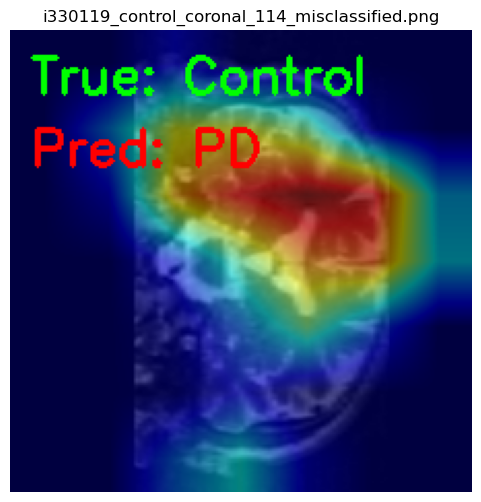

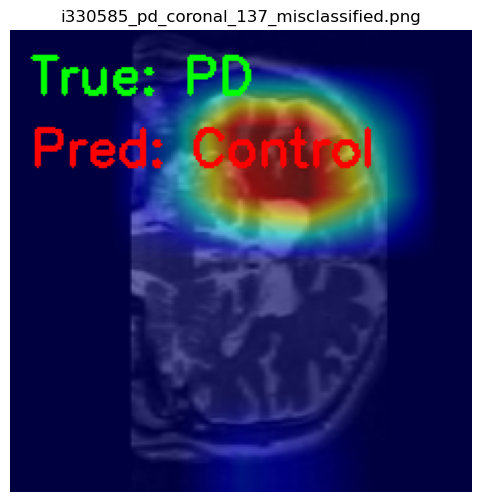

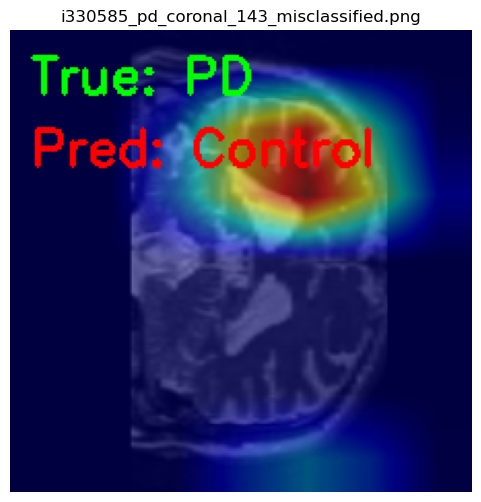

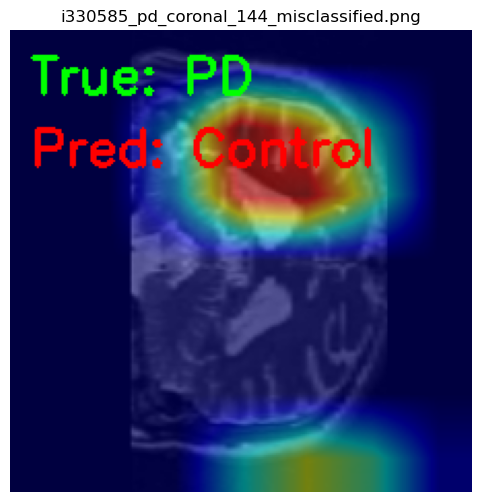

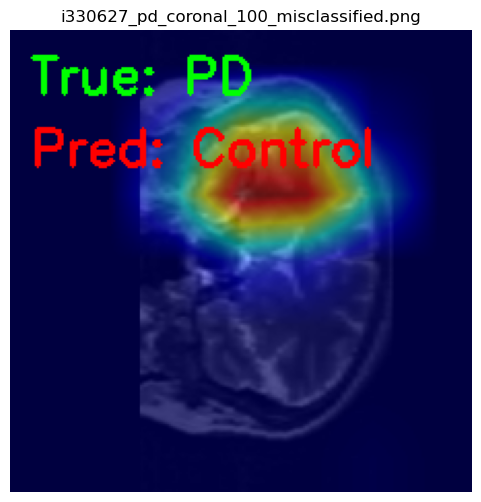

In [8]:
import os
import torch
import torch.nn as nn
from torchvision import models, datasets, transforms
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image

# =========================================
# CONFIGURATION
# =========================================
data_dir = r"D:\PD_coronal_slices\test"      # Test data root
gradcam_dir = r"D:\PD_gradcam_outputs"       # Grad-CAM images folder
output_dir = "PD_misclassified_analysis"
os.makedirs(os.path.join(output_dir, "side_by_side"), exist_ok=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# =========================================
# 1. LOAD MODEL
# =========================================
model = models.resnet50(weights=None)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 3)

state_dict = torch.load("resnet50_PD_finetuned.pth", map_location=device, weights_only=True)
model.load_state_dict(state_dict)
model.to(device)
model.eval()

# =========================================
# 2. LOAD TEST DATASET
# =========================================
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

test_dataset = datasets.ImageFolder(data_dir, transform=transform)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=8, shuffle=False)
class_names = test_dataset.classes
print("Detected class order:", class_names)

# =========================================
# 3. CHECK MISCLASSIFICATIONS
# =========================================
misclassified = []
all_image_paths = [s[0] for s in test_dataset.samples]

with torch.no_grad():
    for idx, (inputs, labels) in enumerate(tqdm(test_loader, desc="Checking misclassifications")):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        preds = torch.argmax(outputs, dim=1)

        for j in range(inputs.size(0)):
            if preds[j] != labels[j]:
                global_index = idx * test_loader.batch_size + j
                filename = os.path.basename(all_image_paths[global_index])
                true_label = class_names[labels[j]]
                pred_label = class_names[preds[j]]
                misclassified.append((filename, true_label, pred_label))

print(f"⚠️ Total misclassified samples: {len(misclassified)}")

# =========================================
# 4. COPY & VISUALIZE MISCLASSIFIED
# =========================================
gradcam_files = os.listdir(gradcam_dir)
copied = 0

for filename, true_label, pred_label in tqdm(misclassified, desc="Saving visual comparisons"):
    base_name = os.path.splitext(filename)[0].lower()
    match = None

    # Match file by partial name (e.g., contains _GradCAM)
    for f in gradcam_files:
        if base_name in f.lower():
            match = os.path.join(gradcam_dir, f)
            break

    if match is None or not os.path.exists(match):
        continue

    grad_img = cv2.imread(match)
    if grad_img is None:
        continue

    # Add true/predicted labels on image
    cv2.putText(grad_img, f"True: {true_label}", (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    cv2.putText(grad_img, f"Pred: {pred_label}", (10, 65),
                cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 2)

    save_path = os.path.join(output_dir, "side_by_side", f"{base_name}_misclassified.png")
    cv2.imwrite(save_path, grad_img)
    copied += 1

print(f"✅ Saved {copied} misclassified Grad-CAMs with labels to: {output_dir}\\side_by_side")

# =========================================
# 5. SHOW FEW EXAMPLES
# =========================================
if copied > 0:
    sample_imgs = os.listdir(os.path.join(output_dir, "side_by_side"))[:5]
    for img_name in sample_imgs:
        img_path = os.path.join(output_dir, "side_by_side", img_name)
        img = Image.open(img_path)
        plt.figure(figsize=(6, 6))
        plt.imshow(img)
        plt.axis("off")
        plt.title(img_name)
        plt.show()
else:
    print("⚠️ No Grad-CAM matches found — check filename consistency.")


In [1]:
import pandas as pd

# Load your CSV file
path = "resnet50_PD_selected_features_cumulative.csv"
df = pd.read_csv(path)

# Check unique class labels (optional)
print("Classes present:", df['class'].unique())

# Filter only PD rows (KEEP the class column)
df_pd = df[df['class'] == "PD"].copy()

# Save to new CSV
output_path = "resnet50_PD_only_with_class.csv"
df_pd.to_csv(output_path, index=False)

print("Filtered PD-only file saved as:", output_path)
print("Shape before:", df.shape, " | Shape after filtering:", df_pd.shape)


Classes present: ['Control' 'PD' 'Prodromal']
Filtered PD-only file saved as: resnet50_PD_only_with_class.csv
Shape before: (4980, 1651)  | Shape after filtering: (3190, 1651)


In [2]:
import pandas as pd

# Load your AD feature file
path = "resedualnetwork50_selected_features_cumulative.csv"
df = pd.read_csv(path)

# Check available classes
print("Classes present:", df['class'].unique())

# Filter only AD rows (KEEP class column)
df_ad = df[df['class'] == "AD"].copy()

# Save filtered file
output_path = "resnet50_AD_only_with_class.csv"
df_ad.to_csv(output_path, index=False)

print("Filtered AD-only file saved as:", output_path)
print("Shape before:", df.shape, " | Shape after filtering:", df_ad.shape)


Classes present: ['AD' 'CN' 'MCI']
Filtered AD-only file saved as: resnet50_AD_only_with_class.csv
Shape before: (157312, 923)  | Shape after filtering: (37120, 923)


In [16]:
import pandas as pd

# ---- PATHS ----
pd_path = "resnet50_PD_only_with_class.csv"
ad_path = "resnet50_AD_only_with_class.csv"

# ---- LOAD DATA ----
df_pd = pd.read_csv(pd_path)
df_ad = pd.read_csv(ad_path)

print("PD shape:", df_pd.shape)
print("AD shape:", df_ad.shape)

# ---- STEP 1: Find common columns ----
pd_cols = set(df_pd.columns)
ad_cols = set(df_ad.columns)

common_cols = list(pd_cols.intersection(ad_cols))

print("Number of common columns:", len(common_cols))

# ---- STEP 2: Align both datasets ----
df_pd_aligned = df_pd[common_cols].copy()
df_ad_aligned = df_ad[common_cols].copy()

print("Aligned PD shape:", df_pd_aligned.shape)
print("Aligned AD shape:", df_ad_aligned.shape)

# ---- STEP 3: Merge into one dataset ----
df_merged = pd.concat([df_pd_aligned, df_ad_aligned], axis=0).reset_index(drop=True)

print("Merged dataset shape:", df_merged.shape)

# ---- STEP 4: Save merged dataset ----
output_path = "AD_PD_merged_features.csv"
df_merged.to_csv(output_path, index=False)

print("Merged file saved as:", output_path)


PD shape: (3190, 1651)
AD shape: (37120, 923)
Number of common columns: 734
Aligned PD shape: (3190, 734)
Aligned AD shape: (37120, 734)
Merged dataset shape: (40310, 734)
Merged file saved as: AD_PD_merged_features.csv


In [4]:
import pandas as pd
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Load merged dataset
df = pd.read_csv("AD_PD_merged_features.csv")

# Extract labels
y = df["class"]

# Get class labels
class_labels = np.unique(y)
print("Classes:", class_labels)

# Compute weights
class_weights = compute_class_weight(
    class_weight="balanced",
    classes=class_labels,
    y=y
)

class_weights_dict = {cls: weight for cls, weight in zip(class_labels, class_weights)}

print("\nClass Weights:")
print(class_weights_dict)


Classes: ['AD' 'PD']

Class Weights:
{'AD': 0.54296875, 'PD': 6.318181818181818}


Number of numeric features used for UMAP: 732


d:\Anaconda\envs\torch_gpu\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\umap\spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\umap\spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\umap\spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to

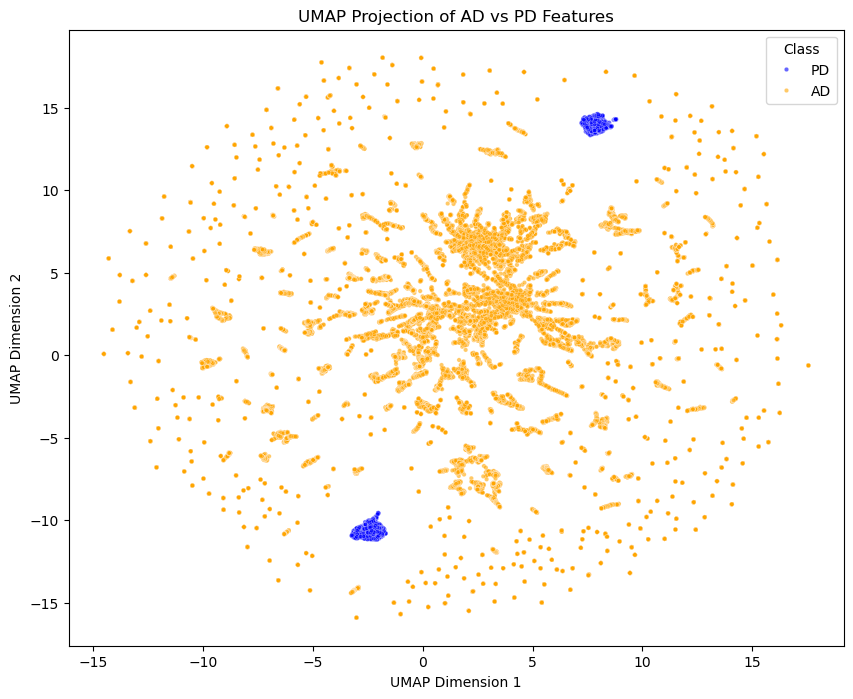

In [6]:
import pandas as pd
import umap
import matplotlib.pyplot as plt
import seaborn as sns

# Load merged dataset
df = pd.read_csv("AD_PD_merged_features.csv")

# Separate labels
y = df["class"]

# Keep only numeric columns (exclude strings like 'path', 'ID')
X = df.select_dtypes(include=['float64', 'float32', 'int64', 'int32'])

print("Number of numeric features used for UMAP:", X.shape[1])

# Initialize UMAP
reducer = umap.UMAP(
    n_neighbors=30,
    min_dist=0.1,
    n_components=2,
    random_state=42
)

# Fit and transform numeric features
X_umap = reducer.fit_transform(X)

# Create a DataFrame for plotting
umap_df = pd.DataFrame({
    "UMAP1": X_umap[:, 0],
    "UMAP2": X_umap[:, 1],
    "class": y
})

# Plot
plt.figure(figsize=(10, 8))
sns.scatterplot(
    data=umap_df, 
    x="UMAP1", 
    y="UMAP2", 
    hue="class", 
    palette={"AD":"orange", "PD":"blue"},
    alpha=0.6,
    s=10
)
plt.title("UMAP Projection of AD vs PD Features")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.legend(title="Class")
plt.show()


d:\Anaconda\envs\torch_gpu\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


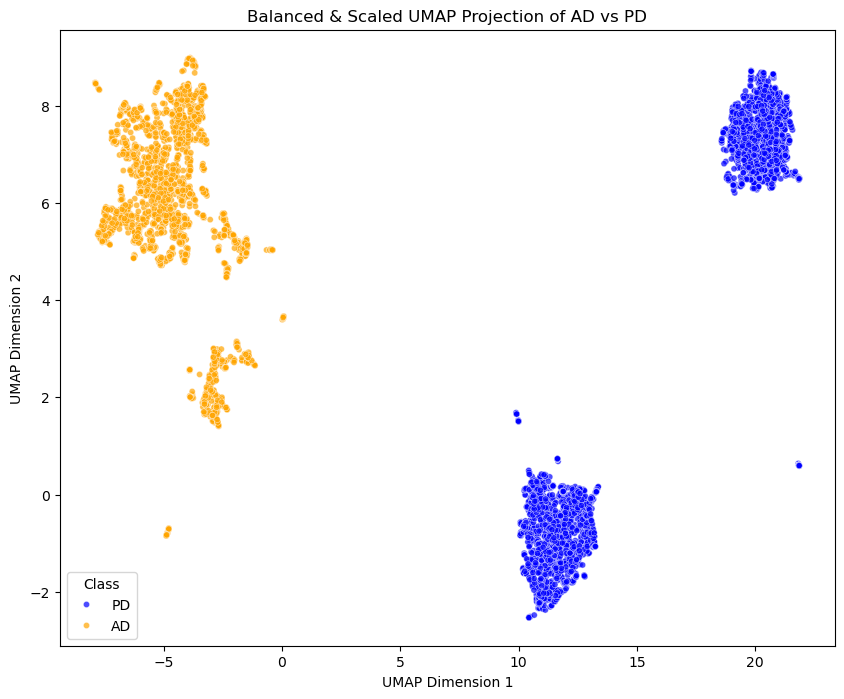

In [7]:
import pandas as pd
import umap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

# Load merged dataset
df = pd.read_csv("AD_PD_merged_features.csv")

# Separate PD and AD
df_pd = df[df['class']=='PD']
df_ad = df[df['class']=='AD']

# Undersample AD to match PD
df_ad_sampled = df_ad.sample(n=len(df_pd), random_state=42)

# Combine balanced dataset
df_balanced = pd.concat([df_pd, df_ad_sampled]).reset_index(drop=True)

# Labels
y_bal = df_balanced['class']

# Keep only numeric columns
X_bal = df_balanced.select_dtypes(include=['float64','float32','int64','int32'])

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_bal)

# Initialize UMAP with tuned parameters
reducer = umap.UMAP(
    n_neighbors=15,   # smaller neighborhood for balanced clusters
    min_dist=0.0,     # allow tighter packing
    n_components=2,
    random_state=42
)

# Fit and transform
X_umap_bal = reducer.fit_transform(X_scaled)

# Create plotting DataFrame
umap_df = pd.DataFrame({
    "UMAP1": X_umap_bal[:,0],
    "UMAP2": X_umap_bal[:,1],
    "class": y_bal
})

# Plot
plt.figure(figsize=(10,8))
sns.scatterplot(
    data=umap_df,
    x="UMAP1",
    y="UMAP2",
    hue="class",
    palette={"AD":"orange", "PD":"blue"},
    s=20,
    alpha=0.7
)
plt.title("Balanced & Scaled UMAP Projection of AD vs PD")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.legend(title="Class")
plt.show()


In [8]:
print(df.columns)


Index(['f382', 'f308', 'f851', 'f600', 'f1151', 'f1093', 'f896', 'f219',
       'f1804', 'f610',
       ...
       'f813', 'f1960', 'f852', 'f126', 'f475', 'f1108', 'f479', 'f1416',
       'f1621', 'f1666'],
      dtype='object', length=734)


In [9]:
print(df['class'].unique())


['PD' 'AD']


Before VarianceThreshold: (40310, 732)
After VarianceThreshold: (40310, 732)
After PCA: (40310, 50)


d:\Anaconda\envs\torch_gpu\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


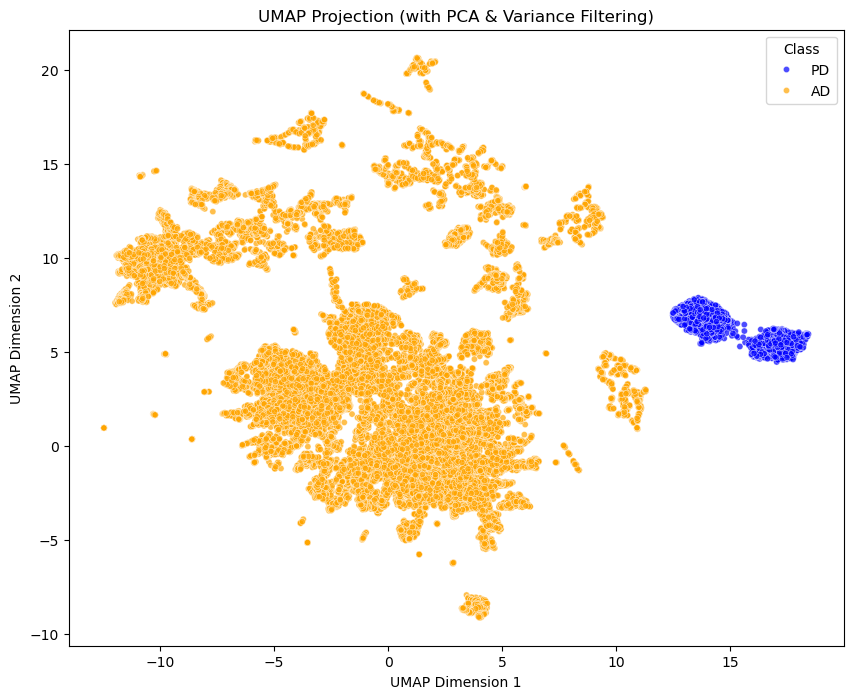

In [10]:
import pandas as pd
import umap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.decomposition import PCA

# -------------------------------
# 1. Load the dataset
# -------------------------------
df = pd.read_csv("AD_PD_merged_features.csv")

# Class labels
y = df["class"]

# Numeric features only
X = df.select_dtypes(include=['float64','float32','int64','int32'])

# -------------------------------
# 2. Remove low-variance features
# -------------------------------
print("Before VarianceThreshold:", X.shape)

selector = VarianceThreshold(threshold=1e-4)
X_var = selector.fit_transform(X)

print("After VarianceThreshold:", X_var.shape)

# -------------------------------
# 3. Standard scaling
# -------------------------------
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_var)

# -------------------------------
# 4. PCA (dramatically stabilizes UMAP)
# -------------------------------
pca = PCA(n_components=50, random_state=42)
X_pca = pca.fit_transform(X_scaled)

print("After PCA:", X_pca.shape)

# -------------------------------
# 5. UMAP with overlap-friendly parameters
# -------------------------------
reducer = umap.UMAP(
    n_neighbors=50,
    min_dist=0.3,
    metric='euclidean',
    n_components=2,
    random_state=42
)

X_umap = reducer.fit_transform(X_pca)

# -------------------------------
# 6. Plot
# -------------------------------
umap_df = pd.DataFrame({
    "UMAP1": X_umap[:, 0],
    "UMAP2": X_umap[:, 1],
    "class": y
})

plt.figure(figsize=(10, 8))
sns.scatterplot(
    data=umap_df,
    x="UMAP1",
    y="UMAP2",
    hue="class",
    palette={"AD": "orange", "PD": "blue"},
    s=20,
    alpha=0.7
)

plt.title("UMAP Projection (with PCA & Variance Filtering)")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.legend(title="Class")
plt.show()


In [14]:
import pandas as pd
import numpy as np
from neurocombat_sklearn import CombatModel
import umap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# --------------------------
# Load CSV
# --------------------------
df = pd.read_csv("AD_PD_merged_features.csv")

# features
X = df.select_dtypes(include=['float32','float64','int32','int64'])
y = df["class"]

# --------------------------
# Create batch variable
# If AD and PD come from different datasets
# --------------------------
df["batch"] = df["class"]

batch = df["batch"]

# --------------------------
# 1) ComBat Harmonization
# --------------------------
combat = CombatModel()

X_combat = combat.fit_transform(X, batch=class)

print("Before:", X.shape)
print("After:", X_combat.shape)

# --------------------------
# 2) Standardize
# --------------------------
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_combat)

# --------------------------
# 3) PCA 50 components
# --------------------------
pca = PCA(n_components=50, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# --------------------------
# 4) UMAP 
# --------------------------
reducer = umap.UMAP(
    n_neighbors=50,
    min_dist=0.3,
    random_state=42
)

X_umap = reducer.fit_transform(X_pca)

# --------------------------
# 5) Plot
# --------------------------
umap_df = pd.DataFrame({
    "UMAP1": X_umap[:,0],
    "UMAP2": X_umap[:,1],
    "class": y
})

plt.figure(figsize=(10,8))
sns.scatterplot(
    data=umap_df,
    x="UMAP1",
    y="UMAP2",
    hue="class",
    palette={"AD":"orange", "PD":"blue"},
    alpha=0.7,
    s=20
)
plt.title("UMAP After ComBat Harmonization")
plt.show()


SyntaxError: invalid syntax (3871265745.py, line 32)

In [15]:
# --------------------------
# 1) Import Libraries
# --------------------------
import pandas as pd
from neuroHarmonize import harmonization

# --------------------------
# 2) Load your CSV
# --------------------------
# Replace with your CSV path
data = pd.read_csv("merged_AD_PD.csv")

# Suppose your features are all columns except 'batch' and 'diagnosis'
feature_cols = [col for col in data.columns if col not in ['batch', 'diagnosis']]
X = data[feature_cols].values

# --------------------------
# 3) Prepare covariates
# --------------------------
# 'batch' column should indicate scanner/site or group (AD/PD source)
covars = data[['class']]  # can also include age, sex, etc. if needed

# --------------------------
# 4) Apply ComBat Harmonization
# --------------------------
X_combat, model = harmonization.combat(X, covars, batch_col='batch')

# --------------------------
# 5) Replace original features with harmonized ones
# --------------------------
data_harmonized = data.copy()
data_harmonized[feature_cols] = X_combat

# --------------------------
# 6) Save harmonized CSV
# --------------------------
data_harmonized.to_csv("merged_AD_PD_harmonized.csv", index=False)

print("Harmonization complete. Saved to merged_AD_PD_harmonized.csv")


ModuleNotFoundError: No module named 'neuroHarmonize'

In [1]:
import pandas as pd

# -------------------------
# 1. Load the dataset
# -------------------------
file_path = "resnet50_PD_selected_features_cumulative.csv"
df = pd.read_csv(file_path)

print("Original class distribution:")
print(df['class'].value_counts())

# -------------------------
# 2. Keep only Control and PD
# -------------------------
df_filtered = df[df['class'].isin(['Control', 'PD'])].copy()

print("\nFiltered class distribution:")
print(df_filtered['class'].value_counts())

# -------------------------
# 3. (Optional) Encode labels
# Control = 0 (Non-dementia)
# PD = 1 (Dementia)
# -------------------------
df_filtered['label'] = df_filtered['class'].map({
    'Control': 0,
    'PD': 1
})

# -------------------------
# 4. Verify feature columns
# -------------------------
feature_cols = [c for c in df_filtered.columns if c.startswith('f')]
print(f"\nNumber of feature columns: {len(feature_cols)}")

# -------------------------
# 5. Save to new CSV
# -------------------------
output_path = "PD_vs_Control_features.csv"
df_filtered.to_csv(output_path, index=False)

print("\nSaved filtered dataset to:")
print(output_path)


Original class distribution:
class
PD           3190
Control      1200
Prodromal     590
Name: count, dtype: int64

Filtered class distribution:
class
PD         3190
Control    1200
Name: count, dtype: int64

Number of feature columns: 1650

Saved filtered dataset to:
PD_vs_Control_features.csv


Unique subjects: 439
Samples: 4390
Train subjects: 351
Test subjects: 88

Classification Report:
                        precision    recall  f1-score   support

Control (Non-Dementia)       0.82      0.72      0.77       220
         PD (Dementia)       0.91      0.95      0.93       660

              accuracy                           0.89       880
             macro avg       0.86      0.83      0.85       880
          weighted avg       0.89      0.89      0.89       880



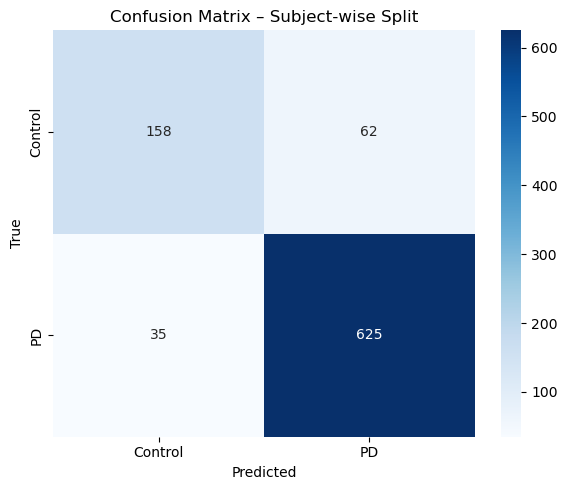

ROC-AUC: 0.937


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

# -------------------------
# 1. Load dataset
# -------------------------
df = pd.read_csv("PD_vs_Control_features.csv")

# -------------------------
# 2. Extract subject ID
# -------------------------
df['subject_id'] = df['filename'].apply(lambda x: x.split('_')[0])

print("Unique subjects:", df['subject_id'].nunique())
print("Samples:", len(df))

# -------------------------
# 3. Prepare features & labels
# -------------------------
feature_cols = [
    col for col in df.columns
    if col not in ['filename', 'class', 'label', 'subject_id']
]

X = df[feature_cols].values
y = df['label'].values
groups = df['subject_id'].values

# -------------------------
# 4. SUBJECT-WISE split
# -------------------------
gss = GroupShuffleSplit(
    n_splits=1,
    test_size=0.2,
    random_state=42
)

train_idx, test_idx = next(gss.split(X, y, groups))

X_train, X_test = X[train_idx], X[test_idx]
y_train, y_test = y[train_idx], y[test_idx]

print("Train subjects:", len(set(groups[train_idx])))
print("Test subjects:", len(set(groups[test_idx])))

# -------------------------
# 5. Scaling
# -------------------------
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# -------------------------
# 6. Classifier
# -------------------------
clf = RandomForestClassifier(
    n_estimators=400,
    class_weight='balanced',
    random_state=42,
    n_jobs=-1
)

clf.fit(X_train, y_train)

# -------------------------
# 7. Evaluation
# -------------------------
y_pred = clf.predict(X_test)
y_prob = clf.predict_proba(X_test)[:, 1]

print("\nClassification Report:")
print(classification_report(
    y_test,
    y_pred,
    target_names=['Control (Non-Dementia)', 'PD (Dementia)']
))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(
    cm, annot=True, fmt='d', cmap='Blues',
    xticklabels=['Control', 'PD'],
    yticklabels=['Control', 'PD']
)
plt.title("Confusion Matrix – Subject-wise Split")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.tight_layout()
plt.show()

# ROC-AUC
auc = roc_auc_score(y_test, y_prob)
print(f"ROC-AUC: {auc:.3f}")


In [3]:
import pandas as pd

# -------------------------
# Load AD dataset
# -------------------------
df = pd.read_csv("resedualnetwork50_selected_features_cumulative.csv")

print("Original class distribution:")
print(df['class'].value_counts())

# -------------------------
# Keep only AD and CN
# -------------------------
df = df[df['class'].isin(['AD', 'CN'])].copy()

print("\nFiltered class distribution:")
print(df['class'].value_counts())

# -------------------------
# Encode labels
# -------------------------
df['label'] = df['class'].map({
    'CN': 0,   # Non-dementia
    'AD': 1    # Dementia
})

# -------------------------
# Identify feature columns
# -------------------------
feature_cols = [
    col for col in df.columns
    if col not in ['filename', 'class', 'label']
]

print("\nNumber of feature columns:", len(feature_cols))

# -------------------------
# Save clean dataset
# -------------------------
df[['filename', 'label'] + feature_cols].to_csv(
    "AD_vs_CN_features.csv",
    index=False
)

print("\nSaved filtered dataset to:")
print("AD_vs_CN_features.csv")


Original class distribution:
class
MCI    71232
CN     48960
AD     37120
Name: count, dtype: int64

Filtered class distribution:
class
CN    48960
AD    37120
Name: count, dtype: int64

Number of feature columns: 921

Saved filtered dataset to:
AD_vs_CN_features.csv


Unique subjects: 56
Samples: 86080
Train subjects: 44
Test subjects: 12

Classification Report:
                   precision    recall  f1-score   support

CN (Non-Dementia)       0.98      0.99      0.99     11200
    AD (Dementia)       0.98      0.98      0.98      8768

         accuracy                           0.98     19968
        macro avg       0.98      0.98      0.98     19968
     weighted avg       0.98      0.98      0.98     19968



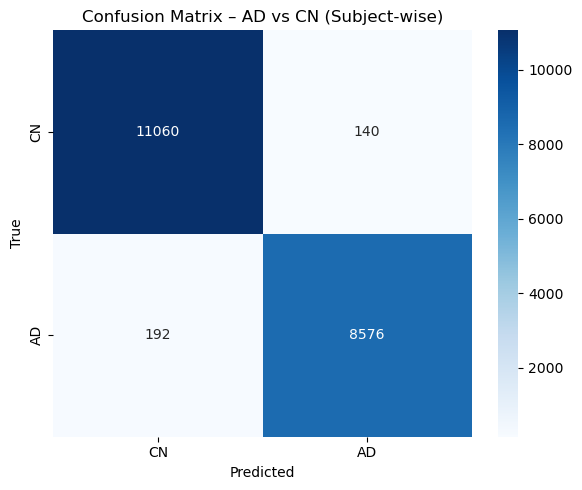

ROC–AUC: 0.998


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

# -------------------------
# Load dataset
# -------------------------
df = pd.read_csv("AD_vs_CN_features.csv")

# -------------------------
# Extract subject ID
# -------------------------
df['subject_id'] = df['filename'].apply(lambda x: x.split('_')[0])

print("Unique subjects:", df['subject_id'].nunique())
print("Samples:", len(df))

# -------------------------
# Prepare data
# -------------------------
feature_cols = [
    c for c in df.columns
    if c not in ['filename', 'class', 'label', 'subject_id']
]

X = df[feature_cols].values
y = df['label'].values
groups = df['subject_id'].values

# -------------------------
# Subject-wise split
# -------------------------
gss = GroupShuffleSplit(
    n_splits=1,
    test_size=0.2,
    random_state=42
)

train_idx, test_idx = next(gss.split(X, y, groups))

X_train, X_test = X[train_idx], X[test_idx]
y_train, y_test = y[train_idx], y[test_idx]

print("Train subjects:", len(set(groups[train_idx])))
print("Test subjects:", len(set(groups[test_idx])))

# -------------------------
# Scaling
# -------------------------
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# -------------------------
# Classifier
# -------------------------
clf = RandomForestClassifier(
    n_estimators=400,
    class_weight='balanced',
    random_state=42,
    n_jobs=-1
)

clf.fit(X_train, y_train)

# -------------------------
# Evaluation
# -------------------------
y_pred = clf.predict(X_test)
y_prob = clf.predict_proba(X_test)[:, 1]

print("\nClassification Report:")
print(classification_report(
    y_test,
    y_pred,
    target_names=['CN (Non-Dementia)', 'AD (Dementia)']
))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(
    cm, annot=True, fmt='d', cmap='Blues',
    xticklabels=['CN', 'AD'],
    yticklabels=['CN', 'AD']
)
plt.title("Confusion Matrix – AD vs CN (Subject-wise)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.tight_layout()
plt.show()

# ROC-AUC
auc = roc_auc_score(y_test, y_prob)
print(f"ROC–AUC: {auc:.3f}")


Unique subjects: 56
Samples: 86080
Train subjects: 44
Test subjects: 12

Classification Report:
                   precision    recall  f1-score   support

CN (Non-Dementia)       0.98      0.99      0.99     11200
    AD (Dementia)       0.98      0.98      0.98      8768

         accuracy                           0.98     19968
        macro avg       0.98      0.98      0.98     19968
     weighted avg       0.98      0.98      0.98     19968



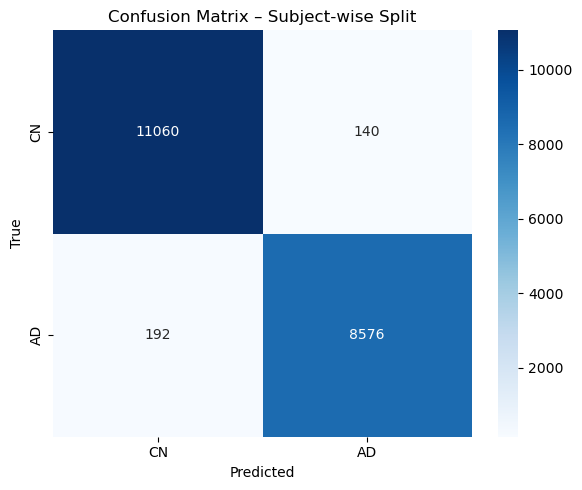

ROC-AUC: 0.998


In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

# -------------------------
# 1. Load dataset
# -------------------------
df = pd.read_csv("AD_vs_CN_features.csv")

# -------------------------
# 2. Extract subject ID
# -------------------------
df['subject_id'] = df['filename'].apply(lambda x: x.split('_')[0])

print("Unique subjects:", df['subject_id'].nunique())
print("Samples:", len(df))

# -------------------------
# 3. Prepare features & labels
# -------------------------
feature_cols = [
    col for col in df.columns
    if col not in ['filename', 'class', 'label', 'subject_id']
]

X = df[feature_cols].values
y = df['label'].values
groups = df['subject_id'].values

# -------------------------
# 4. SUBJECT-WISE split
# -------------------------
gss = GroupShuffleSplit(
    n_splits=1,
    test_size=0.2,
    random_state=42
)

train_idx, test_idx = next(gss.split(X, y, groups))

X_train, X_test = X[train_idx], X[test_idx]
y_train, y_test = y[train_idx], y[test_idx]

print("Train subjects:", len(set(groups[train_idx])))
print("Test subjects:", len(set(groups[test_idx])))

# -------------------------
# 5. Scaling
# -------------------------
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# -------------------------
# 6. Classifier
# -------------------------
clf = RandomForestClassifier(
    n_estimators=400,
    class_weight='balanced',
    random_state=42,
    n_jobs=-1
)

clf.fit(X_train, y_train)

# -------------------------
# 7. Evaluation
# -------------------------
y_pred = clf.predict(X_test)
y_prob = clf.predict_proba(X_test)[:, 1]

print("\nClassification Report:")
print(classification_report(
    y_test,
    y_pred,
    target_names=['CN (Non-Dementia)', 'AD (Dementia)']
))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(
    cm, annot=True, fmt='d', cmap='Blues',
    xticklabels=['CN', 'AD'],
    yticklabels=['CN', 'AD']
)
plt.title("Confusion Matrix – Subject-wise Split")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.tight_layout()
plt.show()

# ROC-AUC
auc = roc_auc_score(y_test, y_prob)
print(f"ROC-AUC: {auc:.3f}")


In [6]:
# =========================
# Final Dementia Model: AD+PD vs CN+Control
# =========================

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

# -------------------------
# 1. Load datasets
# -------------------------
ad_cn_path = "AD_vs_CN_features.csv"
pd_control_path = "PD_vs_Control_features.csv"

ad_cn_df = pd.read_csv(ad_cn_path)
pd_control_df = pd.read_csv(pd_control_path)

# -------------------------
# 2. Merge datasets
# -------------------------
all_df = pd.concat([ad_cn_df, pd_control_df], ignore_index=True)

# Optional: keep filename for reference, but exclude from features
filenames = all_df['filename']
X = all_df.drop(columns=['label','filename'])
y = all_df['label']

print("Number of samples:", len(y))
print("Class distribution:\n", y.value_counts())
print("Number of feature columns:", X.shape[1])

# -------------------------
# 3. Train/test split
# -------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# -------------------------
# 4. Feature scaling
# -------------------------
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# -------------------------
# 5. Train Random Forest
# -------------------------
clf = RandomForestClassifier(n_estimators=500, random_state=42, n_jobs=-1)
clf.fit(X_train, y_train)

# -------------------------
# 6. Predictions
# -------------------------
y_pred = clf.predict(X_test)
y_prob = clf.predict_proba(X_test)[:,1]  # probability for dementia class (1)

# -------------------------
# 7. Evaluation
# -------------------------
print("=== Classification Report ===")
print(classification_report(y_test, y_pred, target_names=['Non-Dementia','Dementia']))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Dementia','Dementia'], yticklabels=['Non-Dementia','Dementia'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# ROC-AUC
auc = roc_auc_score(y_test, y_prob)
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, label=f"AUC = {auc:.3f}", color='darkorange', linewidth=2)
plt.plot([0,1],[0,1], color='navy', linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Dementia Classification")
plt.legend(loc="lower right")
plt.show()
print("ROC-AUC:", auc)

# -------------------------
# 8. Feature importance (optional)
# -------------------------
importances = clf.feature_importances_
feature_names = X.columns
feat_df = pd.DataFrame({'feature': feature_names, 'importance': importances}).sort_values(by='importance', ascending=False)

print("=== Top 20 Important Features ===")
print(feat_df.head(20))

# -------------------------
# 9. Save model and scaler
# -------------------------
joblib.dump(clf, "final_dementia_model.pkl")
joblib.dump(scaler, "final_dementia_scaler.pkl")


Number of samples: 90470
Class distribution:
 label
0    50160
1    40310
Name: count, dtype: int64
Number of feature columns: 1839


ValueError: could not convert string to float: 'PD'

d:\Anaconda\envs\torch_gpu\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Number of samples: 90470
Class distribution:
 label
0    50160
1    40310
Name: count, dtype: int64
Number of feature columns: 1838
=== Classification Report ===
              precision    recall  f1-score   support

Non-Dementia       0.99      0.99      0.99     10032
    Dementia       0.98      0.99      0.99      8062

    accuracy                           0.99     18094
   macro avg       0.99      0.99      0.99     18094
weighted avg       0.99      0.99      0.99     18094



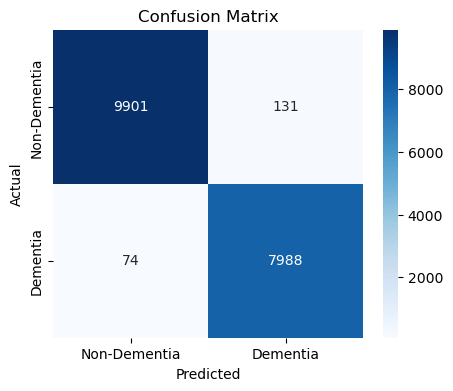

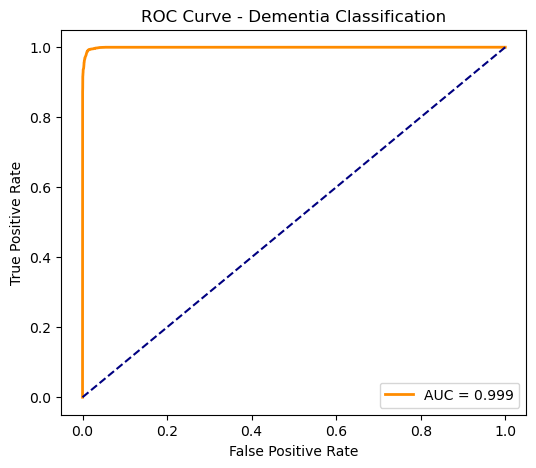

ROC-AUC: 0.9994079723846727
=== Top 20 Important Features ===
    feature  importance
14     f514    0.029506
10     f273    0.027888
44     f466    0.026830
11     f418    0.021665
9      f126    0.020663
176   f2048    0.019584
20     f281    0.018869
175    f513    0.018341
91     f283    0.018122
160    f123    0.016544
166   f1731    0.016021
177   f1688    0.015081
173   f1608    0.014944
162    f485    0.014569
35     f880    0.014190
26     f114    0.014003
567   f2017    0.013833
257      f8    0.013259
330   f1520    0.012868
172   f1296    0.012483


ValueError: Input contains NaN.

In [7]:
# =========================
# Final Dementia Model with Clustering Visualization
# =========================

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import umap

# -------------------------
# 1. Load datasets
# -------------------------
ad_cn_path = "AD_vs_CN_features.csv"
pd_control_path = "PD_vs_Control_features.csv"

ad_cn_df = pd.read_csv(ad_cn_path)
pd_control_df = pd.read_csv(pd_control_path)

# -------------------------
# 2. Merge datasets
# -------------------------
all_df = pd.concat([ad_cn_df, pd_control_df], ignore_index=True)

# -------------------------
# 3. Separate features and labels
# -------------------------
# Keep 'filename' for reference but remove from features
filenames = all_df['filename']
y = all_df['label']

# Select only numeric feature columns
X = all_df.select_dtypes(include=[np.number]).drop(columns=['label'])

print("Number of samples:", len(y))
print("Class distribution:\n", y.value_counts())
print("Number of feature columns:", X.shape[1])

# -------------------------
# 4. Train/test split
# -------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# -------------------------
# 5. Feature scaling
# -------------------------
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# -------------------------
# 6. Train Random Forest
# -------------------------
clf = RandomForestClassifier(n_estimators=500, random_state=42, n_jobs=-1)
clf.fit(X_train, y_train)

# -------------------------
# 7. Predictions
# -------------------------
y_pred = clf.predict(X_test)
y_prob = clf.predict_proba(X_test)[:,1]  # probability for dementia class (1)

# -------------------------
# 8. Evaluation
# -------------------------
print("=== Classification Report ===")
print(classification_report(y_test, y_pred, target_names=['Non-Dementia','Dementia']))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Dementia','Dementia'], yticklabels=['Non-Dementia','Dementia'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# ROC-AUC
auc = roc_auc_score(y_test, y_prob)
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, label=f"AUC = {auc:.3f}", color='darkorange', linewidth=2)
plt.plot([0,1],[0,1], color='navy', linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Dementia Classification")
plt.legend(loc="lower right")
plt.show()
print("ROC-AUC:", auc)

# -------------------------
# 9. Feature importance (optional)
# -------------------------
importances = clf.feature_importances_
feature_names = X.columns
feat_df = pd.DataFrame({'feature': feature_names, 'importance': importances}).sort_values(by='importance', ascending=False)

print("=== Top 20 Important Features ===")
print(feat_df.head(20))

# -------------------------
# 10. Save model and scaler
# -------------------------
joblib.dump(clf, "final_dementia_model.pkl")
joblib.dump(scaler, "final_dementia_scaler.pkl")

# -------------------------
# 11. UMAP Visualization of clusters
# -------------------------
reducer = umap.UMAP(n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=42)
X_umap = reducer.fit_transform(X)  # use all samples for visualization

umap_df = pd.DataFrame({
    'UMAP1': X_umap[:,0],
    'UMAP2': X_umap[:,1],
    'label': y,
    'filename': filenames
})

# Map labels to names
umap_df['label_name'] = umap_df['label'].map({0:'Non-Dementia', 1:'Dementia'})

plt.figure(figsize=(8,6))
sns.scatterplot(
    x='UMAP1', y='UMAP2',
    hue='label_name',
    palette={'Non-Dementia':'blue','Dementia':'red'},
    data=umap_df,
    alpha=0.6,
    s=40
)
plt.title("UMAP Visualization: Dementia vs Non-Dementia")
plt.legend()
plt.show()


=== Classification Report ===
              precision    recall  f1-score   support

Non-Dementia       0.99      0.99      0.99     10032
    Dementia       0.98      0.99      0.99      8062

    accuracy                           0.99     18094
   macro avg       0.99      0.99      0.99     18094
weighted avg       0.99      0.99      0.99     18094



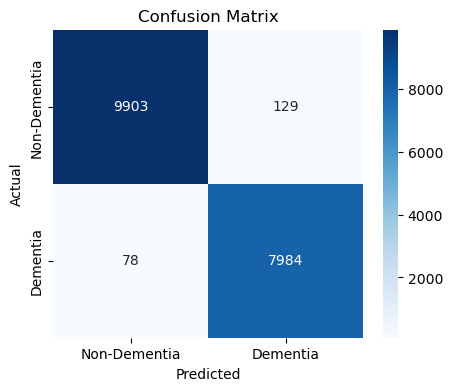

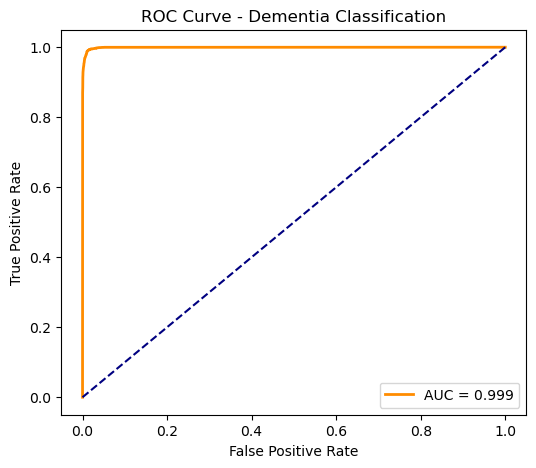

ROC-AUC: 0.9994127882811717
=== Top 20 Important Features ===
    feature  importance
14     f514    0.023323
176   f2048    0.022083
20     f281    0.021597
9      f126    0.021264
173   f1608    0.021112
35     f880    0.020453
160    f123    0.019001
166   f1731    0.017030
138    f956    0.016979
257      f8    0.016925
637   f1218    0.016776
172   f1296    0.016067
58     f739    0.015901
46    f1940    0.015520
400   f1502    0.014079
89     f293    0.014043
34      f56    0.014004
159    f457    0.013595
165   f1413    0.013497
330   f1520    0.013431


d:\Anaconda\envs\torch_gpu\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\manifold\_spectral_embedding.py:328: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\manifold\_spectral_embedding.py:453: UserWarning: Exited at iteration 113 with accuracies 
[6.67116780e-07 4.21683270e-06 1.91033958e-06 2.69883577e-05]
not reaching the requested tolerance 3.5762786865234375e-06.
Use iteration 113 instead with accuracy 
8.445661683391545e-06.

  _, diffusion_map = lobpcg(
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\manifold\_spectral_embedding.py:453: UserWarning: Exited postprocessing with accuracies 
[6.67118909e-07 4.21683259e-06 1.91033912e-06 2.69883577e-05]
not reaching the requested tolerance 3.5762786865234375e-06.
  _, dif

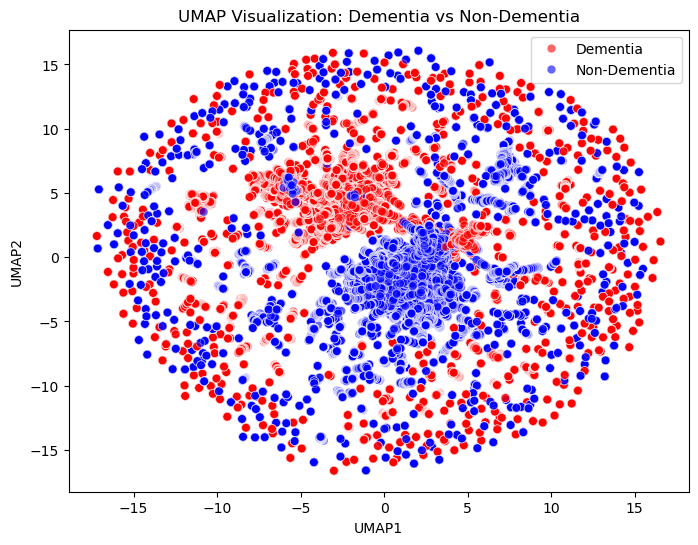

In [9]:
# =========================
# Final Dementia Model Pipeline with NaN Handling & UMAP Clustering
# =========================

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import umap

# -------------------------
# 1. Load datasets
# -------------------------
ad_cn_path = "AD_vs_CN_features.csv"
pd_control_path = "PD_vs_Control_features.csv"

ad_cn_df = pd.read_csv(ad_cn_path)
pd_control_df = pd.read_csv(pd_control_path)

# -------------------------
# 2. Merge datasets
# -------------------------
all_df = pd.concat([ad_cn_df, pd_control_df], ignore_index=True)

# -------------------------
# 3. Separate features and labels
# -------------------------
# Keep 'filename' for reference but remove from features
filenames = all_df['filename']
y = all_df['label']

# Select only numeric feature columns
X = all_df.select_dtypes(include=[np.number]).drop(columns=['label'])

# -------------------------
# 4. Handle missing values (NaNs)
# -------------------------
X = X.fillna(X.mean())  # fill NaNs with column mean

# -------------------------
# 5. Train/test split
# -------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# -------------------------
# 6. Feature scaling
# -------------------------
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# -------------------------
# 7. Train Random Forest
# -------------------------
clf = RandomForestClassifier(n_estimators=500, random_state=42, n_jobs=-1)
clf.fit(X_train, y_train)

# -------------------------
# 8. Predictions
# -------------------------
y_pred = clf.predict(X_test)
y_prob = clf.predict_proba(X_test)[:,1]  # probability for dementia class (1)

# -------------------------
# 9. Evaluation
# -------------------------
print("=== Classification Report ===")
print(classification_report(y_test, y_pred, target_names=['Non-Dementia','Dementia']))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Dementia','Dementia'], yticklabels=['Non-Dementia','Dementia'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# ROC-AUC
auc = roc_auc_score(y_test, y_prob)
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, label=f"AUC = {auc:.3f}", color='darkorange', linewidth=2)
plt.plot([0,1],[0,1], color='navy', linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Dementia Classification")
plt.legend(loc="lower right")
plt.show()
print("ROC-AUC:", auc)

# -------------------------
# 10. Feature importance (optional)
# -------------------------
importances = clf.feature_importances_
feature_names = X.columns
feat_df = pd.DataFrame({'feature': feature_names, 'importance': importances}).sort_values(by='importance', ascending=False)

print("=== Top 20 Important Features ===")
print(feat_df.head(20))

# -------------------------
# 11. Save model and scaler
# -------------------------
joblib.dump(clf, "final_dementia_model.pkl")
joblib.dump(scaler, "final_dementia_scaler.pkl")

# -------------------------
# 12. UMAP Visualization of clusters
# -------------------------
# Scale all features for UMAP
X_scaled = scaler.transform(X)

reducer = umap.UMAP(n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=42)
X_umap = reducer.fit_transform(X_scaled)

umap_df = pd.DataFrame({
    'UMAP1': X_umap[:,0],
    'UMAP2': X_umap[:,1],
    'label': y,
    'filename': filenames
})

# Map labels to names
umap_df['label_name'] = umap_df['label'].map({0:'Non-Dementia', 1:'Dementia'})

plt.figure(figsize=(8,6))
sns.scatterplot(
    x='UMAP1', y='UMAP2',
    hue='label_name',
    palette={'Non-Dementia':'blue','Dementia':'red'},
    data=umap_df,
    alpha=0.6,
    s=40
)
plt.title("UMAP Visualization: Dementia vs Non-Dementia")
plt.legend()
plt.show()


d:\Anaconda\envs\torch_gpu\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\manifold\_spectral_embedding.py:328: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\manifold\_spectral_embedding.py:453: UserWarning: Exited at iteration 99 with accuracies 
[2.41304092e-06 2.29093269e-06 2.45818291e-06 2.55748764e-04]
not reaching the requested tolerance 3.4868717193603516e-06.
Use iteration 99 instead with accuracy 
6.57277302142956e-05.

  _, diffusion_map = lobpcg(
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\manifold\_spectral_embedding.py:453: UserWarning: Exited postprocessing with accuracies 
[2.41304030e-06 2.29093333e-06 2.45818293e-06 2.55748764e-04]
not reaching the requested tolerance 3.4868717193603516e-06.
  _, diffus

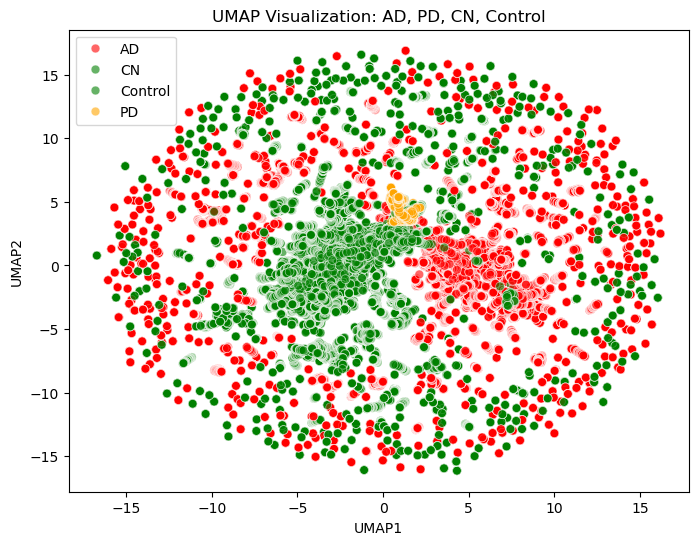

In [11]:
# =========================
# UMAP Visualization of all subgroups: AD, PD, CN, Control
# =========================

import pandas as pd
import numpy as np
import umap
import matplotlib.pyplot as plt
import seaborn as sns

# Load datasets
ad_cn_df = pd.read_csv("AD_vs_CN_features.csv")
pd_control_df = pd.read_csv("PD_vs_Control_features.csv")

# Add a 'subgroup' column to keep track
ad_cn_df['subgroup'] = ad_cn_df['filename'].apply(lambda x: 'AD' if 'AD' in x else 'CN')
pd_control_df['subgroup'] = pd_control_df['filename'].apply(lambda x: 'PD' if 'PD' in x else 'Control')

# Merge datasets
all_df = pd.concat([ad_cn_df, pd_control_df], ignore_index=True)

# Features
X = all_df.select_dtypes(include=[np.number]).drop(columns=['label'])
X = X.fillna(X.mean())  # handle NaNs

# Subgroup labels
subgroups = all_df['subgroup']

# Scale features for UMAP
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# UMAP projection
reducer = umap.UMAP(n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=42)
X_umap = reducer.fit_transform(X_scaled)

# Create DataFrame for visualization
umap_df = pd.DataFrame({
    'UMAP1': X_umap[:,0],
    'UMAP2': X_umap[:,1],
    'subgroup': subgroups
})

# Plot
plt.figure(figsize=(8,6))
palette = {'AD':'red', 'PD':'orange', 'CN':'green', 'Control':'green'}
sns.scatterplot(
    x='UMAP1', y='UMAP2',
    hue='subgroup',
    palette=palette,
    data=umap_df,
    alpha=0.6,
    s=40
)
plt.title("UMAP Visualization: AD, PD, CN, Control")
plt.legend()
plt.show()


d:\Anaconda\envs\torch_gpu\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\Nimra Nadeem\AppData\Local\Temp\ipykernel_22256\2725505838.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_df['dementia_group'] = all_df['subgroup'].map({


dementia_group
Non-Dementia    50160
Dementia        40310
Name: count, dtype: int64


d:\Anaconda\envs\torch_gpu\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\manifold\_spectral_embedding.py:328: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\manifold\_spectral_embedding.py:453: UserWarning: Exited at iteration 99 with accuracies 
[2.41304092e-06 2.29093269e-06 2.45818291e-06 2.55748764e-04]
not reaching the requested tolerance 3.4868717193603516e-06.
Use iteration 99 instead with accuracy 
6.57277302142956e-05.

  _, diffusion_map = lobpcg(
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\manifold\_spectral_embedding.py:453: UserWarning: Exited postprocessing with accuracies 
[2.41304030e-06 2.29093333e-06 2.45818293e-06 2.55748764e-04]
not reaching the requested tolerance 3.4868717193603516e-06.
  _, diffus

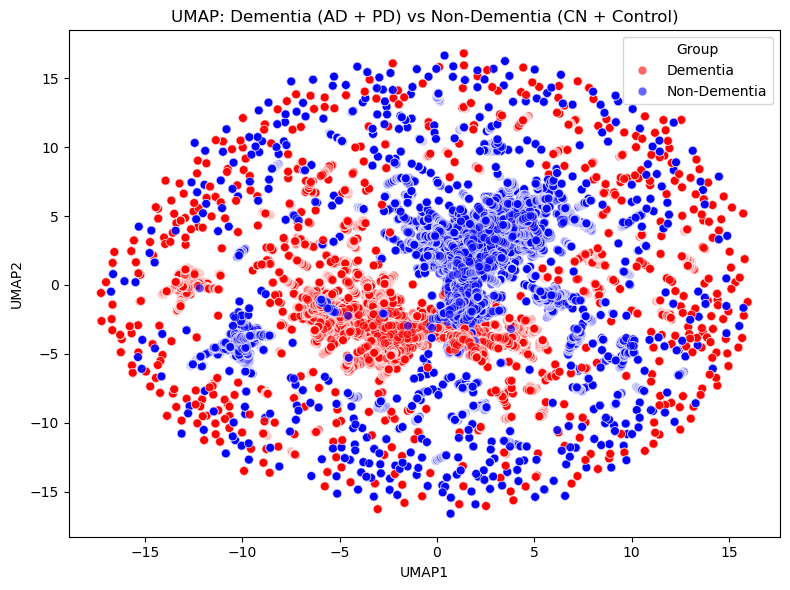

In [1]:
import pandas as pd
import numpy as np
import umap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

# =========================
# 1. Load datasets
# =========================
ad_cn_df = pd.read_csv("AD_vs_CN_features.csv")
pd_ctrl_df = pd.read_csv("PD_vs_Control_features.csv")

# =========================
# 2. Infer subgroup labels
# =========================

# AD vs CN dataset (from filename)
ad_cn_df['subgroup'] = ad_cn_df['filename'].apply(
    lambda x: 'AD' if 'AD' in x else 'CN'
)

# PD vs Control dataset
# Use 'class' column if available, otherwise fallback to filename
pd_ctrl_df['subgroup'] = pd_ctrl_df['class'].map({
    'PD': 'PD',
    'Control': 'Control'
})

# =========================
# 3. Merge datasets
# =========================
all_df = pd.concat([ad_cn_df, pd_ctrl_df], ignore_index=True)

# =========================
# 4. Create binary dementia label (FOR VISUALIZATION)
# =========================
all_df['dementia_group'] = all_df['subgroup'].map({
    'AD': 'Dementia',
    'PD': 'Dementia',
    'CN': 'Non-Dementia',
    'Control': 'Non-Dementia'
})

# Safety check
print(all_df['dementia_group'].value_counts())

# =========================
# 5. Prepare feature matrix
# =========================
# Drop non-feature columns safely
non_feature_cols = ['filename', 'label', 'class', 'subgroup', 'dementia_group']
X = all_df.drop(columns=[c for c in non_feature_cols if c in all_df.columns])

# Handle missing values
X = X.fillna(X.mean())

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# =========================
# 6. Apply UMAP
# =========================
reducer = umap.UMAP(
    n_neighbors=30,
    min_dist=0.1,
    metric='euclidean',
    random_state=42
)

X_umap = reducer.fit_transform(X_scaled)

# =========================
# 7. Plot
# =========================
umap_df = pd.DataFrame({
    'UMAP1': X_umap[:, 0],
    'UMAP2': X_umap[:, 1],
    'Group': all_df['dementia_group']
})

plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=umap_df,
    x='UMAP1',
    y='UMAP2',
    hue='Group',
    palette={'Dementia': 'red', 'Non-Dementia': 'blue'},
    alpha=0.6,
    s=40
)

plt.title("UMAP: Dementia (AD + PD) vs Non-Dementia (CN + Control)")
plt.legend(title="Group")
plt.tight_layout()
plt.show()
